### Generative Adversarial Networks (GAN)

L'objectif de ce TP est de créer et manipuler un Generative Adversarial Networks (GAN) afin de générer des images de chiffres manuscrits à partir d'une base de données d'exemples.

Vous aurez besoin des outils présents dans le fichier gan_tools_cuda.py que vous devrez copier dans votre répertoire Jupyter afin de pouvoir l'importer. Regardez bien les fonctions et classes définies dans ce fichier : il y a les codes permettant de télécharger la base de donnée d'images, de faire les conversions entre images et vecteurs, de générer les vecteurs de bruit à donner en entrée du générateur et de gérer l’affichage des résultats sous forme d'exemples d’images générées par le générateur et des indices de qualité du générateur et du discriminateur. 

###### 1. Importation des librairies et de gan_tools_cuda.py

In [24]:
import torch
from torch import nn, optim
from torch.autograd.variable import Variable

import gan_tools_cuda as gt


###### 2. Chargement des données d'apprentissage et création du "loader" 

Le loader présentera au réseau les données par paquet de 100, dans un ordre aléatoire.

In [17]:
# Load data
data = gt.mnist_data()
# Create loader with data, so that we can iterate over it
data_loader = torch.utils.data.DataLoader(data, batch_size=100, shuffle=True)
# Num batches
num_batches = len(data_loader)


Extracting ./torch_data/VGAN/MNIST/dataset/MNIST/raw/train-images-idx3-ubyte.gz to ./torch_data/VGAN/MNIST/dataset/MNIST/raw



Extracting ./torch_data/VGAN/MNIST/dataset/MNIST/raw/train-labels-idx1-ubyte.gz to ./torch_data/VGAN/MNIST/dataset/MNIST/raw



Extracting ./torch_data/VGAN/MNIST/dataset/MNIST/raw/t10k-images-idx3-ubyte.gz to ./torch_data/VGAN/MNIST/dataset/MNIST/raw



Extracting ./torch_data/VGAN/MNIST/dataset/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./torch_data/VGAN/MNIST/dataset/MNIST/raw
Processing...
Done!


/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:479: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:143.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


###### 3. Création du discriminateur

Créez une classe Python DiscriminatorNet décrivant la structure du réseau discriminateur. 

Le réseau est composé de trois couches cachées et d'une couche de sortie. Nous utiliserons le module "séquentiel" de Pytorch qui décrit l’ordre des différentes transformations à appliquer aux données dans chaque couche.

L'entrée du réseau est un vecteur avec 784 valeurs (une image 28x28), la sortie est une valeur unique, allant de 0 (fausse image) à 1 (vraie image) grâce à l'utilisation d'une fonction sigmoïde.

Les trois couches cachées utilisent une fonction LeakyReLU pour transformer leur sortie en valeurs quasi positives, avec alpha = 0,2. Elles utilisent également une fonction Dropout pour définir aléatoirement à zéro 30% des valeurs de sortie des neurones des couches cachées (il a été prouvé que cela augmentait les performances du réseau en empêchant le sur-apprentissage). Le nombre de neurones dans chaque couche cachée est respectivement de 1024, 512 et 256.

La classe possède une méthode "forward" permettant de calculer la sortie du réseau à partir d'un vecteur d'entrée (représenaant une image).

In [13]:
class DiscriminatorNet(torch.nn.Module):

    def __init__(self):
        super(DiscriminatorNet, self).__init__()
        n_features = 784
        n_out = 1
        
        self.hidden0 = nn.Sequential( 
            nn.Linear(n_features, 1024),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
      

        self.hidden1 = nn.Sequential(
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )

        self.hidden2 = nn.Sequential(
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
            
        self.out = nn.Sequential(
            torch.nn.Linear(256, n_out),
            torch.nn.Sigmoid()
        )

    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x
    
  


###### 4. Création du générateur

Créez une classe Python GeneratorNet décrivant la structure du réseau générateurs. Le réseau est composé de trois couches cachées et d'une couche de sortie. L'entrée du réseau est un vecteur avec 100 valeurs, la sortie est une image avec 784 valeurs (utilisez nn.Tanh() au lieu de nn.Sigmoid() pour convertir les valeurs de sortie). Les trois couches cachées utilisent une fonction LeakyReLU pour transformer leur sortie en valeurs quasi positives, avec alpha = 0,2, mais pas de Dropout ici. Le nombre de neurones dans chaque couche cachée est respectivement de 256, 512 et 1024

- Le générateur suréchantillonne l'entrée en utilisant plusieurs modules nn.ConvTranspose2d séparés par nn.BatchNorm2d et nn.ReLU.
- À la fin de la séquence, le réseau utilise nn.Tanh() pour écraser les sorties à (-1,1).
- Le vecteur aléatoire d'entrée a une taille nznz. La sortie a une taille nc \times 64 \times 64nc×64×64, où ncnc est le nombre de canaux.

In [5]:
class GeneratorNet(torch.nn.Module):
    """
    3 couches cachées generative neural network
    """

    def __init__(self):
        super(GeneratorNet, self).__init__()
        n_features = 100
        n_out = 784

        self.hidden0 = nn.Sequential(
            nn.Linear(n_features, 256),
            nn.LeakyReLU(0.2)
        )

        self.hidden1 = nn.Sequential(
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2)
        )

        self.hidden2 = nn.Sequential(
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2)
        )

        self.out = nn.Sequential(
            nn.Linear(1024, n_out),
            nn.Tanh()
        )

    def forward(self, x):
       
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x


###### 5. Creation du processus d'apprentissage

Initialisez les instances d'un discriminateur et d'un générateurs. Créez deux optimiseurs de type Adam pour les deux réseaux. Définissez la fonction de perte: ici, nous choisissons une fonction d'entropie croisée binaire pour vérifier si le discriminateur trouve la bonne réponse.

In [6]:
discriminator = DiscriminatorNet()
generator = GeneratorNet()
if torch.cuda.is_available():
    discriminator.cuda()
    generator.cuda()
    
# Optimizers
d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0002)
g_optimizer = optim.Adam(generator.parameters(), lr=0.0002)

# Loss function 
loss = nn.BCELoss()


Créez une fonction train_generator et une fonction train_discriminator. 
Expliquez les différentes étapes du processus d'apprentissage.

D'après le cours, si nous remplaçons vᵢ = D(xᵢ) et yᵢ=1 (pour tout i) dans la définition de la perte BCE, nous obtenons la perte liée aux images réelles.  A l'inverse, si on fixe vᵢ = D(G(zᵢ)) et yᵢ=0 pour tout i, on obtient la perte liée aux images fake.

Dans le modèle mathématique d'un GAN , le gradient de celle-ci devait être ascendant, mais PyTorch et la plupart des autres frameworks de Machine Learning minimisent généralement les fonctions à la place.  Puisque la maximisation d'une fonction est équivalente à la minimisation de son négatif, et que le terme BCE-Loss a un signe moins, nous n'avons pas besoin de nous soucier du signe.

De plus, nous pouvons observer que les cibles des images réelles sont toujours des 1, tandis que les cibles des images fausses sont des 0. On utilise les fonctions reel_data_target et fake_data_target définies dans le fichier gan_tools.

En additionnant ces deux pertes du discriminateur, nous obtenons la perte totale du mini-batch pour le discriminateur. 

In [8]:
def train_discriminator(optimizer, real_data, fake_data):
    # Reset gradients
    optimizer.zero_grad()
    
    # 1.1 Train on Real Data
    prediction_real = discriminator(real_data)
    # Calculate error and backpropagate
    error_real = loss(prediction_real, gt.real_data_target(real_data.size(0)))
    error_real.backward()

    # 1.2 Train on Fake Data
    prediction_fake = discriminator(fake_data)
    # Calculate error and backpropagate
    error_fake = loss(prediction_fake, gt.fake_data_target(real_data.size(0)))
    error_fake.backward()
    
    # 1.3 Update weights with gradients
    optimizer.step()
    
    # Return error
    return error_real + error_fake, prediction_real, prediction_fake

Nous calculerons les gradients séparément, puis nous les mettrons à jour ensemble.

Plutôt que de minimiser log(1- D(G(z)), l'entraînement du générateur pour maximiser log D(G(z)) fournira des gradients beaucoup plus forts au début de l'entraînement. Les deux pertes peuvent être échangées de manière interchangeable puisqu'elles entraînent la même dynamique pour le Générateur et le Discriminateur.
La maximisation de log D(G(z)) est équivalente à la minimisation de sa valeur négative et, comme la définition de la perte BCE-Loss comporte un signe moins, il n'est pas nécessaire de tenir compte du signe. De même que pour le Discriminateur, si nous fixons vᵢ = D(G(zᵢ)) et yᵢ=1 ∀ i, nous obtenons la perte souhaitée à minimiser.



In [9]:
def train_generator(optimizer, fake_data):
    # 2. Train Generator
    # Reset gradients
    optimizer.zero_grad()
    # Sample noise and generate fake data
    prediction = discriminator(fake_data)
    # Calculate error and backpropagate
    error = loss(prediction, gt.real_data_target(prediction.size(0)))
    error.backward()
    # Update weights with gradients
    optimizer.step()
    # Return error
    return error

###### 6. Apprentissage et visualisation:

Pour chaque itération et pour chaque lot ("batch") de données, les étapes d'apprentissage sont les suivantes:

 - Transformez le lot de données en variables Torch à l'aide des fonctions Variable et gt.images_to_vectors. Ce sont les vraies données pour l'étape suivante.

 - Créez des vecteurs de bruit de taille 100 avec gt.noise (autant que de vraies images dans le lot), puis générez de fausses données avec le générateur.

 - Former le discriminateur sur les fausses données et les données réelles, en utilisant l'optimiseur défini ci-dessus (d_optimizer).

 - Créez d'autres vecteurs de bruit, taille 100, avec gt.noise.

 - Entrainez le générateur sur les vecteurs de bruit.

 - Visualisez un échantillon d'images générées avec gt.plot_gan. Cette fonction nécessite le numéro d'itération et de lot, ainsi que le nombre total de lots et le nom du générateur.

###### Attention :
Il se peut que le système se "bloque" dans une configuration où la sortie du générateur est la même quelle que soit l'entrée. Si toutes les images des exemples de sortie sont identiques après une dizaine d'itérations et que D(x) = 1 et D(G(z)) = 0, il faut relancer l'apprentissage (redémarrer le noyau).

Epoch: 0, Batch Num: [0/600]


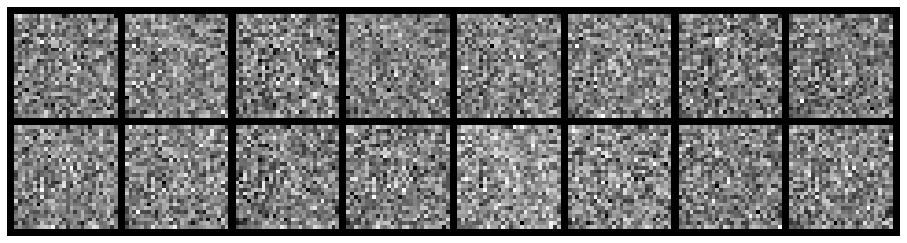

Epoch: [0/20], Batch Num: [0/600]
Discriminator Loss: 1.3757, Generator Loss: 0.6997
D(x): 0.5020, D(G(z)): 0.4965
Epoch: [0/20], Batch Num: [1/600]
Discriminator Loss: 1.2533, Generator Loss: 0.6947
D(x): 0.5697, D(G(z)): 0.4985
Epoch: [0/20], Batch Num: [2/600]
Discriminator Loss: 1.1399, Generator Loss: 0.6885
D(x): 0.6421, D(G(z)): 0.5015
Epoch: [0/20], Batch Num: [3/600]
Discriminator Loss: 1.0170, Generator Loss: 0.6786
D(x): 0.7323, D(G(z)): 0.5057
Epoch: [0/20], Batch Num: [4/600]
Discriminator Loss: 0.9390, Generator Loss: 0.6612
D(x): 0.8037, D(G(z)): 0.5131
Epoch: [0/20], Batch Num: [5/600]
Discriminator Loss: 0.8756, Generator Loss: 0.6338
D(x): 0.8770, D(G(z)): 0.5247
Epoch: [0/20], Batch Num: [6/600]
Discriminator Loss: 0.8576, Generator Loss: 0.5975
D(x): 0.9311, D(G(z)): 0.5442
Epoch: [0/20], Batch Num: [7/600]
Discriminator Loss: 0.8783, Generator Loss: 0.5560
D(x): 0.9677, D(G(z)): 0.5704
Epoch: [0/20], Batch Num: [8/600]
Discriminator Loss: 0.9397, Generator Loss: 0.

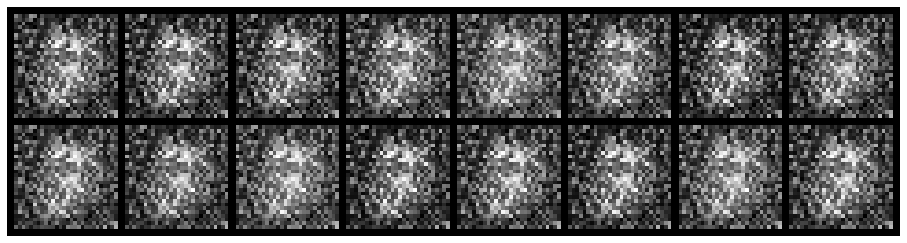

Epoch: [0/20], Batch Num: [100/600]
Discriminator Loss: 2.0057, Generator Loss: 0.7656
D(x): 0.7039, D(G(z)): 0.7589
Epoch: [0/20], Batch Num: [101/600]
Discriminator Loss: 2.0250, Generator Loss: 1.1344
D(x): 0.6194, D(G(z)): 0.6761
Epoch: [0/20], Batch Num: [102/600]
Discriminator Loss: 1.6289, Generator Loss: 1.3661
D(x): 0.5502, D(G(z)): 0.4884
Epoch: [0/20], Batch Num: [103/600]
Discriminator Loss: 1.2518, Generator Loss: 1.5980
D(x): 0.6560, D(G(z)): 0.4149
Epoch: [0/20], Batch Num: [104/600]
Discriminator Loss: 0.7981, Generator Loss: 1.8476
D(x): 0.7662, D(G(z)): 0.3217
Epoch: [0/20], Batch Num: [105/600]
Discriminator Loss: 0.5618, Generator Loss: 2.3718
D(x): 0.8224, D(G(z)): 0.2550
Epoch: [0/20], Batch Num: [106/600]
Discriminator Loss: 0.4530, Generator Loss: 2.7787
D(x): 0.8677, D(G(z)): 0.2268
Epoch: [0/20], Batch Num: [107/600]
Discriminator Loss: 0.3115, Generator Loss: 2.9076
D(x): 0.9033, D(G(z)): 0.1719
Epoch: [0/20], Batch Num: [108/600]
Discriminator Loss: 0.3001, 

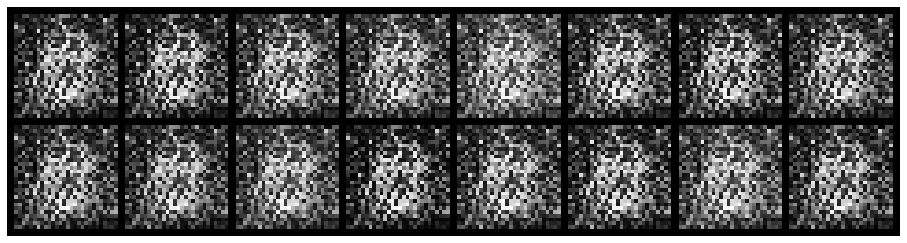

Epoch: [0/20], Batch Num: [200/600]
Discriminator Loss: 0.9086, Generator Loss: 2.0211
D(x): 0.8197, D(G(z)): 0.4333
Epoch: [0/20], Batch Num: [201/600]
Discriminator Loss: 0.9055, Generator Loss: 2.0067
D(x): 0.7908, D(G(z)): 0.4377
Epoch: [0/20], Batch Num: [202/600]
Discriminator Loss: 0.8385, Generator Loss: 2.0879
D(x): 0.8175, D(G(z)): 0.4100
Epoch: [0/20], Batch Num: [203/600]
Discriminator Loss: 0.6694, Generator Loss: 2.6079
D(x): 0.8426, D(G(z)): 0.3517
Epoch: [0/20], Batch Num: [204/600]
Discriminator Loss: 0.5598, Generator Loss: 2.8838
D(x): 0.8498, D(G(z)): 0.2806
Epoch: [0/20], Batch Num: [205/600]
Discriminator Loss: 0.4382, Generator Loss: 3.1786
D(x): 0.8889, D(G(z)): 0.2179
Epoch: [0/20], Batch Num: [206/600]
Discriminator Loss: 0.3378, Generator Loss: 3.6241
D(x): 0.9109, D(G(z)): 0.1870
Epoch: [0/20], Batch Num: [207/600]
Discriminator Loss: 0.2100, Generator Loss: 3.8903
D(x): 0.9392, D(G(z)): 0.1267
Epoch: [0/20], Batch Num: [208/600]
Discriminator Loss: 0.1872, 

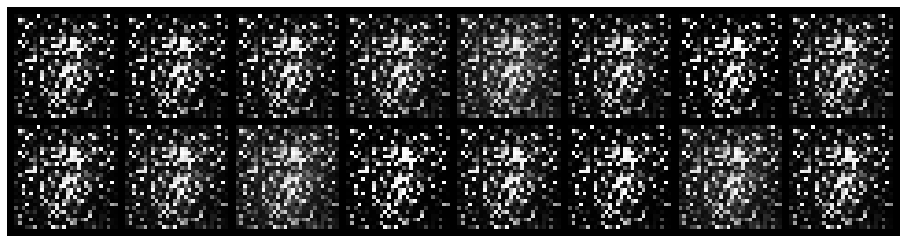

Epoch: [0/20], Batch Num: [300/600]
Discriminator Loss: 0.3378, Generator Loss: 4.4186
D(x): 0.8675, D(G(z)): 0.1273
Epoch: [0/20], Batch Num: [301/600]
Discriminator Loss: 0.4077, Generator Loss: 4.3169
D(x): 0.8571, D(G(z)): 0.1558
Epoch: [0/20], Batch Num: [302/600]
Discriminator Loss: 0.4715, Generator Loss: 4.0077
D(x): 0.8285, D(G(z)): 0.1581
Epoch: [0/20], Batch Num: [303/600]
Discriminator Loss: 0.5292, Generator Loss: 3.6661
D(x): 0.8507, D(G(z)): 0.2064
Epoch: [0/20], Batch Num: [304/600]
Discriminator Loss: 0.5801, Generator Loss: 3.5109
D(x): 0.8343, D(G(z)): 0.2295
Epoch: [0/20], Batch Num: [305/600]
Discriminator Loss: 0.5487, Generator Loss: 4.1193
D(x): 0.8902, D(G(z)): 0.3074
Epoch: [0/20], Batch Num: [306/600]
Discriminator Loss: 0.4946, Generator Loss: 4.4040
D(x): 0.8420, D(G(z)): 0.2181
Epoch: [0/20], Batch Num: [307/600]
Discriminator Loss: 0.5920, Generator Loss: 4.4235
D(x): 0.8268, D(G(z)): 0.2416
Epoch: [0/20], Batch Num: [308/600]
Discriminator Loss: 0.6398, 

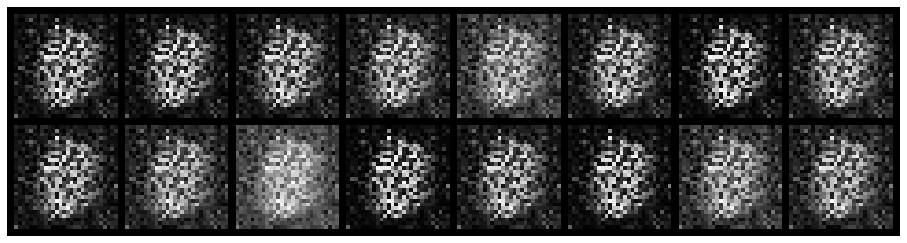

Epoch: [0/20], Batch Num: [400/600]
Discriminator Loss: 0.8637, Generator Loss: 3.8195
D(x): 0.7915, D(G(z)): 0.3371
Epoch: [0/20], Batch Num: [401/600]
Discriminator Loss: 1.1138, Generator Loss: 3.1757
D(x): 0.7231, D(G(z)): 0.3864
Epoch: [0/20], Batch Num: [402/600]
Discriminator Loss: 1.5666, Generator Loss: 2.7434
D(x): 0.7470, D(G(z)): 0.5415
Epoch: [0/20], Batch Num: [403/600]
Discriminator Loss: 1.8187, Generator Loss: 2.6013
D(x): 0.6786, D(G(z)): 0.6137
Epoch: [0/20], Batch Num: [404/600]
Discriminator Loss: 2.5149, Generator Loss: 1.5563
D(x): 0.5964, D(G(z)): 0.7367
Epoch: [0/20], Batch Num: [405/600]
Discriminator Loss: 2.8111, Generator Loss: 0.7896
D(x): 0.5935, D(G(z)): 0.8126
Epoch: [0/20], Batch Num: [406/600]
Discriminator Loss: 2.9330, Generator Loss: 0.5005
D(x): 0.6860, D(G(z)): 0.8784
Epoch: [0/20], Batch Num: [407/600]
Discriminator Loss: 3.0145, Generator Loss: 0.3111
D(x): 0.7703, D(G(z)): 0.9052
Epoch: [0/20], Batch Num: [408/600]
Discriminator Loss: 2.9508, 

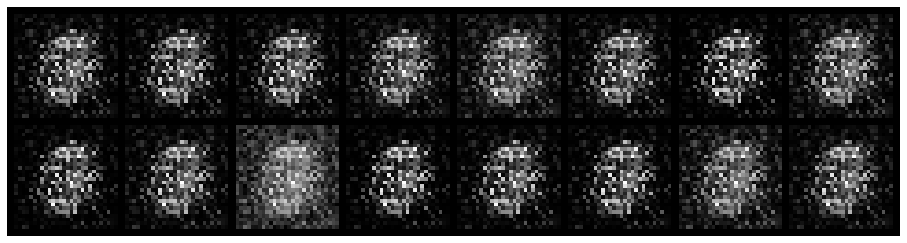

Epoch: [0/20], Batch Num: [500/600]
Discriminator Loss: 1.1486, Generator Loss: 1.1845
D(x): 0.5528, D(G(z)): 0.3996
Epoch: [0/20], Batch Num: [501/600]
Discriminator Loss: 1.0560, Generator Loss: 1.2711
D(x): 0.5840, D(G(z)): 0.3790
Epoch: [0/20], Batch Num: [502/600]
Discriminator Loss: 1.0526, Generator Loss: 1.3692
D(x): 0.5795, D(G(z)): 0.3676
Epoch: [0/20], Batch Num: [503/600]
Discriminator Loss: 1.0229, Generator Loss: 1.4933
D(x): 0.5674, D(G(z)): 0.3344
Epoch: [0/20], Batch Num: [504/600]
Discriminator Loss: 0.9839, Generator Loss: 1.5374
D(x): 0.5705, D(G(z)): 0.3162
Epoch: [0/20], Batch Num: [505/600]
Discriminator Loss: 1.0121, Generator Loss: 1.6814
D(x): 0.5647, D(G(z)): 0.3146
Epoch: [0/20], Batch Num: [506/600]
Discriminator Loss: 0.9718, Generator Loss: 1.6185
D(x): 0.5732, D(G(z)): 0.2973
Epoch: [0/20], Batch Num: [507/600]
Discriminator Loss: 0.8523, Generator Loss: 1.7571
D(x): 0.6166, D(G(z)): 0.2725
Epoch: [0/20], Batch Num: [508/600]
Discriminator Loss: 0.8095, 

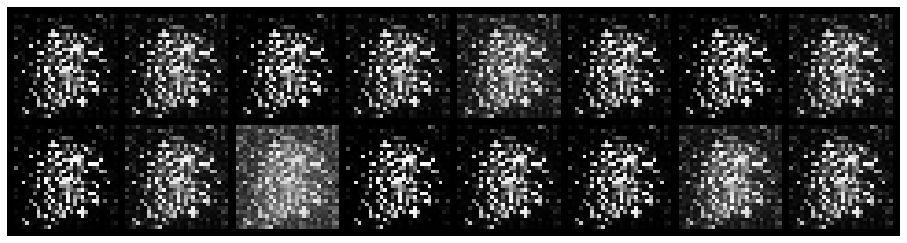

Epoch: [1/20], Batch Num: [0/600]
Discriminator Loss: 0.2440, Generator Loss: 5.3547
D(x): 0.9780, D(G(z)): 0.1700
Epoch: [1/20], Batch Num: [1/600]
Discriminator Loss: 0.2805, Generator Loss: 6.0067
D(x): 0.9577, D(G(z)): 0.1718
Epoch: [1/20], Batch Num: [2/600]
Discriminator Loss: 0.2998, Generator Loss: 5.9869
D(x): 0.9411, D(G(z)): 0.1764
Epoch: [1/20], Batch Num: [3/600]
Discriminator Loss: 0.2472, Generator Loss: 6.2311
D(x): 0.9187, D(G(z)): 0.1165
Epoch: [1/20], Batch Num: [4/600]
Discriminator Loss: 0.3954, Generator Loss: 5.6887
D(x): 0.8293, D(G(z)): 0.0892
Epoch: [1/20], Batch Num: [5/600]
Discriminator Loss: 0.4845, Generator Loss: 5.6694
D(x): 0.8141, D(G(z)): 0.1390
Epoch: [1/20], Batch Num: [6/600]
Discriminator Loss: 0.4590, Generator Loss: 4.6255
D(x): 0.8266, D(G(z)): 0.1601
Epoch: [1/20], Batch Num: [7/600]
Discriminator Loss: 0.6753, Generator Loss: 3.8724
D(x): 0.7977, D(G(z)): 0.2463
Epoch: [1/20], Batch Num: [8/600]
Discriminator Loss: 0.7337, Generator Loss: 3.

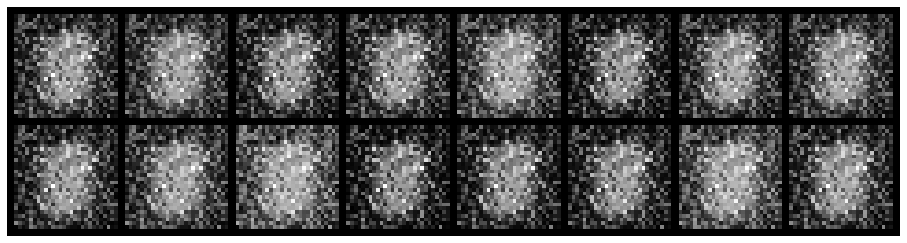

Epoch: [1/20], Batch Num: [100/600]
Discriminator Loss: 2.0245, Generator Loss: 0.5976
D(x): 0.6104, D(G(z)): 0.7205
Epoch: [1/20], Batch Num: [101/600]
Discriminator Loss: 2.0362, Generator Loss: 0.5873
D(x): 0.6118, D(G(z)): 0.7375
Epoch: [1/20], Batch Num: [102/600]
Discriminator Loss: 2.0667, Generator Loss: 0.5805
D(x): 0.6083, D(G(z)): 0.7209
Epoch: [1/20], Batch Num: [103/600]
Discriminator Loss: 1.7915, Generator Loss: 0.5704
D(x): 0.7168, D(G(z)): 0.7262
Epoch: [1/20], Batch Num: [104/600]
Discriminator Loss: 1.8837, Generator Loss: 0.6831
D(x): 0.6597, D(G(z)): 0.7104
Epoch: [1/20], Batch Num: [105/600]
Discriminator Loss: 1.7493, Generator Loss: 0.6629
D(x): 0.6986, D(G(z)): 0.6991
Epoch: [1/20], Batch Num: [106/600]
Discriminator Loss: 1.7695, Generator Loss: 0.7572
D(x): 0.6626, D(G(z)): 0.6658
Epoch: [1/20], Batch Num: [107/600]
Discriminator Loss: 1.6814, Generator Loss: 0.9166
D(x): 0.6398, D(G(z)): 0.6263
Epoch: [1/20], Batch Num: [108/600]
Discriminator Loss: 1.4949, 

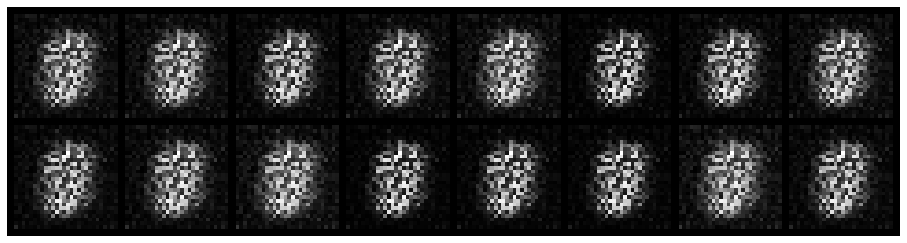

Epoch: [1/20], Batch Num: [200/600]
Discriminator Loss: 0.9038, Generator Loss: 2.1094
D(x): 0.7586, D(G(z)): 0.3472
Epoch: [1/20], Batch Num: [201/600]
Discriminator Loss: 0.7788, Generator Loss: 2.1873
D(x): 0.7591, D(G(z)): 0.3081
Epoch: [1/20], Batch Num: [202/600]
Discriminator Loss: 0.7284, Generator Loss: 2.3894
D(x): 0.7721, D(G(z)): 0.2817
Epoch: [1/20], Batch Num: [203/600]
Discriminator Loss: 0.7022, Generator Loss: 2.7067
D(x): 0.7747, D(G(z)): 0.2526
Epoch: [1/20], Batch Num: [204/600]
Discriminator Loss: 0.6716, Generator Loss: 2.5858
D(x): 0.7594, D(G(z)): 0.2501
Epoch: [1/20], Batch Num: [205/600]
Discriminator Loss: 0.6784, Generator Loss: 2.5104
D(x): 0.7460, D(G(z)): 0.2193
Epoch: [1/20], Batch Num: [206/600]
Discriminator Loss: 0.6629, Generator Loss: 2.4898
D(x): 0.7864, D(G(z)): 0.2551
Epoch: [1/20], Batch Num: [207/600]
Discriminator Loss: 0.4907, Generator Loss: 2.5240
D(x): 0.8522, D(G(z)): 0.2358
Epoch: [1/20], Batch Num: [208/600]
Discriminator Loss: 0.5672, 

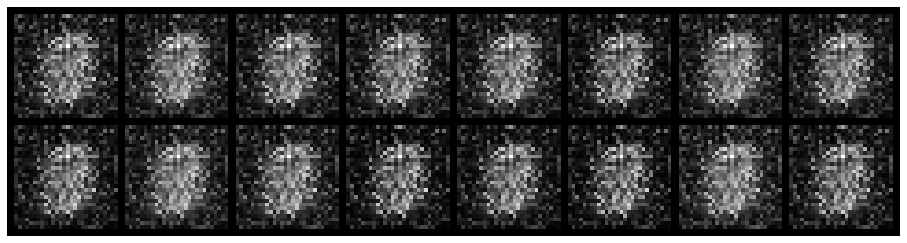

Epoch: [1/20], Batch Num: [300/600]
Discriminator Loss: 1.6676, Generator Loss: 4.9633
D(x): 0.5705, D(G(z)): 0.3676
Epoch: [1/20], Batch Num: [301/600]
Discriminator Loss: 1.7584, Generator Loss: 3.4557
D(x): 0.5805, D(G(z)): 0.4028
Epoch: [1/20], Batch Num: [302/600]
Discriminator Loss: 1.4705, Generator Loss: 3.8597
D(x): 0.7296, D(G(z)): 0.4577
Epoch: [1/20], Batch Num: [303/600]
Discriminator Loss: 1.8006, Generator Loss: 4.2917
D(x): 0.7088, D(G(z)): 0.5720
Epoch: [1/20], Batch Num: [304/600]
Discriminator Loss: 1.3667, Generator Loss: 4.6967
D(x): 0.7488, D(G(z)): 0.4546
Epoch: [1/20], Batch Num: [305/600]
Discriminator Loss: 1.5296, Generator Loss: 5.2579
D(x): 0.6347, D(G(z)): 0.3259
Epoch: [1/20], Batch Num: [306/600]
Discriminator Loss: 1.7292, Generator Loss: 3.8928
D(x): 0.5008, D(G(z)): 0.2267
Epoch: [1/20], Batch Num: [307/600]
Discriminator Loss: 1.3779, Generator Loss: 3.2693
D(x): 0.6928, D(G(z)): 0.4184
Epoch: [1/20], Batch Num: [308/600]
Discriminator Loss: 1.8731, 

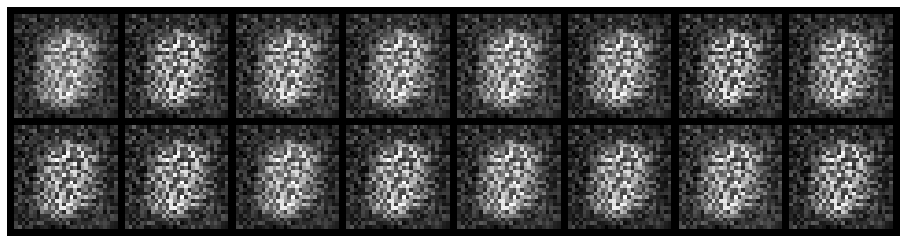

Epoch: [1/20], Batch Num: [400/600]
Discriminator Loss: 1.0677, Generator Loss: 1.7115
D(x): 0.7602, D(G(z)): 0.4906
Epoch: [1/20], Batch Num: [401/600]
Discriminator Loss: 1.2620, Generator Loss: 1.7033
D(x): 0.7224, D(G(z)): 0.4991
Epoch: [1/20], Batch Num: [402/600]
Discriminator Loss: 1.0641, Generator Loss: 1.6412
D(x): 0.7874, D(G(z)): 0.5078
Epoch: [1/20], Batch Num: [403/600]
Discriminator Loss: 1.0644, Generator Loss: 1.8727
D(x): 0.7624, D(G(z)): 0.4878
Epoch: [1/20], Batch Num: [404/600]
Discriminator Loss: 1.0221, Generator Loss: 1.9554
D(x): 0.7732, D(G(z)): 0.4763
Epoch: [1/20], Batch Num: [405/600]
Discriminator Loss: 0.9621, Generator Loss: 2.0803
D(x): 0.7564, D(G(z)): 0.4309
Epoch: [1/20], Batch Num: [406/600]
Discriminator Loss: 1.0160, Generator Loss: 2.4440
D(x): 0.7701, D(G(z)): 0.4705
Epoch: [1/20], Batch Num: [407/600]
Discriminator Loss: 0.9189, Generator Loss: 2.6161
D(x): 0.7080, D(G(z)): 0.3241
Epoch: [1/20], Batch Num: [408/600]
Discriminator Loss: 0.8820, 

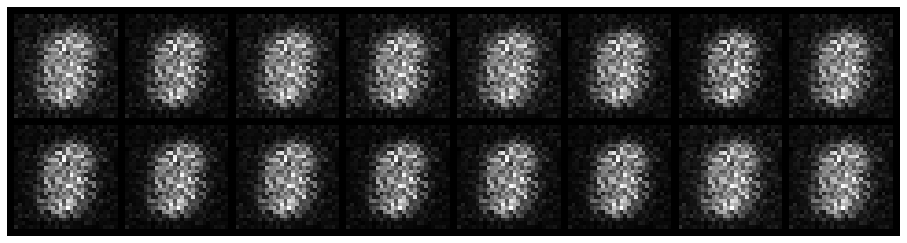

Epoch: [1/20], Batch Num: [500/600]
Discriminator Loss: 1.0737, Generator Loss: 1.3525
D(x): 0.5968, D(G(z)): 0.3256
Epoch: [1/20], Batch Num: [501/600]
Discriminator Loss: 0.8757, Generator Loss: 1.2705
D(x): 0.7538, D(G(z)): 0.3917
Epoch: [1/20], Batch Num: [502/600]
Discriminator Loss: 0.9055, Generator Loss: 1.2476
D(x): 0.7407, D(G(z)): 0.3872
Epoch: [1/20], Batch Num: [503/600]
Discriminator Loss: 0.8020, Generator Loss: 1.2401
D(x): 0.7764, D(G(z)): 0.3817
Epoch: [1/20], Batch Num: [504/600]
Discriminator Loss: 0.8513, Generator Loss: 1.4685
D(x): 0.7427, D(G(z)): 0.3576
Epoch: [1/20], Batch Num: [505/600]
Discriminator Loss: 0.6886, Generator Loss: 1.6290
D(x): 0.7850, D(G(z)): 0.3169
Epoch: [1/20], Batch Num: [506/600]
Discriminator Loss: 0.7186, Generator Loss: 1.6723
D(x): 0.7327, D(G(z)): 0.2724
Epoch: [1/20], Batch Num: [507/600]
Discriminator Loss: 0.7083, Generator Loss: 1.9497
D(x): 0.7429, D(G(z)): 0.2983
Epoch: [1/20], Batch Num: [508/600]
Discriminator Loss: 0.7000, 

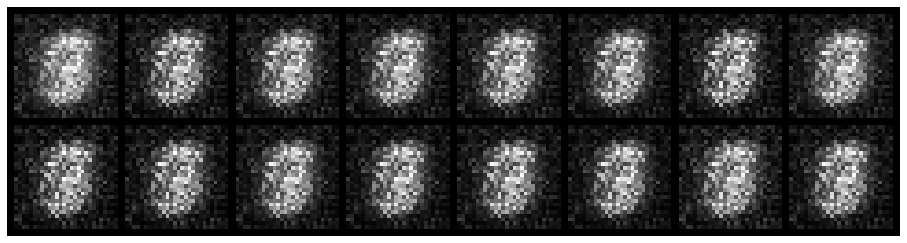

Epoch: [2/20], Batch Num: [0/600]
Discriminator Loss: 0.5326, Generator Loss: 3.5064
D(x): 0.8527, D(G(z)): 0.2352
Epoch: [2/20], Batch Num: [1/600]
Discriminator Loss: 0.4195, Generator Loss: 4.2679
D(x): 0.8619, D(G(z)): 0.1631
Epoch: [2/20], Batch Num: [2/600]
Discriminator Loss: 0.3451, Generator Loss: 4.3464
D(x): 0.8623, D(G(z)): 0.1251
Epoch: [2/20], Batch Num: [3/600]
Discriminator Loss: 0.3478, Generator Loss: 4.1882
D(x): 0.8470, D(G(z)): 0.1093
Epoch: [2/20], Batch Num: [4/600]
Discriminator Loss: 0.4371, Generator Loss: 4.3283
D(x): 0.8091, D(G(z)): 0.1093
Epoch: [2/20], Batch Num: [5/600]
Discriminator Loss: 0.4540, Generator Loss: 3.7972
D(x): 0.8421, D(G(z)): 0.1433
Epoch: [2/20], Batch Num: [6/600]
Discriminator Loss: 0.5518, Generator Loss: 3.3194
D(x): 0.8627, D(G(z)): 0.2256
Epoch: [2/20], Batch Num: [7/600]
Discriminator Loss: 0.4841, Generator Loss: 3.9664
D(x): 0.8695, D(G(z)): 0.1868
Epoch: [2/20], Batch Num: [8/600]
Discriminator Loss: 0.4873, Generator Loss: 3.

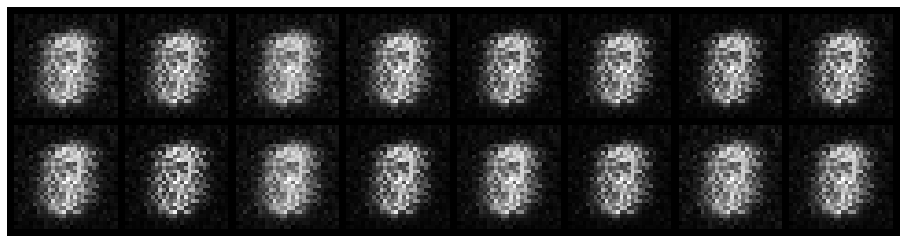

Epoch: [2/20], Batch Num: [100/600]
Discriminator Loss: 1.1596, Generator Loss: 1.6338
D(x): 0.5914, D(G(z)): 0.3578
Epoch: [2/20], Batch Num: [101/600]
Discriminator Loss: 1.1299, Generator Loss: 1.5753
D(x): 0.6411, D(G(z)): 0.3990
Epoch: [2/20], Batch Num: [102/600]
Discriminator Loss: 1.2569, Generator Loss: 1.6689
D(x): 0.6680, D(G(z)): 0.4576
Epoch: [2/20], Batch Num: [103/600]
Discriminator Loss: 1.2973, Generator Loss: 1.6585
D(x): 0.6086, D(G(z)): 0.4495
Epoch: [2/20], Batch Num: [104/600]
Discriminator Loss: 1.2633, Generator Loss: 1.5719
D(x): 0.5810, D(G(z)): 0.3941
Epoch: [2/20], Batch Num: [105/600]
Discriminator Loss: 1.4159, Generator Loss: 1.4184
D(x): 0.5291, D(G(z)): 0.4014
Epoch: [2/20], Batch Num: [106/600]
Discriminator Loss: 1.4213, Generator Loss: 1.4331
D(x): 0.5488, D(G(z)): 0.4313
Epoch: [2/20], Batch Num: [107/600]
Discriminator Loss: 1.4790, Generator Loss: 1.3004
D(x): 0.6097, D(G(z)): 0.4812
Epoch: [2/20], Batch Num: [108/600]
Discriminator Loss: 1.3824, 

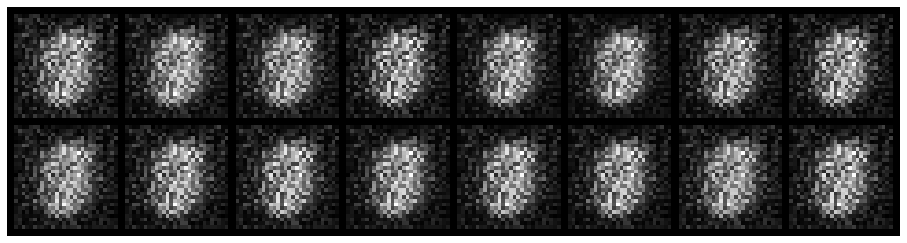

Epoch: [2/20], Batch Num: [200/600]
Discriminator Loss: 1.4261, Generator Loss: 0.9632
D(x): 0.5930, D(G(z)): 0.4967
Epoch: [2/20], Batch Num: [201/600]
Discriminator Loss: 1.2394, Generator Loss: 1.0489
D(x): 0.6301, D(G(z)): 0.4753
Epoch: [2/20], Batch Num: [202/600]
Discriminator Loss: 1.1750, Generator Loss: 1.1082
D(x): 0.6525, D(G(z)): 0.4550
Epoch: [2/20], Batch Num: [203/600]
Discriminator Loss: 1.1290, Generator Loss: 1.1444
D(x): 0.6792, D(G(z)): 0.4717
Epoch: [2/20], Batch Num: [204/600]
Discriminator Loss: 0.9256, Generator Loss: 1.4243
D(x): 0.7180, D(G(z)): 0.3962
Epoch: [2/20], Batch Num: [205/600]
Discriminator Loss: 0.9139, Generator Loss: 1.4302
D(x): 0.6912, D(G(z)): 0.3746
Epoch: [2/20], Batch Num: [206/600]
Discriminator Loss: 0.7973, Generator Loss: 1.7956
D(x): 0.7075, D(G(z)): 0.3109
Epoch: [2/20], Batch Num: [207/600]
Discriminator Loss: 0.7089, Generator Loss: 2.0060
D(x): 0.6889, D(G(z)): 0.2437
Epoch: [2/20], Batch Num: [208/600]
Discriminator Loss: 0.5989, 

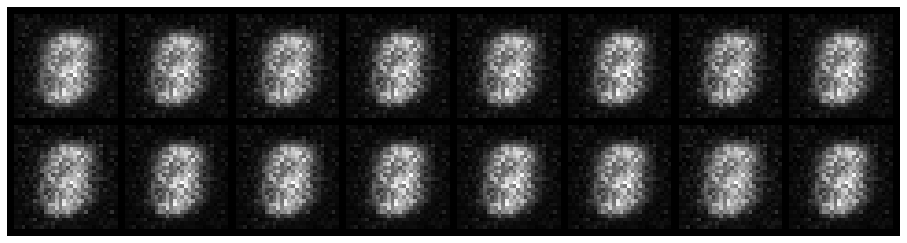

Epoch: [2/20], Batch Num: [300/600]
Discriminator Loss: 0.6291, Generator Loss: 1.7361
D(x): 0.7398, D(G(z)): 0.2309
Epoch: [2/20], Batch Num: [301/600]
Discriminator Loss: 0.6346, Generator Loss: 1.7763
D(x): 0.7597, D(G(z)): 0.2516
Epoch: [2/20], Batch Num: [302/600]
Discriminator Loss: 0.6542, Generator Loss: 1.7841
D(x): 0.7587, D(G(z)): 0.2619
Epoch: [2/20], Batch Num: [303/600]
Discriminator Loss: 0.7111, Generator Loss: 1.6555
D(x): 0.7541, D(G(z)): 0.2781
Epoch: [2/20], Batch Num: [304/600]
Discriminator Loss: 0.8046, Generator Loss: 1.8072
D(x): 0.7106, D(G(z)): 0.3008
Epoch: [2/20], Batch Num: [305/600]
Discriminator Loss: 0.8128, Generator Loss: 1.8384
D(x): 0.7073, D(G(z)): 0.3184
Epoch: [2/20], Batch Num: [306/600]
Discriminator Loss: 0.8071, Generator Loss: 1.8892
D(x): 0.6885, D(G(z)): 0.2835
Epoch: [2/20], Batch Num: [307/600]
Discriminator Loss: 1.0246, Generator Loss: 1.6783
D(x): 0.6188, D(G(z)): 0.2862
Epoch: [2/20], Batch Num: [308/600]
Discriminator Loss: 0.8756, 

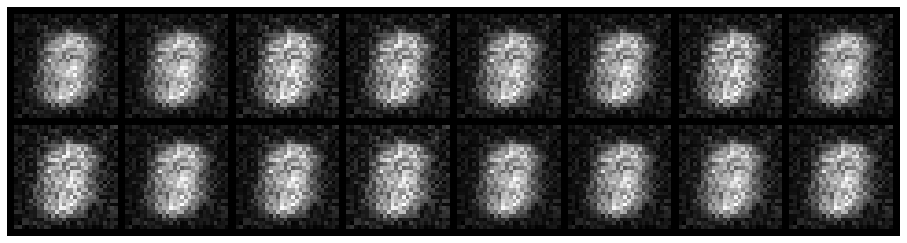

Epoch: [2/20], Batch Num: [400/600]
Discriminator Loss: 1.1870, Generator Loss: 1.0130
D(x): 0.7014, D(G(z)): 0.4730
Epoch: [2/20], Batch Num: [401/600]
Discriminator Loss: 1.0862, Generator Loss: 1.0395
D(x): 0.7126, D(G(z)): 0.4604
Epoch: [2/20], Batch Num: [402/600]
Discriminator Loss: 1.0733, Generator Loss: 1.0099
D(x): 0.6953, D(G(z)): 0.4273
Epoch: [2/20], Batch Num: [403/600]
Discriminator Loss: 1.1475, Generator Loss: 0.9640
D(x): 0.6432, D(G(z)): 0.4067
Epoch: [2/20], Batch Num: [404/600]
Discriminator Loss: 1.1758, Generator Loss: 0.9123
D(x): 0.6790, D(G(z)): 0.4564
Epoch: [2/20], Batch Num: [405/600]
Discriminator Loss: 1.0537, Generator Loss: 0.9130
D(x): 0.7410, D(G(z)): 0.4612
Epoch: [2/20], Batch Num: [406/600]
Discriminator Loss: 1.0562, Generator Loss: 0.8211
D(x): 0.7782, D(G(z)): 0.4989
Epoch: [2/20], Batch Num: [407/600]
Discriminator Loss: 1.0561, Generator Loss: 0.8825
D(x): 0.7747, D(G(z)): 0.5035
Epoch: [2/20], Batch Num: [408/600]
Discriminator Loss: 0.9464, 

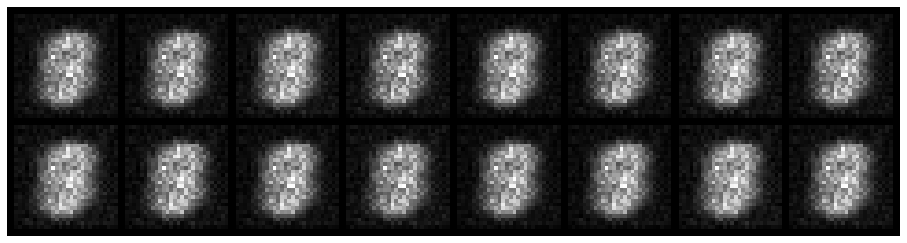

Epoch: [2/20], Batch Num: [500/600]
Discriminator Loss: 1.5758, Generator Loss: 1.1615
D(x): 0.7716, D(G(z)): 0.5983
Epoch: [2/20], Batch Num: [501/600]
Discriminator Loss: 1.2731, Generator Loss: 1.5648
D(x): 0.7611, D(G(z)): 0.5029
Epoch: [2/20], Batch Num: [502/600]
Discriminator Loss: 1.3638, Generator Loss: 1.4750
D(x): 0.5938, D(G(z)): 0.3862
Epoch: [2/20], Batch Num: [503/600]
Discriminator Loss: 1.2590, Generator Loss: 1.4242
D(x): 0.5987, D(G(z)): 0.3291
Epoch: [2/20], Batch Num: [504/600]
Discriminator Loss: 1.3726, Generator Loss: 0.9464
D(x): 0.6124, D(G(z)): 0.4109
Epoch: [2/20], Batch Num: [505/600]
Discriminator Loss: 1.3263, Generator Loss: 0.8463
D(x): 0.7730, D(G(z)): 0.4999
Epoch: [2/20], Batch Num: [506/600]
Discriminator Loss: 1.2707, Generator Loss: 0.9819
D(x): 0.8287, D(G(z)): 0.5270
Epoch: [2/20], Batch Num: [507/600]
Discriminator Loss: 1.1285, Generator Loss: 1.3307
D(x): 0.7647, D(G(z)): 0.4519
Epoch: [2/20], Batch Num: [508/600]
Discriminator Loss: 1.2323, 

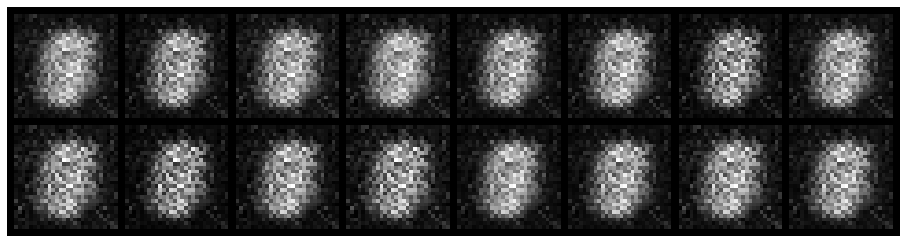

Epoch: [3/20], Batch Num: [0/600]
Discriminator Loss: 1.1294, Generator Loss: 0.8685
D(x): 0.5903, D(G(z)): 0.4428
Epoch: [3/20], Batch Num: [1/600]
Discriminator Loss: 1.0655, Generator Loss: 0.9874
D(x): 0.5989, D(G(z)): 0.4139
Epoch: [3/20], Batch Num: [2/600]
Discriminator Loss: 1.0341, Generator Loss: 1.0876
D(x): 0.5986, D(G(z)): 0.3947
Epoch: [3/20], Batch Num: [3/600]
Discriminator Loss: 0.9795, Generator Loss: 1.1210
D(x): 0.6077, D(G(z)): 0.3696
Epoch: [3/20], Batch Num: [4/600]
Discriminator Loss: 0.9447, Generator Loss: 1.2584
D(x): 0.5993, D(G(z)): 0.3381
Epoch: [3/20], Batch Num: [5/600]
Discriminator Loss: 0.8746, Generator Loss: 1.3311
D(x): 0.6238, D(G(z)): 0.3177
Epoch: [3/20], Batch Num: [6/600]
Discriminator Loss: 0.8733, Generator Loss: 1.5905
D(x): 0.6060, D(G(z)): 0.2951
Epoch: [3/20], Batch Num: [7/600]
Discriminator Loss: 0.7741, Generator Loss: 1.6693
D(x): 0.6261, D(G(z)): 0.2502
Epoch: [3/20], Batch Num: [8/600]
Discriminator Loss: 0.7679, Generator Loss: 1.

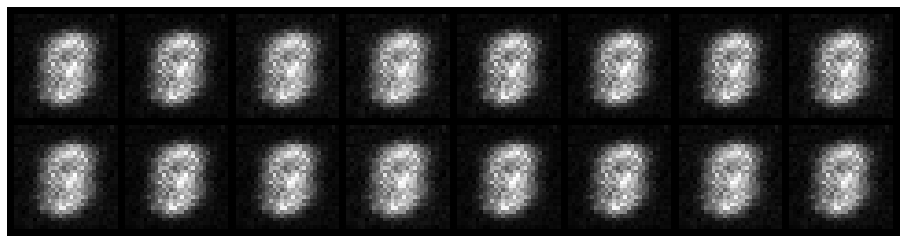

Epoch: [3/20], Batch Num: [100/600]
Discriminator Loss: 1.1400, Generator Loss: 0.8804
D(x): 0.6210, D(G(z)): 0.4492
Epoch: [3/20], Batch Num: [101/600]
Discriminator Loss: 1.2250, Generator Loss: 0.8623
D(x): 0.5832, D(G(z)): 0.4471
Epoch: [3/20], Batch Num: [102/600]
Discriminator Loss: 1.1010, Generator Loss: 0.8727
D(x): 0.6369, D(G(z)): 0.4403
Epoch: [3/20], Batch Num: [103/600]
Discriminator Loss: 1.1231, Generator Loss: 0.9387
D(x): 0.6284, D(G(z)): 0.4432
Epoch: [3/20], Batch Num: [104/600]
Discriminator Loss: 1.1692, Generator Loss: 0.8798
D(x): 0.6039, D(G(z)): 0.4401
Epoch: [3/20], Batch Num: [105/600]
Discriminator Loss: 1.1362, Generator Loss: 0.9332
D(x): 0.6048, D(G(z)): 0.4306
Epoch: [3/20], Batch Num: [106/600]
Discriminator Loss: 1.1469, Generator Loss: 0.8596
D(x): 0.6200, D(G(z)): 0.4489
Epoch: [3/20], Batch Num: [107/600]
Discriminator Loss: 1.1521, Generator Loss: 0.9016
D(x): 0.6201, D(G(z)): 0.4440
Epoch: [3/20], Batch Num: [108/600]
Discriminator Loss: 1.1872, 

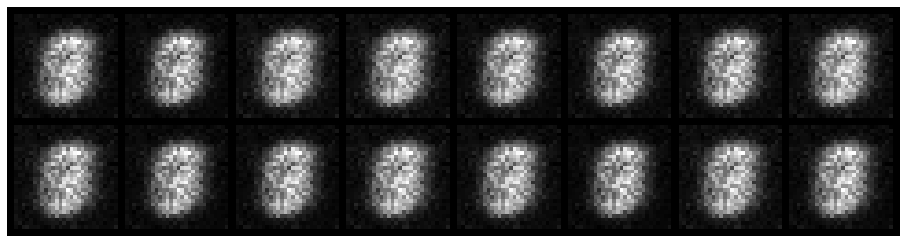

Epoch: [3/20], Batch Num: [200/600]
Discriminator Loss: 1.0064, Generator Loss: 1.1971
D(x): 0.6132, D(G(z)): 0.3614
Epoch: [3/20], Batch Num: [201/600]
Discriminator Loss: 0.9805, Generator Loss: 1.1977
D(x): 0.5983, D(G(z)): 0.3261
Epoch: [3/20], Batch Num: [202/600]
Discriminator Loss: 0.9730, Generator Loss: 1.2646
D(x): 0.5984, D(G(z)): 0.3239
Epoch: [3/20], Batch Num: [203/600]
Discriminator Loss: 0.9294, Generator Loss: 1.3167
D(x): 0.6205, D(G(z)): 0.3210
Epoch: [3/20], Batch Num: [204/600]
Discriminator Loss: 0.8712, Generator Loss: 1.4044
D(x): 0.6640, D(G(z)): 0.3311
Epoch: [3/20], Batch Num: [205/600]
Discriminator Loss: 0.8060, Generator Loss: 1.3671
D(x): 0.6747, D(G(z)): 0.3028
Epoch: [3/20], Batch Num: [206/600]
Discriminator Loss: 0.7815, Generator Loss: 1.4358
D(x): 0.6936, D(G(z)): 0.2946
Epoch: [3/20], Batch Num: [207/600]
Discriminator Loss: 0.8357, Generator Loss: 1.4066
D(x): 0.6607, D(G(z)): 0.3046
Epoch: [3/20], Batch Num: [208/600]
Discriminator Loss: 0.7718, 

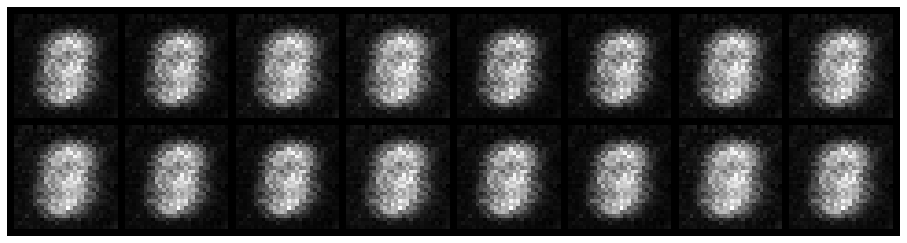

Epoch: [3/20], Batch Num: [300/600]
Discriminator Loss: 0.9302, Generator Loss: 1.5201
D(x): 0.7411, D(G(z)): 0.3525
Epoch: [3/20], Batch Num: [301/600]
Discriminator Loss: 0.9451, Generator Loss: 1.5589
D(x): 0.7323, D(G(z)): 0.3256
Epoch: [3/20], Batch Num: [302/600]
Discriminator Loss: 0.9975, Generator Loss: 1.3921
D(x): 0.7032, D(G(z)): 0.3412
Epoch: [3/20], Batch Num: [303/600]
Discriminator Loss: 1.0231, Generator Loss: 1.2806
D(x): 0.7462, D(G(z)): 0.3999
Epoch: [3/20], Batch Num: [304/600]
Discriminator Loss: 1.0938, Generator Loss: 1.0814
D(x): 0.7060, D(G(z)): 0.4007
Epoch: [3/20], Batch Num: [305/600]
Discriminator Loss: 1.0892, Generator Loss: 1.1863
D(x): 0.7380, D(G(z)): 0.4165
Epoch: [3/20], Batch Num: [306/600]
Discriminator Loss: 0.9947, Generator Loss: 1.2766
D(x): 0.7440, D(G(z)): 0.4172
Epoch: [3/20], Batch Num: [307/600]
Discriminator Loss: 1.0212, Generator Loss: 1.3019
D(x): 0.7277, D(G(z)): 0.3963
Epoch: [3/20], Batch Num: [308/600]
Discriminator Loss: 1.0288, 

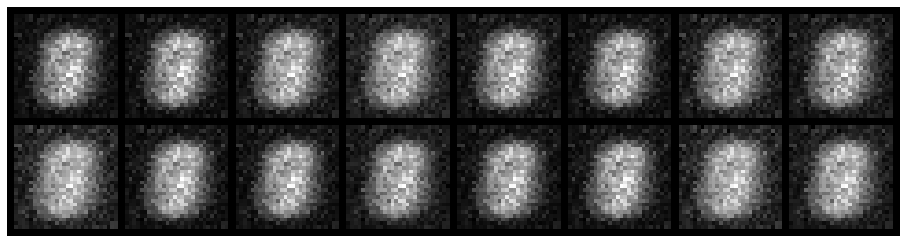

Epoch: [3/20], Batch Num: [400/600]
Discriminator Loss: 0.1608, Generator Loss: 3.2403
D(x): 0.9411, D(G(z)): 0.0800
Epoch: [3/20], Batch Num: [401/600]
Discriminator Loss: 0.1818, Generator Loss: 2.9349
D(x): 0.9337, D(G(z)): 0.0874
Epoch: [3/20], Batch Num: [402/600]
Discriminator Loss: 0.1967, Generator Loss: 3.1465
D(x): 0.9213, D(G(z)): 0.0872
Epoch: [3/20], Batch Num: [403/600]
Discriminator Loss: 0.1768, Generator Loss: 2.8488
D(x): 0.9355, D(G(z)): 0.0971
Epoch: [3/20], Batch Num: [404/600]
Discriminator Loss: 0.2494, Generator Loss: 2.8692
D(x): 0.9266, D(G(z)): 0.1275
Epoch: [3/20], Batch Num: [405/600]
Discriminator Loss: 0.2601, Generator Loss: 2.6095
D(x): 0.9079, D(G(z)): 0.1329
Epoch: [3/20], Batch Num: [406/600]
Discriminator Loss: 0.2512, Generator Loss: 2.5498
D(x): 0.9131, D(G(z)): 0.1310
Epoch: [3/20], Batch Num: [407/600]
Discriminator Loss: 0.3031, Generator Loss: 2.3644
D(x): 0.8867, D(G(z)): 0.1374
Epoch: [3/20], Batch Num: [408/600]
Discriminator Loss: 0.3529, 

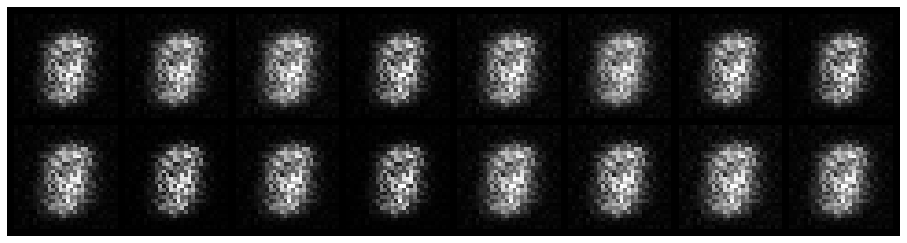

Epoch: [3/20], Batch Num: [500/600]
Discriminator Loss: 1.6079, Generator Loss: 0.8807
D(x): 0.6508, D(G(z)): 0.5389
Epoch: [3/20], Batch Num: [501/600]
Discriminator Loss: 1.3683, Generator Loss: 1.0046
D(x): 0.6661, D(G(z)): 0.4877
Epoch: [3/20], Batch Num: [502/600]
Discriminator Loss: 1.1391, Generator Loss: 1.3360
D(x): 0.6704, D(G(z)): 0.4046
Epoch: [3/20], Batch Num: [503/600]
Discriminator Loss: 1.0845, Generator Loss: 1.4771
D(x): 0.6606, D(G(z)): 0.3330
Epoch: [3/20], Batch Num: [504/600]
Discriminator Loss: 0.9799, Generator Loss: 1.7270
D(x): 0.6268, D(G(z)): 0.2447
Epoch: [3/20], Batch Num: [505/600]
Discriminator Loss: 0.8007, Generator Loss: 1.7561
D(x): 0.6847, D(G(z)): 0.2326
Epoch: [3/20], Batch Num: [506/600]
Discriminator Loss: 0.6766, Generator Loss: 1.9916
D(x): 0.7267, D(G(z)): 0.2085
Epoch: [3/20], Batch Num: [507/600]
Discriminator Loss: 0.6079, Generator Loss: 2.0023
D(x): 0.7397, D(G(z)): 0.1714
Epoch: [3/20], Batch Num: [508/600]
Discriminator Loss: 0.5200, 

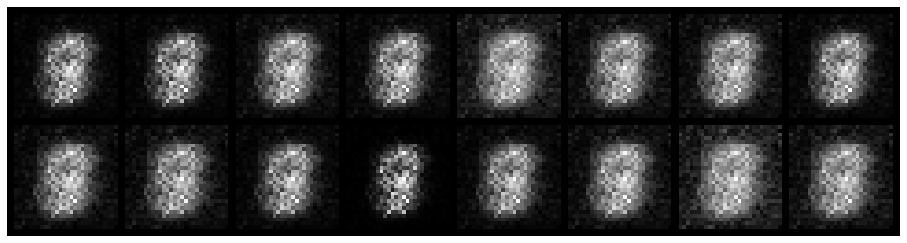

Epoch: [4/20], Batch Num: [0/600]
Discriminator Loss: 0.4060, Generator Loss: 2.5524
D(x): 0.8747, D(G(z)): 0.1370
Epoch: [4/20], Batch Num: [1/600]
Discriminator Loss: 0.4005, Generator Loss: 2.8931
D(x): 0.8957, D(G(z)): 0.1601
Epoch: [4/20], Batch Num: [2/600]
Discriminator Loss: 0.3188, Generator Loss: 2.8174
D(x): 0.9344, D(G(z)): 0.1717
Epoch: [4/20], Batch Num: [3/600]
Discriminator Loss: 0.3292, Generator Loss: 2.8893
D(x): 0.9049, D(G(z)): 0.1620
Epoch: [4/20], Batch Num: [4/600]
Discriminator Loss: 0.4939, Generator Loss: 2.9301
D(x): 0.8408, D(G(z)): 0.1343
Epoch: [4/20], Batch Num: [5/600]
Discriminator Loss: 0.4142, Generator Loss: 2.5989
D(x): 0.8399, D(G(z)): 0.1310
Epoch: [4/20], Batch Num: [6/600]
Discriminator Loss: 0.3689, Generator Loss: 2.6180
D(x): 0.9166, D(G(z)): 0.1715
Epoch: [4/20], Batch Num: [7/600]
Discriminator Loss: 0.5670, Generator Loss: 2.4005
D(x): 0.8348, D(G(z)): 0.1867
Epoch: [4/20], Batch Num: [8/600]
Discriminator Loss: 0.5991, Generator Loss: 2.

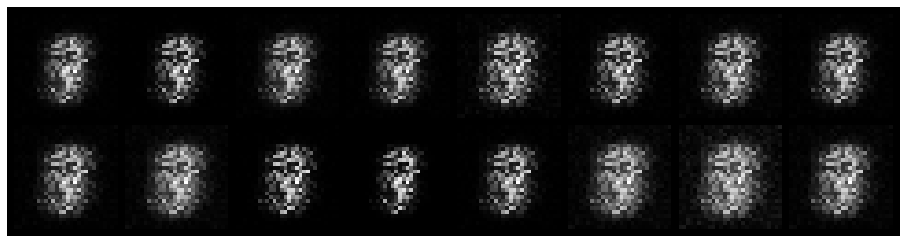

Epoch: [4/20], Batch Num: [100/600]
Discriminator Loss: 0.5353, Generator Loss: 2.0367
D(x): 0.8476, D(G(z)): 0.2245
Epoch: [4/20], Batch Num: [101/600]
Discriminator Loss: 0.6495, Generator Loss: 2.1879
D(x): 0.8133, D(G(z)): 0.2505
Epoch: [4/20], Batch Num: [102/600]
Discriminator Loss: 0.5685, Generator Loss: 2.1324
D(x): 0.8268, D(G(z)): 0.2269
Epoch: [4/20], Batch Num: [103/600]
Discriminator Loss: 0.5470, Generator Loss: 2.3026
D(x): 0.8257, D(G(z)): 0.1876
Epoch: [4/20], Batch Num: [104/600]
Discriminator Loss: 0.5208, Generator Loss: 2.2978
D(x): 0.8126, D(G(z)): 0.1614
Epoch: [4/20], Batch Num: [105/600]
Discriminator Loss: 0.5772, Generator Loss: 2.3150
D(x): 0.8349, D(G(z)): 0.1856
Epoch: [4/20], Batch Num: [106/600]
Discriminator Loss: 0.5748, Generator Loss: 2.4676
D(x): 0.7882, D(G(z)): 0.1658
Epoch: [4/20], Batch Num: [107/600]
Discriminator Loss: 0.5520, Generator Loss: 2.4102
D(x): 0.8087, D(G(z)): 0.1707
Epoch: [4/20], Batch Num: [108/600]
Discriminator Loss: 0.4689, 

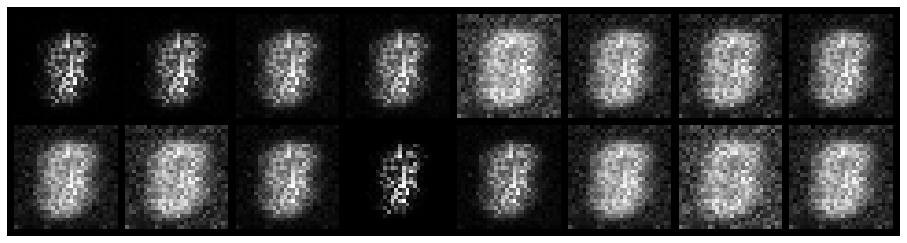

Epoch: [4/20], Batch Num: [200/600]
Discriminator Loss: 0.1494, Generator Loss: 3.7953
D(x): 0.9596, D(G(z)): 0.0828
Epoch: [4/20], Batch Num: [201/600]
Discriminator Loss: 0.2596, Generator Loss: 4.0962
D(x): 0.9139, D(G(z)): 0.0936
Epoch: [4/20], Batch Num: [202/600]
Discriminator Loss: 0.2862, Generator Loss: 4.1589
D(x): 0.9017, D(G(z)): 0.0782
Epoch: [4/20], Batch Num: [203/600]
Discriminator Loss: 0.1413, Generator Loss: 3.9781
D(x): 0.9600, D(G(z)): 0.0762
Epoch: [4/20], Batch Num: [204/600]
Discriminator Loss: 0.2785, Generator Loss: 3.9526
D(x): 0.9059, D(G(z)): 0.0734
Epoch: [4/20], Batch Num: [205/600]
Discriminator Loss: 0.2195, Generator Loss: 3.4561
D(x): 0.9436, D(G(z)): 0.0905
Epoch: [4/20], Batch Num: [206/600]
Discriminator Loss: 0.1482, Generator Loss: 3.6127
D(x): 0.9616, D(G(z)): 0.0839
Epoch: [4/20], Batch Num: [207/600]
Discriminator Loss: 0.3103, Generator Loss: 3.3224
D(x): 0.9242, D(G(z)): 0.1140
Epoch: [4/20], Batch Num: [208/600]
Discriminator Loss: 0.1709, 

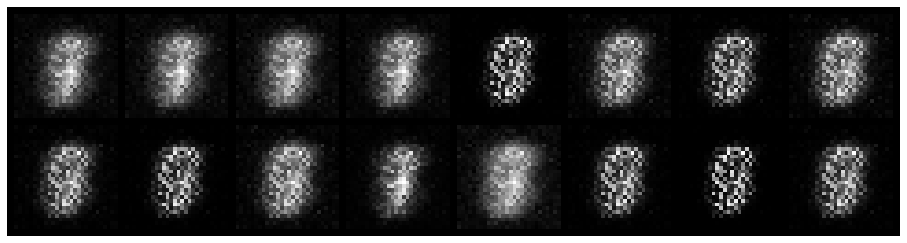

Epoch: [4/20], Batch Num: [300/600]
Discriminator Loss: 0.7676, Generator Loss: 1.8864
D(x): 0.7888, D(G(z)): 0.2491
Epoch: [4/20], Batch Num: [301/600]
Discriminator Loss: 0.6020, Generator Loss: 1.9384
D(x): 0.8680, D(G(z)): 0.2742
Epoch: [4/20], Batch Num: [302/600]
Discriminator Loss: 0.6475, Generator Loss: 2.0322
D(x): 0.8111, D(G(z)): 0.2184
Epoch: [4/20], Batch Num: [303/600]
Discriminator Loss: 0.5732, Generator Loss: 2.3202
D(x): 0.8312, D(G(z)): 0.1958
Epoch: [4/20], Batch Num: [304/600]
Discriminator Loss: 0.5685, Generator Loss: 1.8872
D(x): 0.8000, D(G(z)): 0.1717
Epoch: [4/20], Batch Num: [305/600]
Discriminator Loss: 0.5769, Generator Loss: 2.0611
D(x): 0.8328, D(G(z)): 0.2134
Epoch: [4/20], Batch Num: [306/600]
Discriminator Loss: 0.4627, Generator Loss: 2.1373
D(x): 0.8642, D(G(z)): 0.1918
Epoch: [4/20], Batch Num: [307/600]
Discriminator Loss: 0.4180, Generator Loss: 2.1140
D(x): 0.9037, D(G(z)): 0.2046
Epoch: [4/20], Batch Num: [308/600]
Discriminator Loss: 0.4358, 

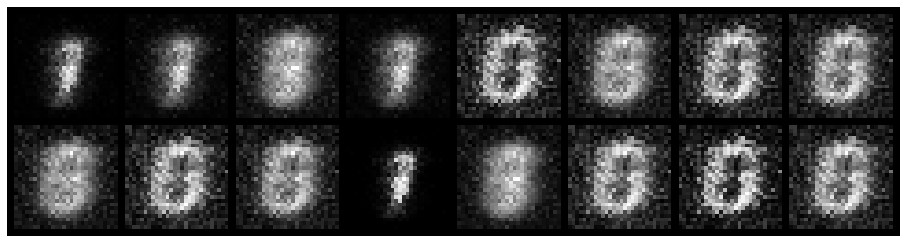

Epoch: [4/20], Batch Num: [400/600]
Discriminator Loss: 0.9489, Generator Loss: 1.9235
D(x): 0.7359, D(G(z)): 0.2464
Epoch: [4/20], Batch Num: [401/600]
Discriminator Loss: 0.7612, Generator Loss: 1.8729
D(x): 0.7812, D(G(z)): 0.2803
Epoch: [4/20], Batch Num: [402/600]
Discriminator Loss: 0.8535, Generator Loss: 1.4715
D(x): 0.7860, D(G(z)): 0.3291
Epoch: [4/20], Batch Num: [403/600]
Discriminator Loss: 0.9627, Generator Loss: 1.6908
D(x): 0.7847, D(G(z)): 0.3500
Epoch: [4/20], Batch Num: [404/600]
Discriminator Loss: 1.0622, Generator Loss: 1.9610
D(x): 0.7172, D(G(z)): 0.3322
Epoch: [4/20], Batch Num: [405/600]
Discriminator Loss: 0.8987, Generator Loss: 1.9776
D(x): 0.7342, D(G(z)): 0.2620
Epoch: [4/20], Batch Num: [406/600]
Discriminator Loss: 0.9622, Generator Loss: 1.7850
D(x): 0.7271, D(G(z)): 0.2907
Epoch: [4/20], Batch Num: [407/600]
Discriminator Loss: 0.9171, Generator Loss: 1.8612
D(x): 0.7366, D(G(z)): 0.2787
Epoch: [4/20], Batch Num: [408/600]
Discriminator Loss: 1.0273, 

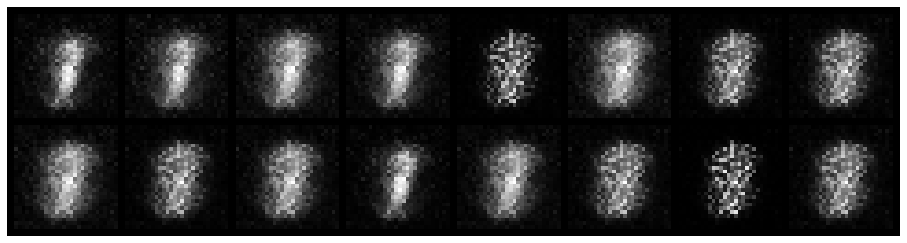

Epoch: [4/20], Batch Num: [500/600]
Discriminator Loss: 0.6642, Generator Loss: 3.1603
D(x): 0.8142, D(G(z)): 0.1644
Epoch: [4/20], Batch Num: [501/600]
Discriminator Loss: 0.6735, Generator Loss: 2.8174
D(x): 0.8201, D(G(z)): 0.1731
Epoch: [4/20], Batch Num: [502/600]
Discriminator Loss: 0.5986, Generator Loss: 2.8425
D(x): 0.8296, D(G(z)): 0.1757
Epoch: [4/20], Batch Num: [503/600]
Discriminator Loss: 0.5887, Generator Loss: 3.0972
D(x): 0.8536, D(G(z)): 0.1905
Epoch: [4/20], Batch Num: [504/600]
Discriminator Loss: 0.4192, Generator Loss: 3.0423
D(x): 0.8877, D(G(z)): 0.1386
Epoch: [4/20], Batch Num: [505/600]
Discriminator Loss: 0.6166, Generator Loss: 2.9143
D(x): 0.8400, D(G(z)): 0.1402
Epoch: [4/20], Batch Num: [506/600]
Discriminator Loss: 0.5971, Generator Loss: 3.2017
D(x): 0.8364, D(G(z)): 0.1667
Epoch: [4/20], Batch Num: [507/600]
Discriminator Loss: 0.8743, Generator Loss: 2.5988
D(x): 0.7654, D(G(z)): 0.1920
Epoch: [4/20], Batch Num: [508/600]
Discriminator Loss: 0.7134, 

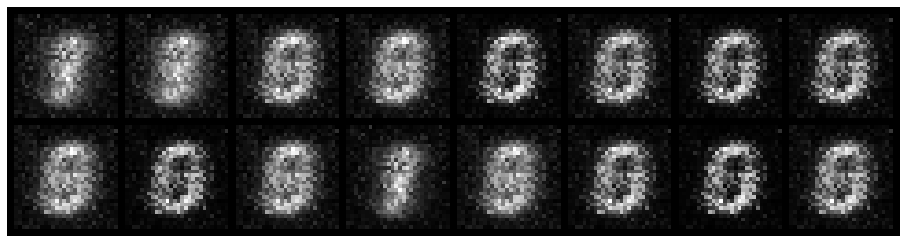

Epoch: [5/20], Batch Num: [0/600]
Discriminator Loss: 0.4650, Generator Loss: 2.5329
D(x): 0.8676, D(G(z)): 0.1484
Epoch: [5/20], Batch Num: [1/600]
Discriminator Loss: 0.3792, Generator Loss: 2.7025
D(x): 0.8741, D(G(z)): 0.1184
Epoch: [5/20], Batch Num: [2/600]
Discriminator Loss: 0.4554, Generator Loss: 2.4232
D(x): 0.8333, D(G(z)): 0.1181
Epoch: [5/20], Batch Num: [3/600]
Discriminator Loss: 0.3947, Generator Loss: 2.1708
D(x): 0.8771, D(G(z)): 0.1216
Epoch: [5/20], Batch Num: [4/600]
Discriminator Loss: 0.2591, Generator Loss: 2.0857
D(x): 0.9416, D(G(z)): 0.1311
Epoch: [5/20], Batch Num: [5/600]
Discriminator Loss: 0.3107, Generator Loss: 2.1738
D(x): 0.8977, D(G(z)): 0.1338
Epoch: [5/20], Batch Num: [6/600]
Discriminator Loss: 0.3713, Generator Loss: 2.0106
D(x): 0.9049, D(G(z)): 0.1641
Epoch: [5/20], Batch Num: [7/600]
Discriminator Loss: 0.3729, Generator Loss: 2.1349
D(x): 0.9248, D(G(z)): 0.1965
Epoch: [5/20], Batch Num: [8/600]
Discriminator Loss: 0.3083, Generator Loss: 2.

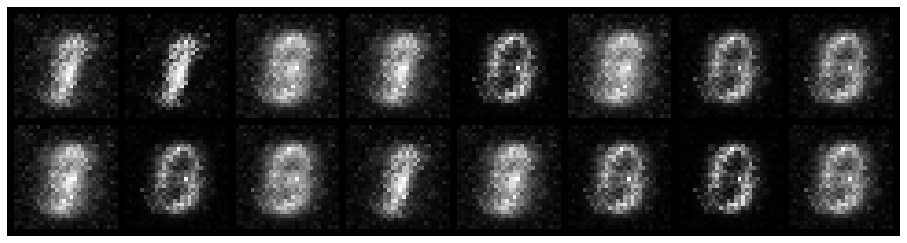

Epoch: [5/20], Batch Num: [100/600]
Discriminator Loss: 0.5534, Generator Loss: 2.4913
D(x): 0.8454, D(G(z)): 0.1347
Epoch: [5/20], Batch Num: [101/600]
Discriminator Loss: 0.4993, Generator Loss: 2.1995
D(x): 0.8665, D(G(z)): 0.1565
Epoch: [5/20], Batch Num: [102/600]
Discriminator Loss: 0.5129, Generator Loss: 2.2040
D(x): 0.8955, D(G(z)): 0.1875
Epoch: [5/20], Batch Num: [103/600]
Discriminator Loss: 0.6486, Generator Loss: 2.0342
D(x): 0.8195, D(G(z)): 0.1688
Epoch: [5/20], Batch Num: [104/600]
Discriminator Loss: 0.5681, Generator Loss: 2.1152
D(x): 0.8664, D(G(z)): 0.1973
Epoch: [5/20], Batch Num: [105/600]
Discriminator Loss: 0.5304, Generator Loss: 2.2705
D(x): 0.8840, D(G(z)): 0.1741
Epoch: [5/20], Batch Num: [106/600]
Discriminator Loss: 0.7130, Generator Loss: 2.1901
D(x): 0.8063, D(G(z)): 0.1822
Epoch: [5/20], Batch Num: [107/600]
Discriminator Loss: 0.6316, Generator Loss: 2.1023
D(x): 0.8182, D(G(z)): 0.1646
Epoch: [5/20], Batch Num: [108/600]
Discriminator Loss: 0.5499, 

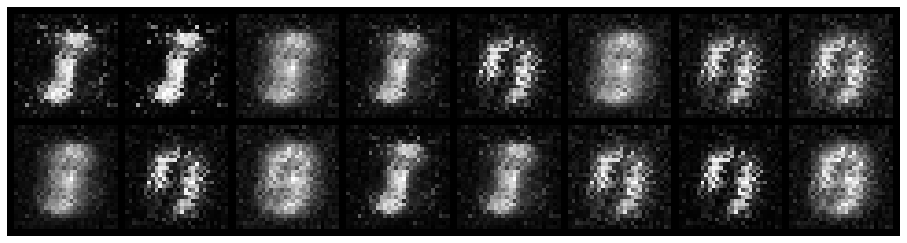

Epoch: [5/20], Batch Num: [200/600]
Discriminator Loss: 0.7595, Generator Loss: 1.9853
D(x): 0.8135, D(G(z)): 0.2672
Epoch: [5/20], Batch Num: [201/600]
Discriminator Loss: 0.6142, Generator Loss: 2.1680
D(x): 0.8522, D(G(z)): 0.2281
Epoch: [5/20], Batch Num: [202/600]
Discriminator Loss: 0.8092, Generator Loss: 1.8549
D(x): 0.7427, D(G(z)): 0.1956
Epoch: [5/20], Batch Num: [203/600]
Discriminator Loss: 0.7089, Generator Loss: 1.8754
D(x): 0.8270, D(G(z)): 0.2573
Epoch: [5/20], Batch Num: [204/600]
Discriminator Loss: 0.5595, Generator Loss: 2.0601
D(x): 0.8868, D(G(z)): 0.2361
Epoch: [5/20], Batch Num: [205/600]
Discriminator Loss: 0.8365, Generator Loss: 1.9762
D(x): 0.7863, D(G(z)): 0.2363
Epoch: [5/20], Batch Num: [206/600]
Discriminator Loss: 0.8088, Generator Loss: 2.1839
D(x): 0.7924, D(G(z)): 0.2452
Epoch: [5/20], Batch Num: [207/600]
Discriminator Loss: 0.7161, Generator Loss: 2.4522
D(x): 0.7997, D(G(z)): 0.2058
Epoch: [5/20], Batch Num: [208/600]
Discriminator Loss: 0.3904, 

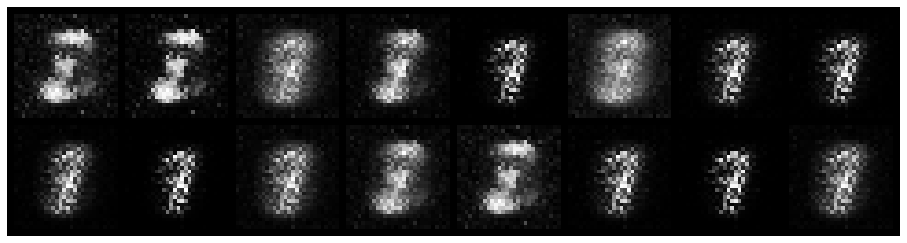

Epoch: [5/20], Batch Num: [300/600]
Discriminator Loss: 0.5822, Generator Loss: 2.5947
D(x): 0.8498, D(G(z)): 0.1632
Epoch: [5/20], Batch Num: [301/600]
Discriminator Loss: 0.5589, Generator Loss: 2.5788
D(x): 0.8080, D(G(z)): 0.1238
Epoch: [5/20], Batch Num: [302/600]
Discriminator Loss: 0.4767, Generator Loss: 2.3989
D(x): 0.8309, D(G(z)): 0.1426
Epoch: [5/20], Batch Num: [303/600]
Discriminator Loss: 0.3709, Generator Loss: 2.2450
D(x): 0.8861, D(G(z)): 0.1436
Epoch: [5/20], Batch Num: [304/600]
Discriminator Loss: 0.4352, Generator Loss: 2.2554
D(x): 0.8947, D(G(z)): 0.1828
Epoch: [5/20], Batch Num: [305/600]
Discriminator Loss: 0.6605, Generator Loss: 2.4192
D(x): 0.8799, D(G(z)): 0.2247
Epoch: [5/20], Batch Num: [306/600]
Discriminator Loss: 0.5084, Generator Loss: 2.8602
D(x): 0.8750, D(G(z)): 0.1816
Epoch: [5/20], Batch Num: [307/600]
Discriminator Loss: 0.2472, Generator Loss: 2.8721
D(x): 0.9316, D(G(z)): 0.1317
Epoch: [5/20], Batch Num: [308/600]
Discriminator Loss: 0.4019, 

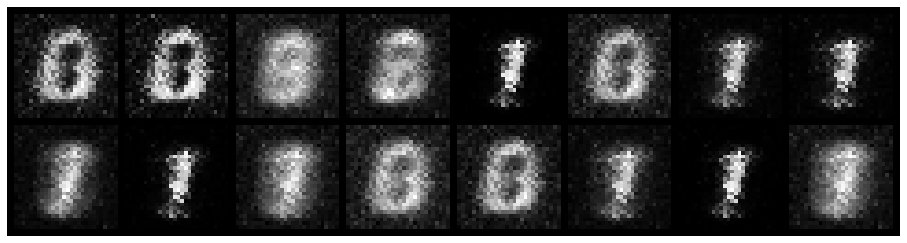

Epoch: [5/20], Batch Num: [400/600]
Discriminator Loss: 0.6211, Generator Loss: 1.8879
D(x): 0.8271, D(G(z)): 0.2094
Epoch: [5/20], Batch Num: [401/600]
Discriminator Loss: 0.6682, Generator Loss: 1.7942
D(x): 0.8560, D(G(z)): 0.2429
Epoch: [5/20], Batch Num: [402/600]
Discriminator Loss: 0.5801, Generator Loss: 1.8933
D(x): 0.8740, D(G(z)): 0.2609
Epoch: [5/20], Batch Num: [403/600]
Discriminator Loss: 0.8045, Generator Loss: 1.9186
D(x): 0.8051, D(G(z)): 0.2333
Epoch: [5/20], Batch Num: [404/600]
Discriminator Loss: 0.7438, Generator Loss: 1.9023
D(x): 0.7898, D(G(z)): 0.2289
Epoch: [5/20], Batch Num: [405/600]
Discriminator Loss: 0.6767, Generator Loss: 1.9013
D(x): 0.8043, D(G(z)): 0.2121
Epoch: [5/20], Batch Num: [406/600]
Discriminator Loss: 0.5494, Generator Loss: 1.9071
D(x): 0.8612, D(G(z)): 0.2346
Epoch: [5/20], Batch Num: [407/600]
Discriminator Loss: 0.6451, Generator Loss: 2.0617
D(x): 0.8432, D(G(z)): 0.2187
Epoch: [5/20], Batch Num: [408/600]
Discriminator Loss: 0.6400, 

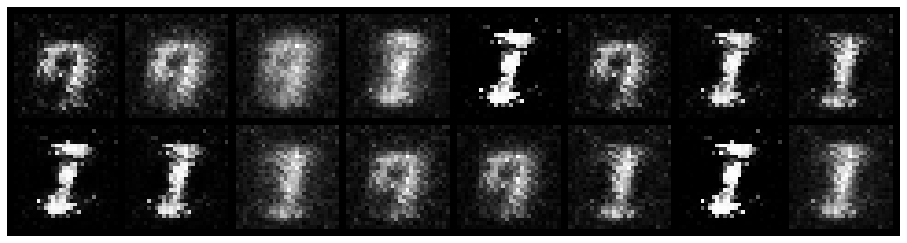

Epoch: [5/20], Batch Num: [500/600]
Discriminator Loss: 0.4909, Generator Loss: 2.0547
D(x): 0.8470, D(G(z)): 0.1407
Epoch: [5/20], Batch Num: [501/600]
Discriminator Loss: 0.4860, Generator Loss: 1.8852
D(x): 0.8637, D(G(z)): 0.1843
Epoch: [5/20], Batch Num: [502/600]
Discriminator Loss: 0.6726, Generator Loss: 1.9086
D(x): 0.8412, D(G(z)): 0.2158
Epoch: [5/20], Batch Num: [503/600]
Discriminator Loss: 0.7961, Generator Loss: 1.7752
D(x): 0.8439, D(G(z)): 0.2782
Epoch: [5/20], Batch Num: [504/600]
Discriminator Loss: 0.7190, Generator Loss: 2.0268
D(x): 0.8784, D(G(z)): 0.2738
Epoch: [5/20], Batch Num: [505/600]
Discriminator Loss: 0.5789, Generator Loss: 2.4202
D(x): 0.8548, D(G(z)): 0.1939
Epoch: [5/20], Batch Num: [506/600]
Discriminator Loss: 0.3942, Generator Loss: 2.6661
D(x): 0.8951, D(G(z)): 0.1292
Epoch: [5/20], Batch Num: [507/600]
Discriminator Loss: 0.4959, Generator Loss: 2.7746
D(x): 0.8326, D(G(z)): 0.1078
Epoch: [5/20], Batch Num: [508/600]
Discriminator Loss: 0.4659, 

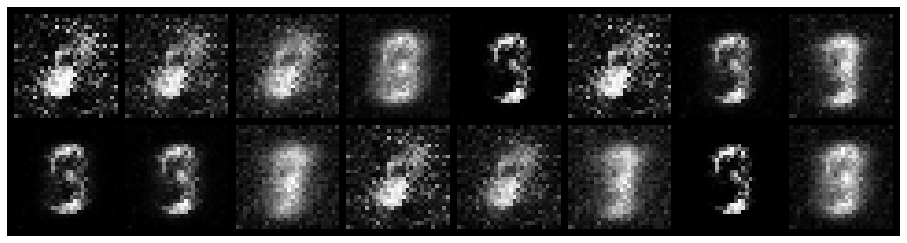

Epoch: [6/20], Batch Num: [0/600]
Discriminator Loss: 0.7458, Generator Loss: 2.1053
D(x): 0.7186, D(G(z)): 0.1803
Epoch: [6/20], Batch Num: [1/600]
Discriminator Loss: 0.8689, Generator Loss: 2.0317
D(x): 0.6958, D(G(z)): 0.1990
Epoch: [6/20], Batch Num: [2/600]
Discriminator Loss: 0.7488, Generator Loss: 1.6947
D(x): 0.7274, D(G(z)): 0.2081
Epoch: [6/20], Batch Num: [3/600]
Discriminator Loss: 0.8363, Generator Loss: 1.4972
D(x): 0.7695, D(G(z)): 0.2712
Epoch: [6/20], Batch Num: [4/600]
Discriminator Loss: 0.8681, Generator Loss: 1.5039
D(x): 0.8077, D(G(z)): 0.3375
Epoch: [6/20], Batch Num: [5/600]
Discriminator Loss: 0.5739, Generator Loss: 1.7465
D(x): 0.8586, D(G(z)): 0.2603
Epoch: [6/20], Batch Num: [6/600]
Discriminator Loss: 0.7461, Generator Loss: 1.9441
D(x): 0.7991, D(G(z)): 0.2695
Epoch: [6/20], Batch Num: [7/600]
Discriminator Loss: 0.7702, Generator Loss: 1.8800
D(x): 0.7061, D(G(z)): 0.1893
Epoch: [6/20], Batch Num: [8/600]
Discriminator Loss: 0.7670, Generator Loss: 2.

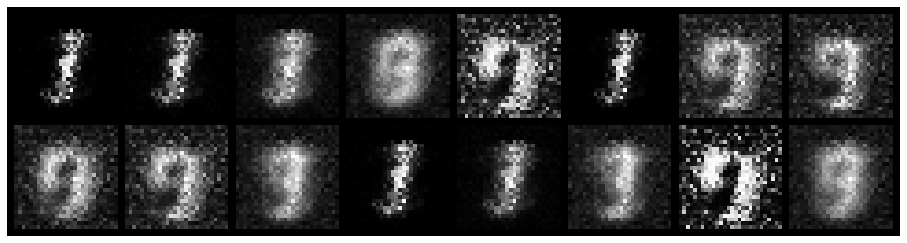

Epoch: [6/20], Batch Num: [100/600]
Discriminator Loss: 0.7633, Generator Loss: 1.6331
D(x): 0.7743, D(G(z)): 0.2564
Epoch: [6/20], Batch Num: [101/600]
Discriminator Loss: 0.7976, Generator Loss: 1.2263
D(x): 0.8070, D(G(z)): 0.3257
Epoch: [6/20], Batch Num: [102/600]
Discriminator Loss: 0.8490, Generator Loss: 1.7143
D(x): 0.8378, D(G(z)): 0.3814
Epoch: [6/20], Batch Num: [103/600]
Discriminator Loss: 0.8194, Generator Loss: 1.9472
D(x): 0.7756, D(G(z)): 0.2861
Epoch: [6/20], Batch Num: [104/600]
Discriminator Loss: 0.7348, Generator Loss: 2.1230
D(x): 0.7636, D(G(z)): 0.2259
Epoch: [6/20], Batch Num: [105/600]
Discriminator Loss: 0.8340, Generator Loss: 1.9222
D(x): 0.7041, D(G(z)): 0.1907
Epoch: [6/20], Batch Num: [106/600]
Discriminator Loss: 0.9500, Generator Loss: 1.7909
D(x): 0.6639, D(G(z)): 0.1832
Epoch: [6/20], Batch Num: [107/600]
Discriminator Loss: 0.7229, Generator Loss: 1.4051
D(x): 0.7779, D(G(z)): 0.2250
Epoch: [6/20], Batch Num: [108/600]
Discriminator Loss: 0.9375, 

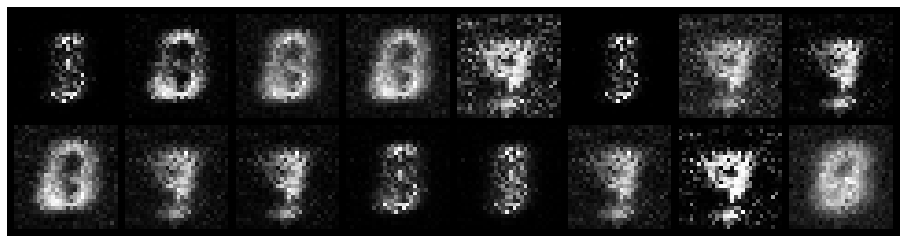

Epoch: [6/20], Batch Num: [200/600]
Discriminator Loss: 0.5636, Generator Loss: 2.1215
D(x): 0.8104, D(G(z)): 0.1497
Epoch: [6/20], Batch Num: [201/600]
Discriminator Loss: 0.6407, Generator Loss: 2.0958
D(x): 0.8112, D(G(z)): 0.2123
Epoch: [6/20], Batch Num: [202/600]
Discriminator Loss: 0.7647, Generator Loss: 1.9770
D(x): 0.8301, D(G(z)): 0.2648
Epoch: [6/20], Batch Num: [203/600]
Discriminator Loss: 0.6230, Generator Loss: 2.2716
D(x): 0.8832, D(G(z)): 0.2418
Epoch: [6/20], Batch Num: [204/600]
Discriminator Loss: 0.6183, Generator Loss: 2.3110
D(x): 0.8259, D(G(z)): 0.1937
Epoch: [6/20], Batch Num: [205/600]
Discriminator Loss: 0.5990, Generator Loss: 2.1442
D(x): 0.8011, D(G(z)): 0.1773
Epoch: [6/20], Batch Num: [206/600]
Discriminator Loss: 0.5530, Generator Loss: 2.3148
D(x): 0.8631, D(G(z)): 0.2150
Epoch: [6/20], Batch Num: [207/600]
Discriminator Loss: 0.5251, Generator Loss: 2.2929
D(x): 0.8495, D(G(z)): 0.1934
Epoch: [6/20], Batch Num: [208/600]
Discriminator Loss: 0.3710, 

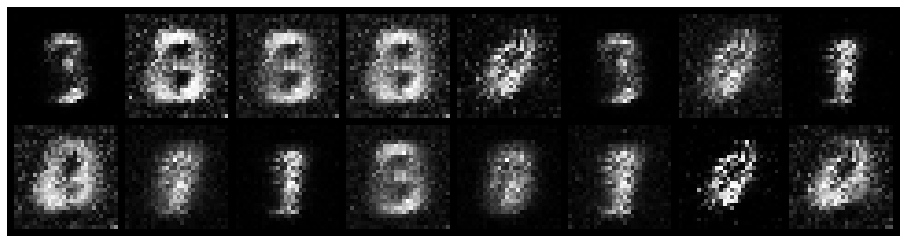

Epoch: [6/20], Batch Num: [300/600]
Discriminator Loss: 0.6353, Generator Loss: 2.8430
D(x): 0.8040, D(G(z)): 0.1432
Epoch: [6/20], Batch Num: [301/600]
Discriminator Loss: 0.6144, Generator Loss: 2.7299
D(x): 0.8351, D(G(z)): 0.1894
Epoch: [6/20], Batch Num: [302/600]
Discriminator Loss: 0.5377, Generator Loss: 2.6053
D(x): 0.8923, D(G(z)): 0.1763
Epoch: [6/20], Batch Num: [303/600]
Discriminator Loss: 0.4198, Generator Loss: 2.5419
D(x): 0.8796, D(G(z)): 0.1520
Epoch: [6/20], Batch Num: [304/600]
Discriminator Loss: 0.7332, Generator Loss: 2.3980
D(x): 0.8124, D(G(z)): 0.1594
Epoch: [6/20], Batch Num: [305/600]
Discriminator Loss: 0.7612, Generator Loss: 2.2493
D(x): 0.8301, D(G(z)): 0.2546
Epoch: [6/20], Batch Num: [306/600]
Discriminator Loss: 0.6237, Generator Loss: 2.6806
D(x): 0.8647, D(G(z)): 0.2195
Epoch: [6/20], Batch Num: [307/600]
Discriminator Loss: 0.6930, Generator Loss: 2.7798
D(x): 0.8336, D(G(z)): 0.1788
Epoch: [6/20], Batch Num: [308/600]
Discriminator Loss: 1.0239, 

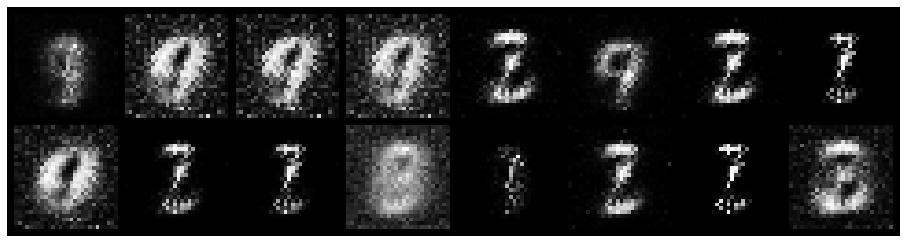

Epoch: [6/20], Batch Num: [400/600]
Discriminator Loss: 0.5369, Generator Loss: 2.5366
D(x): 0.8385, D(G(z)): 0.2005
Epoch: [6/20], Batch Num: [401/600]
Discriminator Loss: 0.5365, Generator Loss: 2.5927
D(x): 0.8358, D(G(z)): 0.1726
Epoch: [6/20], Batch Num: [402/600]
Discriminator Loss: 0.6313, Generator Loss: 2.6840
D(x): 0.7759, D(G(z)): 0.1658
Epoch: [6/20], Batch Num: [403/600]
Discriminator Loss: 0.4887, Generator Loss: 2.7471
D(x): 0.8351, D(G(z)): 0.1693
Epoch: [6/20], Batch Num: [404/600]
Discriminator Loss: 0.6202, Generator Loss: 2.3368
D(x): 0.7951, D(G(z)): 0.1576
Epoch: [6/20], Batch Num: [405/600]
Discriminator Loss: 0.4534, Generator Loss: 2.4213
D(x): 0.8373, D(G(z)): 0.1559
Epoch: [6/20], Batch Num: [406/600]
Discriminator Loss: 0.5761, Generator Loss: 2.1893
D(x): 0.8705, D(G(z)): 0.2304
Epoch: [6/20], Batch Num: [407/600]
Discriminator Loss: 0.5007, Generator Loss: 2.3879
D(x): 0.8497, D(G(z)): 0.2011
Epoch: [6/20], Batch Num: [408/600]
Discriminator Loss: 0.4882, 

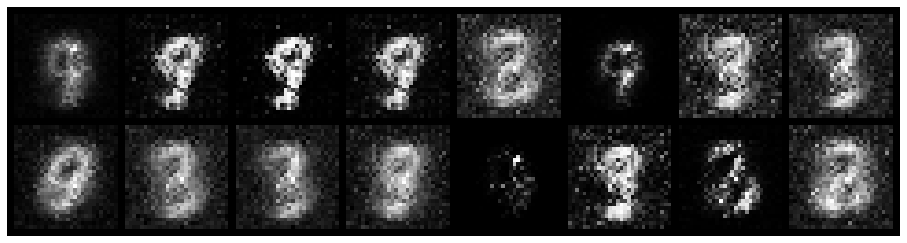

Epoch: [6/20], Batch Num: [500/600]
Discriminator Loss: 0.5709, Generator Loss: 2.3887
D(x): 0.8708, D(G(z)): 0.2168
Epoch: [6/20], Batch Num: [501/600]
Discriminator Loss: 0.7236, Generator Loss: 2.2527
D(x): 0.7970, D(G(z)): 0.2358
Epoch: [6/20], Batch Num: [502/600]
Discriminator Loss: 0.5447, Generator Loss: 2.6525
D(x): 0.8594, D(G(z)): 0.2061
Epoch: [6/20], Batch Num: [503/600]
Discriminator Loss: 0.7209, Generator Loss: 2.3679
D(x): 0.7752, D(G(z)): 0.1838
Epoch: [6/20], Batch Num: [504/600]
Discriminator Loss: 0.6061, Generator Loss: 2.3250
D(x): 0.8682, D(G(z)): 0.2051
Epoch: [6/20], Batch Num: [505/600]
Discriminator Loss: 0.6290, Generator Loss: 2.1245
D(x): 0.8104, D(G(z)): 0.1981
Epoch: [6/20], Batch Num: [506/600]
Discriminator Loss: 0.7731, Generator Loss: 2.5855
D(x): 0.8759, D(G(z)): 0.2938
Epoch: [6/20], Batch Num: [507/600]
Discriminator Loss: 0.6638, Generator Loss: 2.7294
D(x): 0.8276, D(G(z)): 0.2126
Epoch: [6/20], Batch Num: [508/600]
Discriminator Loss: 0.6118, 

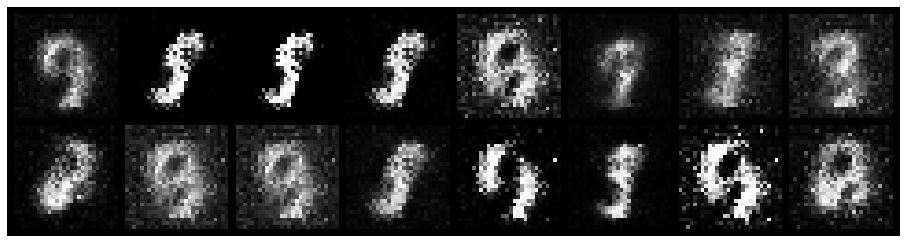

Epoch: [7/20], Batch Num: [0/600]
Discriminator Loss: 0.9578, Generator Loss: 1.8545
D(x): 0.7644, D(G(z)): 0.2909
Epoch: [7/20], Batch Num: [1/600]
Discriminator Loss: 1.0467, Generator Loss: 1.9305
D(x): 0.7278, D(G(z)): 0.3086
Epoch: [7/20], Batch Num: [2/600]
Discriminator Loss: 0.8455, Generator Loss: 1.5671
D(x): 0.7372, D(G(z)): 0.2488
Epoch: [7/20], Batch Num: [3/600]
Discriminator Loss: 0.8273, Generator Loss: 1.8711
D(x): 0.8024, D(G(z)): 0.3016
Epoch: [7/20], Batch Num: [4/600]
Discriminator Loss: 0.8965, Generator Loss: 2.0802
D(x): 0.7627, D(G(z)): 0.2780
Epoch: [7/20], Batch Num: [5/600]
Discriminator Loss: 0.8899, Generator Loss: 1.9734
D(x): 0.7119, D(G(z)): 0.2408
Epoch: [7/20], Batch Num: [6/600]
Discriminator Loss: 0.8628, Generator Loss: 1.9256
D(x): 0.7045, D(G(z)): 0.2055
Epoch: [7/20], Batch Num: [7/600]
Discriminator Loss: 0.7239, Generator Loss: 1.8714
D(x): 0.7921, D(G(z)): 0.2418
Epoch: [7/20], Batch Num: [8/600]
Discriminator Loss: 0.7245, Generator Loss: 2.

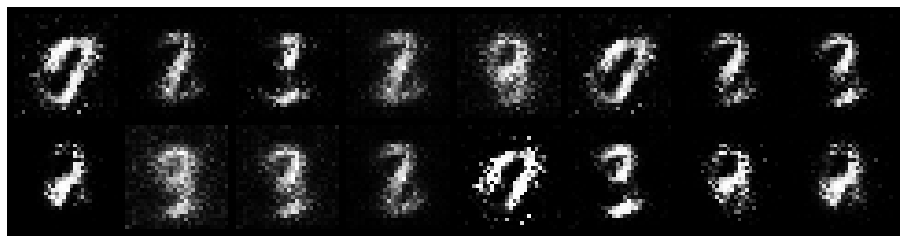

Epoch: [7/20], Batch Num: [100/600]
Discriminator Loss: 0.8948, Generator Loss: 1.8776
D(x): 0.6954, D(G(z)): 0.2619
Epoch: [7/20], Batch Num: [101/600]
Discriminator Loss: 0.8212, Generator Loss: 1.9626
D(x): 0.7250, D(G(z)): 0.2511
Epoch: [7/20], Batch Num: [102/600]
Discriminator Loss: 0.8056, Generator Loss: 1.8506
D(x): 0.7082, D(G(z)): 0.2376
Epoch: [7/20], Batch Num: [103/600]
Discriminator Loss: 0.8694, Generator Loss: 1.7871
D(x): 0.6953, D(G(z)): 0.2598
Epoch: [7/20], Batch Num: [104/600]
Discriminator Loss: 0.7546, Generator Loss: 1.9408
D(x): 0.7445, D(G(z)): 0.2518
Epoch: [7/20], Batch Num: [105/600]
Discriminator Loss: 0.7515, Generator Loss: 1.8091
D(x): 0.7132, D(G(z)): 0.2243
Epoch: [7/20], Batch Num: [106/600]
Discriminator Loss: 0.6085, Generator Loss: 1.9111
D(x): 0.7769, D(G(z)): 0.2156
Epoch: [7/20], Batch Num: [107/600]
Discriminator Loss: 0.7066, Generator Loss: 2.0273
D(x): 0.7749, D(G(z)): 0.2438
Epoch: [7/20], Batch Num: [108/600]
Discriminator Loss: 0.6239, 

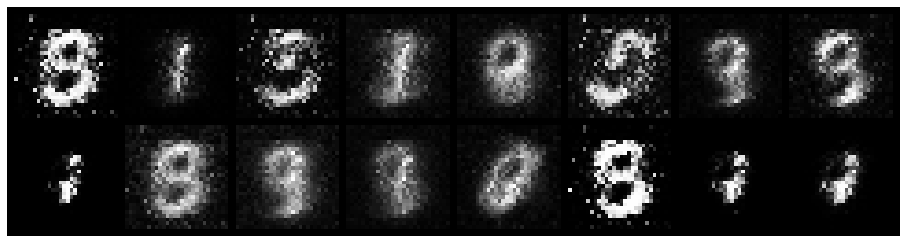

Epoch: [7/20], Batch Num: [200/600]
Discriminator Loss: 0.9648, Generator Loss: 2.5637
D(x): 0.6844, D(G(z)): 0.2033
Epoch: [7/20], Batch Num: [201/600]
Discriminator Loss: 0.6821, Generator Loss: 2.2620
D(x): 0.8052, D(G(z)): 0.2291
Epoch: [7/20], Batch Num: [202/600]
Discriminator Loss: 0.6862, Generator Loss: 2.2710
D(x): 0.8037, D(G(z)): 0.2521
Epoch: [7/20], Batch Num: [203/600]
Discriminator Loss: 0.6636, Generator Loss: 2.1031
D(x): 0.7869, D(G(z)): 0.2202
Epoch: [7/20], Batch Num: [204/600]
Discriminator Loss: 0.7231, Generator Loss: 2.2872
D(x): 0.7959, D(G(z)): 0.2639
Epoch: [7/20], Batch Num: [205/600]
Discriminator Loss: 0.7352, Generator Loss: 2.1744
D(x): 0.7720, D(G(z)): 0.2219
Epoch: [7/20], Batch Num: [206/600]
Discriminator Loss: 0.7274, Generator Loss: 2.2171
D(x): 0.7449, D(G(z)): 0.1720
Epoch: [7/20], Batch Num: [207/600]
Discriminator Loss: 0.7010, Generator Loss: 2.0255
D(x): 0.7890, D(G(z)): 0.2209
Epoch: [7/20], Batch Num: [208/600]
Discriminator Loss: 1.0072, 

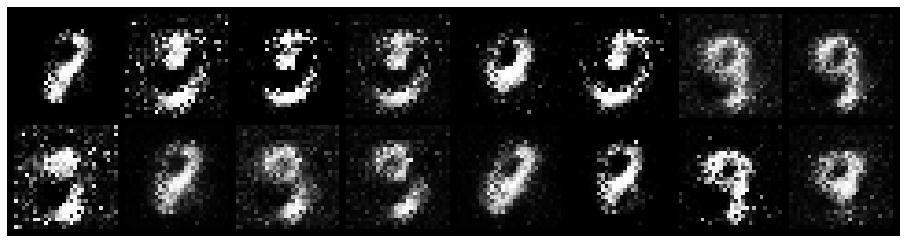

Epoch: [7/20], Batch Num: [300/600]
Discriminator Loss: 0.5816, Generator Loss: 2.7158
D(x): 0.8025, D(G(z)): 0.1614
Epoch: [7/20], Batch Num: [301/600]
Discriminator Loss: 0.5123, Generator Loss: 2.6850
D(x): 0.8304, D(G(z)): 0.1462
Epoch: [7/20], Batch Num: [302/600]
Discriminator Loss: 0.5319, Generator Loss: 2.5198
D(x): 0.8144, D(G(z)): 0.1663
Epoch: [7/20], Batch Num: [303/600]
Discriminator Loss: 0.4805, Generator Loss: 2.4427
D(x): 0.8477, D(G(z)): 0.1792
Epoch: [7/20], Batch Num: [304/600]
Discriminator Loss: 0.5766, Generator Loss: 2.6160
D(x): 0.8738, D(G(z)): 0.2235
Epoch: [7/20], Batch Num: [305/600]
Discriminator Loss: 0.6461, Generator Loss: 2.4194
D(x): 0.8429, D(G(z)): 0.2152
Epoch: [7/20], Batch Num: [306/600]
Discriminator Loss: 0.6348, Generator Loss: 2.5866
D(x): 0.8085, D(G(z)): 0.1999
Epoch: [7/20], Batch Num: [307/600]
Discriminator Loss: 0.5100, Generator Loss: 2.5739
D(x): 0.8360, D(G(z)): 0.1614
Epoch: [7/20], Batch Num: [308/600]
Discriminator Loss: 0.7467, 

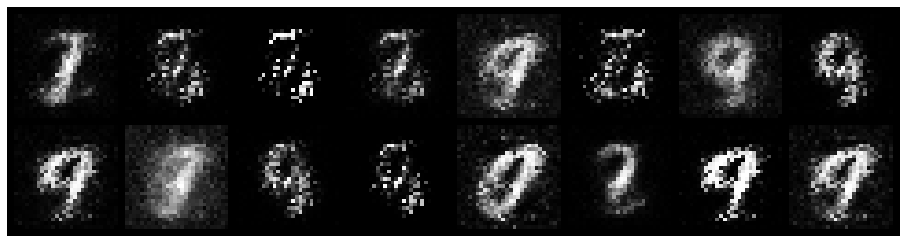

Epoch: [7/20], Batch Num: [400/600]
Discriminator Loss: 0.7886, Generator Loss: 1.9931
D(x): 0.7748, D(G(z)): 0.2416
Epoch: [7/20], Batch Num: [401/600]
Discriminator Loss: 0.7043, Generator Loss: 2.1719
D(x): 0.8019, D(G(z)): 0.2235
Epoch: [7/20], Batch Num: [402/600]
Discriminator Loss: 0.6218, Generator Loss: 2.2296
D(x): 0.8054, D(G(z)): 0.1807
Epoch: [7/20], Batch Num: [403/600]
Discriminator Loss: 0.7272, Generator Loss: 1.8603
D(x): 0.7432, D(G(z)): 0.1873
Epoch: [7/20], Batch Num: [404/600]
Discriminator Loss: 0.6930, Generator Loss: 1.5755
D(x): 0.8017, D(G(z)): 0.2486
Epoch: [7/20], Batch Num: [405/600]
Discriminator Loss: 0.6765, Generator Loss: 1.8750
D(x): 0.8502, D(G(z)): 0.2683
Epoch: [7/20], Batch Num: [406/600]
Discriminator Loss: 0.7139, Generator Loss: 2.4891
D(x): 0.8555, D(G(z)): 0.2835
Epoch: [7/20], Batch Num: [407/600]
Discriminator Loss: 0.6929, Generator Loss: 2.3805
D(x): 0.7580, D(G(z)): 0.1411
Epoch: [7/20], Batch Num: [408/600]
Discriminator Loss: 0.5603, 

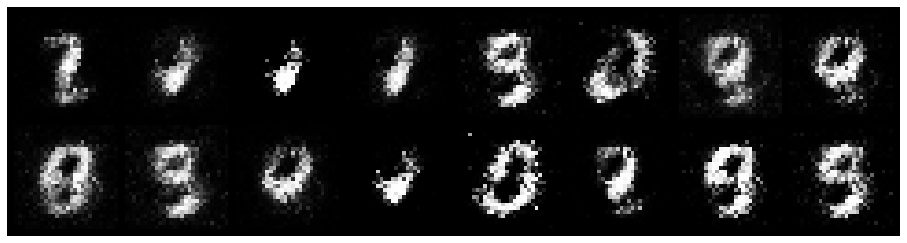

Epoch: [7/20], Batch Num: [500/600]
Discriminator Loss: 0.5476, Generator Loss: 2.7486
D(x): 0.8230, D(G(z)): 0.1610
Epoch: [7/20], Batch Num: [501/600]
Discriminator Loss: 0.4432, Generator Loss: 2.5046
D(x): 0.8339, D(G(z)): 0.1410
Epoch: [7/20], Batch Num: [502/600]
Discriminator Loss: 0.4870, Generator Loss: 2.4072
D(x): 0.8170, D(G(z)): 0.1114
Epoch: [7/20], Batch Num: [503/600]
Discriminator Loss: 0.5071, Generator Loss: 2.1933
D(x): 0.8458, D(G(z)): 0.1755
Epoch: [7/20], Batch Num: [504/600]
Discriminator Loss: 0.4265, Generator Loss: 2.3726
D(x): 0.9037, D(G(z)): 0.1862
Epoch: [7/20], Batch Num: [505/600]
Discriminator Loss: 0.5349, Generator Loss: 2.6410
D(x): 0.8463, D(G(z)): 0.1999
Epoch: [7/20], Batch Num: [506/600]
Discriminator Loss: 0.4580, Generator Loss: 2.6615
D(x): 0.8572, D(G(z)): 0.1454
Epoch: [7/20], Batch Num: [507/600]
Discriminator Loss: 0.3922, Generator Loss: 3.1388
D(x): 0.8995, D(G(z)): 0.1639
Epoch: [7/20], Batch Num: [508/600]
Discriminator Loss: 0.2804, 

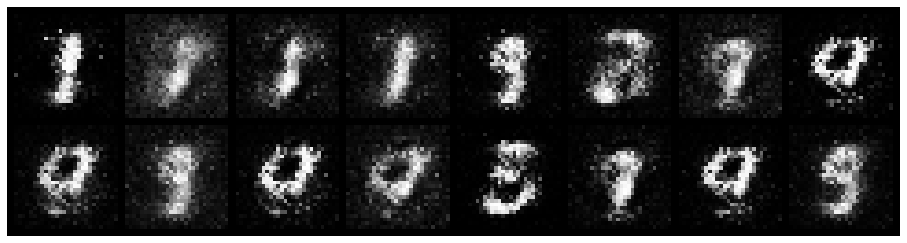

Epoch: [8/20], Batch Num: [0/600]
Discriminator Loss: 0.4696, Generator Loss: 2.2924
D(x): 0.9241, D(G(z)): 0.2434
Epoch: [8/20], Batch Num: [1/600]
Discriminator Loss: 0.3580, Generator Loss: 2.9697
D(x): 0.9406, D(G(z)): 0.2028
Epoch: [8/20], Batch Num: [2/600]
Discriminator Loss: 0.2631, Generator Loss: 3.4941
D(x): 0.9183, D(G(z)): 0.1112
Epoch: [8/20], Batch Num: [3/600]
Discriminator Loss: 0.4611, Generator Loss: 3.4713
D(x): 0.7983, D(G(z)): 0.0743
Epoch: [8/20], Batch Num: [4/600]
Discriminator Loss: 0.4387, Generator Loss: 3.2454
D(x): 0.8262, D(G(z)): 0.0695
Epoch: [8/20], Batch Num: [5/600]
Discriminator Loss: 0.3220, Generator Loss: 2.9944
D(x): 0.8708, D(G(z)): 0.0777
Epoch: [8/20], Batch Num: [6/600]
Discriminator Loss: 0.3654, Generator Loss: 2.6114
D(x): 0.8709, D(G(z)): 0.1197
Epoch: [8/20], Batch Num: [7/600]
Discriminator Loss: 0.2791, Generator Loss: 2.4613
D(x): 0.9461, D(G(z)): 0.1658
Epoch: [8/20], Batch Num: [8/600]
Discriminator Loss: 0.4520, Generator Loss: 2.

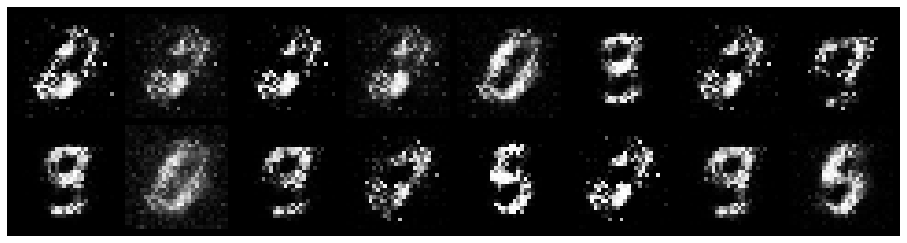

Epoch: [8/20], Batch Num: [100/600]
Discriminator Loss: 0.6004, Generator Loss: 2.2460
D(x): 0.8390, D(G(z)): 0.2503
Epoch: [8/20], Batch Num: [101/600]
Discriminator Loss: 0.4739, Generator Loss: 2.5551
D(x): 0.8300, D(G(z)): 0.1577
Epoch: [8/20], Batch Num: [102/600]
Discriminator Loss: 0.6228, Generator Loss: 2.6552
D(x): 0.7423, D(G(z)): 0.1547
Epoch: [8/20], Batch Num: [103/600]
Discriminator Loss: 0.6244, Generator Loss: 2.4837
D(x): 0.7120, D(G(z)): 0.1147
Epoch: [8/20], Batch Num: [104/600]
Discriminator Loss: 0.5478, Generator Loss: 1.9803
D(x): 0.8067, D(G(z)): 0.1665
Epoch: [8/20], Batch Num: [105/600]
Discriminator Loss: 0.6103, Generator Loss: 1.8618
D(x): 0.8448, D(G(z)): 0.2672
Epoch: [8/20], Batch Num: [106/600]
Discriminator Loss: 0.4638, Generator Loss: 2.0006
D(x): 0.8603, D(G(z)): 0.2116
Epoch: [8/20], Batch Num: [107/600]
Discriminator Loss: 0.6364, Generator Loss: 2.1534
D(x): 0.8516, D(G(z)): 0.2768
Epoch: [8/20], Batch Num: [108/600]
Discriminator Loss: 0.6191, 

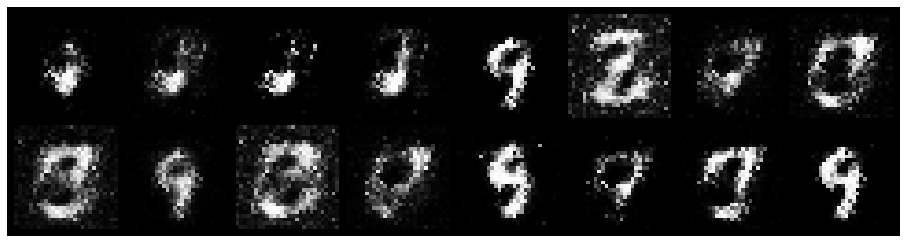

Epoch: [8/20], Batch Num: [200/600]
Discriminator Loss: 0.6476, Generator Loss: 2.3366
D(x): 0.8307, D(G(z)): 0.2293
Epoch: [8/20], Batch Num: [201/600]
Discriminator Loss: 0.6103, Generator Loss: 2.3870
D(x): 0.8578, D(G(z)): 0.2146
Epoch: [8/20], Batch Num: [202/600]
Discriminator Loss: 0.7153, Generator Loss: 2.3310
D(x): 0.7563, D(G(z)): 0.1787
Epoch: [8/20], Batch Num: [203/600]
Discriminator Loss: 0.4653, Generator Loss: 2.2862
D(x): 0.8281, D(G(z)): 0.1415
Epoch: [8/20], Batch Num: [204/600]
Discriminator Loss: 0.6198, Generator Loss: 2.4709
D(x): 0.8726, D(G(z)): 0.2470
Epoch: [8/20], Batch Num: [205/600]
Discriminator Loss: 0.6675, Generator Loss: 2.2741
D(x): 0.8215, D(G(z)): 0.2212
Epoch: [8/20], Batch Num: [206/600]
Discriminator Loss: 0.6045, Generator Loss: 2.2115
D(x): 0.8406, D(G(z)): 0.2093
Epoch: [8/20], Batch Num: [207/600]
Discriminator Loss: 0.6763, Generator Loss: 1.9652
D(x): 0.8140, D(G(z)): 0.2303
Epoch: [8/20], Batch Num: [208/600]
Discriminator Loss: 0.7782, 

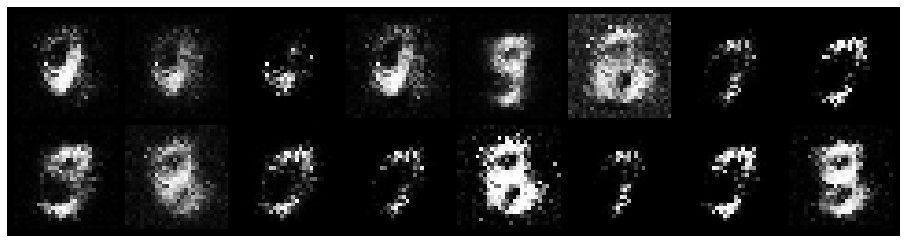

Epoch: [8/20], Batch Num: [300/600]
Discriminator Loss: 0.3968, Generator Loss: 3.2484
D(x): 0.8827, D(G(z)): 0.1254
Epoch: [8/20], Batch Num: [301/600]
Discriminator Loss: 0.3464, Generator Loss: 2.9154
D(x): 0.8814, D(G(z)): 0.0987
Epoch: [8/20], Batch Num: [302/600]
Discriminator Loss: 0.4272, Generator Loss: 2.5844
D(x): 0.8600, D(G(z)): 0.1184
Epoch: [8/20], Batch Num: [303/600]
Discriminator Loss: 0.3325, Generator Loss: 2.5573
D(x): 0.9361, D(G(z)): 0.1659
Epoch: [8/20], Batch Num: [304/600]
Discriminator Loss: 0.3448, Generator Loss: 3.0346
D(x): 0.9587, D(G(z)): 0.1773
Epoch: [8/20], Batch Num: [305/600]
Discriminator Loss: 0.5435, Generator Loss: 3.2643
D(x): 0.8500, D(G(z)): 0.1777
Epoch: [8/20], Batch Num: [306/600]
Discriminator Loss: 0.4212, Generator Loss: 3.5674
D(x): 0.8589, D(G(z)): 0.0962
Epoch: [8/20], Batch Num: [307/600]
Discriminator Loss: 0.6371, Generator Loss: 3.3388
D(x): 0.7568, D(G(z)): 0.0965
Epoch: [8/20], Batch Num: [308/600]
Discriminator Loss: 0.4135, 

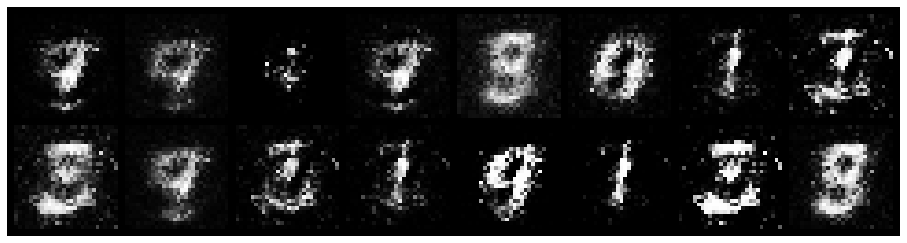

Epoch: [8/20], Batch Num: [400/600]
Discriminator Loss: 0.5716, Generator Loss: 2.4519
D(x): 0.8183, D(G(z)): 0.1465
Epoch: [8/20], Batch Num: [401/600]
Discriminator Loss: 0.4507, Generator Loss: 2.1543
D(x): 0.8998, D(G(z)): 0.1801
Epoch: [8/20], Batch Num: [402/600]
Discriminator Loss: 0.4920, Generator Loss: 2.4077
D(x): 0.8700, D(G(z)): 0.1827
Epoch: [8/20], Batch Num: [403/600]
Discriminator Loss: 0.4590, Generator Loss: 2.2292
D(x): 0.8690, D(G(z)): 0.1881
Epoch: [8/20], Batch Num: [404/600]
Discriminator Loss: 0.5706, Generator Loss: 2.5750
D(x): 0.8872, D(G(z)): 0.2227
Epoch: [8/20], Batch Num: [405/600]
Discriminator Loss: 0.5144, Generator Loss: 2.6282
D(x): 0.8088, D(G(z)): 0.1281
Epoch: [8/20], Batch Num: [406/600]
Discriminator Loss: 0.6311, Generator Loss: 2.4248
D(x): 0.7780, D(G(z)): 0.1530
Epoch: [8/20], Batch Num: [407/600]
Discriminator Loss: 0.6526, Generator Loss: 2.4633
D(x): 0.8014, D(G(z)): 0.1797
Epoch: [8/20], Batch Num: [408/600]
Discriminator Loss: 0.7823, 

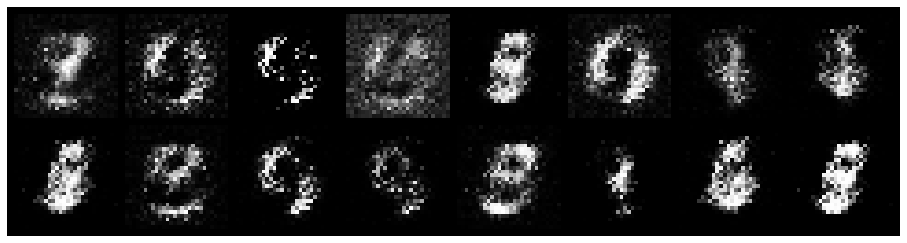

Epoch: [8/20], Batch Num: [500/600]
Discriminator Loss: 0.5277, Generator Loss: 2.1441
D(x): 0.8357, D(G(z)): 0.2115
Epoch: [8/20], Batch Num: [501/600]
Discriminator Loss: 0.5324, Generator Loss: 2.1596
D(x): 0.7985, D(G(z)): 0.1782
Epoch: [8/20], Batch Num: [502/600]
Discriminator Loss: 0.6919, Generator Loss: 2.1842
D(x): 0.7922, D(G(z)): 0.2450
Epoch: [8/20], Batch Num: [503/600]
Discriminator Loss: 0.7000, Generator Loss: 2.3486
D(x): 0.8067, D(G(z)): 0.2510
Epoch: [8/20], Batch Num: [504/600]
Discriminator Loss: 0.5641, Generator Loss: 2.4328
D(x): 0.8101, D(G(z)): 0.2107
Epoch: [8/20], Batch Num: [505/600]
Discriminator Loss: 0.6254, Generator Loss: 2.3637
D(x): 0.7567, D(G(z)): 0.1805
Epoch: [8/20], Batch Num: [506/600]
Discriminator Loss: 0.6058, Generator Loss: 2.2919
D(x): 0.8311, D(G(z)): 0.2150
Epoch: [8/20], Batch Num: [507/600]
Discriminator Loss: 0.7447, Generator Loss: 2.3025
D(x): 0.8154, D(G(z)): 0.2603
Epoch: [8/20], Batch Num: [508/600]
Discriminator Loss: 0.6151, 

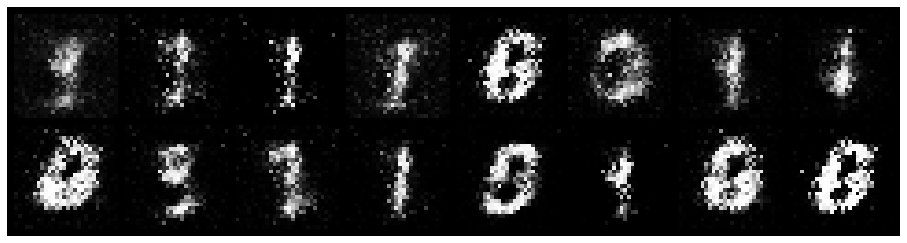

Epoch: [9/20], Batch Num: [0/600]
Discriminator Loss: 0.7457, Generator Loss: 2.4994
D(x): 0.6869, D(G(z)): 0.1316
Epoch: [9/20], Batch Num: [1/600]
Discriminator Loss: 0.5122, Generator Loss: 2.3394
D(x): 0.7949, D(G(z)): 0.1520
Epoch: [9/20], Batch Num: [2/600]
Discriminator Loss: 0.6908, Generator Loss: 1.7992
D(x): 0.7301, D(G(z)): 0.1704
Epoch: [9/20], Batch Num: [3/600]
Discriminator Loss: 0.5421, Generator Loss: 1.8640
D(x): 0.8660, D(G(z)): 0.2468
Epoch: [9/20], Batch Num: [4/600]
Discriminator Loss: 0.6093, Generator Loss: 1.7480
D(x): 0.8662, D(G(z)): 0.2714
Epoch: [9/20], Batch Num: [5/600]
Discriminator Loss: 0.7208, Generator Loss: 2.0557
D(x): 0.8312, D(G(z)): 0.3020
Epoch: [9/20], Batch Num: [6/600]
Discriminator Loss: 0.7709, Generator Loss: 2.4356
D(x): 0.7948, D(G(z)): 0.2377
Epoch: [9/20], Batch Num: [7/600]
Discriminator Loss: 0.8196, Generator Loss: 2.4463
D(x): 0.7391, D(G(z)): 0.1767
Epoch: [9/20], Batch Num: [8/600]
Discriminator Loss: 0.5497, Generator Loss: 2.

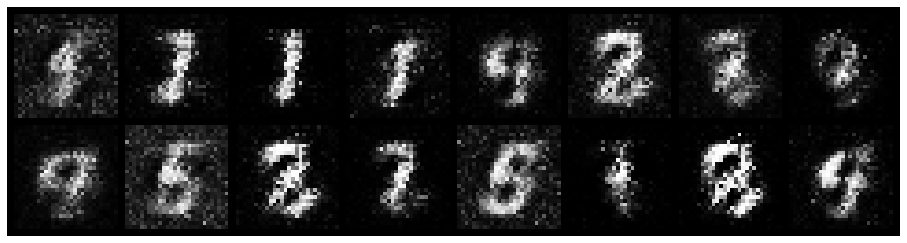

Epoch: [9/20], Batch Num: [100/600]
Discriminator Loss: 0.8567, Generator Loss: 2.6325
D(x): 0.6632, D(G(z)): 0.1547
Epoch: [9/20], Batch Num: [101/600]
Discriminator Loss: 0.8411, Generator Loss: 2.2258
D(x): 0.6580, D(G(z)): 0.1531
Epoch: [9/20], Batch Num: [102/600]
Discriminator Loss: 0.7059, Generator Loss: 1.8072
D(x): 0.7622, D(G(z)): 0.2188
Epoch: [9/20], Batch Num: [103/600]
Discriminator Loss: 0.7571, Generator Loss: 1.7987
D(x): 0.8242, D(G(z)): 0.2901
Epoch: [9/20], Batch Num: [104/600]
Discriminator Loss: 0.7385, Generator Loss: 1.8645
D(x): 0.8498, D(G(z)): 0.3241
Epoch: [9/20], Batch Num: [105/600]
Discriminator Loss: 1.0068, Generator Loss: 1.8582
D(x): 0.7573, D(G(z)): 0.3467
Epoch: [9/20], Batch Num: [106/600]
Discriminator Loss: 0.9218, Generator Loss: 1.9684
D(x): 0.7790, D(G(z)): 0.3189
Epoch: [9/20], Batch Num: [107/600]
Discriminator Loss: 0.8632, Generator Loss: 1.9405
D(x): 0.7136, D(G(z)): 0.2517
Epoch: [9/20], Batch Num: [108/600]
Discriminator Loss: 0.9374, 

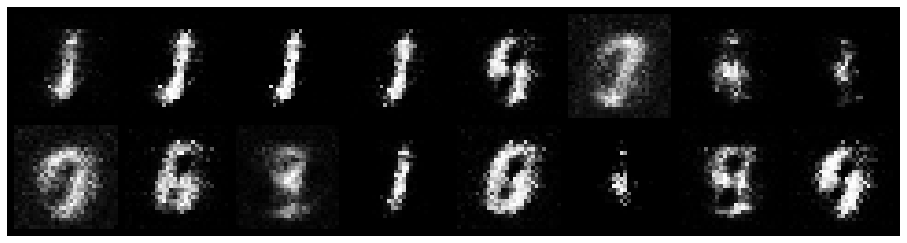

Epoch: [9/20], Batch Num: [200/600]
Discriminator Loss: 1.1654, Generator Loss: 1.6942
D(x): 0.6112, D(G(z)): 0.2225
Epoch: [9/20], Batch Num: [201/600]
Discriminator Loss: 0.9916, Generator Loss: 1.6587
D(x): 0.6794, D(G(z)): 0.2308
Epoch: [9/20], Batch Num: [202/600]
Discriminator Loss: 1.0239, Generator Loss: 1.4560
D(x): 0.7144, D(G(z)): 0.3158
Epoch: [9/20], Batch Num: [203/600]
Discriminator Loss: 0.9605, Generator Loss: 1.2713
D(x): 0.7253, D(G(z)): 0.2984
Epoch: [9/20], Batch Num: [204/600]
Discriminator Loss: 0.8710, Generator Loss: 1.4606
D(x): 0.7538, D(G(z)): 0.3116
Epoch: [9/20], Batch Num: [205/600]
Discriminator Loss: 0.8713, Generator Loss: 1.5672
D(x): 0.7775, D(G(z)): 0.3154
Epoch: [9/20], Batch Num: [206/600]
Discriminator Loss: 0.7363, Generator Loss: 1.7656
D(x): 0.7478, D(G(z)): 0.2513
Epoch: [9/20], Batch Num: [207/600]
Discriminator Loss: 0.7118, Generator Loss: 1.8382
D(x): 0.7768, D(G(z)): 0.2695
Epoch: [9/20], Batch Num: [208/600]
Discriminator Loss: 0.7655, 

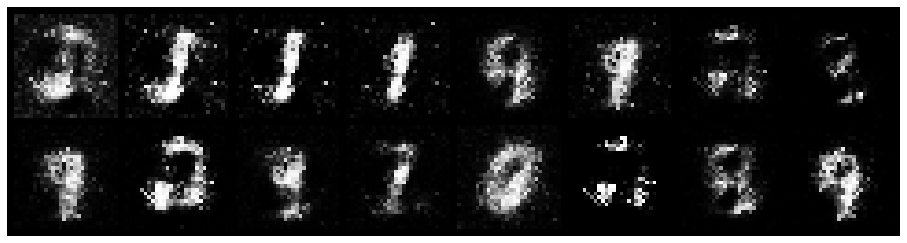

Epoch: [9/20], Batch Num: [300/600]
Discriminator Loss: 0.9829, Generator Loss: 2.0918
D(x): 0.6945, D(G(z)): 0.2124
Epoch: [9/20], Batch Num: [301/600]
Discriminator Loss: 0.7103, Generator Loss: 1.7242
D(x): 0.7842, D(G(z)): 0.2328
Epoch: [9/20], Batch Num: [302/600]
Discriminator Loss: 0.8695, Generator Loss: 1.8751
D(x): 0.8014, D(G(z)): 0.3059
Epoch: [9/20], Batch Num: [303/600]
Discriminator Loss: 0.7735, Generator Loss: 1.8575
D(x): 0.7804, D(G(z)): 0.2620
Epoch: [9/20], Batch Num: [304/600]
Discriminator Loss: 0.7027, Generator Loss: 2.1146
D(x): 0.7892, D(G(z)): 0.2231
Epoch: [9/20], Batch Num: [305/600]
Discriminator Loss: 0.8414, Generator Loss: 2.2532
D(x): 0.7301, D(G(z)): 0.2254
Epoch: [9/20], Batch Num: [306/600]
Discriminator Loss: 0.7697, Generator Loss: 2.0757
D(x): 0.7343, D(G(z)): 0.2087
Epoch: [9/20], Batch Num: [307/600]
Discriminator Loss: 0.7911, Generator Loss: 1.8964
D(x): 0.7435, D(G(z)): 0.1911
Epoch: [9/20], Batch Num: [308/600]
Discriminator Loss: 0.6439, 

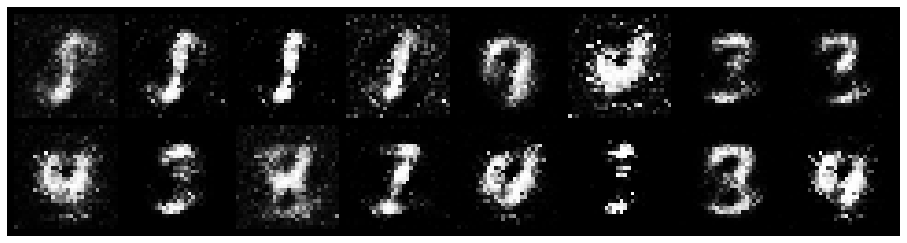

Epoch: [9/20], Batch Num: [400/600]
Discriminator Loss: 0.9254, Generator Loss: 2.1685
D(x): 0.6710, D(G(z)): 0.1941
Epoch: [9/20], Batch Num: [401/600]
Discriminator Loss: 0.8983, Generator Loss: 1.9301
D(x): 0.7581, D(G(z)): 0.3080
Epoch: [9/20], Batch Num: [402/600]
Discriminator Loss: 0.8776, Generator Loss: 1.7252
D(x): 0.7897, D(G(z)): 0.3094
Epoch: [9/20], Batch Num: [403/600]
Discriminator Loss: 0.8986, Generator Loss: 1.8216
D(x): 0.7207, D(G(z)): 0.2903
Epoch: [9/20], Batch Num: [404/600]
Discriminator Loss: 0.6998, Generator Loss: 1.9304
D(x): 0.7718, D(G(z)): 0.2284
Epoch: [9/20], Batch Num: [405/600]
Discriminator Loss: 0.7954, Generator Loss: 2.1712
D(x): 0.7316, D(G(z)): 0.2463
Epoch: [9/20], Batch Num: [406/600]
Discriminator Loss: 0.8461, Generator Loss: 2.2207
D(x): 0.7315, D(G(z)): 0.2357
Epoch: [9/20], Batch Num: [407/600]
Discriminator Loss: 0.7413, Generator Loss: 2.1253
D(x): 0.7409, D(G(z)): 0.2145
Epoch: [9/20], Batch Num: [408/600]
Discriminator Loss: 0.6761, 

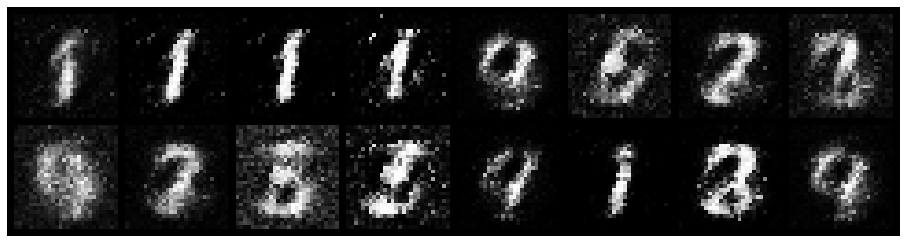

Epoch: [9/20], Batch Num: [500/600]
Discriminator Loss: 0.7266, Generator Loss: 2.2281
D(x): 0.6988, D(G(z)): 0.1612
Epoch: [9/20], Batch Num: [501/600]
Discriminator Loss: 0.7302, Generator Loss: 1.8157
D(x): 0.7039, D(G(z)): 0.1945
Epoch: [9/20], Batch Num: [502/600]
Discriminator Loss: 0.5799, Generator Loss: 1.7299
D(x): 0.8449, D(G(z)): 0.2393
Epoch: [9/20], Batch Num: [503/600]
Discriminator Loss: 0.5350, Generator Loss: 1.6512
D(x): 0.8833, D(G(z)): 0.2619
Epoch: [9/20], Batch Num: [504/600]
Discriminator Loss: 0.5988, Generator Loss: 1.9017
D(x): 0.8673, D(G(z)): 0.2919
Epoch: [9/20], Batch Num: [505/600]
Discriminator Loss: 0.6199, Generator Loss: 2.2964
D(x): 0.8427, D(G(z)): 0.2588
Epoch: [9/20], Batch Num: [506/600]
Discriminator Loss: 0.6831, Generator Loss: 2.5040
D(x): 0.7313, D(G(z)): 0.1719
Epoch: [9/20], Batch Num: [507/600]
Discriminator Loss: 0.5963, Generator Loss: 2.4026
D(x): 0.7267, D(G(z)): 0.1228
Epoch: [9/20], Batch Num: [508/600]
Discriminator Loss: 0.6710, 

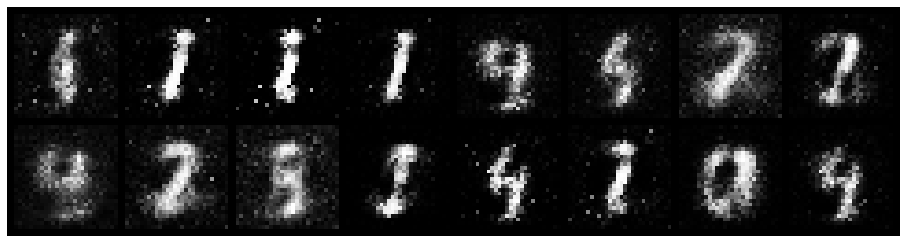

Epoch: [10/20], Batch Num: [0/600]
Discriminator Loss: 0.9283, Generator Loss: 2.1273
D(x): 0.6943, D(G(z)): 0.1679
Epoch: [10/20], Batch Num: [1/600]
Discriminator Loss: 0.5770, Generator Loss: 1.6858
D(x): 0.8065, D(G(z)): 0.1970
Epoch: [10/20], Batch Num: [2/600]
Discriminator Loss: 0.8165, Generator Loss: 1.7393
D(x): 0.8297, D(G(z)): 0.3097
Epoch: [10/20], Batch Num: [3/600]
Discriminator Loss: 0.8083, Generator Loss: 1.9790
D(x): 0.8345, D(G(z)): 0.2946
Epoch: [10/20], Batch Num: [4/600]
Discriminator Loss: 0.7233, Generator Loss: 2.1770
D(x): 0.7623, D(G(z)): 0.1940
Epoch: [10/20], Batch Num: [5/600]
Discriminator Loss: 0.7211, Generator Loss: 2.3544
D(x): 0.7646, D(G(z)): 0.2140
Epoch: [10/20], Batch Num: [6/600]
Discriminator Loss: 0.8258, Generator Loss: 2.0821
D(x): 0.7078, D(G(z)): 0.1750
Epoch: [10/20], Batch Num: [7/600]
Discriminator Loss: 0.8890, Generator Loss: 1.6155
D(x): 0.7676, D(G(z)): 0.2652
Epoch: [10/20], Batch Num: [8/600]
Discriminator Loss: 0.8805, Generator

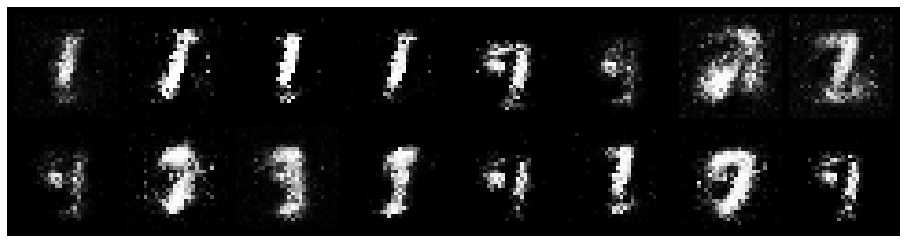

Epoch: [10/20], Batch Num: [100/600]
Discriminator Loss: 0.7479, Generator Loss: 1.6347
D(x): 0.7829, D(G(z)): 0.2523
Epoch: [10/20], Batch Num: [101/600]
Discriminator Loss: 0.7637, Generator Loss: 1.7574
D(x): 0.7810, D(G(z)): 0.2678
Epoch: [10/20], Batch Num: [102/600]
Discriminator Loss: 0.7878, Generator Loss: 1.7106
D(x): 0.7697, D(G(z)): 0.2632
Epoch: [10/20], Batch Num: [103/600]
Discriminator Loss: 0.7756, Generator Loss: 1.8365
D(x): 0.7602, D(G(z)): 0.2398
Epoch: [10/20], Batch Num: [104/600]
Discriminator Loss: 0.7138, Generator Loss: 1.9370
D(x): 0.7599, D(G(z)): 0.2245
Epoch: [10/20], Batch Num: [105/600]
Discriminator Loss: 0.8269, Generator Loss: 1.8975
D(x): 0.7154, D(G(z)): 0.2059
Epoch: [10/20], Batch Num: [106/600]
Discriminator Loss: 0.6498, Generator Loss: 1.7698
D(x): 0.7641, D(G(z)): 0.2019
Epoch: [10/20], Batch Num: [107/600]
Discriminator Loss: 0.7146, Generator Loss: 1.5522
D(x): 0.7288, D(G(z)): 0.2208
Epoch: [10/20], Batch Num: [108/600]
Discriminator Loss:

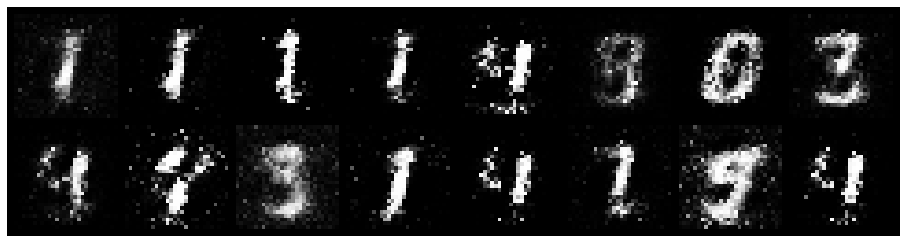

Epoch: [10/20], Batch Num: [200/600]
Discriminator Loss: 0.4927, Generator Loss: 2.3886
D(x): 0.8565, D(G(z)): 0.1888
Epoch: [10/20], Batch Num: [201/600]
Discriminator Loss: 0.3267, Generator Loss: 2.7734
D(x): 0.9134, D(G(z)): 0.1436
Epoch: [10/20], Batch Num: [202/600]
Discriminator Loss: 0.4929, Generator Loss: 2.6624
D(x): 0.8079, D(G(z)): 0.1090
Epoch: [10/20], Batch Num: [203/600]
Discriminator Loss: 0.5559, Generator Loss: 2.4216
D(x): 0.7938, D(G(z)): 0.1439
Epoch: [10/20], Batch Num: [204/600]
Discriminator Loss: 0.4953, Generator Loss: 1.9831
D(x): 0.8238, D(G(z)): 0.1678
Epoch: [10/20], Batch Num: [205/600]
Discriminator Loss: 0.4067, Generator Loss: 1.9327
D(x): 0.9214, D(G(z)): 0.2212
Epoch: [10/20], Batch Num: [206/600]
Discriminator Loss: 0.4304, Generator Loss: 1.9867
D(x): 0.8937, D(G(z)): 0.2120
Epoch: [10/20], Batch Num: [207/600]
Discriminator Loss: 0.4252, Generator Loss: 2.3102
D(x): 0.8750, D(G(z)): 0.1856
Epoch: [10/20], Batch Num: [208/600]
Discriminator Loss:

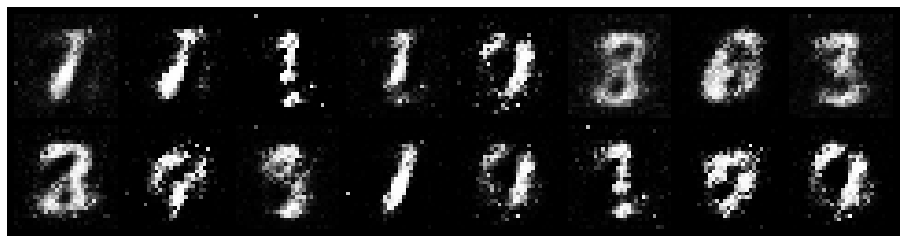

Epoch: [10/20], Batch Num: [300/600]
Discriminator Loss: 0.6542, Generator Loss: 2.4584
D(x): 0.8445, D(G(z)): 0.2352
Epoch: [10/20], Batch Num: [301/600]
Discriminator Loss: 0.4369, Generator Loss: 2.6489
D(x): 0.9081, D(G(z)): 0.1854
Epoch: [10/20], Batch Num: [302/600]
Discriminator Loss: 0.6945, Generator Loss: 2.9052
D(x): 0.7882, D(G(z)): 0.1610
Epoch: [10/20], Batch Num: [303/600]
Discriminator Loss: 0.5873, Generator Loss: 2.7385
D(x): 0.7795, D(G(z)): 0.1269
Epoch: [10/20], Batch Num: [304/600]
Discriminator Loss: 0.6456, Generator Loss: 2.3284
D(x): 0.8042, D(G(z)): 0.1455
Epoch: [10/20], Batch Num: [305/600]
Discriminator Loss: 0.7349, Generator Loss: 1.9270
D(x): 0.7827, D(G(z)): 0.1996
Epoch: [10/20], Batch Num: [306/600]
Discriminator Loss: 0.6915, Generator Loss: 1.6965
D(x): 0.8410, D(G(z)): 0.2583
Epoch: [10/20], Batch Num: [307/600]
Discriminator Loss: 0.8437, Generator Loss: 2.5349
D(x): 0.8578, D(G(z)): 0.3281
Epoch: [10/20], Batch Num: [308/600]
Discriminator Loss:

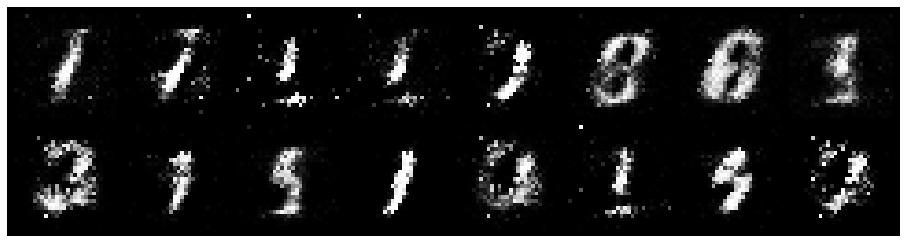

Epoch: [10/20], Batch Num: [400/600]
Discriminator Loss: 0.4347, Generator Loss: 2.1671
D(x): 0.8670, D(G(z)): 0.1711
Epoch: [10/20], Batch Num: [401/600]
Discriminator Loss: 0.4226, Generator Loss: 2.1621
D(x): 0.9014, D(G(z)): 0.1922
Epoch: [10/20], Batch Num: [402/600]
Discriminator Loss: 0.4398, Generator Loss: 2.3613
D(x): 0.8570, D(G(z)): 0.1673
Epoch: [10/20], Batch Num: [403/600]
Discriminator Loss: 0.4655, Generator Loss: 2.2714
D(x): 0.8235, D(G(z)): 0.1544
Epoch: [10/20], Batch Num: [404/600]
Discriminator Loss: 0.5361, Generator Loss: 2.2002
D(x): 0.8082, D(G(z)): 0.1785
Epoch: [10/20], Batch Num: [405/600]
Discriminator Loss: 0.7068, Generator Loss: 2.4206
D(x): 0.8049, D(G(z)): 0.2185
Epoch: [10/20], Batch Num: [406/600]
Discriminator Loss: 0.6037, Generator Loss: 2.2958
D(x): 0.8557, D(G(z)): 0.2184
Epoch: [10/20], Batch Num: [407/600]
Discriminator Loss: 0.6247, Generator Loss: 2.3326
D(x): 0.8124, D(G(z)): 0.2055
Epoch: [10/20], Batch Num: [408/600]
Discriminator Loss:

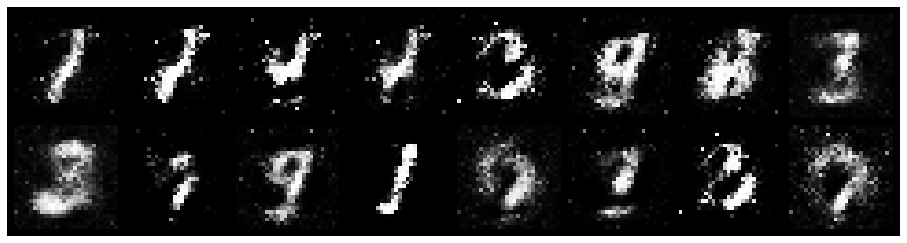

Epoch: [10/20], Batch Num: [500/600]
Discriminator Loss: 1.0468, Generator Loss: 2.0711
D(x): 0.6562, D(G(z)): 0.2279
Epoch: [10/20], Batch Num: [501/600]
Discriminator Loss: 0.9427, Generator Loss: 1.8403
D(x): 0.6713, D(G(z)): 0.2182
Epoch: [10/20], Batch Num: [502/600]
Discriminator Loss: 0.9940, Generator Loss: 1.7546
D(x): 0.7319, D(G(z)): 0.3230
Epoch: [10/20], Batch Num: [503/600]
Discriminator Loss: 0.9971, Generator Loss: 1.6715
D(x): 0.7247, D(G(z)): 0.2980
Epoch: [10/20], Batch Num: [504/600]
Discriminator Loss: 1.0889, Generator Loss: 1.6817
D(x): 0.6512, D(G(z)): 0.3033
Epoch: [10/20], Batch Num: [505/600]
Discriminator Loss: 0.9364, Generator Loss: 2.1501
D(x): 0.7547, D(G(z)): 0.3290
Epoch: [10/20], Batch Num: [506/600]
Discriminator Loss: 0.9493, Generator Loss: 2.1446
D(x): 0.6668, D(G(z)): 0.2330
Epoch: [10/20], Batch Num: [507/600]
Discriminator Loss: 0.8073, Generator Loss: 1.9942
D(x): 0.7292, D(G(z)): 0.2276
Epoch: [10/20], Batch Num: [508/600]
Discriminator Loss:

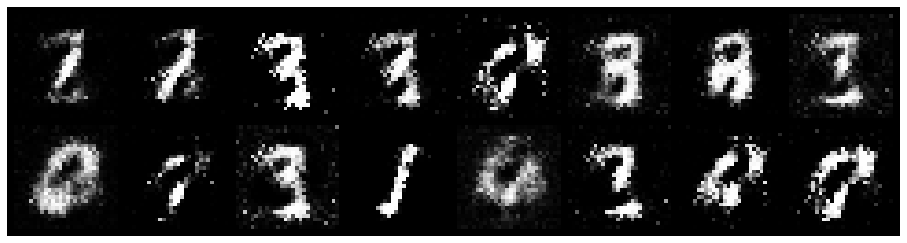

Epoch: [11/20], Batch Num: [0/600]
Discriminator Loss: 0.6647, Generator Loss: 2.4376
D(x): 0.7976, D(G(z)): 0.2079
Epoch: [11/20], Batch Num: [1/600]
Discriminator Loss: 0.9287, Generator Loss: 2.0628
D(x): 0.7229, D(G(z)): 0.1963
Epoch: [11/20], Batch Num: [2/600]
Discriminator Loss: 0.8049, Generator Loss: 1.9645
D(x): 0.7593, D(G(z)): 0.2363
Epoch: [11/20], Batch Num: [3/600]
Discriminator Loss: 0.7259, Generator Loss: 1.8717
D(x): 0.8025, D(G(z)): 0.2272
Epoch: [11/20], Batch Num: [4/600]
Discriminator Loss: 0.9079, Generator Loss: 1.7935
D(x): 0.7554, D(G(z)): 0.2594
Epoch: [11/20], Batch Num: [5/600]
Discriminator Loss: 0.9061, Generator Loss: 1.9384
D(x): 0.7432, D(G(z)): 0.2650
Epoch: [11/20], Batch Num: [6/600]
Discriminator Loss: 1.0875, Generator Loss: 1.8146
D(x): 0.6992, D(G(z)): 0.3018
Epoch: [11/20], Batch Num: [7/600]
Discriminator Loss: 1.0357, Generator Loss: 1.8382
D(x): 0.7145, D(G(z)): 0.2875
Epoch: [11/20], Batch Num: [8/600]
Discriminator Loss: 0.9776, Generator

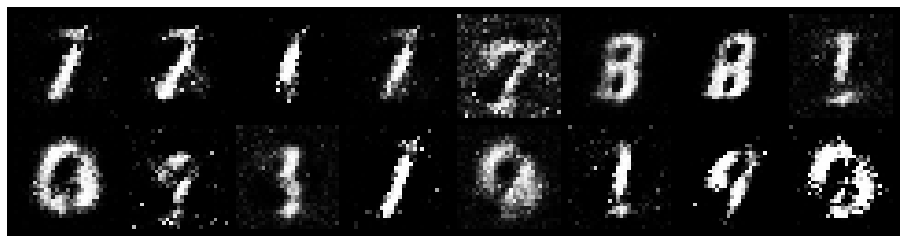

Epoch: [11/20], Batch Num: [100/600]
Discriminator Loss: 0.7273, Generator Loss: 2.5740
D(x): 0.7382, D(G(z)): 0.1486
Epoch: [11/20], Batch Num: [101/600]
Discriminator Loss: 0.7016, Generator Loss: 2.3493
D(x): 0.8127, D(G(z)): 0.2153
Epoch: [11/20], Batch Num: [102/600]
Discriminator Loss: 0.7406, Generator Loss: 2.1240
D(x): 0.7974, D(G(z)): 0.2253
Epoch: [11/20], Batch Num: [103/600]
Discriminator Loss: 0.8578, Generator Loss: 1.9001
D(x): 0.7615, D(G(z)): 0.2362
Epoch: [11/20], Batch Num: [104/600]
Discriminator Loss: 0.7950, Generator Loss: 1.9040
D(x): 0.7790, D(G(z)): 0.2274
Epoch: [11/20], Batch Num: [105/600]
Discriminator Loss: 0.7353, Generator Loss: 1.8224
D(x): 0.8164, D(G(z)): 0.2516
Epoch: [11/20], Batch Num: [106/600]
Discriminator Loss: 0.7508, Generator Loss: 2.1929
D(x): 0.7885, D(G(z)): 0.2224
Epoch: [11/20], Batch Num: [107/600]
Discriminator Loss: 0.7776, Generator Loss: 2.2218
D(x): 0.7882, D(G(z)): 0.2229
Epoch: [11/20], Batch Num: [108/600]
Discriminator Loss:

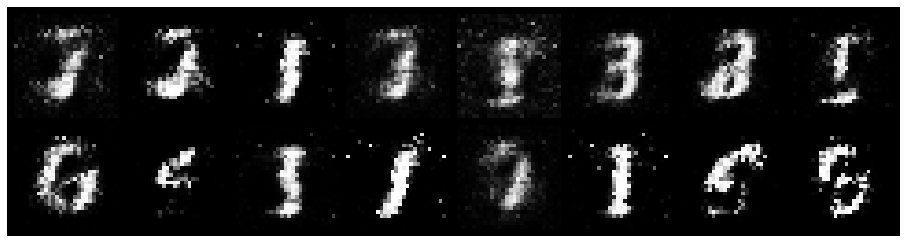

Epoch: [11/20], Batch Num: [200/600]
Discriminator Loss: 0.7082, Generator Loss: 1.8718
D(x): 0.7541, D(G(z)): 0.1971
Epoch: [11/20], Batch Num: [201/600]
Discriminator Loss: 0.8504, Generator Loss: 1.6625
D(x): 0.7399, D(G(z)): 0.2353
Epoch: [11/20], Batch Num: [202/600]
Discriminator Loss: 0.7066, Generator Loss: 1.7424
D(x): 0.8174, D(G(z)): 0.2749
Epoch: [11/20], Batch Num: [203/600]
Discriminator Loss: 0.8291, Generator Loss: 2.0351
D(x): 0.7673, D(G(z)): 0.2755
Epoch: [11/20], Batch Num: [204/600]
Discriminator Loss: 0.7754, Generator Loss: 2.1046
D(x): 0.7447, D(G(z)): 0.2074
Epoch: [11/20], Batch Num: [205/600]
Discriminator Loss: 0.9337, Generator Loss: 1.5807
D(x): 0.7158, D(G(z)): 0.2265
Epoch: [11/20], Batch Num: [206/600]
Discriminator Loss: 0.6962, Generator Loss: 1.8472
D(x): 0.8049, D(G(z)): 0.2571
Epoch: [11/20], Batch Num: [207/600]
Discriminator Loss: 0.8216, Generator Loss: 2.0347
D(x): 0.7528, D(G(z)): 0.2548
Epoch: [11/20], Batch Num: [208/600]
Discriminator Loss:

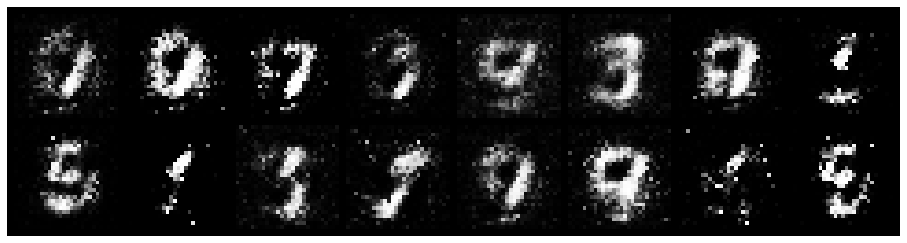

Epoch: [11/20], Batch Num: [300/600]
Discriminator Loss: 0.5531, Generator Loss: 2.0452
D(x): 0.8493, D(G(z)): 0.2140
Epoch: [11/20], Batch Num: [301/600]
Discriminator Loss: 0.7822, Generator Loss: 1.8982
D(x): 0.7684, D(G(z)): 0.2493
Epoch: [11/20], Batch Num: [302/600]
Discriminator Loss: 0.8508, Generator Loss: 1.9826
D(x): 0.7713, D(G(z)): 0.2898
Epoch: [11/20], Batch Num: [303/600]
Discriminator Loss: 0.7893, Generator Loss: 2.4055
D(x): 0.8047, D(G(z)): 0.2718
Epoch: [11/20], Batch Num: [304/600]
Discriminator Loss: 0.7822, Generator Loss: 2.0308
D(x): 0.7293, D(G(z)): 0.2083
Epoch: [11/20], Batch Num: [305/600]
Discriminator Loss: 0.8537, Generator Loss: 2.1334
D(x): 0.7094, D(G(z)): 0.2284
Epoch: [11/20], Batch Num: [306/600]
Discriminator Loss: 0.8059, Generator Loss: 1.9263
D(x): 0.7332, D(G(z)): 0.2356
Epoch: [11/20], Batch Num: [307/600]
Discriminator Loss: 0.8532, Generator Loss: 1.8573
D(x): 0.7687, D(G(z)): 0.2828
Epoch: [11/20], Batch Num: [308/600]
Discriminator Loss:

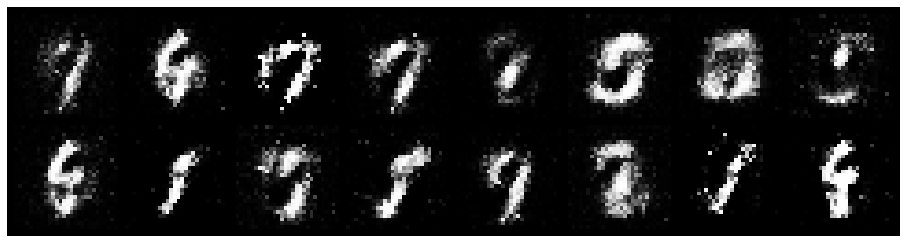

Epoch: [11/20], Batch Num: [400/600]
Discriminator Loss: 0.8100, Generator Loss: 1.7036
D(x): 0.7325, D(G(z)): 0.2682
Epoch: [11/20], Batch Num: [401/600]
Discriminator Loss: 1.0026, Generator Loss: 1.7363
D(x): 0.7150, D(G(z)): 0.3291
Epoch: [11/20], Batch Num: [402/600]
Discriminator Loss: 0.8045, Generator Loss: 1.5776
D(x): 0.7527, D(G(z)): 0.2711
Epoch: [11/20], Batch Num: [403/600]
Discriminator Loss: 0.9200, Generator Loss: 1.6292
D(x): 0.7049, D(G(z)): 0.2869
Epoch: [11/20], Batch Num: [404/600]
Discriminator Loss: 0.9474, Generator Loss: 1.6546
D(x): 0.7056, D(G(z)): 0.2910
Epoch: [11/20], Batch Num: [405/600]
Discriminator Loss: 0.8329, Generator Loss: 1.5445
D(x): 0.7470, D(G(z)): 0.2955
Epoch: [11/20], Batch Num: [406/600]
Discriminator Loss: 0.7642, Generator Loss: 1.7638
D(x): 0.8008, D(G(z)): 0.3144
Epoch: [11/20], Batch Num: [407/600]
Discriminator Loss: 0.7859, Generator Loss: 1.6806
D(x): 0.7328, D(G(z)): 0.2465
Epoch: [11/20], Batch Num: [408/600]
Discriminator Loss:

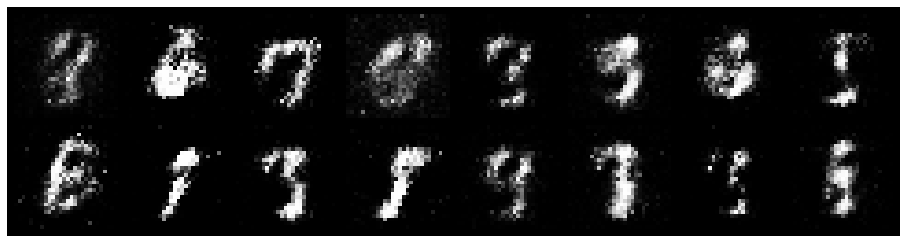

Epoch: [11/20], Batch Num: [500/600]
Discriminator Loss: 0.7991, Generator Loss: 1.8217
D(x): 0.7117, D(G(z)): 0.1920
Epoch: [11/20], Batch Num: [501/600]
Discriminator Loss: 0.7759, Generator Loss: 1.6114
D(x): 0.7675, D(G(z)): 0.2562
Epoch: [11/20], Batch Num: [502/600]
Discriminator Loss: 0.6907, Generator Loss: 1.7614
D(x): 0.8432, D(G(z)): 0.2966
Epoch: [11/20], Batch Num: [503/600]
Discriminator Loss: 0.6868, Generator Loss: 1.7351
D(x): 0.7968, D(G(z)): 0.2738
Epoch: [11/20], Batch Num: [504/600]
Discriminator Loss: 0.8167, Generator Loss: 1.8377
D(x): 0.7059, D(G(z)): 0.2260
Epoch: [11/20], Batch Num: [505/600]
Discriminator Loss: 0.9773, Generator Loss: 1.9627
D(x): 0.7014, D(G(z)): 0.2775
Epoch: [11/20], Batch Num: [506/600]
Discriminator Loss: 0.7319, Generator Loss: 2.0728
D(x): 0.7705, D(G(z)): 0.2410
Epoch: [11/20], Batch Num: [507/600]
Discriminator Loss: 0.8898, Generator Loss: 1.7619
D(x): 0.6811, D(G(z)): 0.2221
Epoch: [11/20], Batch Num: [508/600]
Discriminator Loss:

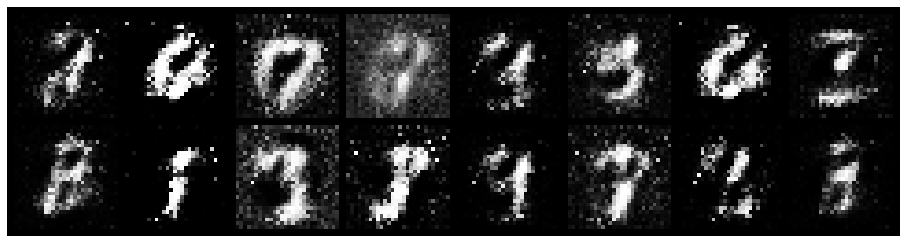

Epoch: [12/20], Batch Num: [0/600]
Discriminator Loss: 0.9191, Generator Loss: 1.7381
D(x): 0.6946, D(G(z)): 0.2825
Epoch: [12/20], Batch Num: [1/600]
Discriminator Loss: 0.8100, Generator Loss: 1.8386
D(x): 0.7435, D(G(z)): 0.2696
Epoch: [12/20], Batch Num: [2/600]
Discriminator Loss: 0.8761, Generator Loss: 1.8893
D(x): 0.7419, D(G(z)): 0.2761
Epoch: [12/20], Batch Num: [3/600]
Discriminator Loss: 0.7353, Generator Loss: 1.9979
D(x): 0.7859, D(G(z)): 0.2601
Epoch: [12/20], Batch Num: [4/600]
Discriminator Loss: 0.7543, Generator Loss: 2.0915
D(x): 0.7378, D(G(z)): 0.2266
Epoch: [12/20], Batch Num: [5/600]
Discriminator Loss: 0.6675, Generator Loss: 1.9495
D(x): 0.7296, D(G(z)): 0.1853
Epoch: [12/20], Batch Num: [6/600]
Discriminator Loss: 0.7600, Generator Loss: 1.4974
D(x): 0.7275, D(G(z)): 0.2160
Epoch: [12/20], Batch Num: [7/600]
Discriminator Loss: 0.6545, Generator Loss: 1.7925
D(x): 0.8116, D(G(z)): 0.2627
Epoch: [12/20], Batch Num: [8/600]
Discriminator Loss: 0.6043, Generator

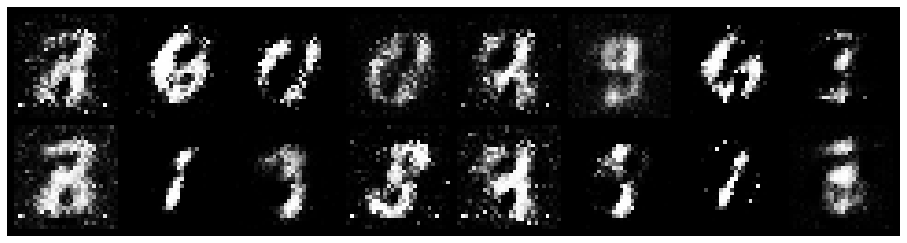

Epoch: [12/20], Batch Num: [100/600]
Discriminator Loss: 0.4498, Generator Loss: 2.1647
D(x): 0.8750, D(G(z)): 0.2080
Epoch: [12/20], Batch Num: [101/600]
Discriminator Loss: 0.6163, Generator Loss: 2.1229
D(x): 0.8249, D(G(z)): 0.2433
Epoch: [12/20], Batch Num: [102/600]
Discriminator Loss: 0.6539, Generator Loss: 2.2204
D(x): 0.8013, D(G(z)): 0.2307
Epoch: [12/20], Batch Num: [103/600]
Discriminator Loss: 0.6641, Generator Loss: 2.3236
D(x): 0.8279, D(G(z)): 0.2712
Epoch: [12/20], Batch Num: [104/600]
Discriminator Loss: 0.7536, Generator Loss: 2.4364
D(x): 0.7480, D(G(z)): 0.2240
Epoch: [12/20], Batch Num: [105/600]
Discriminator Loss: 0.7315, Generator Loss: 2.2828
D(x): 0.7346, D(G(z)): 0.1955
Epoch: [12/20], Batch Num: [106/600]
Discriminator Loss: 0.7674, Generator Loss: 2.0556
D(x): 0.7781, D(G(z)): 0.2500
Epoch: [12/20], Batch Num: [107/600]
Discriminator Loss: 0.8710, Generator Loss: 1.8701
D(x): 0.7742, D(G(z)): 0.3151
Epoch: [12/20], Batch Num: [108/600]
Discriminator Loss:

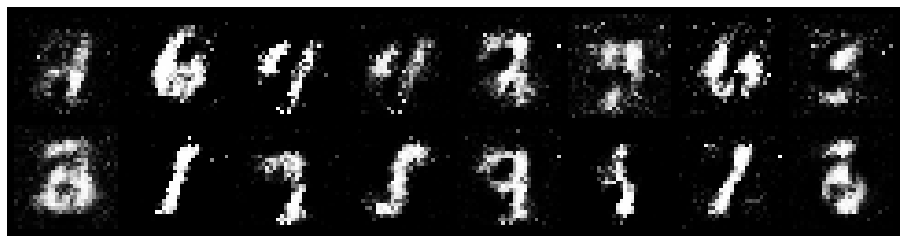

Epoch: [12/20], Batch Num: [200/600]
Discriminator Loss: 1.0241, Generator Loss: 1.4520
D(x): 0.8303, D(G(z)): 0.3773
Epoch: [12/20], Batch Num: [201/600]
Discriminator Loss: 0.8270, Generator Loss: 1.6288
D(x): 0.8308, D(G(z)): 0.3552
Epoch: [12/20], Batch Num: [202/600]
Discriminator Loss: 0.7742, Generator Loss: 2.0896
D(x): 0.8108, D(G(z)): 0.2928
Epoch: [12/20], Batch Num: [203/600]
Discriminator Loss: 0.8469, Generator Loss: 2.2795
D(x): 0.6946, D(G(z)): 0.2054
Epoch: [12/20], Batch Num: [204/600]
Discriminator Loss: 0.8630, Generator Loss: 1.9880
D(x): 0.6721, D(G(z)): 0.1822
Epoch: [12/20], Batch Num: [205/600]
Discriminator Loss: 0.8606, Generator Loss: 1.8322
D(x): 0.6891, D(G(z)): 0.2008
Epoch: [12/20], Batch Num: [206/600]
Discriminator Loss: 0.6416, Generator Loss: 1.4402
D(x): 0.7879, D(G(z)): 0.2368
Epoch: [12/20], Batch Num: [207/600]
Discriminator Loss: 0.8648, Generator Loss: 1.3998
D(x): 0.8096, D(G(z)): 0.3471
Epoch: [12/20], Batch Num: [208/600]
Discriminator Loss:

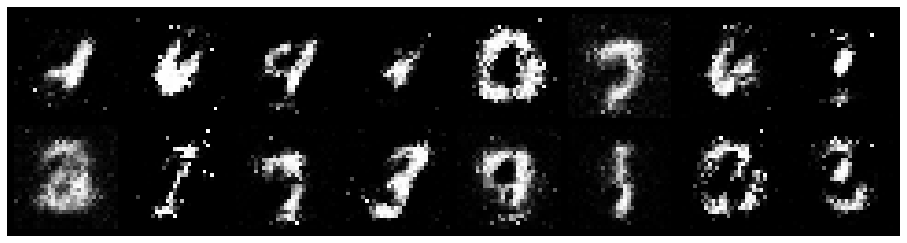

Epoch: [12/20], Batch Num: [300/600]
Discriminator Loss: 0.6319, Generator Loss: 2.2783
D(x): 0.8429, D(G(z)): 0.2345
Epoch: [12/20], Batch Num: [301/600]
Discriminator Loss: 0.8171, Generator Loss: 2.3726
D(x): 0.7419, D(G(z)): 0.2483
Epoch: [12/20], Batch Num: [302/600]
Discriminator Loss: 0.6769, Generator Loss: 2.2288
D(x): 0.7870, D(G(z)): 0.2098
Epoch: [12/20], Batch Num: [303/600]
Discriminator Loss: 0.7979, Generator Loss: 2.4811
D(x): 0.7603, D(G(z)): 0.2063
Epoch: [12/20], Batch Num: [304/600]
Discriminator Loss: 0.8967, Generator Loss: 2.1345
D(x): 0.7402, D(G(z)): 0.2271
Epoch: [12/20], Batch Num: [305/600]
Discriminator Loss: 0.6353, Generator Loss: 1.9585
D(x): 0.8075, D(G(z)): 0.1839
Epoch: [12/20], Batch Num: [306/600]
Discriminator Loss: 0.8551, Generator Loss: 1.9262
D(x): 0.7978, D(G(z)): 0.2687
Epoch: [12/20], Batch Num: [307/600]
Discriminator Loss: 0.9097, Generator Loss: 1.8457
D(x): 0.7682, D(G(z)): 0.2949
Epoch: [12/20], Batch Num: [308/600]
Discriminator Loss:

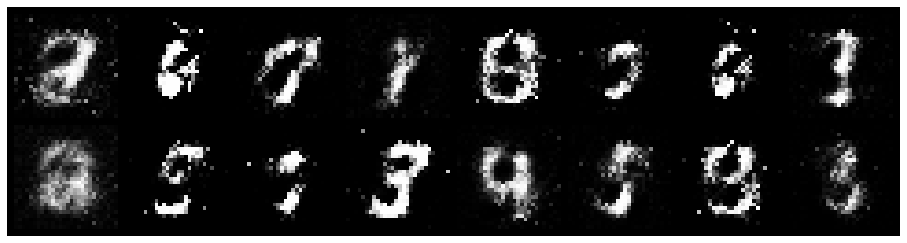

Epoch: [12/20], Batch Num: [400/600]
Discriminator Loss: 0.9269, Generator Loss: 1.5301
D(x): 0.7033, D(G(z)): 0.2866
Epoch: [12/20], Batch Num: [401/600]
Discriminator Loss: 0.8515, Generator Loss: 1.6665
D(x): 0.8181, D(G(z)): 0.3414
Epoch: [12/20], Batch Num: [402/600]
Discriminator Loss: 1.0764, Generator Loss: 1.5787
D(x): 0.7062, D(G(z)): 0.3437
Epoch: [12/20], Batch Num: [403/600]
Discriminator Loss: 0.9649, Generator Loss: 1.8656
D(x): 0.7214, D(G(z)): 0.3059
Epoch: [12/20], Batch Num: [404/600]
Discriminator Loss: 0.7796, Generator Loss: 2.0488
D(x): 0.7198, D(G(z)): 0.2353
Epoch: [12/20], Batch Num: [405/600]
Discriminator Loss: 0.9006, Generator Loss: 1.6834
D(x): 0.6585, D(G(z)): 0.2089
Epoch: [12/20], Batch Num: [406/600]
Discriminator Loss: 0.8504, Generator Loss: 1.7217
D(x): 0.7068, D(G(z)): 0.2251
Epoch: [12/20], Batch Num: [407/600]
Discriminator Loss: 0.8149, Generator Loss: 1.5541
D(x): 0.7368, D(G(z)): 0.2613
Epoch: [12/20], Batch Num: [408/600]
Discriminator Loss:

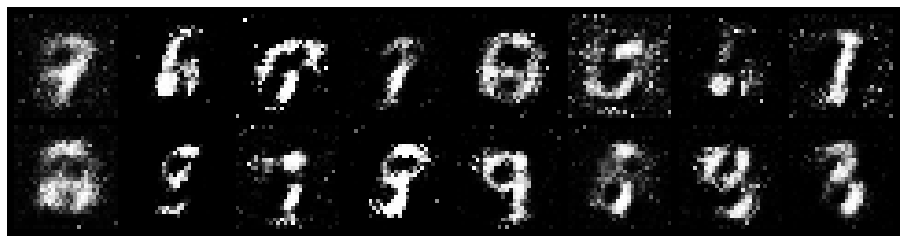

Epoch: [12/20], Batch Num: [500/600]
Discriminator Loss: 1.1141, Generator Loss: 1.1755
D(x): 0.6398, D(G(z)): 0.3314
Epoch: [12/20], Batch Num: [501/600]
Discriminator Loss: 1.1678, Generator Loss: 1.3680
D(x): 0.6889, D(G(z)): 0.4059
Epoch: [12/20], Batch Num: [502/600]
Discriminator Loss: 1.0477, Generator Loss: 1.2909
D(x): 0.6652, D(G(z)): 0.3339
Epoch: [12/20], Batch Num: [503/600]
Discriminator Loss: 0.8514, Generator Loss: 1.4035
D(x): 0.7023, D(G(z)): 0.2841
Epoch: [12/20], Batch Num: [504/600]
Discriminator Loss: 0.9761, Generator Loss: 1.4277
D(x): 0.6502, D(G(z)): 0.2955
Epoch: [12/20], Batch Num: [505/600]
Discriminator Loss: 0.8171, Generator Loss: 1.5085
D(x): 0.7456, D(G(z)): 0.3207
Epoch: [12/20], Batch Num: [506/600]
Discriminator Loss: 0.8747, Generator Loss: 1.5417
D(x): 0.6908, D(G(z)): 0.2910
Epoch: [12/20], Batch Num: [507/600]
Discriminator Loss: 0.8909, Generator Loss: 1.5102
D(x): 0.7031, D(G(z)): 0.3179
Epoch: [12/20], Batch Num: [508/600]
Discriminator Loss:

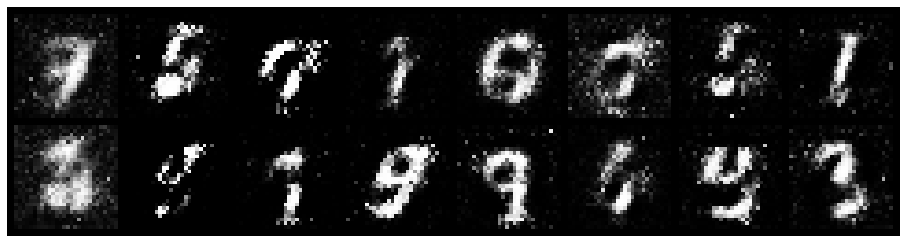

Epoch: [13/20], Batch Num: [0/600]
Discriminator Loss: 0.7309, Generator Loss: 1.9369
D(x): 0.6823, D(G(z)): 0.1875
Epoch: [13/20], Batch Num: [1/600]
Discriminator Loss: 0.6599, Generator Loss: 1.7224
D(x): 0.7306, D(G(z)): 0.1910
Epoch: [13/20], Batch Num: [2/600]
Discriminator Loss: 0.5599, Generator Loss: 1.4337
D(x): 0.8548, D(G(z)): 0.2680
Epoch: [13/20], Batch Num: [3/600]
Discriminator Loss: 0.5996, Generator Loss: 1.6253
D(x): 0.8439, D(G(z)): 0.2797
Epoch: [13/20], Batch Num: [4/600]
Discriminator Loss: 0.6018, Generator Loss: 1.8687
D(x): 0.8475, D(G(z)): 0.2852
Epoch: [13/20], Batch Num: [5/600]
Discriminator Loss: 0.5725, Generator Loss: 2.0601
D(x): 0.8044, D(G(z)): 0.2170
Epoch: [13/20], Batch Num: [6/600]
Discriminator Loss: 0.5556, Generator Loss: 2.3274
D(x): 0.8311, D(G(z)): 0.2263
Epoch: [13/20], Batch Num: [7/600]
Discriminator Loss: 0.5464, Generator Loss: 2.2025
D(x): 0.7711, D(G(z)): 0.1691
Epoch: [13/20], Batch Num: [8/600]
Discriminator Loss: 0.5532, Generator

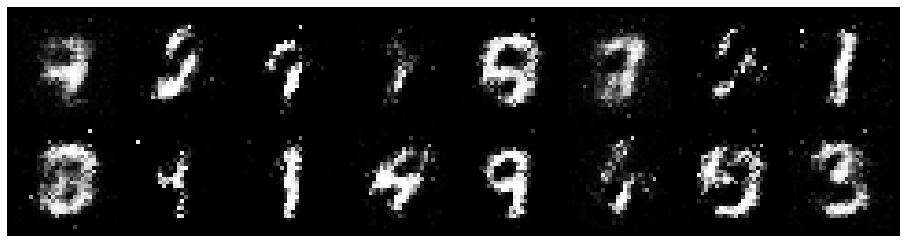

Epoch: [13/20], Batch Num: [100/600]
Discriminator Loss: 0.7463, Generator Loss: 1.6247
D(x): 0.7355, D(G(z)): 0.2268
Epoch: [13/20], Batch Num: [101/600]
Discriminator Loss: 0.7620, Generator Loss: 1.6551
D(x): 0.8438, D(G(z)): 0.3586
Epoch: [13/20], Batch Num: [102/600]
Discriminator Loss: 0.7437, Generator Loss: 1.9338
D(x): 0.8473, D(G(z)): 0.3135
Epoch: [13/20], Batch Num: [103/600]
Discriminator Loss: 0.6733, Generator Loss: 2.2018
D(x): 0.7540, D(G(z)): 0.2214
Epoch: [13/20], Batch Num: [104/600]
Discriminator Loss: 0.7663, Generator Loss: 2.0756
D(x): 0.7032, D(G(z)): 0.1839
Epoch: [13/20], Batch Num: [105/600]
Discriminator Loss: 0.7533, Generator Loss: 1.9783
D(x): 0.7150, D(G(z)): 0.1923
Epoch: [13/20], Batch Num: [106/600]
Discriminator Loss: 0.6801, Generator Loss: 1.7042
D(x): 0.7658, D(G(z)): 0.2251
Epoch: [13/20], Batch Num: [107/600]
Discriminator Loss: 0.6594, Generator Loss: 1.8234
D(x): 0.8192, D(G(z)): 0.2664
Epoch: [13/20], Batch Num: [108/600]
Discriminator Loss:

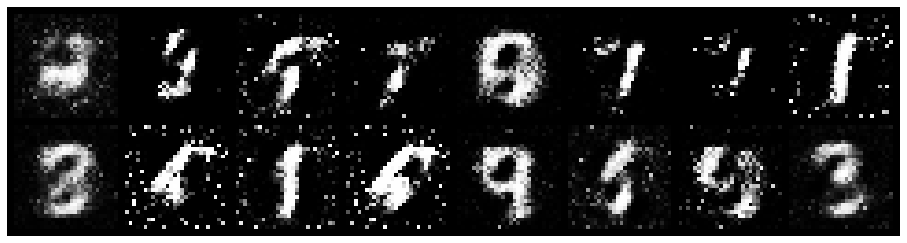

Epoch: [13/20], Batch Num: [200/600]
Discriminator Loss: 0.8855, Generator Loss: 1.8121
D(x): 0.6537, D(G(z)): 0.2479
Epoch: [13/20], Batch Num: [201/600]
Discriminator Loss: 0.8559, Generator Loss: 1.8300
D(x): 0.6724, D(G(z)): 0.2402
Epoch: [13/20], Batch Num: [202/600]
Discriminator Loss: 0.8055, Generator Loss: 1.6491
D(x): 0.7388, D(G(z)): 0.2906
Epoch: [13/20], Batch Num: [203/600]
Discriminator Loss: 0.6968, Generator Loss: 1.8158
D(x): 0.7678, D(G(z)): 0.2556
Epoch: [13/20], Batch Num: [204/600]
Discriminator Loss: 0.7072, Generator Loss: 1.7265
D(x): 0.7527, D(G(z)): 0.2468
Epoch: [13/20], Batch Num: [205/600]
Discriminator Loss: 0.5633, Generator Loss: 1.9321
D(x): 0.8273, D(G(z)): 0.2427
Epoch: [13/20], Batch Num: [206/600]
Discriminator Loss: 0.5267, Generator Loss: 1.8224
D(x): 0.8311, D(G(z)): 0.2303
Epoch: [13/20], Batch Num: [207/600]
Discriminator Loss: 0.6445, Generator Loss: 2.2529
D(x): 0.8152, D(G(z)): 0.2482
Epoch: [13/20], Batch Num: [208/600]
Discriminator Loss:

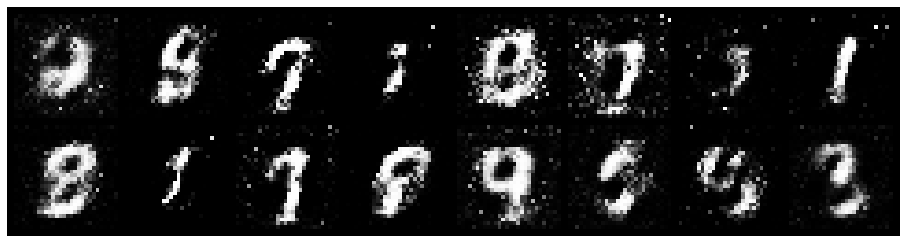

Epoch: [13/20], Batch Num: [300/600]
Discriminator Loss: 1.0699, Generator Loss: 1.8763
D(x): 0.6568, D(G(z)): 0.2674
Epoch: [13/20], Batch Num: [301/600]
Discriminator Loss: 1.1025, Generator Loss: 1.8324
D(x): 0.6272, D(G(z)): 0.2488
Epoch: [13/20], Batch Num: [302/600]
Discriminator Loss: 0.7692, Generator Loss: 1.7580
D(x): 0.7656, D(G(z)): 0.2791
Epoch: [13/20], Batch Num: [303/600]
Discriminator Loss: 0.8696, Generator Loss: 1.8240
D(x): 0.7647, D(G(z)): 0.3288
Epoch: [13/20], Batch Num: [304/600]
Discriminator Loss: 0.8386, Generator Loss: 1.8043
D(x): 0.7617, D(G(z)): 0.2833
Epoch: [13/20], Batch Num: [305/600]
Discriminator Loss: 0.8681, Generator Loss: 1.7862
D(x): 0.7368, D(G(z)): 0.2603
Epoch: [13/20], Batch Num: [306/600]
Discriminator Loss: 0.8072, Generator Loss: 1.8866
D(x): 0.6909, D(G(z)): 0.2148
Epoch: [13/20], Batch Num: [307/600]
Discriminator Loss: 0.7996, Generator Loss: 1.8239
D(x): 0.7364, D(G(z)): 0.2523
Epoch: [13/20], Batch Num: [308/600]
Discriminator Loss:

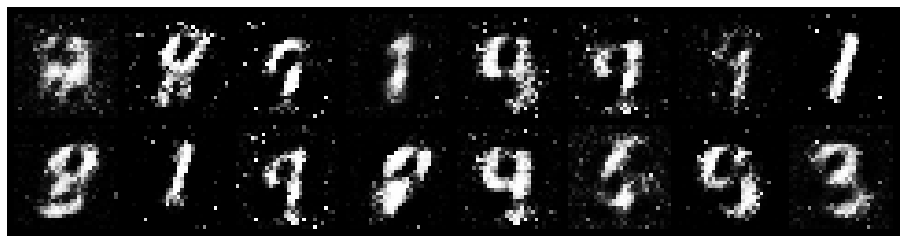

Epoch: [13/20], Batch Num: [400/600]
Discriminator Loss: 1.0152, Generator Loss: 1.2225
D(x): 0.6632, D(G(z)): 0.3151
Epoch: [13/20], Batch Num: [401/600]
Discriminator Loss: 0.8344, Generator Loss: 1.3701
D(x): 0.8073, D(G(z)): 0.3672
Epoch: [13/20], Batch Num: [402/600]
Discriminator Loss: 0.8279, Generator Loss: 1.3824
D(x): 0.8149, D(G(z)): 0.3737
Epoch: [13/20], Batch Num: [403/600]
Discriminator Loss: 0.9578, Generator Loss: 1.8329
D(x): 0.7201, D(G(z)): 0.3457
Epoch: [13/20], Batch Num: [404/600]
Discriminator Loss: 0.8687, Generator Loss: 1.9682
D(x): 0.7181, D(G(z)): 0.3017
Epoch: [13/20], Batch Num: [405/600]
Discriminator Loss: 0.7331, Generator Loss: 2.0636
D(x): 0.6920, D(G(z)): 0.2014
Epoch: [13/20], Batch Num: [406/600]
Discriminator Loss: 0.8166, Generator Loss: 2.1211
D(x): 0.6740, D(G(z)): 0.2054
Epoch: [13/20], Batch Num: [407/600]
Discriminator Loss: 0.7457, Generator Loss: 1.9304
D(x): 0.7297, D(G(z)): 0.2320
Epoch: [13/20], Batch Num: [408/600]
Discriminator Loss:

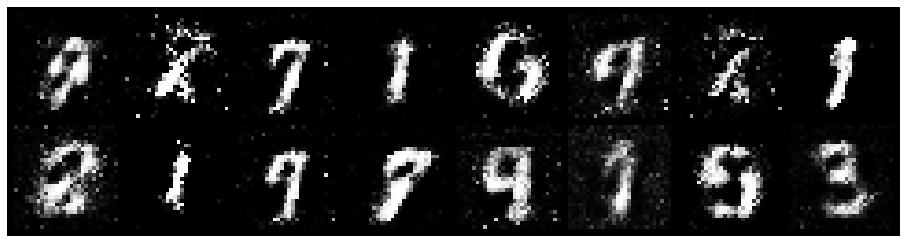

Epoch: [13/20], Batch Num: [500/600]
Discriminator Loss: 1.4140, Generator Loss: 1.1911
D(x): 0.6111, D(G(z)): 0.4081
Epoch: [13/20], Batch Num: [501/600]
Discriminator Loss: 1.2924, Generator Loss: 1.2708
D(x): 0.6451, D(G(z)): 0.4054
Epoch: [13/20], Batch Num: [502/600]
Discriminator Loss: 1.1841, Generator Loss: 1.2185
D(x): 0.6507, D(G(z)): 0.3787
Epoch: [13/20], Batch Num: [503/600]
Discriminator Loss: 1.1860, Generator Loss: 1.3655
D(x): 0.6613, D(G(z)): 0.3906
Epoch: [13/20], Batch Num: [504/600]
Discriminator Loss: 1.0643, Generator Loss: 1.4207
D(x): 0.6294, D(G(z)): 0.3021
Epoch: [13/20], Batch Num: [505/600]
Discriminator Loss: 1.0579, Generator Loss: 1.4361
D(x): 0.6510, D(G(z)): 0.3396
Epoch: [13/20], Batch Num: [506/600]
Discriminator Loss: 0.8963, Generator Loss: 1.4572
D(x): 0.6981, D(G(z)): 0.3005
Epoch: [13/20], Batch Num: [507/600]
Discriminator Loss: 0.9449, Generator Loss: 1.6563
D(x): 0.6583, D(G(z)): 0.3024
Epoch: [13/20], Batch Num: [508/600]
Discriminator Loss:

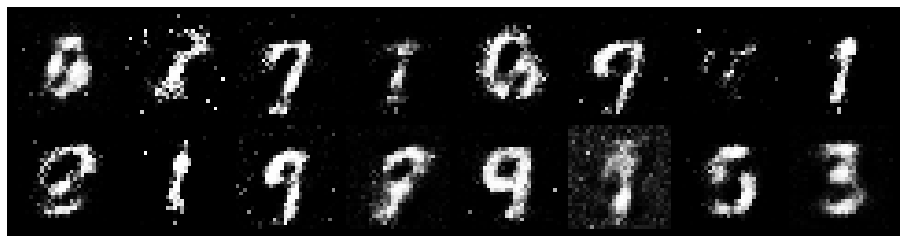

Epoch: [14/20], Batch Num: [0/600]
Discriminator Loss: 1.0477, Generator Loss: 1.4197
D(x): 0.7352, D(G(z)): 0.3643
Epoch: [14/20], Batch Num: [1/600]
Discriminator Loss: 1.0544, Generator Loss: 1.2611
D(x): 0.7109, D(G(z)): 0.3549
Epoch: [14/20], Batch Num: [2/600]
Discriminator Loss: 0.9002, Generator Loss: 1.7149
D(x): 0.7399, D(G(z)): 0.3190
Epoch: [14/20], Batch Num: [3/600]
Discriminator Loss: 1.0458, Generator Loss: 1.5883
D(x): 0.6427, D(G(z)): 0.2660
Epoch: [14/20], Batch Num: [4/600]
Discriminator Loss: 0.9988, Generator Loss: 1.4784
D(x): 0.6572, D(G(z)): 0.2733
Epoch: [14/20], Batch Num: [5/600]
Discriminator Loss: 0.9335, Generator Loss: 1.3975
D(x): 0.7226, D(G(z)): 0.3063
Epoch: [14/20], Batch Num: [6/600]
Discriminator Loss: 0.8766, Generator Loss: 1.5327
D(x): 0.7817, D(G(z)): 0.3378
Epoch: [14/20], Batch Num: [7/600]
Discriminator Loss: 0.9039, Generator Loss: 1.6265
D(x): 0.7348, D(G(z)): 0.3214
Epoch: [14/20], Batch Num: [8/600]
Discriminator Loss: 0.7511, Generator

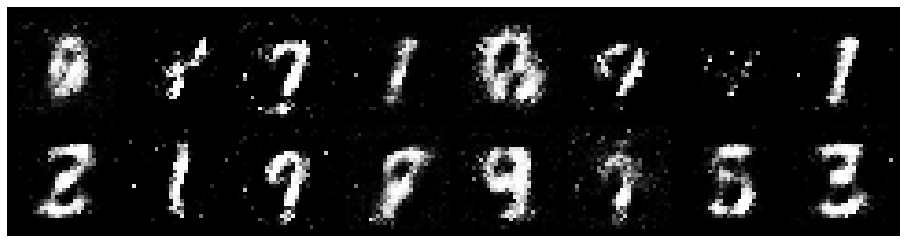

Epoch: [14/20], Batch Num: [100/600]
Discriminator Loss: 0.9329, Generator Loss: 1.7882
D(x): 0.7722, D(G(z)): 0.3403
Epoch: [14/20], Batch Num: [101/600]
Discriminator Loss: 0.9069, Generator Loss: 2.0320
D(x): 0.7415, D(G(z)): 0.2974
Epoch: [14/20], Batch Num: [102/600]
Discriminator Loss: 0.9692, Generator Loss: 2.2689
D(x): 0.6736, D(G(z)): 0.2560
Epoch: [14/20], Batch Num: [103/600]
Discriminator Loss: 1.2378, Generator Loss: 1.8782
D(x): 0.5664, D(G(z)): 0.1903
Epoch: [14/20], Batch Num: [104/600]
Discriminator Loss: 0.9198, Generator Loss: 1.5121
D(x): 0.7134, D(G(z)): 0.2744
Epoch: [14/20], Batch Num: [105/600]
Discriminator Loss: 0.9366, Generator Loss: 1.2634
D(x): 0.7356, D(G(z)): 0.3349
Epoch: [14/20], Batch Num: [106/600]
Discriminator Loss: 0.9412, Generator Loss: 1.5707
D(x): 0.7996, D(G(z)): 0.3712
Epoch: [14/20], Batch Num: [107/600]
Discriminator Loss: 0.9206, Generator Loss: 1.7849
D(x): 0.7604, D(G(z)): 0.3107
Epoch: [14/20], Batch Num: [108/600]
Discriminator Loss:

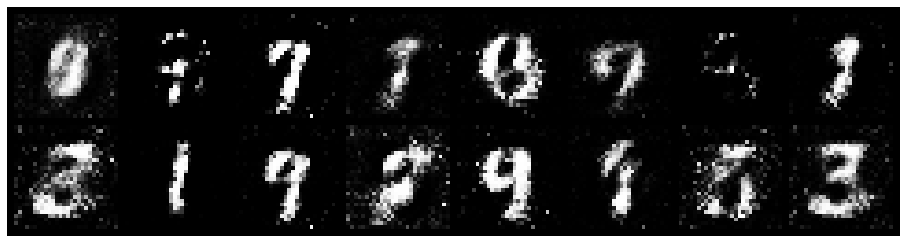

Epoch: [14/20], Batch Num: [200/600]
Discriminator Loss: 0.7217, Generator Loss: 1.9534
D(x): 0.7766, D(G(z)): 0.2823
Epoch: [14/20], Batch Num: [201/600]
Discriminator Loss: 0.7277, Generator Loss: 2.0834
D(x): 0.7354, D(G(z)): 0.2380
Epoch: [14/20], Batch Num: [202/600]
Discriminator Loss: 0.6655, Generator Loss: 1.9150
D(x): 0.7466, D(G(z)): 0.2179
Epoch: [14/20], Batch Num: [203/600]
Discriminator Loss: 0.6839, Generator Loss: 1.9558
D(x): 0.7349, D(G(z)): 0.2255
Epoch: [14/20], Batch Num: [204/600]
Discriminator Loss: 0.7285, Generator Loss: 1.8962
D(x): 0.7418, D(G(z)): 0.2386
Epoch: [14/20], Batch Num: [205/600]
Discriminator Loss: 0.7290, Generator Loss: 1.7641
D(x): 0.7441, D(G(z)): 0.2437
Epoch: [14/20], Batch Num: [206/600]
Discriminator Loss: 0.7172, Generator Loss: 1.7775
D(x): 0.7825, D(G(z)): 0.2736
Epoch: [14/20], Batch Num: [207/600]
Discriminator Loss: 0.7396, Generator Loss: 1.7781
D(x): 0.7652, D(G(z)): 0.2744
Epoch: [14/20], Batch Num: [208/600]
Discriminator Loss:

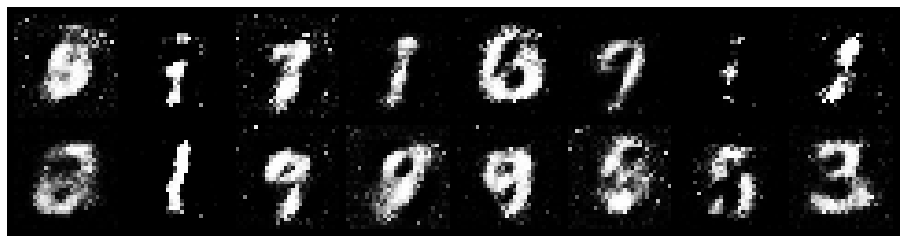

Epoch: [14/20], Batch Num: [300/600]
Discriminator Loss: 0.5741, Generator Loss: 1.9782
D(x): 0.8171, D(G(z)): 0.2224
Epoch: [14/20], Batch Num: [301/600]
Discriminator Loss: 0.5960, Generator Loss: 2.0287
D(x): 0.8335, D(G(z)): 0.2384
Epoch: [14/20], Batch Num: [302/600]
Discriminator Loss: 0.5724, Generator Loss: 1.9927
D(x): 0.8150, D(G(z)): 0.2157
Epoch: [14/20], Batch Num: [303/600]
Discriminator Loss: 0.5965, Generator Loss: 2.1248
D(x): 0.8007, D(G(z)): 0.1855
Epoch: [14/20], Batch Num: [304/600]
Discriminator Loss: 0.5371, Generator Loss: 2.1580
D(x): 0.8061, D(G(z)): 0.1790
Epoch: [14/20], Batch Num: [305/600]
Discriminator Loss: 0.4994, Generator Loss: 1.9741
D(x): 0.8343, D(G(z)): 0.1917
Epoch: [14/20], Batch Num: [306/600]
Discriminator Loss: 0.4000, Generator Loss: 1.9789
D(x): 0.8531, D(G(z)): 0.1646
Epoch: [14/20], Batch Num: [307/600]
Discriminator Loss: 0.6381, Generator Loss: 2.0311
D(x): 0.8164, D(G(z)): 0.2266
Epoch: [14/20], Batch Num: [308/600]
Discriminator Loss:

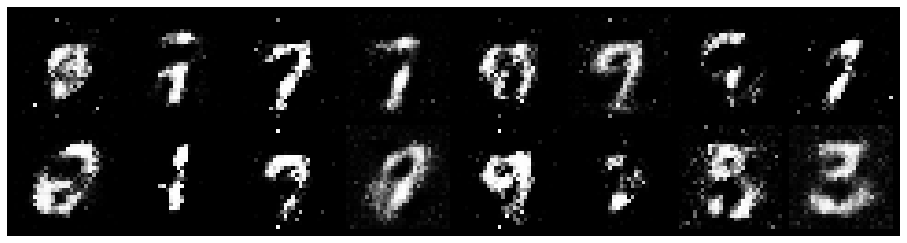

Epoch: [14/20], Batch Num: [400/600]
Discriminator Loss: 0.7623, Generator Loss: 2.3437
D(x): 0.6891, D(G(z)): 0.1690
Epoch: [14/20], Batch Num: [401/600]
Discriminator Loss: 0.7487, Generator Loss: 1.7988
D(x): 0.7266, D(G(z)): 0.1968
Epoch: [14/20], Batch Num: [402/600]
Discriminator Loss: 0.6654, Generator Loss: 1.7618
D(x): 0.8016, D(G(z)): 0.2543
Epoch: [14/20], Batch Num: [403/600]
Discriminator Loss: 0.7854, Generator Loss: 2.0390
D(x): 0.8337, D(G(z)): 0.3198
Epoch: [14/20], Batch Num: [404/600]
Discriminator Loss: 0.6746, Generator Loss: 1.8902
D(x): 0.8316, D(G(z)): 0.2747
Epoch: [14/20], Batch Num: [405/600]
Discriminator Loss: 0.7351, Generator Loss: 2.5328
D(x): 0.7784, D(G(z)): 0.2244
Epoch: [14/20], Batch Num: [406/600]
Discriminator Loss: 0.9009, Generator Loss: 2.4721
D(x): 0.6788, D(G(z)): 0.1797
Epoch: [14/20], Batch Num: [407/600]
Discriminator Loss: 0.6200, Generator Loss: 2.2199
D(x): 0.7672, D(G(z)): 0.1609
Epoch: [14/20], Batch Num: [408/600]
Discriminator Loss:

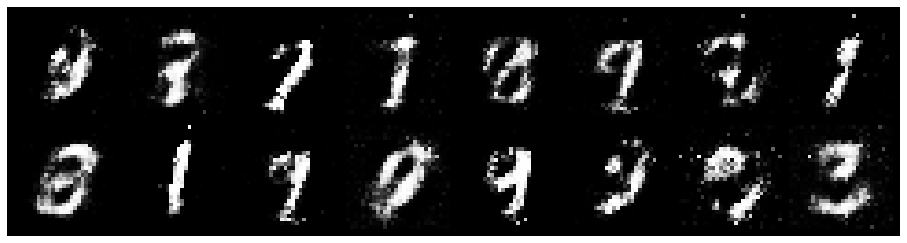

Epoch: [14/20], Batch Num: [500/600]
Discriminator Loss: 0.7024, Generator Loss: 2.5820
D(x): 0.7280, D(G(z)): 0.1643
Epoch: [14/20], Batch Num: [501/600]
Discriminator Loss: 0.7898, Generator Loss: 2.2614
D(x): 0.6881, D(G(z)): 0.1413
Epoch: [14/20], Batch Num: [502/600]
Discriminator Loss: 0.8141, Generator Loss: 1.8886
D(x): 0.7283, D(G(z)): 0.2079
Epoch: [14/20], Batch Num: [503/600]
Discriminator Loss: 0.6798, Generator Loss: 1.5480
D(x): 0.8260, D(G(z)): 0.2770
Epoch: [14/20], Batch Num: [504/600]
Discriminator Loss: 0.6465, Generator Loss: 1.7093
D(x): 0.8633, D(G(z)): 0.2746
Epoch: [14/20], Batch Num: [505/600]
Discriminator Loss: 0.8984, Generator Loss: 2.0313
D(x): 0.8144, D(G(z)): 0.3194
Epoch: [14/20], Batch Num: [506/600]
Discriminator Loss: 0.6704, Generator Loss: 2.2454
D(x): 0.7838, D(G(z)): 0.2209
Epoch: [14/20], Batch Num: [507/600]
Discriminator Loss: 0.8256, Generator Loss: 2.1673
D(x): 0.7045, D(G(z)): 0.1897
Epoch: [14/20], Batch Num: [508/600]
Discriminator Loss:

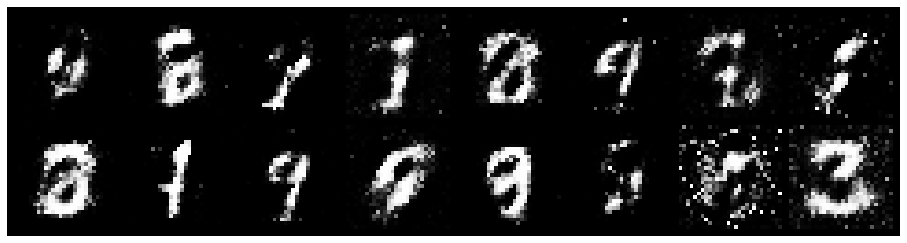

Epoch: [15/20], Batch Num: [0/600]
Discriminator Loss: 0.9004, Generator Loss: 1.7915
D(x): 0.7237, D(G(z)): 0.2685
Epoch: [15/20], Batch Num: [1/600]
Discriminator Loss: 0.9596, Generator Loss: 1.6654
D(x): 0.7328, D(G(z)): 0.3016
Epoch: [15/20], Batch Num: [2/600]
Discriminator Loss: 0.8489, Generator Loss: 1.5395
D(x): 0.7982, D(G(z)): 0.3215
Epoch: [15/20], Batch Num: [3/600]
Discriminator Loss: 0.9896, Generator Loss: 1.6905
D(x): 0.7258, D(G(z)): 0.3224
Epoch: [15/20], Batch Num: [4/600]
Discriminator Loss: 1.0421, Generator Loss: 1.7298
D(x): 0.7064, D(G(z)): 0.3273
Epoch: [15/20], Batch Num: [5/600]
Discriminator Loss: 0.9477, Generator Loss: 1.7205
D(x): 0.6799, D(G(z)): 0.2593
Epoch: [15/20], Batch Num: [6/600]
Discriminator Loss: 1.0149, Generator Loss: 1.6661
D(x): 0.7387, D(G(z)): 0.3311
Epoch: [15/20], Batch Num: [7/600]
Discriminator Loss: 0.8976, Generator Loss: 1.6479
D(x): 0.6967, D(G(z)): 0.2692
Epoch: [15/20], Batch Num: [8/600]
Discriminator Loss: 1.1361, Generator

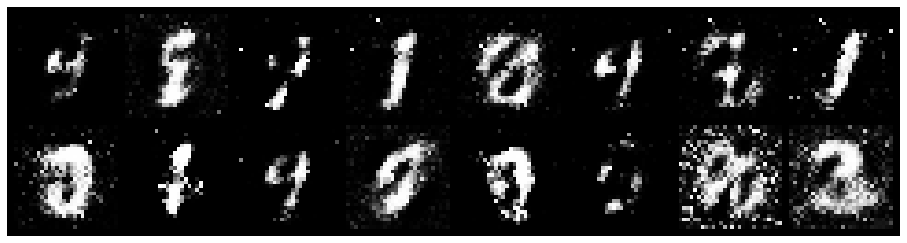

Epoch: [15/20], Batch Num: [100/600]
Discriminator Loss: 1.1865, Generator Loss: 1.5860
D(x): 0.5892, D(G(z)): 0.2823
Epoch: [15/20], Batch Num: [101/600]
Discriminator Loss: 0.9909, Generator Loss: 1.2298
D(x): 0.7276, D(G(z)): 0.3301
Epoch: [15/20], Batch Num: [102/600]
Discriminator Loss: 0.9993, Generator Loss: 1.2544
D(x): 0.7654, D(G(z)): 0.3909
Epoch: [15/20], Batch Num: [103/600]
Discriminator Loss: 1.0242, Generator Loss: 1.5271
D(x): 0.7968, D(G(z)): 0.4252
Epoch: [15/20], Batch Num: [104/600]
Discriminator Loss: 1.0179, Generator Loss: 1.9455
D(x): 0.6899, D(G(z)): 0.3297
Epoch: [15/20], Batch Num: [105/600]
Discriminator Loss: 0.9921, Generator Loss: 1.9520
D(x): 0.6440, D(G(z)): 0.2470
Epoch: [15/20], Batch Num: [106/600]
Discriminator Loss: 0.9486, Generator Loss: 1.8620
D(x): 0.6514, D(G(z)): 0.2498
Epoch: [15/20], Batch Num: [107/600]
Discriminator Loss: 1.0425, Generator Loss: 1.6063
D(x): 0.6104, D(G(z)): 0.2603
Epoch: [15/20], Batch Num: [108/600]
Discriminator Loss:

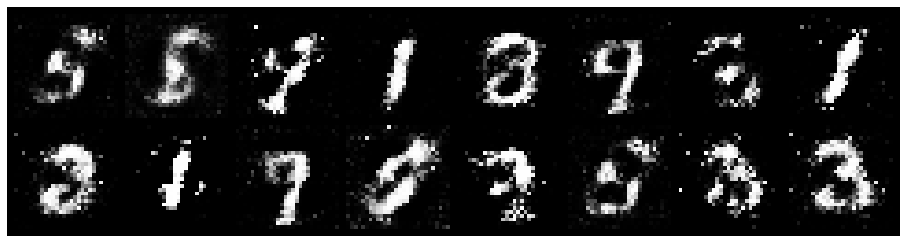

Epoch: [15/20], Batch Num: [200/600]
Discriminator Loss: 0.9210, Generator Loss: 1.7866
D(x): 0.6593, D(G(z)): 0.2619
Epoch: [15/20], Batch Num: [201/600]
Discriminator Loss: 0.9937, Generator Loss: 1.5098
D(x): 0.6417, D(G(z)): 0.2721
Epoch: [15/20], Batch Num: [202/600]
Discriminator Loss: 0.9475, Generator Loss: 1.4887
D(x): 0.6668, D(G(z)): 0.2871
Epoch: [15/20], Batch Num: [203/600]
Discriminator Loss: 0.8352, Generator Loss: 1.3432
D(x): 0.7060, D(G(z)): 0.2764
Epoch: [15/20], Batch Num: [204/600]
Discriminator Loss: 0.9786, Generator Loss: 1.4667
D(x): 0.7904, D(G(z)): 0.3876
Epoch: [15/20], Batch Num: [205/600]
Discriminator Loss: 0.8481, Generator Loss: 1.6542
D(x): 0.7844, D(G(z)): 0.3470
Epoch: [15/20], Batch Num: [206/600]
Discriminator Loss: 0.7046, Generator Loss: 1.8696
D(x): 0.7777, D(G(z)): 0.2725
Epoch: [15/20], Batch Num: [207/600]
Discriminator Loss: 0.8470, Generator Loss: 1.9701
D(x): 0.6617, D(G(z)): 0.2091
Epoch: [15/20], Batch Num: [208/600]
Discriminator Loss:

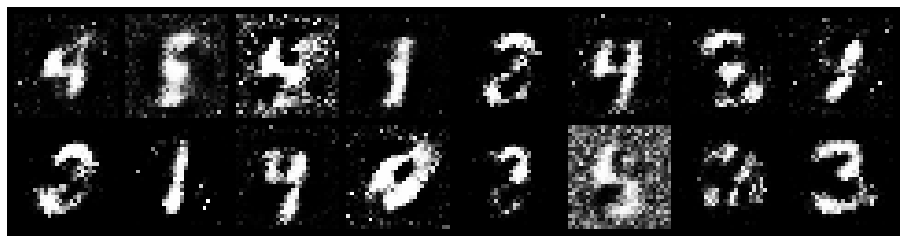

Epoch: [15/20], Batch Num: [300/600]
Discriminator Loss: 1.0951, Generator Loss: 1.4532
D(x): 0.6351, D(G(z)): 0.2924
Epoch: [15/20], Batch Num: [301/600]
Discriminator Loss: 0.9565, Generator Loss: 1.4771
D(x): 0.6964, D(G(z)): 0.3250
Epoch: [15/20], Batch Num: [302/600]
Discriminator Loss: 0.9988, Generator Loss: 1.4316
D(x): 0.6965, D(G(z)): 0.3316
Epoch: [15/20], Batch Num: [303/600]
Discriminator Loss: 1.0086, Generator Loss: 1.4014
D(x): 0.7018, D(G(z)): 0.3672
Epoch: [15/20], Batch Num: [304/600]
Discriminator Loss: 1.0202, Generator Loss: 1.2887
D(x): 0.7064, D(G(z)): 0.3605
Epoch: [15/20], Batch Num: [305/600]
Discriminator Loss: 0.8416, Generator Loss: 1.4316
D(x): 0.7087, D(G(z)): 0.3069
Epoch: [15/20], Batch Num: [306/600]
Discriminator Loss: 0.8408, Generator Loss: 1.3909
D(x): 0.7380, D(G(z)): 0.3100
Epoch: [15/20], Batch Num: [307/600]
Discriminator Loss: 0.8305, Generator Loss: 1.4143
D(x): 0.7370, D(G(z)): 0.3137
Epoch: [15/20], Batch Num: [308/600]
Discriminator Loss:

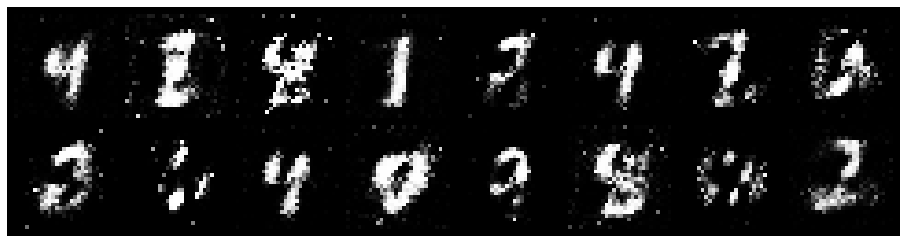

Epoch: [15/20], Batch Num: [400/600]
Discriminator Loss: 1.0236, Generator Loss: 1.6671
D(x): 0.7187, D(G(z)): 0.3200
Epoch: [15/20], Batch Num: [401/600]
Discriminator Loss: 1.0208, Generator Loss: 1.3930
D(x): 0.6648, D(G(z)): 0.2816
Epoch: [15/20], Batch Num: [402/600]
Discriminator Loss: 1.1876, Generator Loss: 1.4406
D(x): 0.6830, D(G(z)): 0.3843
Epoch: [15/20], Batch Num: [403/600]
Discriminator Loss: 1.2642, Generator Loss: 1.3840
D(x): 0.6229, D(G(z)): 0.3650
Epoch: [15/20], Batch Num: [404/600]
Discriminator Loss: 1.1212, Generator Loss: 1.2861
D(x): 0.6694, D(G(z)): 0.3482
Epoch: [15/20], Batch Num: [405/600]
Discriminator Loss: 1.0714, Generator Loss: 1.5512
D(x): 0.6787, D(G(z)): 0.3429
Epoch: [15/20], Batch Num: [406/600]
Discriminator Loss: 1.0537, Generator Loss: 1.6829
D(x): 0.6562, D(G(z)): 0.2916
Epoch: [15/20], Batch Num: [407/600]
Discriminator Loss: 1.1323, Generator Loss: 1.5983
D(x): 0.5907, D(G(z)): 0.2921
Epoch: [15/20], Batch Num: [408/600]
Discriminator Loss:

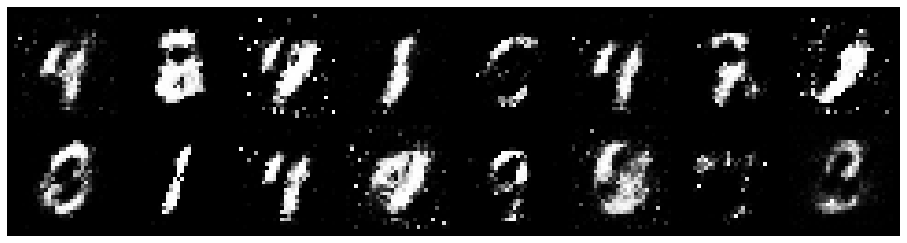

Epoch: [15/20], Batch Num: [500/600]
Discriminator Loss: 1.0734, Generator Loss: 1.4677
D(x): 0.6642, D(G(z)): 0.3260
Epoch: [15/20], Batch Num: [501/600]
Discriminator Loss: 1.2118, Generator Loss: 1.5425
D(x): 0.5877, D(G(z)): 0.3257
Epoch: [15/20], Batch Num: [502/600]
Discriminator Loss: 1.1192, Generator Loss: 1.3554
D(x): 0.5988, D(G(z)): 0.2940
Epoch: [15/20], Batch Num: [503/600]
Discriminator Loss: 1.1406, Generator Loss: 1.3245
D(x): 0.6730, D(G(z)): 0.3690
Epoch: [15/20], Batch Num: [504/600]
Discriminator Loss: 1.1435, Generator Loss: 1.2960
D(x): 0.7284, D(G(z)): 0.4526
Epoch: [15/20], Batch Num: [505/600]
Discriminator Loss: 0.9028, Generator Loss: 1.4149
D(x): 0.7310, D(G(z)): 0.3327
Epoch: [15/20], Batch Num: [506/600]
Discriminator Loss: 0.9461, Generator Loss: 1.6353
D(x): 0.6764, D(G(z)): 0.3050
Epoch: [15/20], Batch Num: [507/600]
Discriminator Loss: 0.9675, Generator Loss: 1.6724
D(x): 0.6448, D(G(z)): 0.2601
Epoch: [15/20], Batch Num: [508/600]
Discriminator Loss:

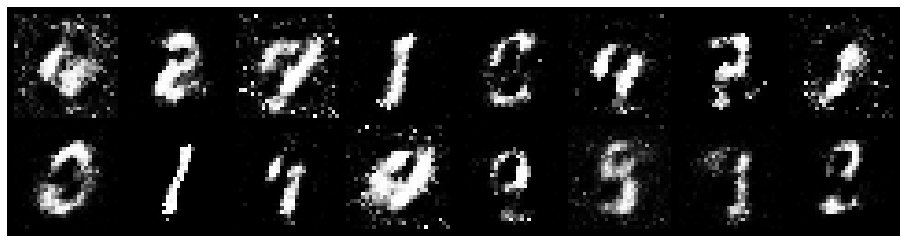

Epoch: [16/20], Batch Num: [0/600]
Discriminator Loss: 1.0507, Generator Loss: 1.6809
D(x): 0.6374, D(G(z)): 0.2923
Epoch: [16/20], Batch Num: [1/600]
Discriminator Loss: 1.2109, Generator Loss: 1.6784
D(x): 0.5746, D(G(z)): 0.2949
Epoch: [16/20], Batch Num: [2/600]
Discriminator Loss: 1.2743, Generator Loss: 1.6692
D(x): 0.6092, D(G(z)): 0.3640
Epoch: [16/20], Batch Num: [3/600]
Discriminator Loss: 1.2621, Generator Loss: 1.2603
D(x): 0.6679, D(G(z)): 0.4101
Epoch: [16/20], Batch Num: [4/600]
Discriminator Loss: 1.0997, Generator Loss: 1.3030
D(x): 0.6715, D(G(z)): 0.3521
Epoch: [16/20], Batch Num: [5/600]
Discriminator Loss: 1.1297, Generator Loss: 1.3889
D(x): 0.6825, D(G(z)): 0.4079
Epoch: [16/20], Batch Num: [6/600]
Discriminator Loss: 1.0092, Generator Loss: 1.4833
D(x): 0.7151, D(G(z)): 0.3646
Epoch: [16/20], Batch Num: [7/600]
Discriminator Loss: 1.0845, Generator Loss: 1.7108
D(x): 0.6246, D(G(z)): 0.3187
Epoch: [16/20], Batch Num: [8/600]
Discriminator Loss: 0.8313, Generator

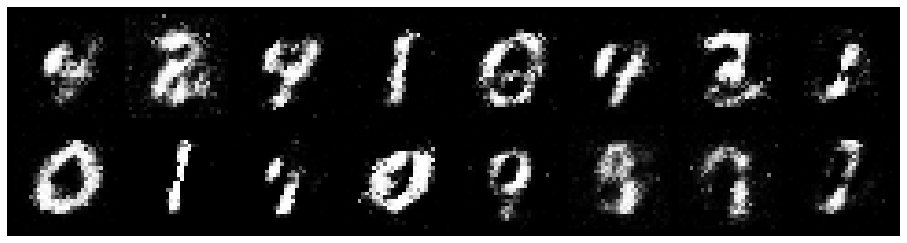

Epoch: [16/20], Batch Num: [100/600]
Discriminator Loss: 1.0777, Generator Loss: 1.4753
D(x): 0.6853, D(G(z)): 0.3330
Epoch: [16/20], Batch Num: [101/600]
Discriminator Loss: 1.0227, Generator Loss: 1.5338
D(x): 0.7095, D(G(z)): 0.3362
Epoch: [16/20], Batch Num: [102/600]
Discriminator Loss: 0.9935, Generator Loss: 1.5409
D(x): 0.7359, D(G(z)): 0.3420
Epoch: [16/20], Batch Num: [103/600]
Discriminator Loss: 0.8951, Generator Loss: 1.5535
D(x): 0.7334, D(G(z)): 0.3085
Epoch: [16/20], Batch Num: [104/600]
Discriminator Loss: 1.0182, Generator Loss: 1.7004
D(x): 0.6418, D(G(z)): 0.2682
Epoch: [16/20], Batch Num: [105/600]
Discriminator Loss: 0.7990, Generator Loss: 1.7446
D(x): 0.7562, D(G(z)): 0.2962
Epoch: [16/20], Batch Num: [106/600]
Discriminator Loss: 0.8438, Generator Loss: 1.5888
D(x): 0.6730, D(G(z)): 0.2338
Epoch: [16/20], Batch Num: [107/600]
Discriminator Loss: 0.8152, Generator Loss: 1.6851
D(x): 0.7364, D(G(z)): 0.2805
Epoch: [16/20], Batch Num: [108/600]
Discriminator Loss:

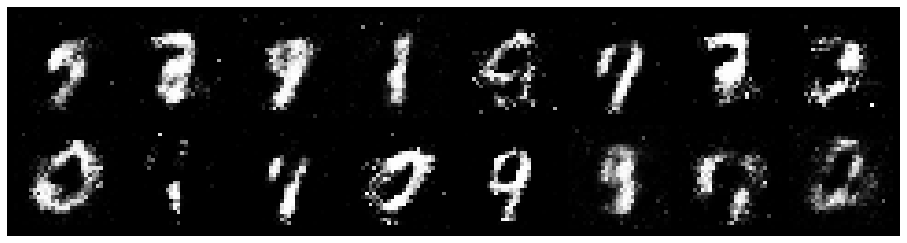

Epoch: [16/20], Batch Num: [200/600]
Discriminator Loss: 0.6083, Generator Loss: 1.8126
D(x): 0.8103, D(G(z)): 0.2367
Epoch: [16/20], Batch Num: [201/600]
Discriminator Loss: 0.7572, Generator Loss: 1.8006
D(x): 0.7577, D(G(z)): 0.2422
Epoch: [16/20], Batch Num: [202/600]
Discriminator Loss: 0.7366, Generator Loss: 2.0569
D(x): 0.7855, D(G(z)): 0.2666
Epoch: [16/20], Batch Num: [203/600]
Discriminator Loss: 0.8372, Generator Loss: 1.9481
D(x): 0.7282, D(G(z)): 0.2275
Epoch: [16/20], Batch Num: [204/600]
Discriminator Loss: 0.8354, Generator Loss: 1.8869
D(x): 0.7250, D(G(z)): 0.2309
Epoch: [16/20], Batch Num: [205/600]
Discriminator Loss: 0.7471, Generator Loss: 1.8677
D(x): 0.7495, D(G(z)): 0.2447
Epoch: [16/20], Batch Num: [206/600]
Discriminator Loss: 0.6798, Generator Loss: 1.7732
D(x): 0.7566, D(G(z)): 0.2183
Epoch: [16/20], Batch Num: [207/600]
Discriminator Loss: 0.7275, Generator Loss: 1.7398
D(x): 0.7837, D(G(z)): 0.2685
Epoch: [16/20], Batch Num: [208/600]
Discriminator Loss:

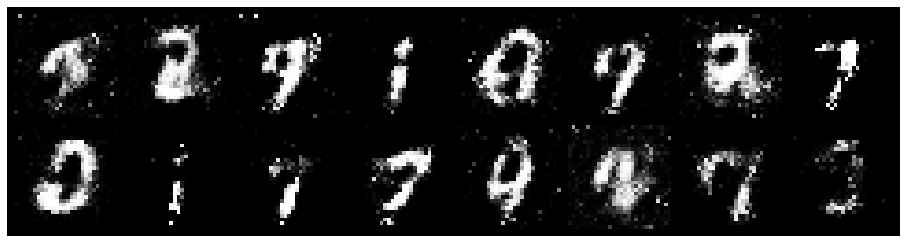

Epoch: [16/20], Batch Num: [300/600]
Discriminator Loss: 0.9694, Generator Loss: 1.3654
D(x): 0.6914, D(G(z)): 0.3452
Epoch: [16/20], Batch Num: [301/600]
Discriminator Loss: 0.9932, Generator Loss: 1.3653
D(x): 0.7221, D(G(z)): 0.3778
Epoch: [16/20], Batch Num: [302/600]
Discriminator Loss: 0.8716, Generator Loss: 1.5891
D(x): 0.7314, D(G(z)): 0.3187
Epoch: [16/20], Batch Num: [303/600]
Discriminator Loss: 0.7825, Generator Loss: 1.5344
D(x): 0.7306, D(G(z)): 0.2641
Epoch: [16/20], Batch Num: [304/600]
Discriminator Loss: 0.9524, Generator Loss: 1.7560
D(x): 0.6641, D(G(z)): 0.2801
Epoch: [16/20], Batch Num: [305/600]
Discriminator Loss: 0.8944, Generator Loss: 1.5207
D(x): 0.6588, D(G(z)): 0.2513
Epoch: [16/20], Batch Num: [306/600]
Discriminator Loss: 0.9347, Generator Loss: 1.5207
D(x): 0.7103, D(G(z)): 0.3120
Epoch: [16/20], Batch Num: [307/600]
Discriminator Loss: 0.9236, Generator Loss: 1.4030
D(x): 0.6943, D(G(z)): 0.2910
Epoch: [16/20], Batch Num: [308/600]
Discriminator Loss:

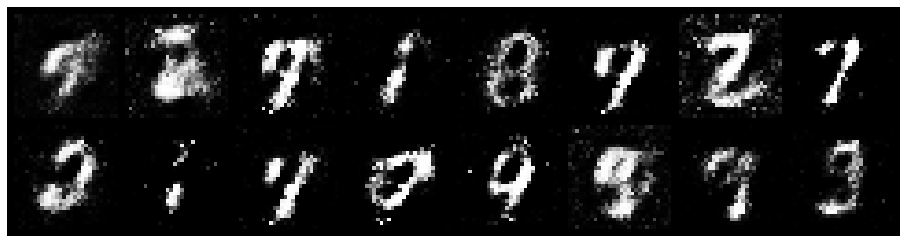

Epoch: [16/20], Batch Num: [400/600]
Discriminator Loss: 0.8622, Generator Loss: 1.9714
D(x): 0.7326, D(G(z)): 0.2837
Epoch: [16/20], Batch Num: [401/600]
Discriminator Loss: 0.8968, Generator Loss: 1.9050
D(x): 0.6725, D(G(z)): 0.2445
Epoch: [16/20], Batch Num: [402/600]
Discriminator Loss: 0.9468, Generator Loss: 1.7280
D(x): 0.7336, D(G(z)): 0.2976
Epoch: [16/20], Batch Num: [403/600]
Discriminator Loss: 0.7590, Generator Loss: 1.7747
D(x): 0.7663, D(G(z)): 0.2737
Epoch: [16/20], Batch Num: [404/600]
Discriminator Loss: 0.8033, Generator Loss: 1.8617
D(x): 0.8051, D(G(z)): 0.3152
Epoch: [16/20], Batch Num: [405/600]
Discriminator Loss: 0.9210, Generator Loss: 1.8886
D(x): 0.6899, D(G(z)): 0.2769
Epoch: [16/20], Batch Num: [406/600]
Discriminator Loss: 0.8665, Generator Loss: 2.0087
D(x): 0.7198, D(G(z)): 0.2590
Epoch: [16/20], Batch Num: [407/600]
Discriminator Loss: 0.8877, Generator Loss: 1.7112
D(x): 0.6885, D(G(z)): 0.2604
Epoch: [16/20], Batch Num: [408/600]
Discriminator Loss:

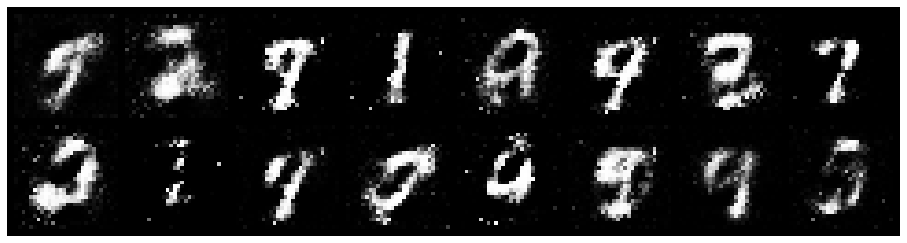

Epoch: [16/20], Batch Num: [500/600]
Discriminator Loss: 0.7141, Generator Loss: 1.8101
D(x): 0.7369, D(G(z)): 0.2360
Epoch: [16/20], Batch Num: [501/600]
Discriminator Loss: 0.7102, Generator Loss: 1.6239
D(x): 0.7824, D(G(z)): 0.2798
Epoch: [16/20], Batch Num: [502/600]
Discriminator Loss: 0.6898, Generator Loss: 1.6010
D(x): 0.7900, D(G(z)): 0.2811
Epoch: [16/20], Batch Num: [503/600]
Discriminator Loss: 0.6217, Generator Loss: 1.8197
D(x): 0.8120, D(G(z)): 0.2570
Epoch: [16/20], Batch Num: [504/600]
Discriminator Loss: 0.7623, Generator Loss: 1.9222
D(x): 0.7288, D(G(z)): 0.2438
Epoch: [16/20], Batch Num: [505/600]
Discriminator Loss: 0.7945, Generator Loss: 2.1119
D(x): 0.7229, D(G(z)): 0.2227
Epoch: [16/20], Batch Num: [506/600]
Discriminator Loss: 0.6632, Generator Loss: 1.8866
D(x): 0.7531, D(G(z)): 0.2209
Epoch: [16/20], Batch Num: [507/600]
Discriminator Loss: 0.7751, Generator Loss: 1.6069
D(x): 0.7455, D(G(z)): 0.2758
Epoch: [16/20], Batch Num: [508/600]
Discriminator Loss:

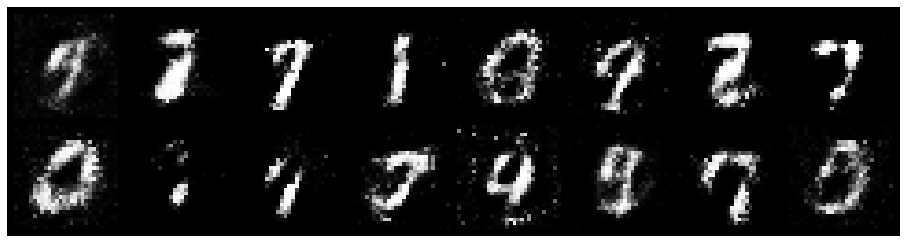

Epoch: [17/20], Batch Num: [0/600]
Discriminator Loss: 0.8118, Generator Loss: 2.0130
D(x): 0.7652, D(G(z)): 0.2699
Epoch: [17/20], Batch Num: [1/600]
Discriminator Loss: 0.6515, Generator Loss: 1.7629
D(x): 0.7973, D(G(z)): 0.2337
Epoch: [17/20], Batch Num: [2/600]
Discriminator Loss: 0.9041, Generator Loss: 2.1099
D(x): 0.7796, D(G(z)): 0.3246
Epoch: [17/20], Batch Num: [3/600]
Discriminator Loss: 0.8653, Generator Loss: 2.5065
D(x): 0.7541, D(G(z)): 0.2816
Epoch: [17/20], Batch Num: [4/600]
Discriminator Loss: 0.8554, Generator Loss: 2.3642
D(x): 0.7030, D(G(z)): 0.1969
Epoch: [17/20], Batch Num: [5/600]
Discriminator Loss: 1.0802, Generator Loss: 1.8642
D(x): 0.6202, D(G(z)): 0.1891
Epoch: [17/20], Batch Num: [6/600]
Discriminator Loss: 0.9499, Generator Loss: 1.6421
D(x): 0.7365, D(G(z)): 0.2950
Epoch: [17/20], Batch Num: [7/600]
Discriminator Loss: 1.0419, Generator Loss: 1.6413
D(x): 0.7831, D(G(z)): 0.3874
Epoch: [17/20], Batch Num: [8/600]
Discriminator Loss: 1.0496, Generator

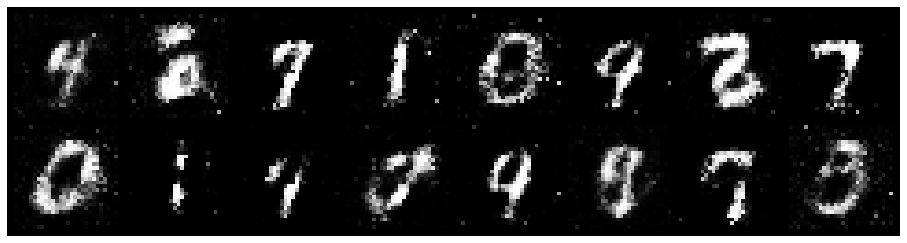

Epoch: [17/20], Batch Num: [100/600]
Discriminator Loss: 0.7337, Generator Loss: 1.6181
D(x): 0.7396, D(G(z)): 0.2514
Epoch: [17/20], Batch Num: [101/600]
Discriminator Loss: 0.6826, Generator Loss: 1.5064
D(x): 0.7826, D(G(z)): 0.2686
Epoch: [17/20], Batch Num: [102/600]
Discriminator Loss: 0.7056, Generator Loss: 1.5264
D(x): 0.8142, D(G(z)): 0.3006
Epoch: [17/20], Batch Num: [103/600]
Discriminator Loss: 0.7866, Generator Loss: 1.9484
D(x): 0.7876, D(G(z)): 0.3221
Epoch: [17/20], Batch Num: [104/600]
Discriminator Loss: 0.9080, Generator Loss: 2.0540
D(x): 0.6984, D(G(z)): 0.2832
Epoch: [17/20], Batch Num: [105/600]
Discriminator Loss: 0.8630, Generator Loss: 1.8472
D(x): 0.6674, D(G(z)): 0.2170
Epoch: [17/20], Batch Num: [106/600]
Discriminator Loss: 0.8756, Generator Loss: 1.6732
D(x): 0.6730, D(G(z)): 0.2333
Epoch: [17/20], Batch Num: [107/600]
Discriminator Loss: 1.0662, Generator Loss: 1.4910
D(x): 0.6983, D(G(z)): 0.3212
Epoch: [17/20], Batch Num: [108/600]
Discriminator Loss:

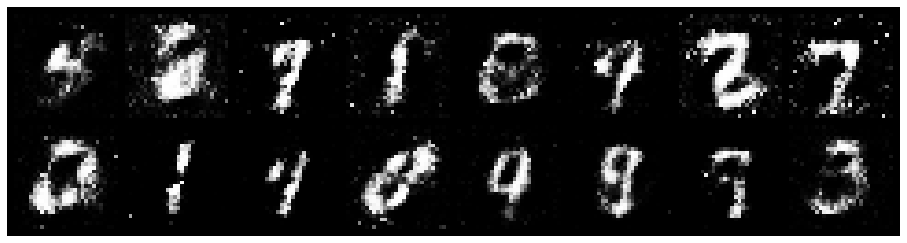

Epoch: [17/20], Batch Num: [200/600]
Discriminator Loss: 0.8560, Generator Loss: 1.6610
D(x): 0.6795, D(G(z)): 0.2540
Epoch: [17/20], Batch Num: [201/600]
Discriminator Loss: 0.8203, Generator Loss: 1.8948
D(x): 0.7573, D(G(z)): 0.2961
Epoch: [17/20], Batch Num: [202/600]
Discriminator Loss: 0.9333, Generator Loss: 1.7317
D(x): 0.7021, D(G(z)): 0.3095
Epoch: [17/20], Batch Num: [203/600]
Discriminator Loss: 0.7331, Generator Loss: 1.8168
D(x): 0.7653, D(G(z)): 0.2738
Epoch: [17/20], Batch Num: [204/600]
Discriminator Loss: 0.9020, Generator Loss: 1.9041
D(x): 0.6683, D(G(z)): 0.2402
Epoch: [17/20], Batch Num: [205/600]
Discriminator Loss: 0.7160, Generator Loss: 1.7919
D(x): 0.7626, D(G(z)): 0.2499
Epoch: [17/20], Batch Num: [206/600]
Discriminator Loss: 0.7911, Generator Loss: 1.6945
D(x): 0.7365, D(G(z)): 0.2588
Epoch: [17/20], Batch Num: [207/600]
Discriminator Loss: 0.7946, Generator Loss: 1.7235
D(x): 0.7293, D(G(z)): 0.2509
Epoch: [17/20], Batch Num: [208/600]
Discriminator Loss:

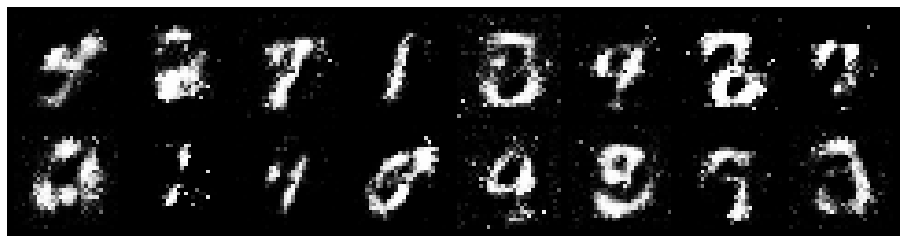

Epoch: [17/20], Batch Num: [300/600]
Discriminator Loss: 0.9017, Generator Loss: 1.6835
D(x): 0.7112, D(G(z)): 0.2964
Epoch: [17/20], Batch Num: [301/600]
Discriminator Loss: 0.9306, Generator Loss: 1.6905
D(x): 0.6841, D(G(z)): 0.2995
Epoch: [17/20], Batch Num: [302/600]
Discriminator Loss: 0.9094, Generator Loss: 1.8773
D(x): 0.7149, D(G(z)): 0.3189
Epoch: [17/20], Batch Num: [303/600]
Discriminator Loss: 0.8795, Generator Loss: 1.7648
D(x): 0.6836, D(G(z)): 0.2565
Epoch: [17/20], Batch Num: [304/600]
Discriminator Loss: 0.7620, Generator Loss: 1.9576
D(x): 0.7430, D(G(z)): 0.2740
Epoch: [17/20], Batch Num: [305/600]
Discriminator Loss: 0.7079, Generator Loss: 1.7724
D(x): 0.7227, D(G(z)): 0.2363
Epoch: [17/20], Batch Num: [306/600]
Discriminator Loss: 0.8529, Generator Loss: 1.7698
D(x): 0.6899, D(G(z)): 0.2589
Epoch: [17/20], Batch Num: [307/600]
Discriminator Loss: 0.7541, Generator Loss: 1.7789
D(x): 0.7504, D(G(z)): 0.2701
Epoch: [17/20], Batch Num: [308/600]
Discriminator Loss:

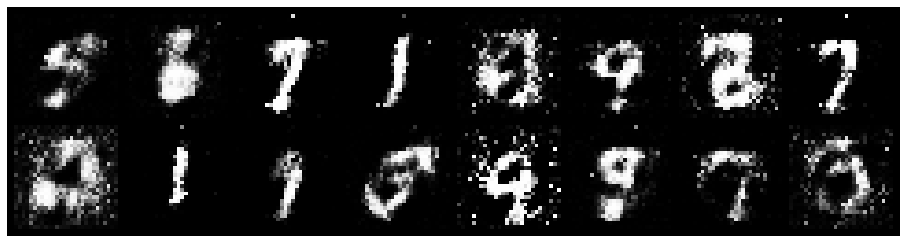

Epoch: [17/20], Batch Num: [400/600]
Discriminator Loss: 0.8536, Generator Loss: 1.8059
D(x): 0.6731, D(G(z)): 0.2289
Epoch: [17/20], Batch Num: [401/600]
Discriminator Loss: 1.0162, Generator Loss: 1.5490
D(x): 0.6375, D(G(z)): 0.2640
Epoch: [17/20], Batch Num: [402/600]
Discriminator Loss: 0.8065, Generator Loss: 1.6368
D(x): 0.7395, D(G(z)): 0.2807
Epoch: [17/20], Batch Num: [403/600]
Discriminator Loss: 0.8106, Generator Loss: 1.6499
D(x): 0.7737, D(G(z)): 0.3004
Epoch: [17/20], Batch Num: [404/600]
Discriminator Loss: 1.0147, Generator Loss: 1.8000
D(x): 0.7243, D(G(z)): 0.3264
Epoch: [17/20], Batch Num: [405/600]
Discriminator Loss: 0.9143, Generator Loss: 1.9032
D(x): 0.7236, D(G(z)): 0.3022
Epoch: [17/20], Batch Num: [406/600]
Discriminator Loss: 0.8633, Generator Loss: 2.0134
D(x): 0.6644, D(G(z)): 0.2472
Epoch: [17/20], Batch Num: [407/600]
Discriminator Loss: 0.7223, Generator Loss: 1.9101
D(x): 0.7403, D(G(z)): 0.2296
Epoch: [17/20], Batch Num: [408/600]
Discriminator Loss:

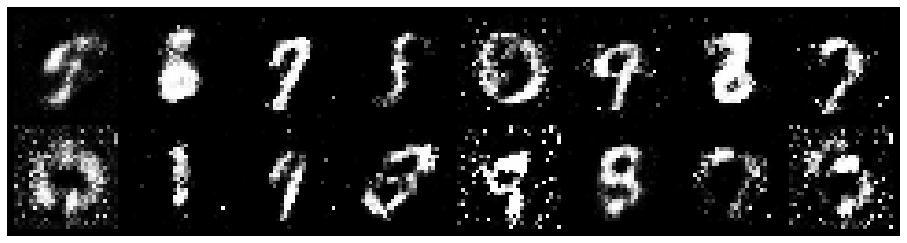

Epoch: [17/20], Batch Num: [500/600]
Discriminator Loss: 0.8105, Generator Loss: 1.6720
D(x): 0.7804, D(G(z)): 0.3328
Epoch: [17/20], Batch Num: [501/600]
Discriminator Loss: 0.6954, Generator Loss: 1.9987
D(x): 0.8021, D(G(z)): 0.2843
Epoch: [17/20], Batch Num: [502/600]
Discriminator Loss: 0.7234, Generator Loss: 2.0454
D(x): 0.7146, D(G(z)): 0.2110
Epoch: [17/20], Batch Num: [503/600]
Discriminator Loss: 0.8218, Generator Loss: 2.0531
D(x): 0.6707, D(G(z)): 0.2078
Epoch: [17/20], Batch Num: [504/600]
Discriminator Loss: 0.7165, Generator Loss: 1.8588
D(x): 0.6816, D(G(z)): 0.1859
Epoch: [17/20], Batch Num: [505/600]
Discriminator Loss: 0.6915, Generator Loss: 1.8664
D(x): 0.7472, D(G(z)): 0.2305
Epoch: [17/20], Batch Num: [506/600]
Discriminator Loss: 0.7482, Generator Loss: 1.6461
D(x): 0.7581, D(G(z)): 0.2756
Epoch: [17/20], Batch Num: [507/600]
Discriminator Loss: 0.7648, Generator Loss: 1.5405
D(x): 0.8023, D(G(z)): 0.2972
Epoch: [17/20], Batch Num: [508/600]
Discriminator Loss:

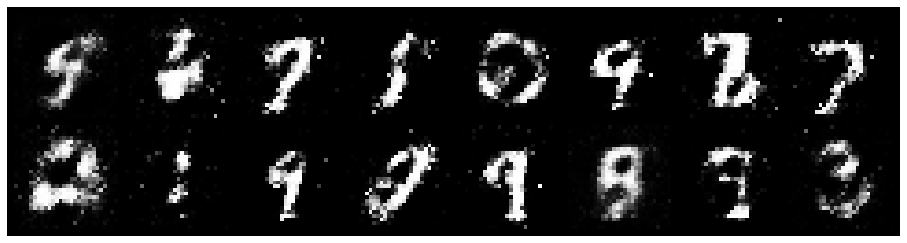

Epoch: [18/20], Batch Num: [0/600]
Discriminator Loss: 0.6399, Generator Loss: 2.0375
D(x): 0.7959, D(G(z)): 0.2082
Epoch: [18/20], Batch Num: [1/600]
Discriminator Loss: 0.5535, Generator Loss: 2.1049
D(x): 0.8344, D(G(z)): 0.1944
Epoch: [18/20], Batch Num: [2/600]
Discriminator Loss: 0.7699, Generator Loss: 2.3058
D(x): 0.8004, D(G(z)): 0.2653
Epoch: [18/20], Batch Num: [3/600]
Discriminator Loss: 0.7719, Generator Loss: 2.7096
D(x): 0.8138, D(G(z)): 0.2709
Epoch: [18/20], Batch Num: [4/600]
Discriminator Loss: 0.7990, Generator Loss: 2.7461
D(x): 0.7123, D(G(z)): 0.1512
Epoch: [18/20], Batch Num: [5/600]
Discriminator Loss: 0.8381, Generator Loss: 2.5747
D(x): 0.6939, D(G(z)): 0.1799
Epoch: [18/20], Batch Num: [6/600]
Discriminator Loss: 0.7971, Generator Loss: 1.9757
D(x): 0.7282, D(G(z)): 0.2061
Epoch: [18/20], Batch Num: [7/600]
Discriminator Loss: 0.9744, Generator Loss: 1.8371
D(x): 0.8175, D(G(z)): 0.3580
Epoch: [18/20], Batch Num: [8/600]
Discriminator Loss: 0.9198, Generator

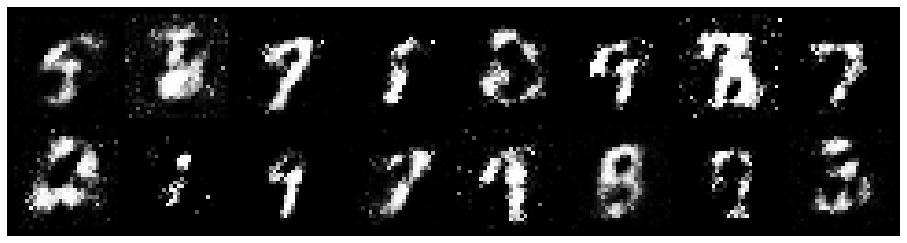

Epoch: [18/20], Batch Num: [100/600]
Discriminator Loss: 0.6351, Generator Loss: 2.0929
D(x): 0.7788, D(G(z)): 0.2346
Epoch: [18/20], Batch Num: [101/600]
Discriminator Loss: 0.6108, Generator Loss: 2.2042
D(x): 0.7921, D(G(z)): 0.2349
Epoch: [18/20], Batch Num: [102/600]
Discriminator Loss: 0.7500, Generator Loss: 2.1964
D(x): 0.6898, D(G(z)): 0.1997
Epoch: [18/20], Batch Num: [103/600]
Discriminator Loss: 0.5899, Generator Loss: 2.1303
D(x): 0.8024, D(G(z)): 0.2179
Epoch: [18/20], Batch Num: [104/600]
Discriminator Loss: 0.5711, Generator Loss: 2.1713
D(x): 0.7995, D(G(z)): 0.1961
Epoch: [18/20], Batch Num: [105/600]
Discriminator Loss: 0.6045, Generator Loss: 2.1272
D(x): 0.8357, D(G(z)): 0.2482
Epoch: [18/20], Batch Num: [106/600]
Discriminator Loss: 0.6803, Generator Loss: 2.1625
D(x): 0.7730, D(G(z)): 0.2169
Epoch: [18/20], Batch Num: [107/600]
Discriminator Loss: 0.5801, Generator Loss: 2.5777
D(x): 0.8023, D(G(z)): 0.2032
Epoch: [18/20], Batch Num: [108/600]
Discriminator Loss:

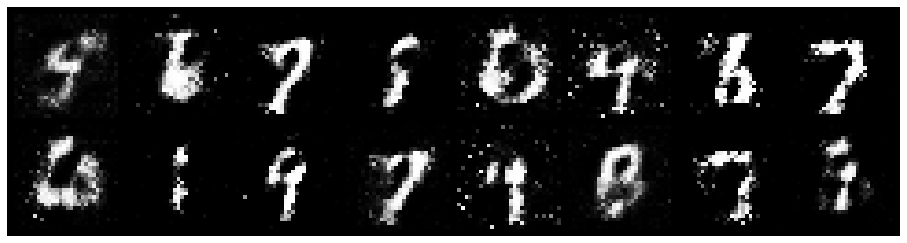

Epoch: [18/20], Batch Num: [200/600]
Discriminator Loss: 0.8063, Generator Loss: 1.5657
D(x): 0.7636, D(G(z)): 0.3079
Epoch: [18/20], Batch Num: [201/600]
Discriminator Loss: 0.6182, Generator Loss: 1.5041
D(x): 0.8033, D(G(z)): 0.2684
Epoch: [18/20], Batch Num: [202/600]
Discriminator Loss: 0.7626, Generator Loss: 1.7966
D(x): 0.7878, D(G(z)): 0.3125
Epoch: [18/20], Batch Num: [203/600]
Discriminator Loss: 0.7341, Generator Loss: 1.8360
D(x): 0.7450, D(G(z)): 0.2503
Epoch: [18/20], Batch Num: [204/600]
Discriminator Loss: 0.6738, Generator Loss: 2.2826
D(x): 0.7780, D(G(z)): 0.2531
Epoch: [18/20], Batch Num: [205/600]
Discriminator Loss: 0.8510, Generator Loss: 2.0449
D(x): 0.6503, D(G(z)): 0.2121
Epoch: [18/20], Batch Num: [206/600]
Discriminator Loss: 0.8770, Generator Loss: 1.7132
D(x): 0.6696, D(G(z)): 0.2469
Epoch: [18/20], Batch Num: [207/600]
Discriminator Loss: 0.6459, Generator Loss: 1.5319
D(x): 0.8045, D(G(z)): 0.2512
Epoch: [18/20], Batch Num: [208/600]
Discriminator Loss:

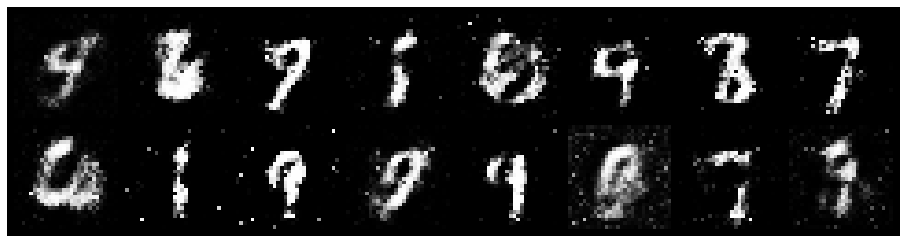

Epoch: [18/20], Batch Num: [300/600]
Discriminator Loss: 0.7430, Generator Loss: 1.5287
D(x): 0.7516, D(G(z)): 0.2590
Epoch: [18/20], Batch Num: [301/600]
Discriminator Loss: 0.8934, Generator Loss: 1.4504
D(x): 0.7045, D(G(z)): 0.2764
Epoch: [18/20], Batch Num: [302/600]
Discriminator Loss: 1.0098, Generator Loss: 1.5216
D(x): 0.6837, D(G(z)): 0.3106
Epoch: [18/20], Batch Num: [303/600]
Discriminator Loss: 0.8715, Generator Loss: 1.5190
D(x): 0.7427, D(G(z)): 0.2750
Epoch: [18/20], Batch Num: [304/600]
Discriminator Loss: 1.0266, Generator Loss: 1.7612
D(x): 0.7228, D(G(z)): 0.3320
Epoch: [18/20], Batch Num: [305/600]
Discriminator Loss: 1.0635, Generator Loss: 1.5776
D(x): 0.6763, D(G(z)): 0.3161
Epoch: [18/20], Batch Num: [306/600]
Discriminator Loss: 0.9536, Generator Loss: 1.4576
D(x): 0.6655, D(G(z)): 0.2764
Epoch: [18/20], Batch Num: [307/600]
Discriminator Loss: 1.1373, Generator Loss: 1.6396
D(x): 0.6732, D(G(z)): 0.3661
Epoch: [18/20], Batch Num: [308/600]
Discriminator Loss:

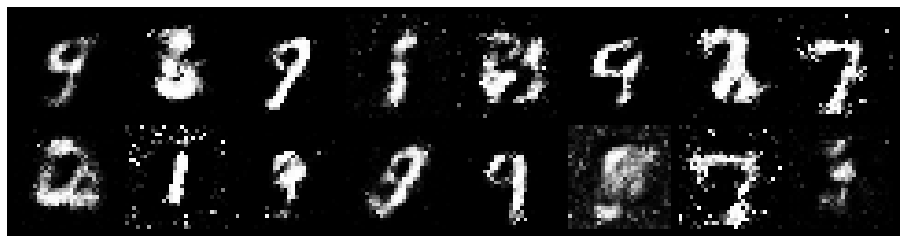

Epoch: [18/20], Batch Num: [400/600]
Discriminator Loss: 1.0851, Generator Loss: 1.3695
D(x): 0.6370, D(G(z)): 0.3301
Epoch: [18/20], Batch Num: [401/600]
Discriminator Loss: 0.7758, Generator Loss: 1.4059
D(x): 0.7160, D(G(z)): 0.2701
Epoch: [18/20], Batch Num: [402/600]
Discriminator Loss: 0.9632, Generator Loss: 1.2686
D(x): 0.6705, D(G(z)): 0.3171
Epoch: [18/20], Batch Num: [403/600]
Discriminator Loss: 0.9006, Generator Loss: 1.3233
D(x): 0.7239, D(G(z)): 0.3071
Epoch: [18/20], Batch Num: [404/600]
Discriminator Loss: 0.9721, Generator Loss: 1.4122
D(x): 0.7223, D(G(z)): 0.3486
Epoch: [18/20], Batch Num: [405/600]
Discriminator Loss: 0.8932, Generator Loss: 1.5361
D(x): 0.7196, D(G(z)): 0.3348
Epoch: [18/20], Batch Num: [406/600]
Discriminator Loss: 0.9141, Generator Loss: 1.8076
D(x): 0.6903, D(G(z)): 0.3134
Epoch: [18/20], Batch Num: [407/600]
Discriminator Loss: 0.8947, Generator Loss: 1.5462
D(x): 0.6612, D(G(z)): 0.2576
Epoch: [18/20], Batch Num: [408/600]
Discriminator Loss:

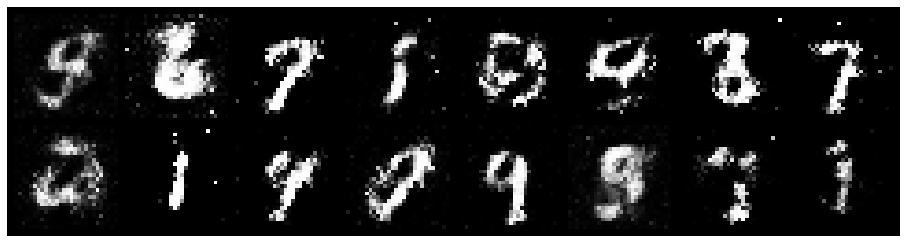

Epoch: [18/20], Batch Num: [500/600]
Discriminator Loss: 0.7671, Generator Loss: 2.1376
D(x): 0.7304, D(G(z)): 0.2473
Epoch: [18/20], Batch Num: [501/600]
Discriminator Loss: 0.6903, Generator Loss: 1.7244
D(x): 0.7443, D(G(z)): 0.2193
Epoch: [18/20], Batch Num: [502/600]
Discriminator Loss: 0.7758, Generator Loss: 1.9445
D(x): 0.7914, D(G(z)): 0.2964
Epoch: [18/20], Batch Num: [503/600]
Discriminator Loss: 0.7521, Generator Loss: 1.8163
D(x): 0.8072, D(G(z)): 0.3065
Epoch: [18/20], Batch Num: [504/600]
Discriminator Loss: 0.8310, Generator Loss: 1.9296
D(x): 0.7468, D(G(z)): 0.2801
Epoch: [18/20], Batch Num: [505/600]
Discriminator Loss: 0.6541, Generator Loss: 2.1627
D(x): 0.8049, D(G(z)): 0.2351
Epoch: [18/20], Batch Num: [506/600]
Discriminator Loss: 0.7001, Generator Loss: 1.9350
D(x): 0.7658, D(G(z)): 0.2191
Epoch: [18/20], Batch Num: [507/600]
Discriminator Loss: 0.8128, Generator Loss: 1.9661
D(x): 0.6813, D(G(z)): 0.2039
Epoch: [18/20], Batch Num: [508/600]
Discriminator Loss:

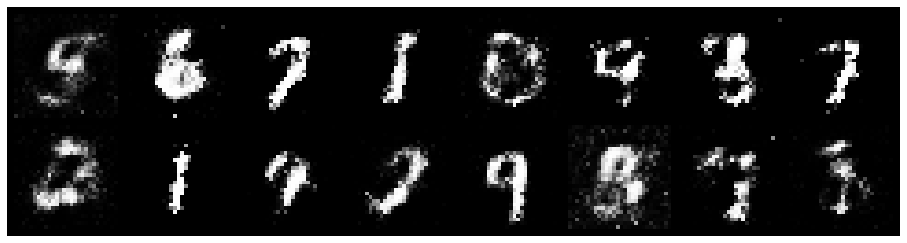

Epoch: [19/20], Batch Num: [0/600]
Discriminator Loss: 0.8065, Generator Loss: 1.4889
D(x): 0.7634, D(G(z)): 0.2949
Epoch: [19/20], Batch Num: [1/600]
Discriminator Loss: 0.8236, Generator Loss: 1.5840
D(x): 0.7798, D(G(z)): 0.3136
Epoch: [19/20], Batch Num: [2/600]
Discriminator Loss: 0.8944, Generator Loss: 1.6808
D(x): 0.7277, D(G(z)): 0.2880
Epoch: [19/20], Batch Num: [3/600]
Discriminator Loss: 0.7793, Generator Loss: 1.7087
D(x): 0.7372, D(G(z)): 0.2722
Epoch: [19/20], Batch Num: [4/600]
Discriminator Loss: 1.0048, Generator Loss: 1.5033
D(x): 0.6214, D(G(z)): 0.2449
Epoch: [19/20], Batch Num: [5/600]
Discriminator Loss: 0.8765, Generator Loss: 1.6611
D(x): 0.7104, D(G(z)): 0.2888
Epoch: [19/20], Batch Num: [6/600]
Discriminator Loss: 0.7085, Generator Loss: 1.6443
D(x): 0.7849, D(G(z)): 0.2575
Epoch: [19/20], Batch Num: [7/600]
Discriminator Loss: 1.0260, Generator Loss: 1.7832
D(x): 0.7366, D(G(z)): 0.3155
Epoch: [19/20], Batch Num: [8/600]
Discriminator Loss: 0.8103, Generator

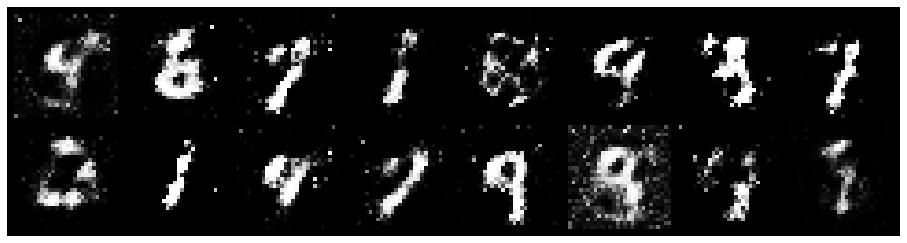

Epoch: [19/20], Batch Num: [100/600]
Discriminator Loss: 0.7053, Generator Loss: 1.7620
D(x): 0.7292, D(G(z)): 0.2255
Epoch: [19/20], Batch Num: [101/600]
Discriminator Loss: 0.6703, Generator Loss: 1.6210
D(x): 0.7671, D(G(z)): 0.2450
Epoch: [19/20], Batch Num: [102/600]
Discriminator Loss: 0.6969, Generator Loss: 1.6197
D(x): 0.8145, D(G(z)): 0.2926
Epoch: [19/20], Batch Num: [103/600]
Discriminator Loss: 0.6175, Generator Loss: 1.6030
D(x): 0.8060, D(G(z)): 0.2483
Epoch: [19/20], Batch Num: [104/600]
Discriminator Loss: 0.6167, Generator Loss: 1.8721
D(x): 0.8397, D(G(z)): 0.2768
Epoch: [19/20], Batch Num: [105/600]
Discriminator Loss: 0.5497, Generator Loss: 2.1355
D(x): 0.8033, D(G(z)): 0.2155
Epoch: [19/20], Batch Num: [106/600]
Discriminator Loss: 0.6319, Generator Loss: 2.2003
D(x): 0.7946, D(G(z)): 0.2281
Epoch: [19/20], Batch Num: [107/600]
Discriminator Loss: 0.7340, Generator Loss: 2.4192
D(x): 0.7296, D(G(z)): 0.2026
Epoch: [19/20], Batch Num: [108/600]
Discriminator Loss:

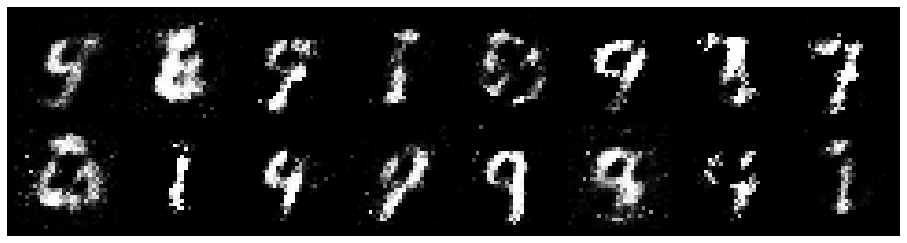

Epoch: [19/20], Batch Num: [200/600]
Discriminator Loss: 0.8048, Generator Loss: 1.6375
D(x): 0.7213, D(G(z)): 0.2872
Epoch: [19/20], Batch Num: [201/600]
Discriminator Loss: 0.7735, Generator Loss: 1.6536
D(x): 0.7479, D(G(z)): 0.2956
Epoch: [19/20], Batch Num: [202/600]
Discriminator Loss: 0.7042, Generator Loss: 1.7043
D(x): 0.7368, D(G(z)): 0.2239
Epoch: [19/20], Batch Num: [203/600]
Discriminator Loss: 0.7054, Generator Loss: 1.6667
D(x): 0.7291, D(G(z)): 0.2282
Epoch: [19/20], Batch Num: [204/600]
Discriminator Loss: 0.6599, Generator Loss: 1.7062
D(x): 0.7630, D(G(z)): 0.2430
Epoch: [19/20], Batch Num: [205/600]
Discriminator Loss: 0.6066, Generator Loss: 1.6894
D(x): 0.7858, D(G(z)): 0.2412
Epoch: [19/20], Batch Num: [206/600]
Discriminator Loss: 0.6428, Generator Loss: 1.7828
D(x): 0.8005, D(G(z)): 0.2694
Epoch: [19/20], Batch Num: [207/600]
Discriminator Loss: 0.7856, Generator Loss: 1.8369
D(x): 0.7446, D(G(z)): 0.2724
Epoch: [19/20], Batch Num: [208/600]
Discriminator Loss:

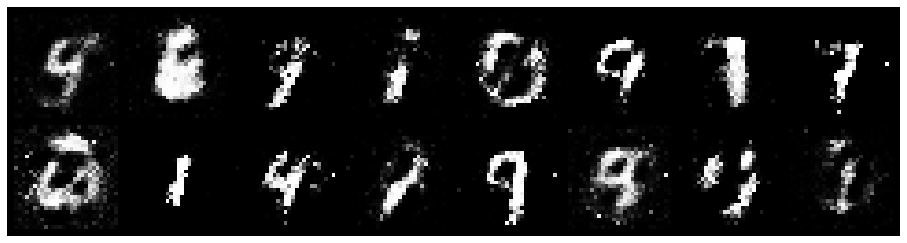

Epoch: [19/20], Batch Num: [300/600]
Discriminator Loss: 0.7406, Generator Loss: 1.2175
D(x): 0.8158, D(G(z)): 0.3493
Epoch: [19/20], Batch Num: [301/600]
Discriminator Loss: 0.7702, Generator Loss: 1.3613
D(x): 0.7834, D(G(z)): 0.3362
Epoch: [19/20], Batch Num: [302/600]
Discriminator Loss: 0.7389, Generator Loss: 1.5799
D(x): 0.7708, D(G(z)): 0.3058
Epoch: [19/20], Batch Num: [303/600]
Discriminator Loss: 0.7262, Generator Loss: 1.8607
D(x): 0.7600, D(G(z)): 0.2758
Epoch: [19/20], Batch Num: [304/600]
Discriminator Loss: 0.6645, Generator Loss: 1.7655
D(x): 0.7574, D(G(z)): 0.2449
Epoch: [19/20], Batch Num: [305/600]
Discriminator Loss: 0.7054, Generator Loss: 2.0519
D(x): 0.7137, D(G(z)): 0.2151
Epoch: [19/20], Batch Num: [306/600]
Discriminator Loss: 0.7385, Generator Loss: 2.0903
D(x): 0.7063, D(G(z)): 0.2315
Epoch: [19/20], Batch Num: [307/600]
Discriminator Loss: 0.6042, Generator Loss: 1.9334
D(x): 0.7797, D(G(z)): 0.2296
Epoch: [19/20], Batch Num: [308/600]
Discriminator Loss:

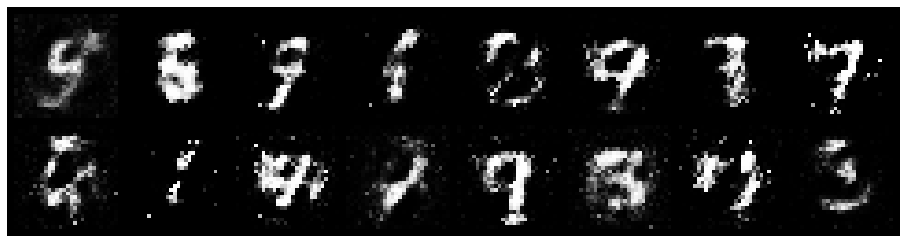

Epoch: [19/20], Batch Num: [400/600]
Discriminator Loss: 1.1430, Generator Loss: 1.0576
D(x): 0.6478, D(G(z)): 0.3530
Epoch: [19/20], Batch Num: [401/600]
Discriminator Loss: 1.2323, Generator Loss: 1.1386
D(x): 0.6442, D(G(z)): 0.4009
Epoch: [19/20], Batch Num: [402/600]
Discriminator Loss: 1.2581, Generator Loss: 1.0183
D(x): 0.6598, D(G(z)): 0.4402
Epoch: [19/20], Batch Num: [403/600]
Discriminator Loss: 1.0680, Generator Loss: 1.2100
D(x): 0.7040, D(G(z)): 0.3971
Epoch: [19/20], Batch Num: [404/600]
Discriminator Loss: 1.1130, Generator Loss: 1.2472
D(x): 0.6196, D(G(z)): 0.3476
Epoch: [19/20], Batch Num: [405/600]
Discriminator Loss: 1.0809, Generator Loss: 1.3481
D(x): 0.6059, D(G(z)): 0.3208
Epoch: [19/20], Batch Num: [406/600]
Discriminator Loss: 1.0959, Generator Loss: 1.3706
D(x): 0.5934, D(G(z)): 0.3135
Epoch: [19/20], Batch Num: [407/600]
Discriminator Loss: 1.0261, Generator Loss: 1.1407
D(x): 0.6133, D(G(z)): 0.3160
Epoch: [19/20], Batch Num: [408/600]
Discriminator Loss:

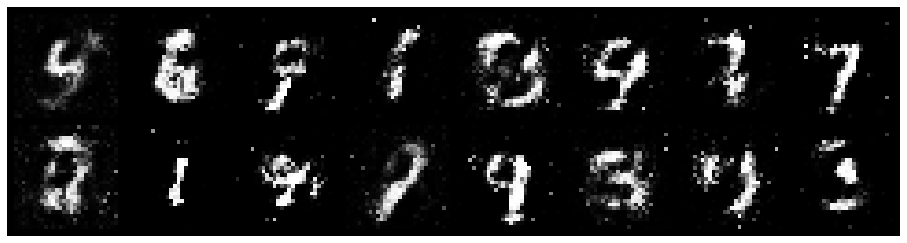

Epoch: [19/20], Batch Num: [500/600]
Discriminator Loss: 1.2123, Generator Loss: 1.4360
D(x): 0.6330, D(G(z)): 0.3629
Epoch: [19/20], Batch Num: [501/600]
Discriminator Loss: 1.0496, Generator Loss: 1.3733
D(x): 0.6239, D(G(z)): 0.2911
Epoch: [19/20], Batch Num: [502/600]
Discriminator Loss: 1.1945, Generator Loss: 1.2529
D(x): 0.6271, D(G(z)): 0.3651
Epoch: [19/20], Batch Num: [503/600]
Discriminator Loss: 1.1034, Generator Loss: 1.2581
D(x): 0.7125, D(G(z)): 0.3953
Epoch: [19/20], Batch Num: [504/600]
Discriminator Loss: 1.2862, Generator Loss: 1.3268
D(x): 0.5909, D(G(z)): 0.3629
Epoch: [19/20], Batch Num: [505/600]
Discriminator Loss: 1.1162, Generator Loss: 1.2550
D(x): 0.6068, D(G(z)): 0.3426
Epoch: [19/20], Batch Num: [506/600]
Discriminator Loss: 1.0175, Generator Loss: 1.2394
D(x): 0.6556, D(G(z)): 0.3306
Epoch: [19/20], Batch Num: [507/600]
Discriminator Loss: 1.0836, Generator Loss: 1.3380
D(x): 0.6100, D(G(z)): 0.3190
Epoch: [19/20], Batch Num: [508/600]
Discriminator Loss:

In [14]:
num_epochs=20
for epoch in range(num_epochs):
  
    for n_batch, (real_batch,_) in enumerate(data_loader):
        n = real_batch.size(0)
        #Transformez le lot de données en variables Torch à l'aide des fonctions Variable et gt.images_to_vectors. 
        #Ce sont les vraies données pour l'étape suivante.
        # 1 Train Discriminator
        # 1.1 Prepare real data
        real_data = Variable(gt.images_to_vectors(real_batch))
       
        
            
        # 1.2 Generate fake data with the Generator
        #""" A COMPLETER : Créer des vecteurs bruit """
        #(les gradients ne sont donc pas calculés pour le générateur)
        fake_data = generator(gt.noise(n)).detach()
        #""" A COMPLETER : Générer des images avec le générateur """
        
        # 1.3 Train Discriminator 
       # """ A COMPLETER : Entrainer le discriminateur """
        d_error, d_pred_real, d_pred_fake = train_discriminator(d_optimizer, real_data, fake_data)

 
        # 2 Train Generator
        # 2.1 Generate noise
        fake_data = generator(gt.noise(n))
                      
        # 2.2 Train Generator
        #"""  A COMPLETER : Entrainer le generateur """
        g_error = train_generator(g_optimizer, fake_data)
                              
        # Generate images from a fixed noise input and visualize the output
        gt.plot_gan(epoch, n_batch, num_batches, generator)

        # Display status Logs
        gt.logger.display_status(
                epoch, num_epochs, n_batch, num_batches,
                d_error, g_error, d_pred_real, d_pred_fake
            )

  

Au début, les images générées sont du pur bruit, mais elles s'améliorent ensuite, jusqu'à ce qu'on obtienne des images assez bonnes.

Il est également possible de visualiser le processus d'apprentissage. Comme vous pouvez le voir dans le bloc précédent, l'erreur du discriminateur est très élevée au début, car il ne sait pas comment classer correctement les images comme étant réelles ou fausses. Au fur et à mesure que le discriminateur s'améliore et que son erreur diminue à environ 0,4 .
Quant à l'erreur du générateur, elle augmente, ce qui prouve que le discriminateur est plus performant que le générateur et qu'il peut classer correctement les échantillons faux.

En poursuivant l'entraînement, l'erreur du générateur diminue, ce qui implique que les images qu'il génère sont de mieux en mieux. Alors que le générateur s'améliore, l'erreur du discriminateur augmente, car les images deviennent chaque fois plus réalistes.

In [17]:
def train_discriminator(optimizer, real_data, fake_data):
    N = real_data.size(0)
    # Reset gradients
    optimizer.zero_grad()

    # 1.1 Train on Real Data
    prediction_real = discriminator(real_data)
    # Calculate error and backpropagate
    error_real = loss(prediction_real.cuda(), ones_target(N).cuda())
    error_real.backward()

    # 1.2 Train on Fake Data
    prediction_fake = discriminator(fake_data)
    # Calculate error and backpropagate
    error_fake = loss(prediction_fake.cuda(), zeros_target(N).cuda())
    error_fake.backward()

    # 1.3 Update weights with gradients
    optimizer.step()

    # Return error and predictions for real and fake inputs
    return error_real + error_fake, prediction_real, prediction_fake

def train_generator(optimizer, fake_data):
    N = fake_data.size(0)
    # Reset gradients
    optimizer.zero_grad()
    # Sample noise and generate fake data
    prediction = discriminator(fake_data)
    # Calculate error and backpropagate
    error = loss(prediction.cuda(), ones_target(N).cuda())
    error.backward()
    # Update weights with gradients
    optimizer.step()
    # Return error
    return error



###### 7. Exploration et optimisation

Modifiez la structure des deux réseaux (discriminateur et générateur) en ajoutant ou enlevant des couches cachées, en modifiant le nombre de neurones dans ces couches et en jouant sur les paramètres des fonctions LeakyReLU et Dropout.

Après avoir expliqué comment évaluer la qualité des images générées par le générateur, comparez la qualité des résultats obtenus avec les modifications que vous avez testé et essayez d’obtenir le meilleur résultat possible.

In [19]:
class DiscriminatorNet(nn.Module):
#On ajoute une couche cachée + Modifiant le nombre de neurones dans ces couches
 #LeakyReLU à alpha = 0.10 et Dropout0.5
    def __init__(self):
        super(DiscriminatorNet, self).__init__()
        n_features = 784
        n_out = 1
        
        self.hidden0 = nn.Sequential( 
            nn.Linear(n_features, 1024),
            nn.LeakyReLU(0.1),
            nn.Dropout(0.5)
        )
      

        self.hidden1 = nn.Sequential(
            nn.Linear(1024, 768),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )

        self.hidden2 = nn.Sequential(
            nn.Linear(768, 512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )

        self.hidden3 = nn.Sequential(
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
            
        self.out = nn.Sequential(
            torch.nn.Linear(256, n_out),
            torch.nn.Sigmoid()
        )

    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.hidden3(x)
        x = self.out(x)
        return x
    
discriminator = DiscriminatorNet()

In [21]:
class GeneratorNet(nn.Module):
    """
    4 couches cachées generative neural network
    """

    def __init__(self):
        super(GeneratorNet, self).__init__()
        n_features = 100
        n_out = 784

        self.hidden0 = nn.Sequential(
            nn.Linear(n_features, 256),
            nn.LeakyReLU(0.1)
        )

        self.hidden1 = nn.Sequential(
            nn.Linear(256, 512),
            nn.LeakyReLU(0.1)
        )

        self.hidden2 = nn.Sequential(
            nn.Linear(512, 768 ),
            nn.LeakyReLU(0.1)
        )
        
        self.hidden3 = nn.Sequential(
            nn.Linear(768, 1024),
            nn.LeakyReLU(0.1),
            
        )
         

        self.out = nn.Sequential(
            nn.Linear(1024, n_out),
            nn.Tanh()
        )

    def forward(self, x):
       
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.hidden3(x)
        x = self.out(x)
        return x
generator = GeneratorNet()

if torch.cuda.is_available():
    discriminator.cuda()
    generator.cuda()
    
# Optimizers
d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0002)
g_optimizer = optim.Adam(generator.parameters(), lr=0.0002)

# Loss function 
loss = nn.BCELoss()

In [22]:
def train_discriminator(optimizer, real_data, fake_data):
    # Reset gradients
    optimizer.zero_grad()
    
    # 1.1 Train on Real Data
    prediction_real = discriminator(real_data)
    # Calculate error and backpropagate
    error_real = loss(prediction_real, gt.real_data_target(real_data.size(0)))
    error_real.backward()

    # 1.2 Train on Fake Data
    prediction_fake = discriminator(fake_data)
    # Calculate error and backpropagate
    error_fake = loss(prediction_fake, gt.fake_data_target(real_data.size(0)))
    error_fake.backward()
    
    # 1.3 Update weights with gradients
    optimizer.step()
    
    # Return error
    return error_real + error_fake, prediction_real, prediction_fake

def train_generator(optimizer, fake_data):
    # 2. Train Generator
    # Reset gradients
    optimizer.zero_grad()
    # Sample noise and generate fake data
    prediction = discriminator(fake_data)
    # Calculate error and backpropagate
    error = loss(prediction, gt.real_data_target(prediction.size(0)))
    error.backward()
    # Update weights with gradients
    optimizer.step()
    # Return error
    return error




Epoch: 0, Batch Num: [0/600]


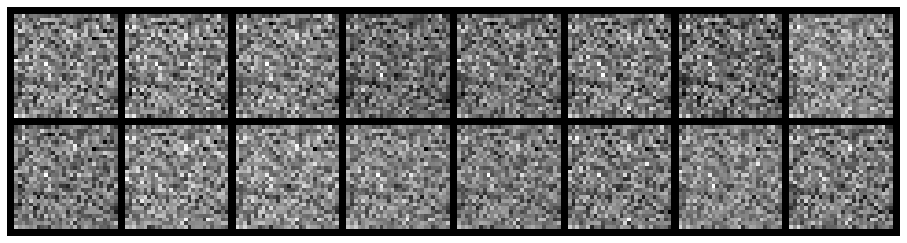

Epoch: [0/20], Batch Num: [0/600]
Discriminator Loss: 1.3811, Generator Loss: 0.7151
D(x): 0.4914, D(G(z)): 0.4885
Epoch: [0/20], Batch Num: [1/600]
Discriminator Loss: 1.3041, Generator Loss: 0.7127
D(x): 0.5318, D(G(z)): 0.4896
Epoch: [0/20], Batch Num: [2/600]
Discriminator Loss: 1.2142, Generator Loss: 0.7083
D(x): 0.5841, D(G(z)): 0.4914
Epoch: [0/20], Batch Num: [3/600]
Discriminator Loss: 1.1055, Generator Loss: 0.7016
D(x): 0.6549, D(G(z)): 0.4943
Epoch: [0/20], Batch Num: [4/600]
Discriminator Loss: 0.9954, Generator Loss: 0.6876
D(x): 0.7392, D(G(z)): 0.4996
Epoch: [0/20], Batch Num: [5/600]
Discriminator Loss: 0.9013, Generator Loss: 0.6620
D(x): 0.8275, D(G(z)): 0.5090
Epoch: [0/20], Batch Num: [6/600]
Discriminator Loss: 0.8470, Generator Loss: 0.6230
D(x): 0.9068, D(G(z)): 0.5270
Epoch: [0/20], Batch Num: [7/600]
Discriminator Loss: 0.8443, Generator Loss: 0.5659
D(x): 0.9633, D(G(z)): 0.5536
Epoch: [0/20], Batch Num: [8/600]
Discriminator Loss: 0.9213, Generator Loss: 0.

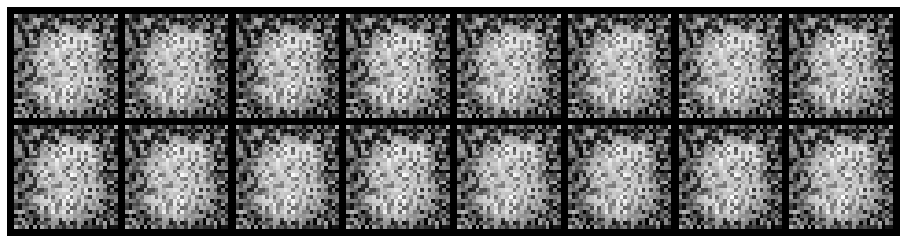

Epoch: [0/20], Batch Num: [100/600]
Discriminator Loss: 1.2226, Generator Loss: 1.1257
D(x): 0.8606, D(G(z)): 0.6253
Epoch: [0/20], Batch Num: [101/600]
Discriminator Loss: 1.0580, Generator Loss: 1.7958
D(x): 0.8532, D(G(z)): 0.5280
Epoch: [0/20], Batch Num: [102/600]
Discriminator Loss: 0.9436, Generator Loss: 2.2187
D(x): 0.8310, D(G(z)): 0.4480
Epoch: [0/20], Batch Num: [103/600]
Discriminator Loss: 1.0432, Generator Loss: 2.2022
D(x): 0.8228, D(G(z)): 0.4535
Epoch: [0/20], Batch Num: [104/600]
Discriminator Loss: 1.2752, Generator Loss: 1.4897
D(x): 0.7521, D(G(z)): 0.4728
Epoch: [0/20], Batch Num: [105/600]
Discriminator Loss: 1.5371, Generator Loss: 0.8708
D(x): 0.8103, D(G(z)): 0.6400
Epoch: [0/20], Batch Num: [106/600]
Discriminator Loss: 1.7817, Generator Loss: 0.4807
D(x): 0.8405, D(G(z)): 0.7410
Epoch: [0/20], Batch Num: [107/600]
Discriminator Loss: 1.8604, Generator Loss: 0.3794
D(x): 0.8710, D(G(z)): 0.7891
Epoch: [0/20], Batch Num: [108/600]
Discriminator Loss: 2.2591, 

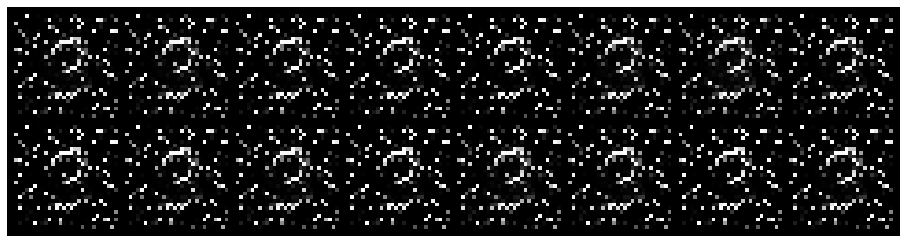

Epoch: [0/20], Batch Num: [200/600]
Discriminator Loss: 0.6372, Generator Loss: 1.6274
D(x): 0.7398, D(G(z)): 0.2765
Epoch: [0/20], Batch Num: [201/600]
Discriminator Loss: 0.5831, Generator Loss: 1.7845
D(x): 0.7523, D(G(z)): 0.2470
Epoch: [0/20], Batch Num: [202/600]
Discriminator Loss: 0.4591, Generator Loss: 2.0685
D(x): 0.7989, D(G(z)): 0.1995
Epoch: [0/20], Batch Num: [203/600]
Discriminator Loss: 0.3488, Generator Loss: 2.3218
D(x): 0.8416, D(G(z)): 0.1542
Epoch: [0/20], Batch Num: [204/600]
Discriminator Loss: 0.3318, Generator Loss: 2.6426
D(x): 0.8602, D(G(z)): 0.1545
Epoch: [0/20], Batch Num: [205/600]
Discriminator Loss: 0.2266, Generator Loss: 2.7364
D(x): 0.9053, D(G(z)): 0.1133
Epoch: [0/20], Batch Num: [206/600]
Discriminator Loss: 0.1769, Generator Loss: 3.2597
D(x): 0.9372, D(G(z)): 0.0999
Epoch: [0/20], Batch Num: [207/600]
Discriminator Loss: 0.1393, Generator Loss: 3.7013
D(x): 0.9518, D(G(z)): 0.0809
Epoch: [0/20], Batch Num: [208/600]
Discriminator Loss: 0.1107, 

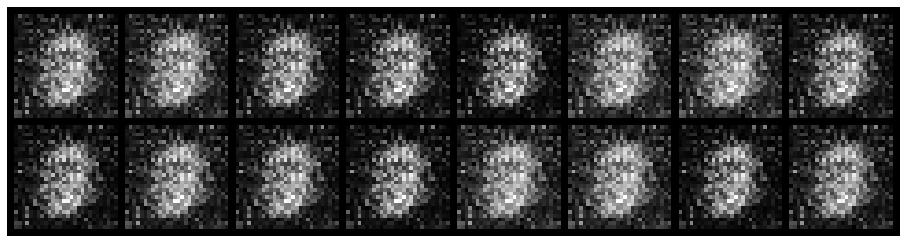

Epoch: [0/20], Batch Num: [300/600]
Discriminator Loss: 1.1457, Generator Loss: 1.0084
D(x): 0.6261, D(G(z)): 0.4423
Epoch: [0/20], Batch Num: [301/600]
Discriminator Loss: 1.0656, Generator Loss: 0.8392
D(x): 0.7104, D(G(z)): 0.4872
Epoch: [0/20], Batch Num: [302/600]
Discriminator Loss: 1.0440, Generator Loss: 0.9604
D(x): 0.7665, D(G(z)): 0.5038
Epoch: [0/20], Batch Num: [303/600]
Discriminator Loss: 0.9350, Generator Loss: 1.1901
D(x): 0.7899, D(G(z)): 0.4815
Epoch: [0/20], Batch Num: [304/600]
Discriminator Loss: 0.7046, Generator Loss: 1.7125
D(x): 0.7975, D(G(z)): 0.3646
Epoch: [0/20], Batch Num: [305/600]
Discriminator Loss: 0.5929, Generator Loss: 2.0959
D(x): 0.7551, D(G(z)): 0.2400
Epoch: [0/20], Batch Num: [306/600]
Discriminator Loss: 0.5200, Generator Loss: 2.4241
D(x): 0.7456, D(G(z)): 0.1697
Epoch: [0/20], Batch Num: [307/600]
Discriminator Loss: 0.5281, Generator Loss: 2.5764
D(x): 0.7116, D(G(z)): 0.1395
Epoch: [0/20], Batch Num: [308/600]
Discriminator Loss: 0.6211, 

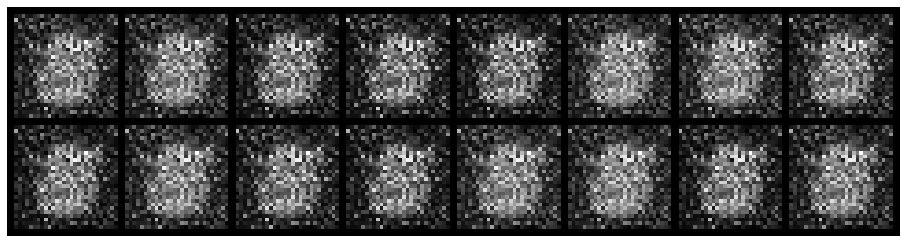

Epoch: [0/20], Batch Num: [400/600]
Discriminator Loss: 0.9080, Generator Loss: 0.7457
D(x): 0.7964, D(G(z)): 0.4868
Epoch: [0/20], Batch Num: [401/600]
Discriminator Loss: 0.9137, Generator Loss: 0.7577
D(x): 0.8061, D(G(z)): 0.4957
Epoch: [0/20], Batch Num: [402/600]
Discriminator Loss: 0.9307, Generator Loss: 0.8113
D(x): 0.8054, D(G(z)): 0.5029
Epoch: [0/20], Batch Num: [403/600]
Discriminator Loss: 0.9400, Generator Loss: 0.7340
D(x): 0.8127, D(G(z)): 0.5127
Epoch: [0/20], Batch Num: [404/600]
Discriminator Loss: 0.9554, Generator Loss: 0.6937
D(x): 0.8081, D(G(z)): 0.5148
Epoch: [0/20], Batch Num: [405/600]
Discriminator Loss: 1.0475, Generator Loss: 0.7161
D(x): 0.7924, D(G(z)): 0.5439
Epoch: [0/20], Batch Num: [406/600]
Discriminator Loss: 1.0959, Generator Loss: 0.6633
D(x): 0.7812, D(G(z)): 0.5597
Epoch: [0/20], Batch Num: [407/600]
Discriminator Loss: 1.1660, Generator Loss: 0.6539
D(x): 0.7467, D(G(z)): 0.5670
Epoch: [0/20], Batch Num: [408/600]
Discriminator Loss: 1.1915, 

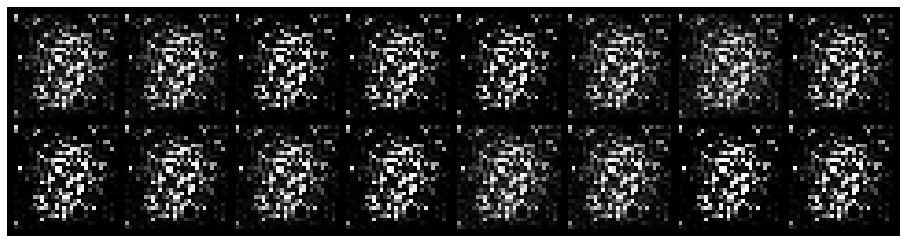

Epoch: [0/20], Batch Num: [500/600]
Discriminator Loss: 1.2793, Generator Loss: 1.4929
D(x): 0.7467, D(G(z)): 0.6055
Epoch: [0/20], Batch Num: [501/600]
Discriminator Loss: 1.0480, Generator Loss: 3.2172
D(x): 0.7159, D(G(z)): 0.4722
Epoch: [0/20], Batch Num: [502/600]
Discriminator Loss: 0.6565, Generator Loss: 4.7493
D(x): 0.7027, D(G(z)): 0.2333
Epoch: [0/20], Batch Num: [503/600]
Discriminator Loss: 0.5683, Generator Loss: 6.1685
D(x): 0.6740, D(G(z)): 0.1390
Epoch: [0/20], Batch Num: [504/600]
Discriminator Loss: 0.5298, Generator Loss: 7.8163
D(x): 0.6362, D(G(z)): 0.0579
Epoch: [0/20], Batch Num: [505/600]
Discriminator Loss: 0.5798, Generator Loss: 8.1771
D(x): 0.5876, D(G(z)): 0.0301
Epoch: [0/20], Batch Num: [506/600]
Discriminator Loss: 0.7035, Generator Loss: 7.7513
D(x): 0.5457, D(G(z)): 0.0592
Epoch: [0/20], Batch Num: [507/600]
Discriminator Loss: 0.8863, Generator Loss: 5.1463
D(x): 0.5007, D(G(z)): 0.0934
Epoch: [0/20], Batch Num: [508/600]
Discriminator Loss: 1.1779, 

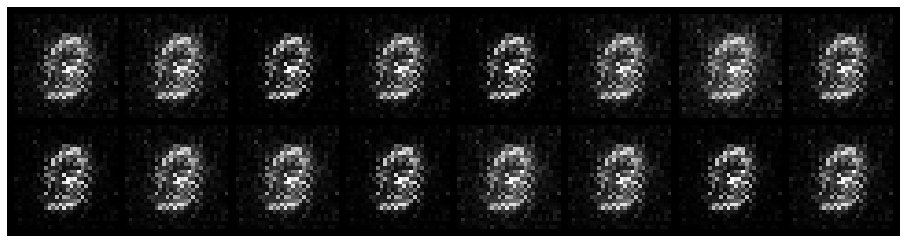

Epoch: [1/20], Batch Num: [0/600]
Discriminator Loss: 0.5202, Generator Loss: 4.0752
D(x): 0.7597, D(G(z)): 0.1811
Epoch: [1/20], Batch Num: [1/600]
Discriminator Loss: 0.5835, Generator Loss: 4.1026
D(x): 0.7446, D(G(z)): 0.1850
Epoch: [1/20], Batch Num: [2/600]
Discriminator Loss: 0.6986, Generator Loss: 3.1937
D(x): 0.6775, D(G(z)): 0.1940
Epoch: [1/20], Batch Num: [3/600]
Discriminator Loss: 0.9460, Generator Loss: 2.7345
D(x): 0.6192, D(G(z)): 0.2588
Epoch: [1/20], Batch Num: [4/600]
Discriminator Loss: 1.2503, Generator Loss: 1.9828
D(x): 0.6789, D(G(z)): 0.4707
Epoch: [1/20], Batch Num: [5/600]
Discriminator Loss: 1.7229, Generator Loss: 1.3584
D(x): 0.6017, D(G(z)): 0.5766
Epoch: [1/20], Batch Num: [6/600]
Discriminator Loss: 1.9445, Generator Loss: 0.7158
D(x): 0.5811, D(G(z)): 0.6461
Epoch: [1/20], Batch Num: [7/600]
Discriminator Loss: 1.8127, Generator Loss: 0.7706
D(x): 0.6881, D(G(z)): 0.7034
Epoch: [1/20], Batch Num: [8/600]
Discriminator Loss: 1.7337, Generator Loss: 0.

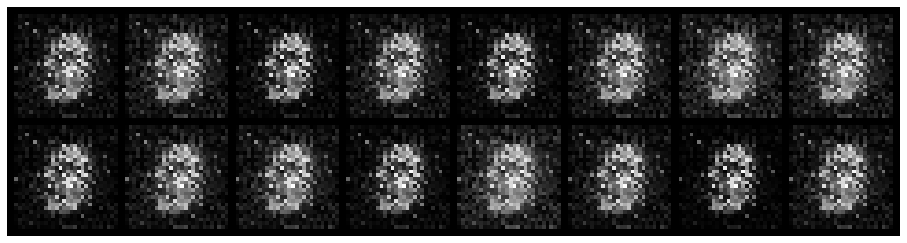

Epoch: [1/20], Batch Num: [100/600]
Discriminator Loss: 1.2127, Generator Loss: 0.7949
D(x): 0.5596, D(G(z)): 0.4638
Epoch: [1/20], Batch Num: [101/600]
Discriminator Loss: 1.2433, Generator Loss: 0.7931
D(x): 0.5500, D(G(z)): 0.4712
Epoch: [1/20], Batch Num: [102/600]
Discriminator Loss: 1.2014, Generator Loss: 0.8524
D(x): 0.5515, D(G(z)): 0.4491
Epoch: [1/20], Batch Num: [103/600]
Discriminator Loss: 1.1858, Generator Loss: 0.9535
D(x): 0.5590, D(G(z)): 0.4459
Epoch: [1/20], Batch Num: [104/600]
Discriminator Loss: 1.1612, Generator Loss: 1.0995
D(x): 0.5397, D(G(z)): 0.4081
Epoch: [1/20], Batch Num: [105/600]
Discriminator Loss: 1.1587, Generator Loss: 1.2319
D(x): 0.5274, D(G(z)): 0.3851
Epoch: [1/20], Batch Num: [106/600]
Discriminator Loss: 1.1223, Generator Loss: 1.3173
D(x): 0.5332, D(G(z)): 0.3725
Epoch: [1/20], Batch Num: [107/600]
Discriminator Loss: 1.0942, Generator Loss: 1.5326
D(x): 0.5243, D(G(z)): 0.3395
Epoch: [1/20], Batch Num: [108/600]
Discriminator Loss: 1.0918, 

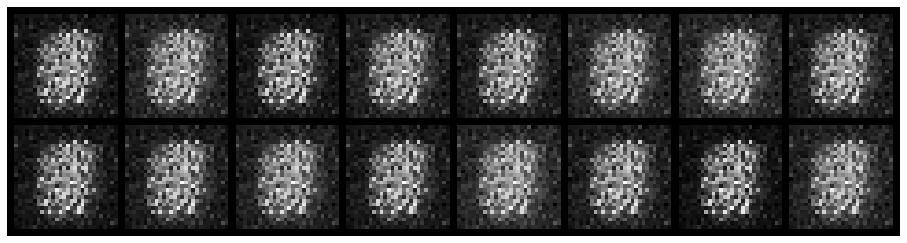

Epoch: [1/20], Batch Num: [200/600]
Discriminator Loss: 1.2657, Generator Loss: 0.9199
D(x): 0.5667, D(G(z)): 0.4802
Epoch: [1/20], Batch Num: [201/600]
Discriminator Loss: 1.2972, Generator Loss: 0.9938
D(x): 0.5336, D(G(z)): 0.4603
Epoch: [1/20], Batch Num: [202/600]
Discriminator Loss: 1.1520, Generator Loss: 1.0635
D(x): 0.5433, D(G(z)): 0.3924
Epoch: [1/20], Batch Num: [203/600]
Discriminator Loss: 1.1581, Generator Loss: 1.1073
D(x): 0.5279, D(G(z)): 0.3707
Epoch: [1/20], Batch Num: [204/600]
Discriminator Loss: 1.1245, Generator Loss: 1.0642
D(x): 0.5521, D(G(z)): 0.3881
Epoch: [1/20], Batch Num: [205/600]
Discriminator Loss: 1.0734, Generator Loss: 1.0393
D(x): 0.5720, D(G(z)): 0.3822
Epoch: [1/20], Batch Num: [206/600]
Discriminator Loss: 1.0457, Generator Loss: 1.0726
D(x): 0.5747, D(G(z)): 0.3663
Epoch: [1/20], Batch Num: [207/600]
Discriminator Loss: 0.9892, Generator Loss: 1.0875
D(x): 0.5966, D(G(z)): 0.3631
Epoch: [1/20], Batch Num: [208/600]
Discriminator Loss: 0.9731, 

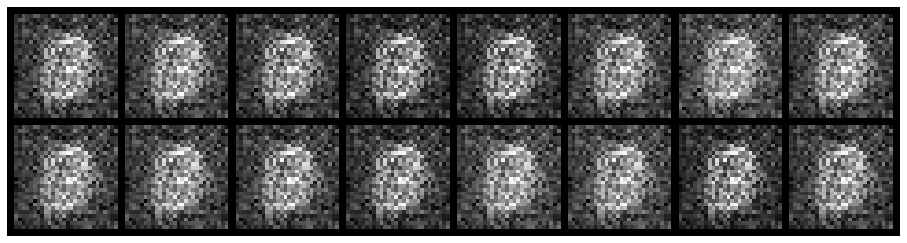

Epoch: [1/20], Batch Num: [300/600]
Discriminator Loss: 0.9845, Generator Loss: 1.4027
D(x): 0.6229, D(G(z)): 0.2852
Epoch: [1/20], Batch Num: [301/600]
Discriminator Loss: 0.8060, Generator Loss: 1.2329
D(x): 0.7367, D(G(z)): 0.3468
Epoch: [1/20], Batch Num: [302/600]
Discriminator Loss: 0.7723, Generator Loss: 1.1407
D(x): 0.7889, D(G(z)): 0.3664
Epoch: [1/20], Batch Num: [303/600]
Discriminator Loss: 0.7332, Generator Loss: 1.1277
D(x): 0.8398, D(G(z)): 0.3992
Epoch: [1/20], Batch Num: [304/600]
Discriminator Loss: 0.8023, Generator Loss: 1.2286
D(x): 0.8239, D(G(z)): 0.4173
Epoch: [1/20], Batch Num: [305/600]
Discriminator Loss: 0.6520, Generator Loss: 1.3443
D(x): 0.8588, D(G(z)): 0.3619
Epoch: [1/20], Batch Num: [306/600]
Discriminator Loss: 0.6940, Generator Loss: 1.3691
D(x): 0.8269, D(G(z)): 0.3638
Epoch: [1/20], Batch Num: [307/600]
Discriminator Loss: 0.5981, Generator Loss: 1.4443
D(x): 0.8376, D(G(z)): 0.3153
Epoch: [1/20], Batch Num: [308/600]
Discriminator Loss: 0.6275, 

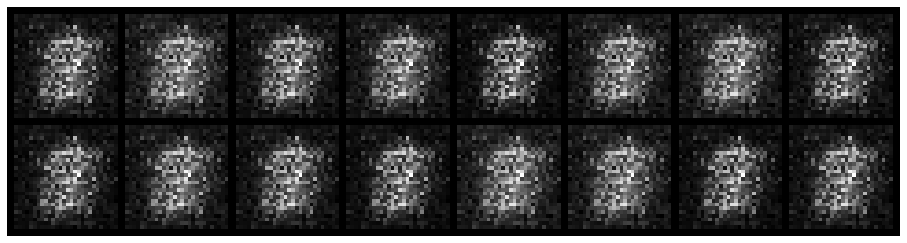

Epoch: [1/20], Batch Num: [400/600]
Discriminator Loss: 1.2960, Generator Loss: 0.8277
D(x): 0.6102, D(G(z)): 0.5299
Epoch: [1/20], Batch Num: [401/600]
Discriminator Loss: 1.3824, Generator Loss: 0.8350
D(x): 0.5795, D(G(z)): 0.5365
Epoch: [1/20], Batch Num: [402/600]
Discriminator Loss: 1.3611, Generator Loss: 0.6972
D(x): 0.5897, D(G(z)): 0.5318
Epoch: [1/20], Batch Num: [403/600]
Discriminator Loss: 1.2887, Generator Loss: 0.7094
D(x): 0.6037, D(G(z)): 0.5158
Epoch: [1/20], Batch Num: [404/600]
Discriminator Loss: 1.3842, Generator Loss: 0.6554
D(x): 0.5806, D(G(z)): 0.5360
Epoch: [1/20], Batch Num: [405/600]
Discriminator Loss: 1.3286, Generator Loss: 0.6575
D(x): 0.5838, D(G(z)): 0.5101
Epoch: [1/20], Batch Num: [406/600]
Discriminator Loss: 1.3552, Generator Loss: 0.6725
D(x): 0.5840, D(G(z)): 0.5395
Epoch: [1/20], Batch Num: [407/600]
Discriminator Loss: 1.3539, Generator Loss: 0.6668
D(x): 0.5874, D(G(z)): 0.5418
Epoch: [1/20], Batch Num: [408/600]
Discriminator Loss: 1.3928, 

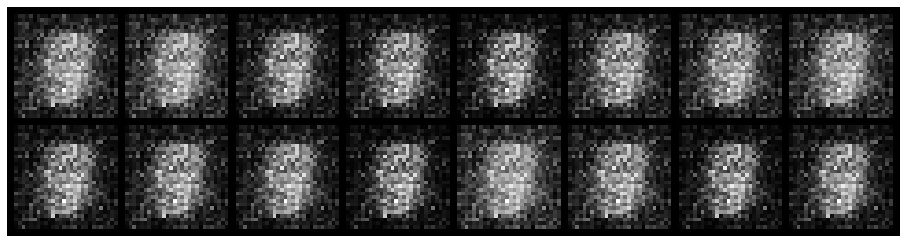

Epoch: [1/20], Batch Num: [500/600]
Discriminator Loss: 0.8847, Generator Loss: 1.5490
D(x): 0.7315, D(G(z)): 0.3343
Epoch: [1/20], Batch Num: [501/600]
Discriminator Loss: 0.9817, Generator Loss: 1.6268
D(x): 0.7897, D(G(z)): 0.4579
Epoch: [1/20], Batch Num: [502/600]
Discriminator Loss: 0.9240, Generator Loss: 1.6969
D(x): 0.7370, D(G(z)): 0.3553
Epoch: [1/20], Batch Num: [503/600]
Discriminator Loss: 0.9282, Generator Loss: 2.0692
D(x): 0.7322, D(G(z)): 0.3635
Epoch: [1/20], Batch Num: [504/600]
Discriminator Loss: 1.1017, Generator Loss: 2.0699
D(x): 0.6843, D(G(z)): 0.3745
Epoch: [1/20], Batch Num: [505/600]
Discriminator Loss: 1.2934, Generator Loss: 1.5448
D(x): 0.6181, D(G(z)): 0.4039
Epoch: [1/20], Batch Num: [506/600]
Discriminator Loss: 1.0177, Generator Loss: 1.3812
D(x): 0.7263, D(G(z)): 0.4010
Epoch: [1/20], Batch Num: [507/600]
Discriminator Loss: 1.2561, Generator Loss: 1.1738
D(x): 0.7459, D(G(z)): 0.5061
Epoch: [1/20], Batch Num: [508/600]
Discriminator Loss: 1.2813, 

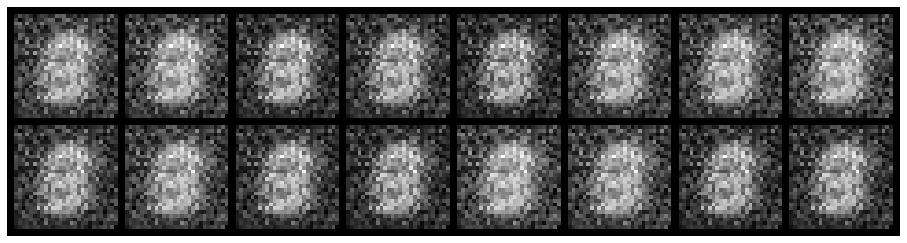

Epoch: [2/20], Batch Num: [0/600]
Discriminator Loss: 1.0240, Generator Loss: 1.0688
D(x): 0.6854, D(G(z)): 0.4050
Epoch: [2/20], Batch Num: [1/600]
Discriminator Loss: 0.8763, Generator Loss: 1.0513
D(x): 0.7550, D(G(z)): 0.3923
Epoch: [2/20], Batch Num: [2/600]
Discriminator Loss: 1.0262, Generator Loss: 1.0592
D(x): 0.7182, D(G(z)): 0.4298
Epoch: [2/20], Batch Num: [3/600]
Discriminator Loss: 0.9234, Generator Loss: 1.0159
D(x): 0.7818, D(G(z)): 0.4178
Epoch: [2/20], Batch Num: [4/600]
Discriminator Loss: 0.8967, Generator Loss: 0.9759
D(x): 0.7867, D(G(z)): 0.4378
Epoch: [2/20], Batch Num: [5/600]
Discriminator Loss: 0.8720, Generator Loss: 1.0680
D(x): 0.8048, D(G(z)): 0.4265
Epoch: [2/20], Batch Num: [6/600]
Discriminator Loss: 0.8679, Generator Loss: 1.1260
D(x): 0.7768, D(G(z)): 0.4013
Epoch: [2/20], Batch Num: [7/600]
Discriminator Loss: 0.8070, Generator Loss: 1.4186
D(x): 0.8120, D(G(z)): 0.3970
Epoch: [2/20], Batch Num: [8/600]
Discriminator Loss: 0.7428, Generator Loss: 1.

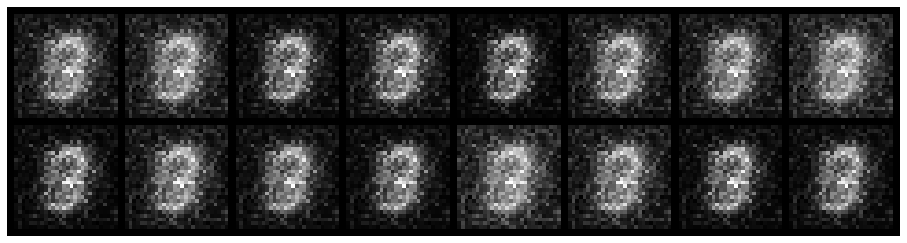

Epoch: [2/20], Batch Num: [100/600]
Discriminator Loss: 1.2216, Generator Loss: 0.7269
D(x): 0.6161, D(G(z)): 0.5112
Epoch: [2/20], Batch Num: [101/600]
Discriminator Loss: 1.1936, Generator Loss: 0.6971
D(x): 0.6218, D(G(z)): 0.5005
Epoch: [2/20], Batch Num: [102/600]
Discriminator Loss: 1.1821, Generator Loss: 0.7190
D(x): 0.6268, D(G(z)): 0.5007
Epoch: [2/20], Batch Num: [103/600]
Discriminator Loss: 1.1475, Generator Loss: 0.7350
D(x): 0.6499, D(G(z)): 0.5012
Epoch: [2/20], Batch Num: [104/600]
Discriminator Loss: 1.1152, Generator Loss: 0.7673
D(x): 0.6555, D(G(z)): 0.4876
Epoch: [2/20], Batch Num: [105/600]
Discriminator Loss: 1.0933, Generator Loss: 0.7797
D(x): 0.6421, D(G(z)): 0.4649
Epoch: [2/20], Batch Num: [106/600]
Discriminator Loss: 1.1252, Generator Loss: 0.7872
D(x): 0.6222, D(G(z)): 0.4650
Epoch: [2/20], Batch Num: [107/600]
Discriminator Loss: 1.1267, Generator Loss: 0.8079
D(x): 0.6178, D(G(z)): 0.4607
Epoch: [2/20], Batch Num: [108/600]
Discriminator Loss: 1.0905, 

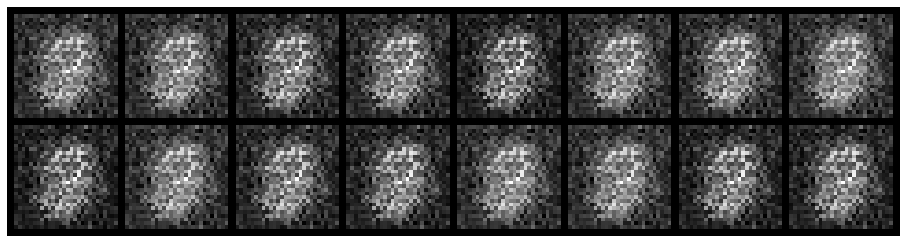

Epoch: [2/20], Batch Num: [200/600]
Discriminator Loss: 0.1966, Generator Loss: 2.5392
D(x): 0.9532, D(G(z)): 0.1199
Epoch: [2/20], Batch Num: [201/600]
Discriminator Loss: 0.2374, Generator Loss: 2.5643
D(x): 0.9336, D(G(z)): 0.1113
Epoch: [2/20], Batch Num: [202/600]
Discriminator Loss: 0.2348, Generator Loss: 2.6261
D(x): 0.9582, D(G(z)): 0.1305
Epoch: [2/20], Batch Num: [203/600]
Discriminator Loss: 0.1315, Generator Loss: 2.6071
D(x): 0.9754, D(G(z)): 0.0970
Epoch: [2/20], Batch Num: [204/600]
Discriminator Loss: 0.1988, Generator Loss: 2.8531
D(x): 0.9478, D(G(z)): 0.0997
Epoch: [2/20], Batch Num: [205/600]
Discriminator Loss: 0.2003, Generator Loss: 2.9138
D(x): 0.9605, D(G(z)): 0.1184
Epoch: [2/20], Batch Num: [206/600]
Discriminator Loss: 0.2128, Generator Loss: 3.0314
D(x): 0.9402, D(G(z)): 0.0850
Epoch: [2/20], Batch Num: [207/600]
Discriminator Loss: 0.1497, Generator Loss: 3.1428
D(x): 0.9634, D(G(z)): 0.0855
Epoch: [2/20], Batch Num: [208/600]
Discriminator Loss: 0.2075, 

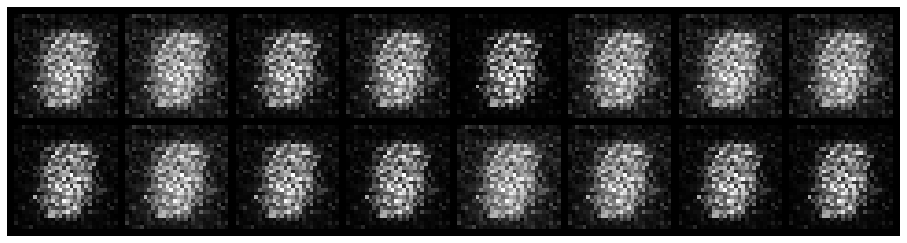

Epoch: [2/20], Batch Num: [300/600]
Discriminator Loss: 1.0567, Generator Loss: 0.9578
D(x): 0.6908, D(G(z)): 0.4397
Epoch: [2/20], Batch Num: [301/600]
Discriminator Loss: 1.0512, Generator Loss: 1.0031
D(x): 0.6910, D(G(z)): 0.4374
Epoch: [2/20], Batch Num: [302/600]
Discriminator Loss: 0.9977, Generator Loss: 0.9954
D(x): 0.7004, D(G(z)): 0.4311
Epoch: [2/20], Batch Num: [303/600]
Discriminator Loss: 0.9576, Generator Loss: 1.0091
D(x): 0.7451, D(G(z)): 0.4498
Epoch: [2/20], Batch Num: [304/600]
Discriminator Loss: 1.0066, Generator Loss: 1.0242
D(x): 0.6915, D(G(z)): 0.4240
Epoch: [2/20], Batch Num: [305/600]
Discriminator Loss: 0.9938, Generator Loss: 1.0587
D(x): 0.6586, D(G(z)): 0.3889
Epoch: [2/20], Batch Num: [306/600]
Discriminator Loss: 0.9736, Generator Loss: 1.1313
D(x): 0.6880, D(G(z)): 0.3930
Epoch: [2/20], Batch Num: [307/600]
Discriminator Loss: 0.9586, Generator Loss: 1.1593
D(x): 0.6945, D(G(z)): 0.3963
Epoch: [2/20], Batch Num: [308/600]
Discriminator Loss: 0.9230, 

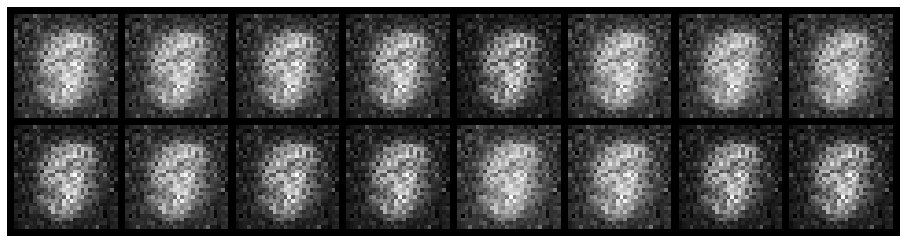

Epoch: [2/20], Batch Num: [400/600]
Discriminator Loss: 0.2745, Generator Loss: 3.5276
D(x): 0.9114, D(G(z)): 0.1193
Epoch: [2/20], Batch Num: [401/600]
Discriminator Loss: 0.3204, Generator Loss: 3.3905
D(x): 0.8996, D(G(z)): 0.1278
Epoch: [2/20], Batch Num: [402/600]
Discriminator Loss: 0.5178, Generator Loss: 3.0527
D(x): 0.8512, D(G(z)): 0.1514
Epoch: [2/20], Batch Num: [403/600]
Discriminator Loss: 0.4249, Generator Loss: 2.3728
D(x): 0.9021, D(G(z)): 0.1925
Epoch: [2/20], Batch Num: [404/600]
Discriminator Loss: 0.4569, Generator Loss: 2.5446
D(x): 0.8873, D(G(z)): 0.1860
Epoch: [2/20], Batch Num: [405/600]
Discriminator Loss: 0.6384, Generator Loss: 2.4561
D(x): 0.8484, D(G(z)): 0.2373
Epoch: [2/20], Batch Num: [406/600]
Discriminator Loss: 0.6375, Generator Loss: 2.2214
D(x): 0.8245, D(G(z)): 0.2323
Epoch: [2/20], Batch Num: [407/600]
Discriminator Loss: 0.6409, Generator Loss: 2.0040
D(x): 0.8564, D(G(z)): 0.2882
Epoch: [2/20], Batch Num: [408/600]
Discriminator Loss: 0.6918, 

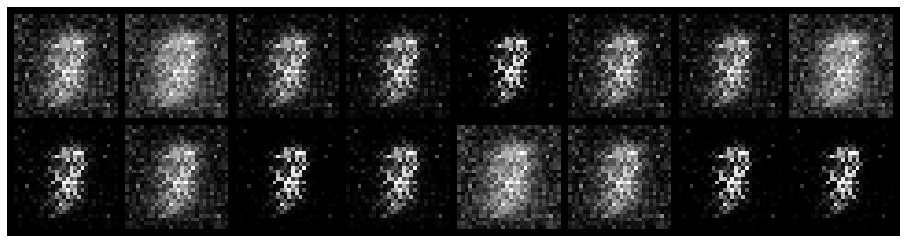

Epoch: [2/20], Batch Num: [500/600]
Discriminator Loss: 0.3280, Generator Loss: 3.5138
D(x): 0.8833, D(G(z)): 0.1026
Epoch: [2/20], Batch Num: [501/600]
Discriminator Loss: 0.3592, Generator Loss: 3.5746
D(x): 0.8742, D(G(z)): 0.0982
Epoch: [2/20], Batch Num: [502/600]
Discriminator Loss: 0.2388, Generator Loss: 3.3838
D(x): 0.9162, D(G(z)): 0.0946
Epoch: [2/20], Batch Num: [503/600]
Discriminator Loss: 0.2142, Generator Loss: 3.8340
D(x): 0.9285, D(G(z)): 0.0847
Epoch: [2/20], Batch Num: [504/600]
Discriminator Loss: 0.5557, Generator Loss: 3.3326
D(x): 0.8176, D(G(z)): 0.0983
Epoch: [2/20], Batch Num: [505/600]
Discriminator Loss: 0.3239, Generator Loss: 2.9646
D(x): 0.9270, D(G(z)): 0.1338
Epoch: [2/20], Batch Num: [506/600]
Discriminator Loss: 0.4123, Generator Loss: 3.1733
D(x): 0.9252, D(G(z)): 0.1817
Epoch: [2/20], Batch Num: [507/600]
Discriminator Loss: 0.3160, Generator Loss: 3.6987
D(x): 0.9045, D(G(z)): 0.1223
Epoch: [2/20], Batch Num: [508/600]
Discriminator Loss: 0.3227, 

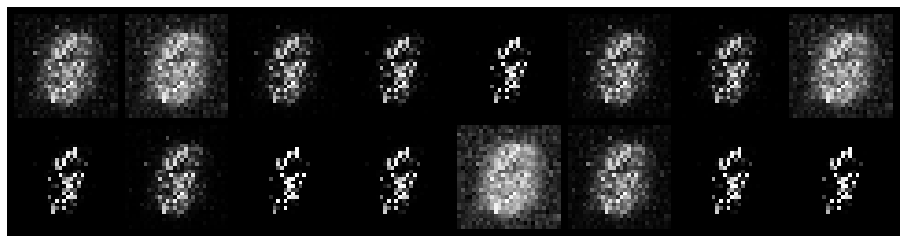

Epoch: [3/20], Batch Num: [0/600]
Discriminator Loss: 0.2803, Generator Loss: 4.6414
D(x): 0.8805, D(G(z)): 0.0668
Epoch: [3/20], Batch Num: [1/600]
Discriminator Loss: 0.5252, Generator Loss: 3.4366
D(x): 0.8180, D(G(z)): 0.1060
Epoch: [3/20], Batch Num: [2/600]
Discriminator Loss: 0.4270, Generator Loss: 2.7340
D(x): 0.8839, D(G(z)): 0.1439
Epoch: [3/20], Batch Num: [3/600]
Discriminator Loss: 0.5769, Generator Loss: 2.5804
D(x): 0.8975, D(G(z)): 0.2647
Epoch: [3/20], Batch Num: [4/600]
Discriminator Loss: 0.7294, Generator Loss: 3.2428
D(x): 0.8473, D(G(z)): 0.2689
Epoch: [3/20], Batch Num: [5/600]
Discriminator Loss: 0.5935, Generator Loss: 3.3538
D(x): 0.8202, D(G(z)): 0.1132
Epoch: [3/20], Batch Num: [6/600]
Discriminator Loss: 0.6471, Generator Loss: 3.1355
D(x): 0.7632, D(G(z)): 0.1024
Epoch: [3/20], Batch Num: [7/600]
Discriminator Loss: 0.5833, Generator Loss: 2.5193
D(x): 0.8336, D(G(z)): 0.1623
Epoch: [3/20], Batch Num: [8/600]
Discriminator Loss: 0.7906, Generator Loss: 2.

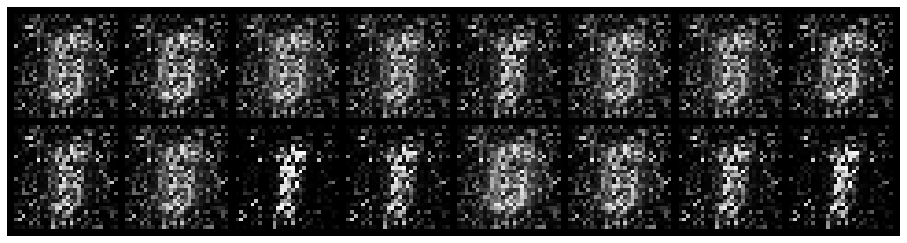

Epoch: [3/20], Batch Num: [100/600]
Discriminator Loss: 0.6674, Generator Loss: 4.4320
D(x): 0.8805, D(G(z)): 0.2533
Epoch: [3/20], Batch Num: [101/600]
Discriminator Loss: 0.5297, Generator Loss: 4.9036
D(x): 0.8862, D(G(z)): 0.2220
Epoch: [3/20], Batch Num: [102/600]
Discriminator Loss: 0.4371, Generator Loss: 5.8543
D(x): 0.8681, D(G(z)): 0.1415
Epoch: [3/20], Batch Num: [103/600]
Discriminator Loss: 0.4149, Generator Loss: 5.7760
D(x): 0.8237, D(G(z)): 0.0932
Epoch: [3/20], Batch Num: [104/600]
Discriminator Loss: 0.5407, Generator Loss: 5.1412
D(x): 0.7944, D(G(z)): 0.1151
Epoch: [3/20], Batch Num: [105/600]
Discriminator Loss: 0.6781, Generator Loss: 4.2498
D(x): 0.8103, D(G(z)): 0.1850
Epoch: [3/20], Batch Num: [106/600]
Discriminator Loss: 0.6758, Generator Loss: 4.3425
D(x): 0.8725, D(G(z)): 0.2503
Epoch: [3/20], Batch Num: [107/600]
Discriminator Loss: 0.7079, Generator Loss: 4.5658
D(x): 0.7682, D(G(z)): 0.1623
Epoch: [3/20], Batch Num: [108/600]
Discriminator Loss: 1.1526, 

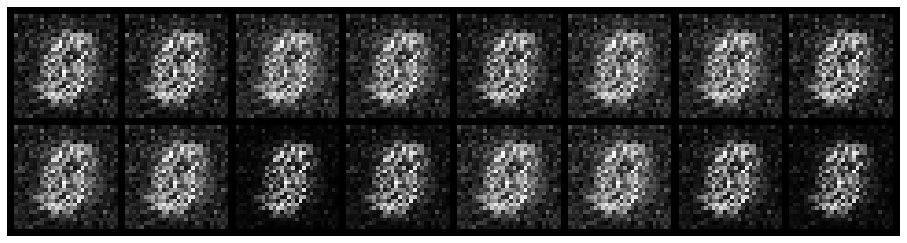

Epoch: [3/20], Batch Num: [200/600]
Discriminator Loss: 0.3682, Generator Loss: 4.1992
D(x): 0.9406, D(G(z)): 0.0870
Epoch: [3/20], Batch Num: [201/600]
Discriminator Loss: 0.2618, Generator Loss: 4.3445
D(x): 0.9370, D(G(z)): 0.0493
Epoch: [3/20], Batch Num: [202/600]
Discriminator Loss: 0.3363, Generator Loss: 4.5155
D(x): 0.9078, D(G(z)): 0.0611
Epoch: [3/20], Batch Num: [203/600]
Discriminator Loss: 0.2005, Generator Loss: 4.3117
D(x): 0.9273, D(G(z)): 0.0359
Epoch: [3/20], Batch Num: [204/600]
Discriminator Loss: 0.2979, Generator Loss: 4.1807
D(x): 0.9285, D(G(z)): 0.0587
Epoch: [3/20], Batch Num: [205/600]
Discriminator Loss: 0.2636, Generator Loss: 3.9513
D(x): 0.9480, D(G(z)): 0.0937
Epoch: [3/20], Batch Num: [206/600]
Discriminator Loss: 0.1965, Generator Loss: 3.7793
D(x): 0.9726, D(G(z)): 0.0796
Epoch: [3/20], Batch Num: [207/600]
Discriminator Loss: 0.2491, Generator Loss: 4.1090
D(x): 0.9519, D(G(z)): 0.0912
Epoch: [3/20], Batch Num: [208/600]
Discriminator Loss: 0.1731, 

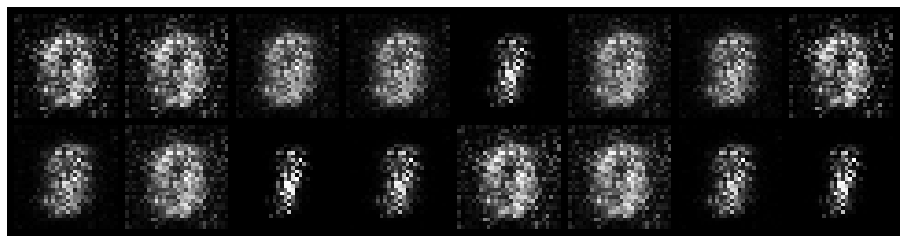

Epoch: [3/20], Batch Num: [300/600]
Discriminator Loss: 0.2482, Generator Loss: 3.5954
D(x): 0.9362, D(G(z)): 0.1135
Epoch: [3/20], Batch Num: [301/600]
Discriminator Loss: 0.3034, Generator Loss: 4.0051
D(x): 0.8816, D(G(z)): 0.0946
Epoch: [3/20], Batch Num: [302/600]
Discriminator Loss: 0.1851, Generator Loss: 3.9329
D(x): 0.9337, D(G(z)): 0.0694
Epoch: [3/20], Batch Num: [303/600]
Discriminator Loss: 0.3318, Generator Loss: 3.5036
D(x): 0.8605, D(G(z)): 0.0653
Epoch: [3/20], Batch Num: [304/600]
Discriminator Loss: 0.3689, Generator Loss: 2.6976
D(x): 0.8728, D(G(z)): 0.1048
Epoch: [3/20], Batch Num: [305/600]
Discriminator Loss: 0.3058, Generator Loss: 2.9521
D(x): 0.9565, D(G(z)): 0.1664
Epoch: [3/20], Batch Num: [306/600]
Discriminator Loss: 0.1900, Generator Loss: 3.5290
D(x): 0.9422, D(G(z)): 0.0934
Epoch: [3/20], Batch Num: [307/600]
Discriminator Loss: 0.2221, Generator Loss: 4.0833
D(x): 0.9303, D(G(z)): 0.0901
Epoch: [3/20], Batch Num: [308/600]
Discriminator Loss: 0.2980, 

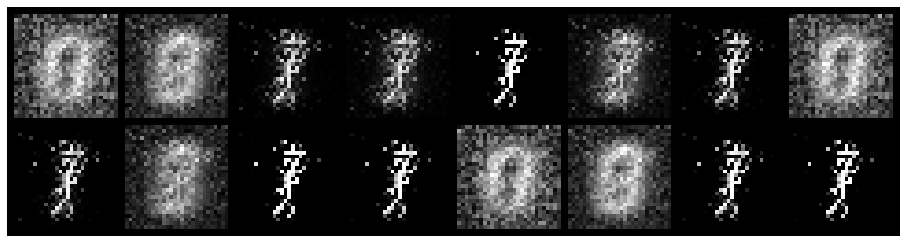

Epoch: [3/20], Batch Num: [400/600]
Discriminator Loss: 0.6885, Generator Loss: 3.9052
D(x): 0.8004, D(G(z)): 0.1465
Epoch: [3/20], Batch Num: [401/600]
Discriminator Loss: 0.5118, Generator Loss: 2.7711
D(x): 0.8761, D(G(z)): 0.1827
Epoch: [3/20], Batch Num: [402/600]
Discriminator Loss: 0.3831, Generator Loss: 2.9700
D(x): 0.9070, D(G(z)): 0.1670
Epoch: [3/20], Batch Num: [403/600]
Discriminator Loss: 0.7117, Generator Loss: 3.0673
D(x): 0.8617, D(G(z)): 0.2646
Epoch: [3/20], Batch Num: [404/600]
Discriminator Loss: 0.5370, Generator Loss: 3.1071
D(x): 0.8263, D(G(z)): 0.1533
Epoch: [3/20], Batch Num: [405/600]
Discriminator Loss: 0.6949, Generator Loss: 2.6662
D(x): 0.7923, D(G(z)): 0.1451
Epoch: [3/20], Batch Num: [406/600]
Discriminator Loss: 0.5157, Generator Loss: 2.5191
D(x): 0.8353, D(G(z)): 0.1572
Epoch: [3/20], Batch Num: [407/600]
Discriminator Loss: 0.6304, Generator Loss: 2.0944
D(x): 0.8493, D(G(z)): 0.2317
Epoch: [3/20], Batch Num: [408/600]
Discriminator Loss: 0.6762, 

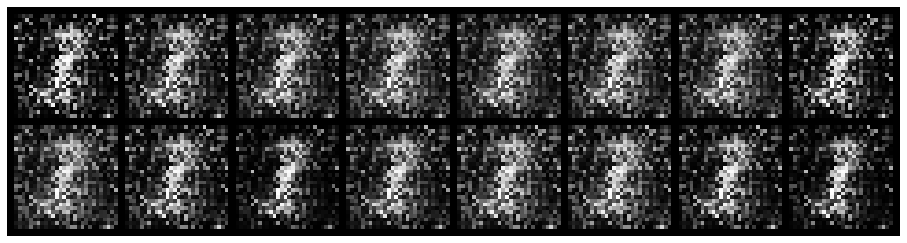

Epoch: [3/20], Batch Num: [500/600]
Discriminator Loss: 0.1309, Generator Loss: 4.6292
D(x): 0.9663, D(G(z)): 0.0688
Epoch: [3/20], Batch Num: [501/600]
Discriminator Loss: 0.2291, Generator Loss: 4.7240
D(x): 0.9528, D(G(z)): 0.0853
Epoch: [3/20], Batch Num: [502/600]
Discriminator Loss: 0.2264, Generator Loss: 4.6318
D(x): 0.9342, D(G(z)): 0.0718
Epoch: [3/20], Batch Num: [503/600]
Discriminator Loss: 0.1661, Generator Loss: 5.2279
D(x): 0.9592, D(G(z)): 0.0742
Epoch: [3/20], Batch Num: [504/600]
Discriminator Loss: 0.1088, Generator Loss: 5.6378
D(x): 0.9685, D(G(z)): 0.0431
Epoch: [3/20], Batch Num: [505/600]
Discriminator Loss: 0.1229, Generator Loss: 5.6673
D(x): 0.9623, D(G(z)): 0.0412
Epoch: [3/20], Batch Num: [506/600]
Discriminator Loss: 0.1554, Generator Loss: 5.9345
D(x): 0.9651, D(G(z)): 0.0668
Epoch: [3/20], Batch Num: [507/600]
Discriminator Loss: 0.1734, Generator Loss: 6.2592
D(x): 0.9486, D(G(z)): 0.0558
Epoch: [3/20], Batch Num: [508/600]
Discriminator Loss: 0.1245, 

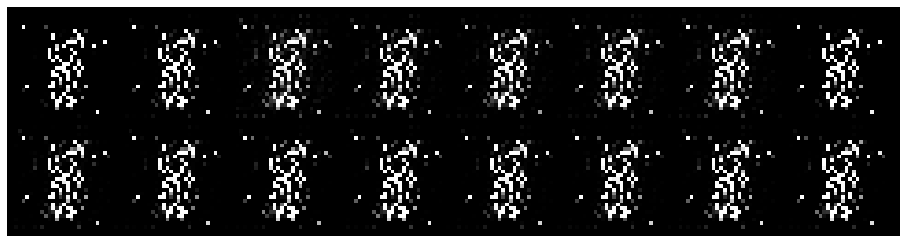

Epoch: [4/20], Batch Num: [0/600]
Discriminator Loss: 0.1072, Generator Loss: 6.4802
D(x): 0.9893, D(G(z)): 0.0516
Epoch: [4/20], Batch Num: [1/600]
Discriminator Loss: 0.2384, Generator Loss: 7.0929
D(x): 0.9590, D(G(z)): 0.0587
Epoch: [4/20], Batch Num: [2/600]
Discriminator Loss: 0.1146, Generator Loss: 6.8372
D(x): 0.9577, D(G(z)): 0.0357
Epoch: [4/20], Batch Num: [3/600]
Discriminator Loss: 0.2100, Generator Loss: 7.5124
D(x): 0.9640, D(G(z)): 0.0470
Epoch: [4/20], Batch Num: [4/600]
Discriminator Loss: 0.1122, Generator Loss: 7.8918
D(x): 0.9611, D(G(z)): 0.0294
Epoch: [4/20], Batch Num: [5/600]
Discriminator Loss: 0.1658, Generator Loss: 8.2442
D(x): 0.9617, D(G(z)): 0.0516
Epoch: [4/20], Batch Num: [6/600]
Discriminator Loss: 0.1128, Generator Loss: 7.6133
D(x): 0.9757, D(G(z)): 0.0313
Epoch: [4/20], Batch Num: [7/600]
Discriminator Loss: 0.1500, Generator Loss: 7.9525
D(x): 0.9612, D(G(z)): 0.0263
Epoch: [4/20], Batch Num: [8/600]
Discriminator Loss: 0.2084, Generator Loss: 7.

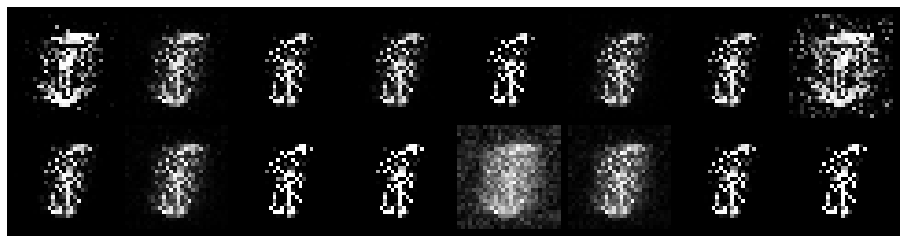

Epoch: [4/20], Batch Num: [100/600]
Discriminator Loss: 0.2645, Generator Loss: 2.9137
D(x): 0.9379, D(G(z)): 0.1221
Epoch: [4/20], Batch Num: [101/600]
Discriminator Loss: 0.2310, Generator Loss: 3.7265
D(x): 0.9673, D(G(z)): 0.1154
Epoch: [4/20], Batch Num: [102/600]
Discriminator Loss: 0.1261, Generator Loss: 3.8735
D(x): 0.9777, D(G(z)): 0.0779
Epoch: [4/20], Batch Num: [103/600]
Discriminator Loss: 0.1285, Generator Loss: 4.6112
D(x): 0.9525, D(G(z)): 0.0548
Epoch: [4/20], Batch Num: [104/600]
Discriminator Loss: 0.2581, Generator Loss: 4.6940
D(x): 0.8951, D(G(z)): 0.0427
Epoch: [4/20], Batch Num: [105/600]
Discriminator Loss: 0.1936, Generator Loss: 4.5081
D(x): 0.9230, D(G(z)): 0.0491
Epoch: [4/20], Batch Num: [106/600]
Discriminator Loss: 0.2277, Generator Loss: 4.3372
D(x): 0.9463, D(G(z)): 0.0587
Epoch: [4/20], Batch Num: [107/600]
Discriminator Loss: 0.1309, Generator Loss: 4.2961
D(x): 0.9631, D(G(z)): 0.0558
Epoch: [4/20], Batch Num: [108/600]
Discriminator Loss: 0.1104, 

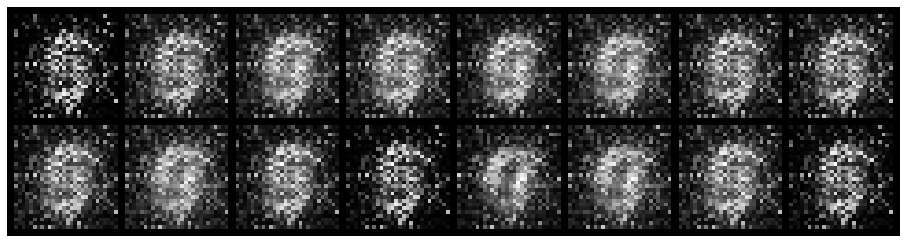

Epoch: [4/20], Batch Num: [200/600]
Discriminator Loss: 0.4166, Generator Loss: 3.0356
D(x): 0.8990, D(G(z)): 0.1227
Epoch: [4/20], Batch Num: [201/600]
Discriminator Loss: 0.3838, Generator Loss: 3.1462
D(x): 0.9203, D(G(z)): 0.1374
Epoch: [4/20], Batch Num: [202/600]
Discriminator Loss: 0.4935, Generator Loss: 2.9721
D(x): 0.8704, D(G(z)): 0.1235
Epoch: [4/20], Batch Num: [203/600]
Discriminator Loss: 0.3762, Generator Loss: 2.7346
D(x): 0.9029, D(G(z)): 0.1485
Epoch: [4/20], Batch Num: [204/600]
Discriminator Loss: 0.3764, Generator Loss: 2.7901
D(x): 0.9310, D(G(z)): 0.1632
Epoch: [4/20], Batch Num: [205/600]
Discriminator Loss: 0.3029, Generator Loss: 3.0026
D(x): 0.9474, D(G(z)): 0.1471
Epoch: [4/20], Batch Num: [206/600]
Discriminator Loss: 0.2662, Generator Loss: 3.6819
D(x): 0.9270, D(G(z)): 0.0981
Epoch: [4/20], Batch Num: [207/600]
Discriminator Loss: 0.2250, Generator Loss: 3.5871
D(x): 0.9310, D(G(z)): 0.0837
Epoch: [4/20], Batch Num: [208/600]
Discriminator Loss: 0.2181, 

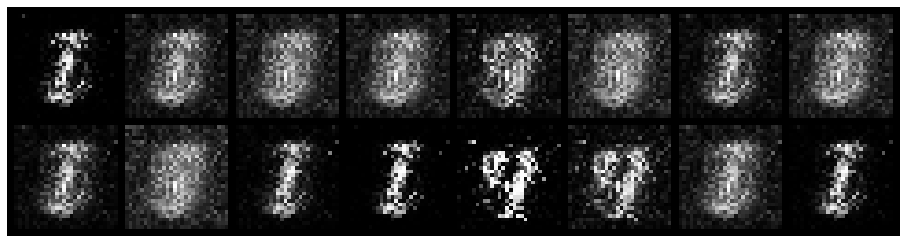

Epoch: [4/20], Batch Num: [300/600]
Discriminator Loss: 0.2819, Generator Loss: 3.6702
D(x): 0.9113, D(G(z)): 0.0528
Epoch: [4/20], Batch Num: [301/600]
Discriminator Loss: 0.2203, Generator Loss: 3.5173
D(x): 0.9344, D(G(z)): 0.0668
Epoch: [4/20], Batch Num: [302/600]
Discriminator Loss: 0.1333, Generator Loss: 3.5199
D(x): 0.9631, D(G(z)): 0.0519
Epoch: [4/20], Batch Num: [303/600]
Discriminator Loss: 0.1362, Generator Loss: 3.6099
D(x): 0.9692, D(G(z)): 0.0565
Epoch: [4/20], Batch Num: [304/600]
Discriminator Loss: 0.2287, Generator Loss: 3.6629
D(x): 0.9485, D(G(z)): 0.0808
Epoch: [4/20], Batch Num: [305/600]
Discriminator Loss: 0.1650, Generator Loss: 3.4217
D(x): 0.9633, D(G(z)): 0.0836
Epoch: [4/20], Batch Num: [306/600]
Discriminator Loss: 0.1643, Generator Loss: 3.9484
D(x): 0.9601, D(G(z)): 0.0674
Epoch: [4/20], Batch Num: [307/600]
Discriminator Loss: 0.1515, Generator Loss: 3.7423
D(x): 0.9396, D(G(z)): 0.0465
Epoch: [4/20], Batch Num: [308/600]
Discriminator Loss: 0.2210, 

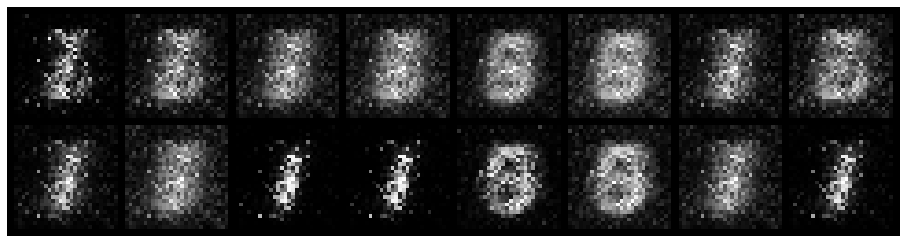

Epoch: [4/20], Batch Num: [400/600]
Discriminator Loss: 0.1678, Generator Loss: 3.9275
D(x): 0.9418, D(G(z)): 0.0669
Epoch: [4/20], Batch Num: [401/600]
Discriminator Loss: 0.4014, Generator Loss: 3.5121
D(x): 0.8684, D(G(z)): 0.0522
Epoch: [4/20], Batch Num: [402/600]
Discriminator Loss: 0.2752, Generator Loss: 2.8550
D(x): 0.8968, D(G(z)): 0.0645
Epoch: [4/20], Batch Num: [403/600]
Discriminator Loss: 0.2603, Generator Loss: 2.5281
D(x): 0.9410, D(G(z)): 0.1063
Epoch: [4/20], Batch Num: [404/600]
Discriminator Loss: 0.2478, Generator Loss: 3.1680
D(x): 0.9547, D(G(z)): 0.1343
Epoch: [4/20], Batch Num: [405/600]
Discriminator Loss: 0.3030, Generator Loss: 3.9050
D(x): 0.9196, D(G(z)): 0.1097
Epoch: [4/20], Batch Num: [406/600]
Discriminator Loss: 0.3422, Generator Loss: 3.4719
D(x): 0.8957, D(G(z)): 0.0664
Epoch: [4/20], Batch Num: [407/600]
Discriminator Loss: 0.3256, Generator Loss: 3.8147
D(x): 0.9090, D(G(z)): 0.0716
Epoch: [4/20], Batch Num: [408/600]
Discriminator Loss: 0.2649, 

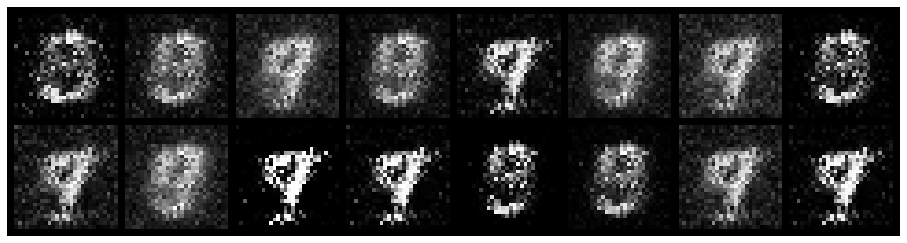

Epoch: [4/20], Batch Num: [500/600]
Discriminator Loss: 0.5606, Generator Loss: 3.0590
D(x): 0.8958, D(G(z)): 0.2208
Epoch: [4/20], Batch Num: [501/600]
Discriminator Loss: 0.5744, Generator Loss: 3.1576
D(x): 0.8494, D(G(z)): 0.1441
Epoch: [4/20], Batch Num: [502/600]
Discriminator Loss: 0.2738, Generator Loss: 3.3390
D(x): 0.9108, D(G(z)): 0.0947
Epoch: [4/20], Batch Num: [503/600]
Discriminator Loss: 0.3006, Generator Loss: 3.3366
D(x): 0.8850, D(G(z)): 0.0700
Epoch: [4/20], Batch Num: [504/600]
Discriminator Loss: 0.4224, Generator Loss: 3.1869
D(x): 0.8744, D(G(z)): 0.1218
Epoch: [4/20], Batch Num: [505/600]
Discriminator Loss: 0.4941, Generator Loss: 2.9791
D(x): 0.8631, D(G(z)): 0.1297
Epoch: [4/20], Batch Num: [506/600]
Discriminator Loss: 0.5751, Generator Loss: 2.7349
D(x): 0.8399, D(G(z)): 0.1409
Epoch: [4/20], Batch Num: [507/600]
Discriminator Loss: 0.6095, Generator Loss: 2.4477
D(x): 0.7822, D(G(z)): 0.1306
Epoch: [4/20], Batch Num: [508/600]
Discriminator Loss: 0.2963, 

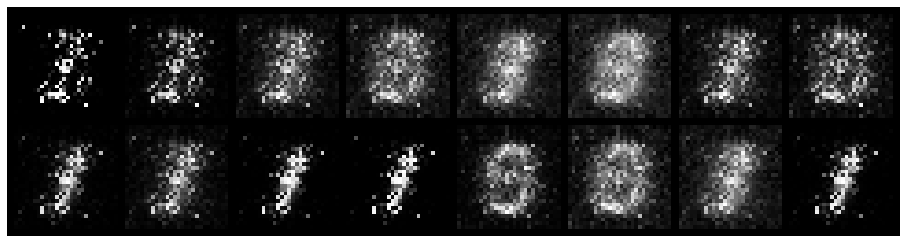

Epoch: [5/20], Batch Num: [0/600]
Discriminator Loss: 0.3212, Generator Loss: 3.4082
D(x): 0.9103, D(G(z)): 0.0642
Epoch: [5/20], Batch Num: [1/600]
Discriminator Loss: 0.1953, Generator Loss: 3.4145
D(x): 0.9613, D(G(z)): 0.1024
Epoch: [5/20], Batch Num: [2/600]
Discriminator Loss: 0.2166, Generator Loss: 3.5712
D(x): 0.9660, D(G(z)): 0.0949
Epoch: [5/20], Batch Num: [3/600]
Discriminator Loss: 0.2406, Generator Loss: 3.9384
D(x): 0.9409, D(G(z)): 0.0865
Epoch: [5/20], Batch Num: [4/600]
Discriminator Loss: 0.2343, Generator Loss: 3.9536
D(x): 0.9225, D(G(z)): 0.0433
Epoch: [5/20], Batch Num: [5/600]
Discriminator Loss: 0.2505, Generator Loss: 3.5946
D(x): 0.9095, D(G(z)): 0.0460
Epoch: [5/20], Batch Num: [6/600]
Discriminator Loss: 0.2312, Generator Loss: 3.3356
D(x): 0.9142, D(G(z)): 0.0510
Epoch: [5/20], Batch Num: [7/600]
Discriminator Loss: 0.2041, Generator Loss: 3.0601
D(x): 0.9433, D(G(z)): 0.0803
Epoch: [5/20], Batch Num: [8/600]
Discriminator Loss: 0.2884, Generator Loss: 3.

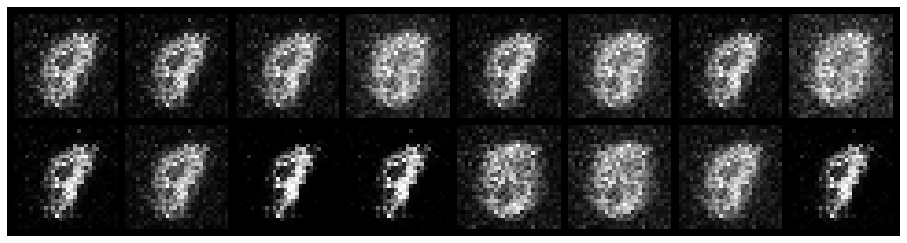

Epoch: [5/20], Batch Num: [100/600]
Discriminator Loss: 0.1770, Generator Loss: 3.4383
D(x): 0.9637, D(G(z)): 0.0933
Epoch: [5/20], Batch Num: [101/600]
Discriminator Loss: 0.2982, Generator Loss: 3.5569
D(x): 0.9179, D(G(z)): 0.0653
Epoch: [5/20], Batch Num: [102/600]
Discriminator Loss: 0.3353, Generator Loss: 3.9805
D(x): 0.8739, D(G(z)): 0.0682
Epoch: [5/20], Batch Num: [103/600]
Discriminator Loss: 0.2426, Generator Loss: 3.6342
D(x): 0.8874, D(G(z)): 0.0482
Epoch: [5/20], Batch Num: [104/600]
Discriminator Loss: 0.1931, Generator Loss: 3.1433
D(x): 0.9330, D(G(z)): 0.0726
Epoch: [5/20], Batch Num: [105/600]
Discriminator Loss: 0.2532, Generator Loss: 3.1092
D(x): 0.9546, D(G(z)): 0.1264
Epoch: [5/20], Batch Num: [106/600]
Discriminator Loss: 0.2179, Generator Loss: 3.4084
D(x): 0.9531, D(G(z)): 0.0882
Epoch: [5/20], Batch Num: [107/600]
Discriminator Loss: 0.2052, Generator Loss: 3.7419
D(x): 0.9242, D(G(z)): 0.0634
Epoch: [5/20], Batch Num: [108/600]
Discriminator Loss: 0.1821, 

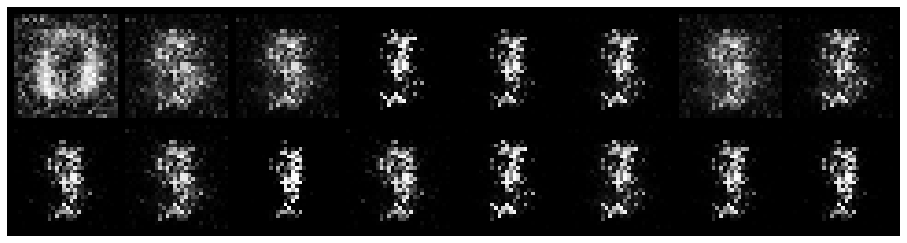

Epoch: [5/20], Batch Num: [200/600]
Discriminator Loss: 0.4472, Generator Loss: 5.0455
D(x): 0.8628, D(G(z)): 0.0903
Epoch: [5/20], Batch Num: [201/600]
Discriminator Loss: 0.3336, Generator Loss: 4.5257
D(x): 0.9015, D(G(z)): 0.0862
Epoch: [5/20], Batch Num: [202/600]
Discriminator Loss: 0.6331, Generator Loss: 4.0561
D(x): 0.8383, D(G(z)): 0.1106
Epoch: [5/20], Batch Num: [203/600]
Discriminator Loss: 0.3364, Generator Loss: 4.7706
D(x): 0.9520, D(G(z)): 0.1435
Epoch: [5/20], Batch Num: [204/600]
Discriminator Loss: 0.4398, Generator Loss: 4.3089
D(x): 0.8490, D(G(z)): 0.0746
Epoch: [5/20], Batch Num: [205/600]
Discriminator Loss: 0.2647, Generator Loss: 4.1617
D(x): 0.8805, D(G(z)): 0.0535
Epoch: [5/20], Batch Num: [206/600]
Discriminator Loss: 0.3241, Generator Loss: 3.4259
D(x): 0.9087, D(G(z)): 0.0871
Epoch: [5/20], Batch Num: [207/600]
Discriminator Loss: 0.3251, Generator Loss: 4.1509
D(x): 0.9241, D(G(z)): 0.1265
Epoch: [5/20], Batch Num: [208/600]
Discriminator Loss: 0.1904, 

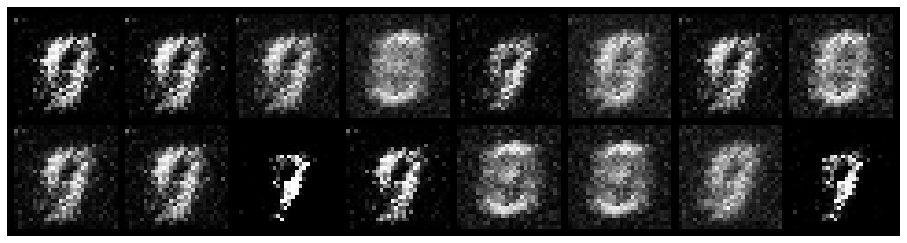

Epoch: [5/20], Batch Num: [300/600]
Discriminator Loss: 0.1913, Generator Loss: 3.4515
D(x): 0.9491, D(G(z)): 0.0904
Epoch: [5/20], Batch Num: [301/600]
Discriminator Loss: 0.2186, Generator Loss: 3.6411
D(x): 0.9539, D(G(z)): 0.0908
Epoch: [5/20], Batch Num: [302/600]
Discriminator Loss: 0.2661, Generator Loss: 4.2519
D(x): 0.9462, D(G(z)): 0.1097
Epoch: [5/20], Batch Num: [303/600]
Discriminator Loss: 0.1918, Generator Loss: 4.2480
D(x): 0.9376, D(G(z)): 0.0710
Epoch: [5/20], Batch Num: [304/600]
Discriminator Loss: 0.2573, Generator Loss: 4.1587
D(x): 0.9166, D(G(z)): 0.0600
Epoch: [5/20], Batch Num: [305/600]
Discriminator Loss: 0.3393, Generator Loss: 4.4750
D(x): 0.8970, D(G(z)): 0.0736
Epoch: [5/20], Batch Num: [306/600]
Discriminator Loss: 0.2696, Generator Loss: 4.1544
D(x): 0.9226, D(G(z)): 0.0615
Epoch: [5/20], Batch Num: [307/600]
Discriminator Loss: 0.3449, Generator Loss: 3.7534
D(x): 0.9009, D(G(z)): 0.0644
Epoch: [5/20], Batch Num: [308/600]
Discriminator Loss: 0.2879, 

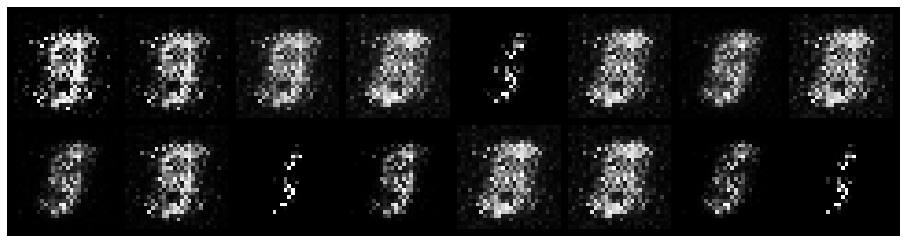

Epoch: [5/20], Batch Num: [400/600]
Discriminator Loss: 0.2517, Generator Loss: 4.2165
D(x): 0.9161, D(G(z)): 0.0348
Epoch: [5/20], Batch Num: [401/600]
Discriminator Loss: 0.1940, Generator Loss: 3.6943
D(x): 0.9342, D(G(z)): 0.0391
Epoch: [5/20], Batch Num: [402/600]
Discriminator Loss: 0.2257, Generator Loss: 3.3947
D(x): 0.9456, D(G(z)): 0.0900
Epoch: [5/20], Batch Num: [403/600]
Discriminator Loss: 0.2359, Generator Loss: 3.4097
D(x): 0.9930, D(G(z)): 0.1291
Epoch: [5/20], Batch Num: [404/600]
Discriminator Loss: 0.1777, Generator Loss: 4.3407
D(x): 0.9793, D(G(z)): 0.0939
Epoch: [5/20], Batch Num: [405/600]
Discriminator Loss: 0.1774, Generator Loss: 5.0991
D(x): 0.9397, D(G(z)): 0.0402
Epoch: [5/20], Batch Num: [406/600]
Discriminator Loss: 0.2044, Generator Loss: 5.2275
D(x): 0.9168, D(G(z)): 0.0160
Epoch: [5/20], Batch Num: [407/600]
Discriminator Loss: 0.1708, Generator Loss: 4.8341
D(x): 0.9185, D(G(z)): 0.0211
Epoch: [5/20], Batch Num: [408/600]
Discriminator Loss: 0.5296, 

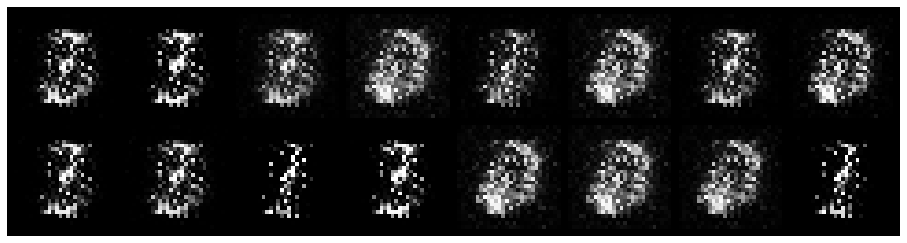

Epoch: [5/20], Batch Num: [500/600]
Discriminator Loss: 0.2546, Generator Loss: 5.0093
D(x): 0.9391, D(G(z)): 0.0439
Epoch: [5/20], Batch Num: [501/600]
Discriminator Loss: 0.1924, Generator Loss: 3.7575
D(x): 0.9278, D(G(z)): 0.0410
Epoch: [5/20], Batch Num: [502/600]
Discriminator Loss: 0.1869, Generator Loss: 4.5502
D(x): 0.9971, D(G(z)): 0.1207
Epoch: [5/20], Batch Num: [503/600]
Discriminator Loss: 0.1413, Generator Loss: 5.2511
D(x): 0.9911, D(G(z)): 0.0772
Epoch: [5/20], Batch Num: [504/600]
Discriminator Loss: 0.1681, Generator Loss: 5.9934
D(x): 0.9752, D(G(z)): 0.0735
Epoch: [5/20], Batch Num: [505/600]
Discriminator Loss: 0.1305, Generator Loss: 6.7653
D(x): 0.9518, D(G(z)): 0.0176
Epoch: [5/20], Batch Num: [506/600]
Discriminator Loss: 0.1679, Generator Loss: 6.4464
D(x): 0.9266, D(G(z)): 0.0123
Epoch: [5/20], Batch Num: [507/600]
Discriminator Loss: 0.2133, Generator Loss: 6.0276
D(x): 0.9210, D(G(z)): 0.0194
Epoch: [5/20], Batch Num: [508/600]
Discriminator Loss: 0.3138, 

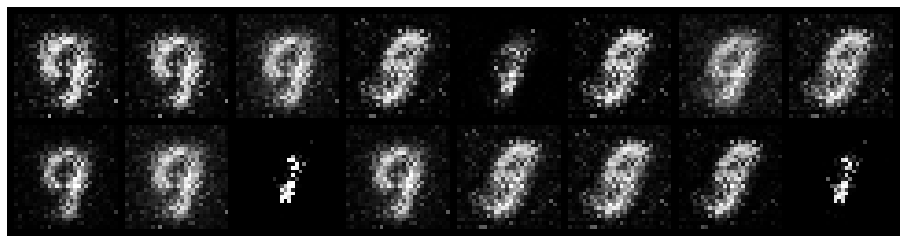

Epoch: [6/20], Batch Num: [0/600]
Discriminator Loss: 0.2797, Generator Loss: 3.6841
D(x): 0.9459, D(G(z)): 0.0988
Epoch: [6/20], Batch Num: [1/600]
Discriminator Loss: 0.2495, Generator Loss: 4.1320
D(x): 0.9669, D(G(z)): 0.1014
Epoch: [6/20], Batch Num: [2/600]
Discriminator Loss: 0.2155, Generator Loss: 5.2308
D(x): 0.9532, D(G(z)): 0.0730
Epoch: [6/20], Batch Num: [3/600]
Discriminator Loss: 0.2818, Generator Loss: 5.8174
D(x): 0.9176, D(G(z)): 0.0455
Epoch: [6/20], Batch Num: [4/600]
Discriminator Loss: 0.4154, Generator Loss: 5.0660
D(x): 0.8535, D(G(z)): 0.0405
Epoch: [6/20], Batch Num: [5/600]
Discriminator Loss: 0.0904, Generator Loss: 4.5539
D(x): 0.9660, D(G(z)): 0.0381
Epoch: [6/20], Batch Num: [6/600]
Discriminator Loss: 0.1906, Generator Loss: 4.4636
D(x): 0.9623, D(G(z)): 0.0807
Epoch: [6/20], Batch Num: [7/600]
Discriminator Loss: 0.2037, Generator Loss: 4.4621
D(x): 0.9359, D(G(z)): 0.0516
Epoch: [6/20], Batch Num: [8/600]
Discriminator Loss: 0.2019, Generator Loss: 4.

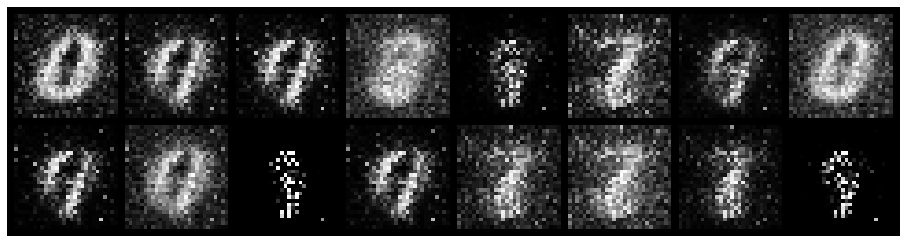

Epoch: [6/20], Batch Num: [100/600]
Discriminator Loss: 0.2102, Generator Loss: 4.9271
D(x): 0.9808, D(G(z)): 0.0799
Epoch: [6/20], Batch Num: [101/600]
Discriminator Loss: 0.0751, Generator Loss: 5.5799
D(x): 0.9589, D(G(z)): 0.0157
Epoch: [6/20], Batch Num: [102/600]
Discriminator Loss: 0.1389, Generator Loss: 5.2065
D(x): 0.9367, D(G(z)): 0.0144
Epoch: [6/20], Batch Num: [103/600]
Discriminator Loss: 0.3271, Generator Loss: 4.5007
D(x): 0.9189, D(G(z)): 0.0447
Epoch: [6/20], Batch Num: [104/600]
Discriminator Loss: 0.2085, Generator Loss: 3.8559
D(x): 0.9430, D(G(z)): 0.0668
Epoch: [6/20], Batch Num: [105/600]
Discriminator Loss: 0.2466, Generator Loss: 4.8291
D(x): 0.9750, D(G(z)): 0.1192
Epoch: [6/20], Batch Num: [106/600]
Discriminator Loss: 0.1438, Generator Loss: 5.3262
D(x): 0.9677, D(G(z)): 0.0605
Epoch: [6/20], Batch Num: [107/600]
Discriminator Loss: 0.2102, Generator Loss: 5.4690
D(x): 0.9394, D(G(z)): 0.0303
Epoch: [6/20], Batch Num: [108/600]
Discriminator Loss: 0.3450, 

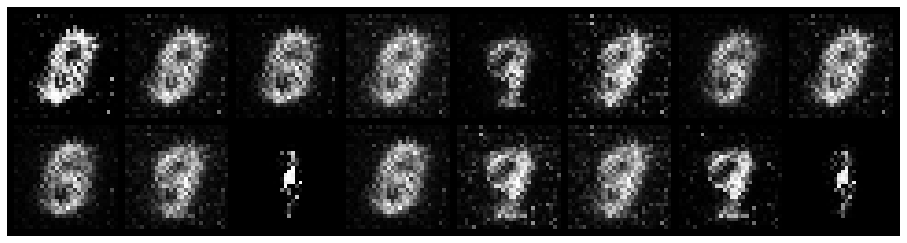

Epoch: [6/20], Batch Num: [200/600]
Discriminator Loss: 0.2522, Generator Loss: 4.1496
D(x): 0.9226, D(G(z)): 0.0597
Epoch: [6/20], Batch Num: [201/600]
Discriminator Loss: 0.2456, Generator Loss: 3.9281
D(x): 0.9289, D(G(z)): 0.0806
Epoch: [6/20], Batch Num: [202/600]
Discriminator Loss: 0.3827, Generator Loss: 4.1224
D(x): 0.9006, D(G(z)): 0.0919
Epoch: [6/20], Batch Num: [203/600]
Discriminator Loss: 0.2875, Generator Loss: 3.6152
D(x): 0.9212, D(G(z)): 0.0791
Epoch: [6/20], Batch Num: [204/600]
Discriminator Loss: 0.3990, Generator Loss: 3.0748
D(x): 0.8931, D(G(z)): 0.0973
Epoch: [6/20], Batch Num: [205/600]
Discriminator Loss: 0.4422, Generator Loss: 3.2154
D(x): 0.9057, D(G(z)): 0.1486
Epoch: [6/20], Batch Num: [206/600]
Discriminator Loss: 0.2950, Generator Loss: 4.1985
D(x): 0.9465, D(G(z)): 0.1197
Epoch: [6/20], Batch Num: [207/600]
Discriminator Loss: 0.3543, Generator Loss: 5.2314
D(x): 0.9143, D(G(z)): 0.1093
Epoch: [6/20], Batch Num: [208/600]
Discriminator Loss: 0.3775, 

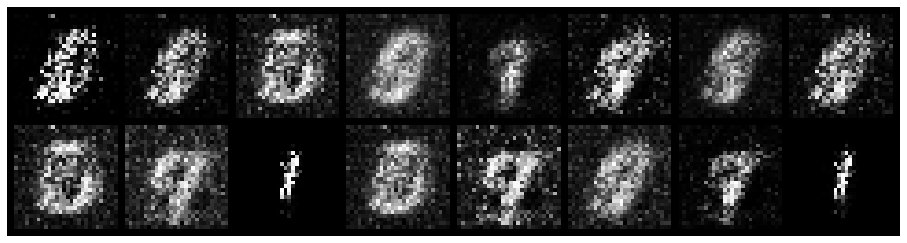

Epoch: [6/20], Batch Num: [300/600]
Discriminator Loss: 0.2881, Generator Loss: 4.5919
D(x): 0.9248, D(G(z)): 0.0773
Epoch: [6/20], Batch Num: [301/600]
Discriminator Loss: 0.4075, Generator Loss: 4.9760
D(x): 0.9016, D(G(z)): 0.0986
Epoch: [6/20], Batch Num: [302/600]
Discriminator Loss: 0.3742, Generator Loss: 4.6317
D(x): 0.9168, D(G(z)): 0.0797
Epoch: [6/20], Batch Num: [303/600]
Discriminator Loss: 0.1683, Generator Loss: 4.5116
D(x): 0.9557, D(G(z)): 0.0506
Epoch: [6/20], Batch Num: [304/600]
Discriminator Loss: 0.1489, Generator Loss: 4.1382
D(x): 0.9508, D(G(z)): 0.0535
Epoch: [6/20], Batch Num: [305/600]
Discriminator Loss: 0.4923, Generator Loss: 4.4143
D(x): 0.9337, D(G(z)): 0.1477
Epoch: [6/20], Batch Num: [306/600]
Discriminator Loss: 0.4411, Generator Loss: 4.5950
D(x): 0.8955, D(G(z)): 0.0828
Epoch: [6/20], Batch Num: [307/600]
Discriminator Loss: 0.3816, Generator Loss: 3.9210
D(x): 0.8797, D(G(z)): 0.0540
Epoch: [6/20], Batch Num: [308/600]
Discriminator Loss: 0.3309, 

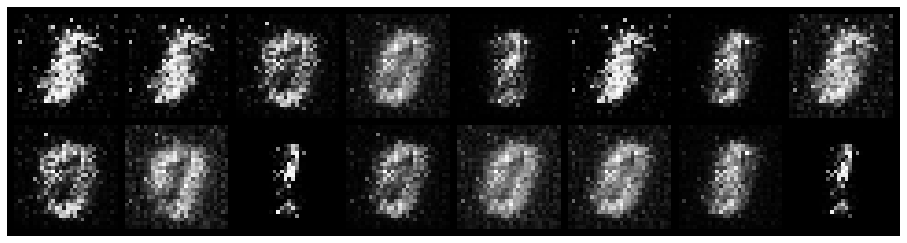

Epoch: [6/20], Batch Num: [400/600]
Discriminator Loss: 0.2018, Generator Loss: 3.4410
D(x): 0.9543, D(G(z)): 0.0697
Epoch: [6/20], Batch Num: [401/600]
Discriminator Loss: 0.2158, Generator Loss: 3.8953
D(x): 0.9536, D(G(z)): 0.0990
Epoch: [6/20], Batch Num: [402/600]
Discriminator Loss: 0.1751, Generator Loss: 4.5176
D(x): 0.9570, D(G(z)): 0.0583
Epoch: [6/20], Batch Num: [403/600]
Discriminator Loss: 0.3968, Generator Loss: 4.6974
D(x): 0.9199, D(G(z)): 0.0719
Epoch: [6/20], Batch Num: [404/600]
Discriminator Loss: 0.2221, Generator Loss: 4.6813
D(x): 0.9209, D(G(z)): 0.0479
Epoch: [6/20], Batch Num: [405/600]
Discriminator Loss: 0.1977, Generator Loss: 4.4560
D(x): 0.9379, D(G(z)): 0.0649
Epoch: [6/20], Batch Num: [406/600]
Discriminator Loss: 0.1591, Generator Loss: 4.0833
D(x): 0.9537, D(G(z)): 0.0573
Epoch: [6/20], Batch Num: [407/600]
Discriminator Loss: 0.3154, Generator Loss: 3.6429
D(x): 0.9180, D(G(z)): 0.0885
Epoch: [6/20], Batch Num: [408/600]
Discriminator Loss: 0.4183, 

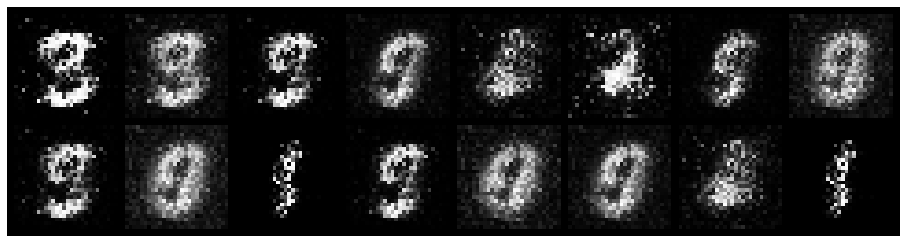

Epoch: [6/20], Batch Num: [500/600]
Discriminator Loss: 0.2708, Generator Loss: 4.8953
D(x): 0.8758, D(G(z)): 0.0628
Epoch: [6/20], Batch Num: [501/600]
Discriminator Loss: 0.2142, Generator Loss: 4.6695
D(x): 0.9147, D(G(z)): 0.0601
Epoch: [6/20], Batch Num: [502/600]
Discriminator Loss: 0.2153, Generator Loss: 4.2154
D(x): 0.9305, D(G(z)): 0.0602
Epoch: [6/20], Batch Num: [503/600]
Discriminator Loss: 0.2223, Generator Loss: 4.4596
D(x): 0.9448, D(G(z)): 0.1009
Epoch: [6/20], Batch Num: [504/600]
Discriminator Loss: 0.1777, Generator Loss: 4.6772
D(x): 0.9586, D(G(z)): 0.0677
Epoch: [6/20], Batch Num: [505/600]
Discriminator Loss: 0.2492, Generator Loss: 6.1317
D(x): 0.9506, D(G(z)): 0.0970
Epoch: [6/20], Batch Num: [506/600]
Discriminator Loss: 0.4914, Generator Loss: 6.2315
D(x): 0.8895, D(G(z)): 0.0755
Epoch: [6/20], Batch Num: [507/600]
Discriminator Loss: 0.2890, Generator Loss: 5.9629
D(x): 0.8731, D(G(z)): 0.0395
Epoch: [6/20], Batch Num: [508/600]
Discriminator Loss: 0.2166, 

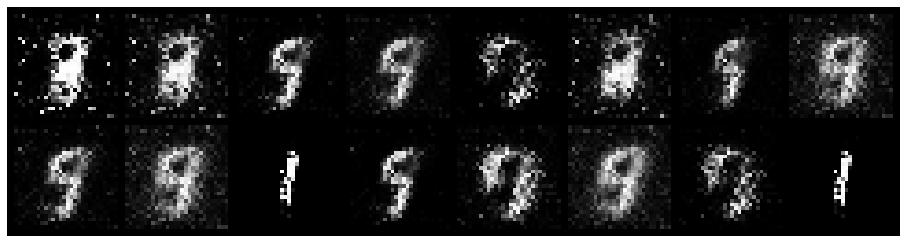

Epoch: [7/20], Batch Num: [0/600]
Discriminator Loss: 0.2915, Generator Loss: 3.5438
D(x): 0.9127, D(G(z)): 0.1098
Epoch: [7/20], Batch Num: [1/600]
Discriminator Loss: 0.3691, Generator Loss: 3.9567
D(x): 0.9206, D(G(z)): 0.1340
Epoch: [7/20], Batch Num: [2/600]
Discriminator Loss: 0.2331, Generator Loss: 4.4415
D(x): 0.9125, D(G(z)): 0.0586
Epoch: [7/20], Batch Num: [3/600]
Discriminator Loss: 0.2546, Generator Loss: 4.2082
D(x): 0.9252, D(G(z)): 0.0639
Epoch: [7/20], Batch Num: [4/600]
Discriminator Loss: 0.3475, Generator Loss: 3.7615
D(x): 0.8948, D(G(z)): 0.0848
Epoch: [7/20], Batch Num: [5/600]
Discriminator Loss: 0.3326, Generator Loss: 3.7920
D(x): 0.9182, D(G(z)): 0.1059
Epoch: [7/20], Batch Num: [6/600]
Discriminator Loss: 0.3353, Generator Loss: 4.2407
D(x): 0.9336, D(G(z)): 0.1128
Epoch: [7/20], Batch Num: [7/600]
Discriminator Loss: 0.2374, Generator Loss: 4.2718
D(x): 0.9291, D(G(z)): 0.0693
Epoch: [7/20], Batch Num: [8/600]
Discriminator Loss: 0.2353, Generator Loss: 4.

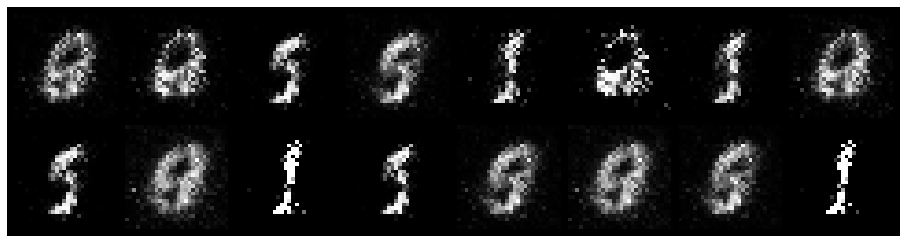

Epoch: [7/20], Batch Num: [100/600]
Discriminator Loss: 0.1547, Generator Loss: 3.9251
D(x): 0.9680, D(G(z)): 0.0762
Epoch: [7/20], Batch Num: [101/600]
Discriminator Loss: 0.1721, Generator Loss: 4.3288
D(x): 0.9386, D(G(z)): 0.0507
Epoch: [7/20], Batch Num: [102/600]
Discriminator Loss: 0.2005, Generator Loss: 4.3109
D(x): 0.9122, D(G(z)): 0.0174
Epoch: [7/20], Batch Num: [103/600]
Discriminator Loss: 0.2105, Generator Loss: 4.1030
D(x): 0.9170, D(G(z)): 0.0261
Epoch: [7/20], Batch Num: [104/600]
Discriminator Loss: 0.2666, Generator Loss: 3.3884
D(x): 0.9030, D(G(z)): 0.0470
Epoch: [7/20], Batch Num: [105/600]
Discriminator Loss: 0.2071, Generator Loss: 3.1203
D(x): 0.9542, D(G(z)): 0.0933
Epoch: [7/20], Batch Num: [106/600]
Discriminator Loss: 0.1770, Generator Loss: 3.5723
D(x): 0.9737, D(G(z)): 0.0951
Epoch: [7/20], Batch Num: [107/600]
Discriminator Loss: 0.0957, Generator Loss: 4.2692
D(x): 0.9853, D(G(z)): 0.0682
Epoch: [7/20], Batch Num: [108/600]
Discriminator Loss: 0.2718, 

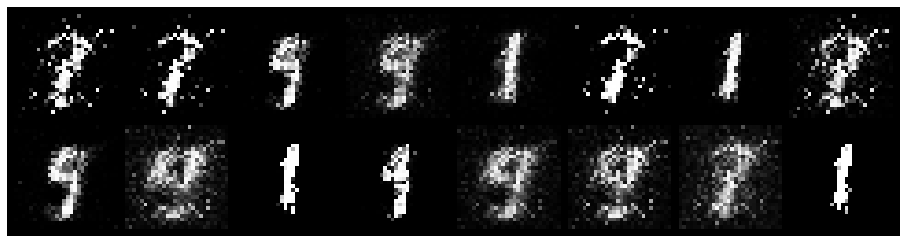

Epoch: [7/20], Batch Num: [200/600]
Discriminator Loss: 0.3593, Generator Loss: 3.5671
D(x): 0.9195, D(G(z)): 0.0960
Epoch: [7/20], Batch Num: [201/600]
Discriminator Loss: 0.4019, Generator Loss: 3.5719
D(x): 0.9259, D(G(z)): 0.1347
Epoch: [7/20], Batch Num: [202/600]
Discriminator Loss: 0.2875, Generator Loss: 3.8636
D(x): 0.9105, D(G(z)): 0.0982
Epoch: [7/20], Batch Num: [203/600]
Discriminator Loss: 0.2334, Generator Loss: 4.0502
D(x): 0.9076, D(G(z)): 0.0675
Epoch: [7/20], Batch Num: [204/600]
Discriminator Loss: 0.3636, Generator Loss: 3.5945
D(x): 0.8709, D(G(z)): 0.0794
Epoch: [7/20], Batch Num: [205/600]
Discriminator Loss: 0.2455, Generator Loss: 3.8901
D(x): 0.9256, D(G(z)): 0.0889
Epoch: [7/20], Batch Num: [206/600]
Discriminator Loss: 0.3075, Generator Loss: 3.3440
D(x): 0.8984, D(G(z)): 0.0834
Epoch: [7/20], Batch Num: [207/600]
Discriminator Loss: 0.3304, Generator Loss: 3.7564
D(x): 0.9078, D(G(z)): 0.1165
Epoch: [7/20], Batch Num: [208/600]
Discriminator Loss: 0.3625, 

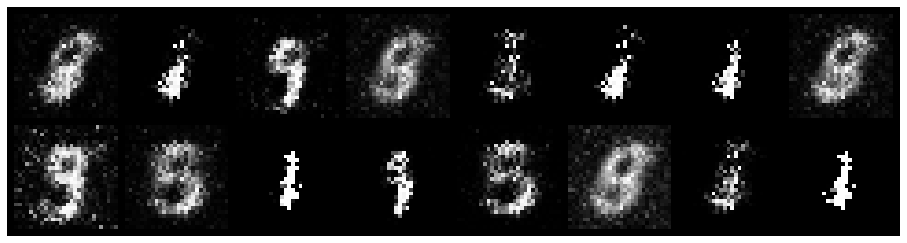

Epoch: [7/20], Batch Num: [300/600]
Discriminator Loss: 0.2077, Generator Loss: 3.8056
D(x): 0.9289, D(G(z)): 0.0572
Epoch: [7/20], Batch Num: [301/600]
Discriminator Loss: 0.3204, Generator Loss: 4.6292
D(x): 0.9606, D(G(z)): 0.1375
Epoch: [7/20], Batch Num: [302/600]
Discriminator Loss: 0.3830, Generator Loss: 5.1436
D(x): 0.9267, D(G(z)): 0.1028
Epoch: [7/20], Batch Num: [303/600]
Discriminator Loss: 0.1401, Generator Loss: 5.2466
D(x): 0.9490, D(G(z)): 0.0409
Epoch: [7/20], Batch Num: [304/600]
Discriminator Loss: 0.1794, Generator Loss: 5.2272
D(x): 0.9222, D(G(z)): 0.0303
Epoch: [7/20], Batch Num: [305/600]
Discriminator Loss: 0.1743, Generator Loss: 4.5316
D(x): 0.9164, D(G(z)): 0.0199
Epoch: [7/20], Batch Num: [306/600]
Discriminator Loss: 0.1970, Generator Loss: 4.0533
D(x): 0.9392, D(G(z)): 0.0600
Epoch: [7/20], Batch Num: [307/600]
Discriminator Loss: 0.1577, Generator Loss: 3.8771
D(x): 0.9831, D(G(z)): 0.0993
Epoch: [7/20], Batch Num: [308/600]
Discriminator Loss: 0.1131, 

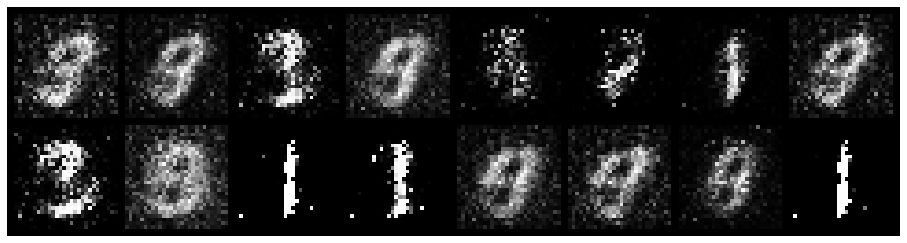

Epoch: [7/20], Batch Num: [400/600]
Discriminator Loss: 0.3094, Generator Loss: 4.2217
D(x): 0.9245, D(G(z)): 0.1314
Epoch: [7/20], Batch Num: [401/600]
Discriminator Loss: 0.3761, Generator Loss: 4.3338
D(x): 0.8574, D(G(z)): 0.0756
Epoch: [7/20], Batch Num: [402/600]
Discriminator Loss: 0.5214, Generator Loss: 4.3980
D(x): 0.8864, D(G(z)): 0.1335
Epoch: [7/20], Batch Num: [403/600]
Discriminator Loss: 0.3482, Generator Loss: 4.6515
D(x): 0.9190, D(G(z)): 0.1104
Epoch: [7/20], Batch Num: [404/600]
Discriminator Loss: 0.4774, Generator Loss: 4.2219
D(x): 0.8561, D(G(z)): 0.0604
Epoch: [7/20], Batch Num: [405/600]
Discriminator Loss: 0.2749, Generator Loss: 3.6085
D(x): 0.8979, D(G(z)): 0.0619
Epoch: [7/20], Batch Num: [406/600]
Discriminator Loss: 0.3105, Generator Loss: 3.1188
D(x): 0.9045, D(G(z)): 0.0912
Epoch: [7/20], Batch Num: [407/600]
Discriminator Loss: 0.3307, Generator Loss: 3.8967
D(x): 0.9725, D(G(z)): 0.1597
Epoch: [7/20], Batch Num: [408/600]
Discriminator Loss: 0.2081, 

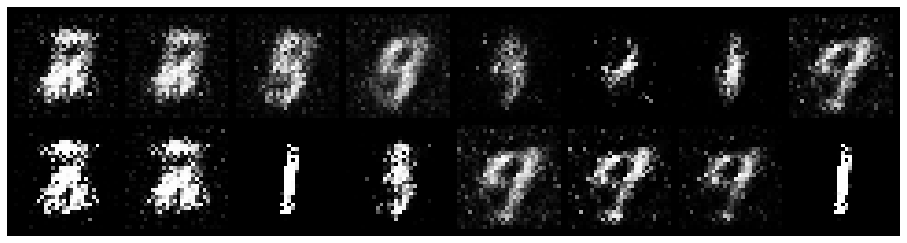

Epoch: [7/20], Batch Num: [500/600]
Discriminator Loss: 0.1986, Generator Loss: 3.9867
D(x): 0.9503, D(G(z)): 0.0816
Epoch: [7/20], Batch Num: [501/600]
Discriminator Loss: 0.2667, Generator Loss: 3.6074
D(x): 0.9416, D(G(z)): 0.1229
Epoch: [7/20], Batch Num: [502/600]
Discriminator Loss: 0.2954, Generator Loss: 4.8514
D(x): 0.9342, D(G(z)): 0.1214
Epoch: [7/20], Batch Num: [503/600]
Discriminator Loss: 0.2082, Generator Loss: 5.4174
D(x): 0.9251, D(G(z)): 0.0414
Epoch: [7/20], Batch Num: [504/600]
Discriminator Loss: 0.2683, Generator Loss: 4.9641
D(x): 0.8921, D(G(z)): 0.0398
Epoch: [7/20], Batch Num: [505/600]
Discriminator Loss: 0.1679, Generator Loss: 4.4355
D(x): 0.9324, D(G(z)): 0.0578
Epoch: [7/20], Batch Num: [506/600]
Discriminator Loss: 0.3509, Generator Loss: 4.3216
D(x): 0.9045, D(G(z)): 0.0922
Epoch: [7/20], Batch Num: [507/600]
Discriminator Loss: 0.3527, Generator Loss: 4.1304
D(x): 0.9181, D(G(z)): 0.0878
Epoch: [7/20], Batch Num: [508/600]
Discriminator Loss: 0.2176, 

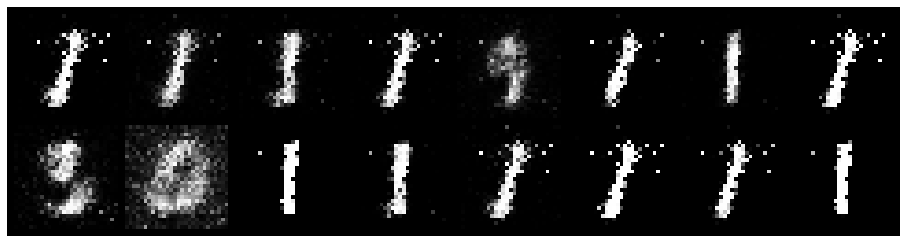

Epoch: [8/20], Batch Num: [0/600]
Discriminator Loss: 0.2972, Generator Loss: 3.8671
D(x): 0.9553, D(G(z)): 0.1476
Epoch: [8/20], Batch Num: [1/600]
Discriminator Loss: 0.3030, Generator Loss: 4.4037
D(x): 0.9168, D(G(z)): 0.0766
Epoch: [8/20], Batch Num: [2/600]
Discriminator Loss: 0.3984, Generator Loss: 4.1119
D(x): 0.8328, D(G(z)): 0.0430
Epoch: [8/20], Batch Num: [3/600]
Discriminator Loss: 0.2880, Generator Loss: 3.1991
D(x): 0.8838, D(G(z)): 0.0513
Epoch: [8/20], Batch Num: [4/600]
Discriminator Loss: 0.2419, Generator Loss: 2.5141
D(x): 0.9297, D(G(z)): 0.0935
Epoch: [8/20], Batch Num: [5/600]
Discriminator Loss: 0.4253, Generator Loss: 2.8198
D(x): 0.9446, D(G(z)): 0.2139
Epoch: [8/20], Batch Num: [6/600]
Discriminator Loss: 0.3938, Generator Loss: 3.8721
D(x): 0.9237, D(G(z)): 0.1640
Epoch: [8/20], Batch Num: [7/600]
Discriminator Loss: 0.3496, Generator Loss: 4.6216
D(x): 0.8870, D(G(z)): 0.0822
Epoch: [8/20], Batch Num: [8/600]
Discriminator Loss: 0.4140, Generator Loss: 4.

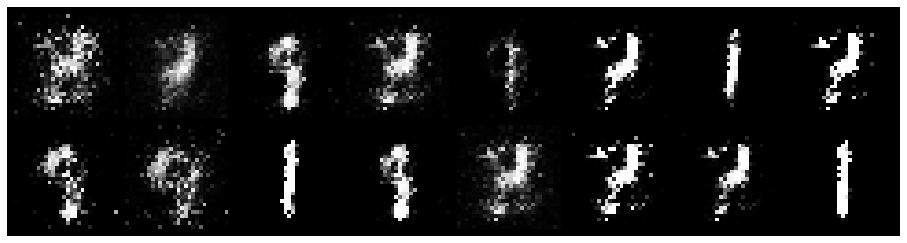

Epoch: [8/20], Batch Num: [100/600]
Discriminator Loss: 0.2708, Generator Loss: 3.4144
D(x): 0.9240, D(G(z)): 0.0937
Epoch: [8/20], Batch Num: [101/600]
Discriminator Loss: 0.3345, Generator Loss: 4.1711
D(x): 0.9113, D(G(z)): 0.1270
Epoch: [8/20], Batch Num: [102/600]
Discriminator Loss: 0.2460, Generator Loss: 4.8013
D(x): 0.9272, D(G(z)): 0.0539
Epoch: [8/20], Batch Num: [103/600]
Discriminator Loss: 0.3271, Generator Loss: 5.3758
D(x): 0.8922, D(G(z)): 0.0883
Epoch: [8/20], Batch Num: [104/600]
Discriminator Loss: 0.3235, Generator Loss: 4.4775
D(x): 0.8769, D(G(z)): 0.0533
Epoch: [8/20], Batch Num: [105/600]
Discriminator Loss: 0.3577, Generator Loss: 3.8007
D(x): 0.8997, D(G(z)): 0.0703
Epoch: [8/20], Batch Num: [106/600]
Discriminator Loss: 0.4591, Generator Loss: 3.3894
D(x): 0.8949, D(G(z)): 0.1190
Epoch: [8/20], Batch Num: [107/600]
Discriminator Loss: 0.5135, Generator Loss: 4.2245
D(x): 0.9029, D(G(z)): 0.1761
Epoch: [8/20], Batch Num: [108/600]
Discriminator Loss: 0.3506, 

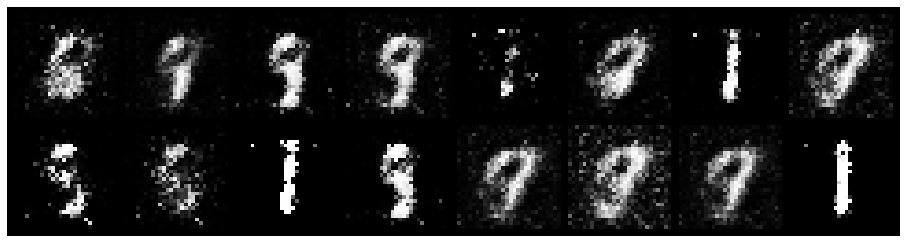

Epoch: [8/20], Batch Num: [200/600]
Discriminator Loss: 0.3382, Generator Loss: 4.0488
D(x): 0.9202, D(G(z)): 0.1147
Epoch: [8/20], Batch Num: [201/600]
Discriminator Loss: 0.2842, Generator Loss: 4.4123
D(x): 0.9108, D(G(z)): 0.0830
Epoch: [8/20], Batch Num: [202/600]
Discriminator Loss: 0.3579, Generator Loss: 4.7336
D(x): 0.8653, D(G(z)): 0.0707
Epoch: [8/20], Batch Num: [203/600]
Discriminator Loss: 0.3974, Generator Loss: 4.1545
D(x): 0.8599, D(G(z)): 0.0844
Epoch: [8/20], Batch Num: [204/600]
Discriminator Loss: 0.5486, Generator Loss: 3.0643
D(x): 0.8460, D(G(z)): 0.1016
Epoch: [8/20], Batch Num: [205/600]
Discriminator Loss: 0.3994, Generator Loss: 2.7916
D(x): 0.9007, D(G(z)): 0.1352
Epoch: [8/20], Batch Num: [206/600]
Discriminator Loss: 0.3516, Generator Loss: 2.9320
D(x): 0.9245, D(G(z)): 0.1472
Epoch: [8/20], Batch Num: [207/600]
Discriminator Loss: 0.4436, Generator Loss: 4.1923
D(x): 0.9051, D(G(z)): 0.1706
Epoch: [8/20], Batch Num: [208/600]
Discriminator Loss: 0.4093, 

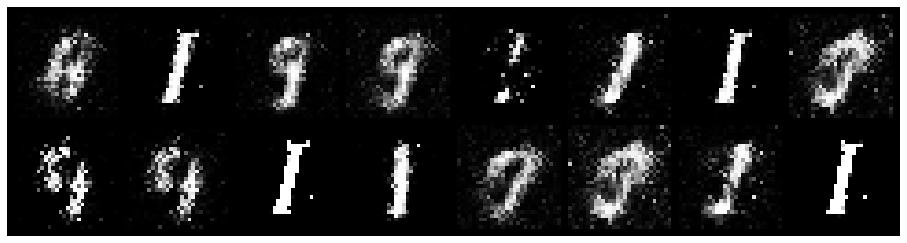

Epoch: [8/20], Batch Num: [300/600]
Discriminator Loss: 0.3204, Generator Loss: 3.1982
D(x): 0.9298, D(G(z)): 0.1213
Epoch: [8/20], Batch Num: [301/600]
Discriminator Loss: 0.3484, Generator Loss: 3.5425
D(x): 0.9305, D(G(z)): 0.1413
Epoch: [8/20], Batch Num: [302/600]
Discriminator Loss: 0.2361, Generator Loss: 3.9834
D(x): 0.9327, D(G(z)): 0.0992
Epoch: [8/20], Batch Num: [303/600]
Discriminator Loss: 0.2433, Generator Loss: 4.2917
D(x): 0.9144, D(G(z)): 0.0879
Epoch: [8/20], Batch Num: [304/600]
Discriminator Loss: 0.1885, Generator Loss: 3.9562
D(x): 0.9155, D(G(z)): 0.0472
Epoch: [8/20], Batch Num: [305/600]
Discriminator Loss: 0.2695, Generator Loss: 4.0996
D(x): 0.8929, D(G(z)): 0.0396
Epoch: [8/20], Batch Num: [306/600]
Discriminator Loss: 0.2440, Generator Loss: 3.5804
D(x): 0.9207, D(G(z)): 0.0610
Epoch: [8/20], Batch Num: [307/600]
Discriminator Loss: 0.2216, Generator Loss: 2.9776
D(x): 0.9318, D(G(z)): 0.0799
Epoch: [8/20], Batch Num: [308/600]
Discriminator Loss: 0.2437, 

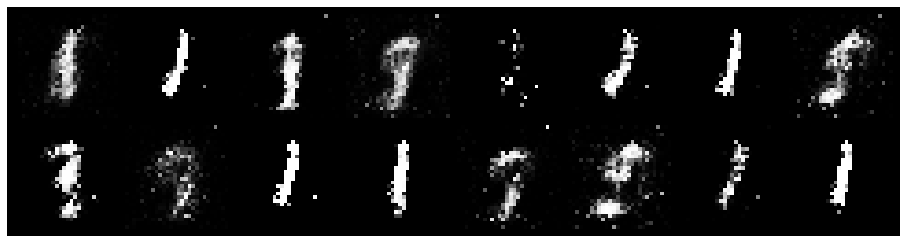

Epoch: [8/20], Batch Num: [400/600]
Discriminator Loss: 0.3934, Generator Loss: 3.7179
D(x): 0.8659, D(G(z)): 0.0859
Epoch: [8/20], Batch Num: [401/600]
Discriminator Loss: 0.2789, Generator Loss: 3.3502
D(x): 0.9152, D(G(z)): 0.0774
Epoch: [8/20], Batch Num: [402/600]
Discriminator Loss: 0.3636, Generator Loss: 3.6724
D(x): 0.9094, D(G(z)): 0.1268
Epoch: [8/20], Batch Num: [403/600]
Discriminator Loss: 0.3359, Generator Loss: 3.4826
D(x): 0.9011, D(G(z)): 0.1015
Epoch: [8/20], Batch Num: [404/600]
Discriminator Loss: 0.2131, Generator Loss: 3.8234
D(x): 0.9494, D(G(z)): 0.0909
Epoch: [8/20], Batch Num: [405/600]
Discriminator Loss: 0.2684, Generator Loss: 4.5445
D(x): 0.9174, D(G(z)): 0.0907
Epoch: [8/20], Batch Num: [406/600]
Discriminator Loss: 0.1518, Generator Loss: 4.6907
D(x): 0.9487, D(G(z)): 0.0559
Epoch: [8/20], Batch Num: [407/600]
Discriminator Loss: 0.1756, Generator Loss: 4.2935
D(x): 0.9252, D(G(z)): 0.0349
Epoch: [8/20], Batch Num: [408/600]
Discriminator Loss: 0.1886, 

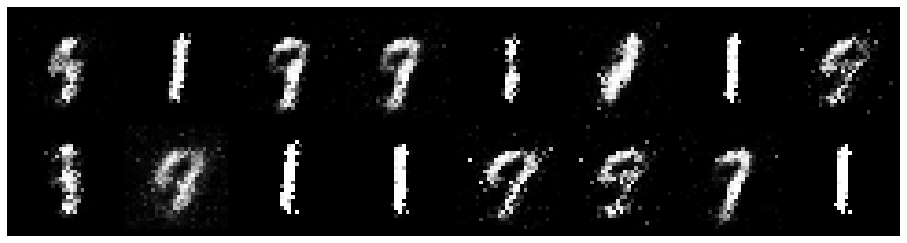

Epoch: [8/20], Batch Num: [500/600]
Discriminator Loss: 0.1932, Generator Loss: 4.1089
D(x): 0.9166, D(G(z)): 0.0471
Epoch: [8/20], Batch Num: [501/600]
Discriminator Loss: 0.1718, Generator Loss: 3.8499
D(x): 0.9310, D(G(z)): 0.0527
Epoch: [8/20], Batch Num: [502/600]
Discriminator Loss: 0.2533, Generator Loss: 3.6971
D(x): 0.9248, D(G(z)): 0.0832
Epoch: [8/20], Batch Num: [503/600]
Discriminator Loss: 0.2357, Generator Loss: 3.8354
D(x): 0.9435, D(G(z)): 0.0975
Epoch: [8/20], Batch Num: [504/600]
Discriminator Loss: 0.3915, Generator Loss: 3.4466
D(x): 0.8909, D(G(z)): 0.1052
Epoch: [8/20], Batch Num: [505/600]
Discriminator Loss: 0.2817, Generator Loss: 3.7807
D(x): 0.9080, D(G(z)): 0.0882
Epoch: [8/20], Batch Num: [506/600]
Discriminator Loss: 0.3872, Generator Loss: 3.6457
D(x): 0.8989, D(G(z)): 0.1052
Epoch: [8/20], Batch Num: [507/600]
Discriminator Loss: 0.3701, Generator Loss: 3.6065
D(x): 0.8859, D(G(z)): 0.0995
Epoch: [8/20], Batch Num: [508/600]
Discriminator Loss: 0.3830, 

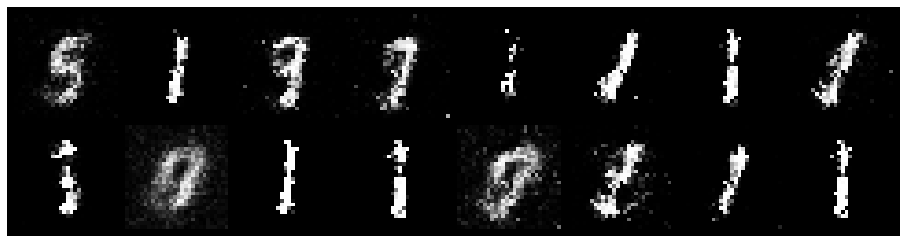

Epoch: [9/20], Batch Num: [0/600]
Discriminator Loss: 0.3256, Generator Loss: 3.1667
D(x): 0.9334, D(G(z)): 0.1597
Epoch: [9/20], Batch Num: [1/600]
Discriminator Loss: 0.4365, Generator Loss: 3.5704
D(x): 0.8622, D(G(z)): 0.1020
Epoch: [9/20], Batch Num: [2/600]
Discriminator Loss: 0.3171, Generator Loss: 3.6814
D(x): 0.9262, D(G(z)): 0.1245
Epoch: [9/20], Batch Num: [3/600]
Discriminator Loss: 0.2851, Generator Loss: 3.9183
D(x): 0.8994, D(G(z)): 0.0837
Epoch: [9/20], Batch Num: [4/600]
Discriminator Loss: 0.3380, Generator Loss: 3.8295
D(x): 0.8576, D(G(z)): 0.0647
Epoch: [9/20], Batch Num: [5/600]
Discriminator Loss: 0.4038, Generator Loss: 3.3155
D(x): 0.8958, D(G(z)): 0.1123
Epoch: [9/20], Batch Num: [6/600]
Discriminator Loss: 0.3269, Generator Loss: 3.2793
D(x): 0.9131, D(G(z)): 0.1184
Epoch: [9/20], Batch Num: [7/600]
Discriminator Loss: 0.3019, Generator Loss: 3.5225
D(x): 0.9347, D(G(z)): 0.1311
Epoch: [9/20], Batch Num: [8/600]
Discriminator Loss: 0.3348, Generator Loss: 3.

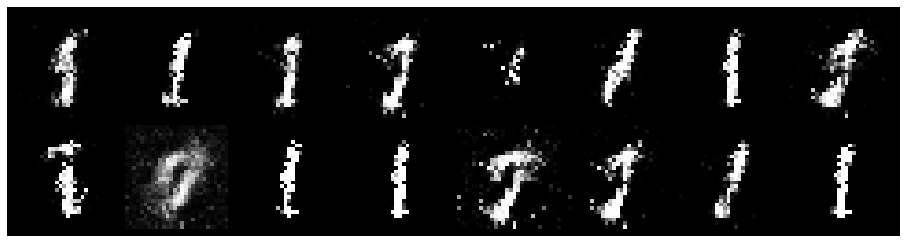

Epoch: [9/20], Batch Num: [100/600]
Discriminator Loss: 0.3922, Generator Loss: 2.2030
D(x): 0.9008, D(G(z)): 0.1655
Epoch: [9/20], Batch Num: [101/600]
Discriminator Loss: 0.4467, Generator Loss: 2.7157
D(x): 0.9211, D(G(z)): 0.2170
Epoch: [9/20], Batch Num: [102/600]
Discriminator Loss: 0.6164, Generator Loss: 3.5962
D(x): 0.8913, D(G(z)): 0.2295
Epoch: [9/20], Batch Num: [103/600]
Discriminator Loss: 0.3939, Generator Loss: 4.0356
D(x): 0.8497, D(G(z)): 0.0863
Epoch: [9/20], Batch Num: [104/600]
Discriminator Loss: 0.4318, Generator Loss: 3.8985
D(x): 0.8260, D(G(z)): 0.0575
Epoch: [9/20], Batch Num: [105/600]
Discriminator Loss: 0.6140, Generator Loss: 2.9188
D(x): 0.7959, D(G(z)): 0.0889
Epoch: [9/20], Batch Num: [106/600]
Discriminator Loss: 0.4443, Generator Loss: 2.2304
D(x): 0.8516, D(G(z)): 0.1013
Epoch: [9/20], Batch Num: [107/600]
Discriminator Loss: 0.3519, Generator Loss: 1.9808
D(x): 0.9181, D(G(z)): 0.1612
Epoch: [9/20], Batch Num: [108/600]
Discriminator Loss: 0.3951, 

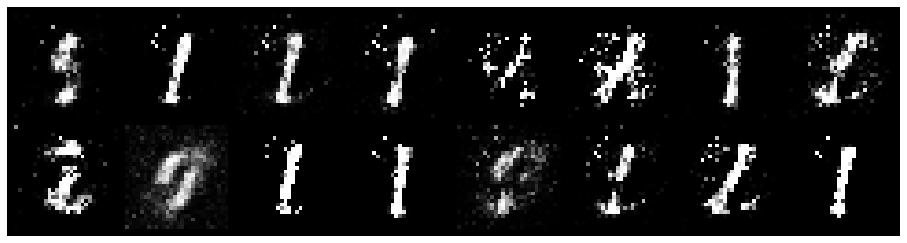

Epoch: [9/20], Batch Num: [200/600]
Discriminator Loss: 0.5310, Generator Loss: 3.5367
D(x): 0.9092, D(G(z)): 0.2217
Epoch: [9/20], Batch Num: [201/600]
Discriminator Loss: 0.3794, Generator Loss: 3.2373
D(x): 0.8508, D(G(z)): 0.1011
Epoch: [9/20], Batch Num: [202/600]
Discriminator Loss: 0.4562, Generator Loss: 3.4699
D(x): 0.8236, D(G(z)): 0.0876
Epoch: [9/20], Batch Num: [203/600]
Discriminator Loss: 0.4829, Generator Loss: 2.7094
D(x): 0.8477, D(G(z)): 0.1111
Epoch: [9/20], Batch Num: [204/600]
Discriminator Loss: 0.5008, Generator Loss: 2.6291
D(x): 0.8394, D(G(z)): 0.1711
Epoch: [9/20], Batch Num: [205/600]
Discriminator Loss: 0.4705, Generator Loss: 2.4735
D(x): 0.8718, D(G(z)): 0.1795
Epoch: [9/20], Batch Num: [206/600]
Discriminator Loss: 0.5881, Generator Loss: 3.0682
D(x): 0.8771, D(G(z)): 0.2368
Epoch: [9/20], Batch Num: [207/600]
Discriminator Loss: 0.4302, Generator Loss: 3.7418
D(x): 0.8831, D(G(z)): 0.1423
Epoch: [9/20], Batch Num: [208/600]
Discriminator Loss: 0.5393, 

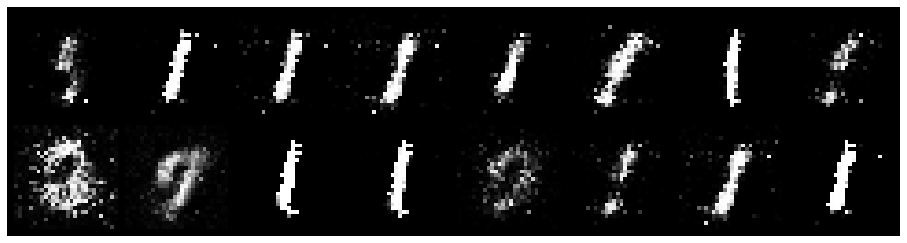

Epoch: [9/20], Batch Num: [300/600]
Discriminator Loss: 0.3940, Generator Loss: 4.2236
D(x): 0.8761, D(G(z)): 0.0762
Epoch: [9/20], Batch Num: [301/600]
Discriminator Loss: 0.3604, Generator Loss: 3.9288
D(x): 0.8839, D(G(z)): 0.0767
Epoch: [9/20], Batch Num: [302/600]
Discriminator Loss: 0.4135, Generator Loss: 2.8205
D(x): 0.8390, D(G(z)): 0.0857
Epoch: [9/20], Batch Num: [303/600]
Discriminator Loss: 0.3193, Generator Loss: 2.7999
D(x): 0.9344, D(G(z)): 0.1566
Epoch: [9/20], Batch Num: [304/600]
Discriminator Loss: 0.3513, Generator Loss: 3.4015
D(x): 0.9371, D(G(z)): 0.1703
Epoch: [9/20], Batch Num: [305/600]
Discriminator Loss: 0.3914, Generator Loss: 3.4090
D(x): 0.8613, D(G(z)): 0.0805
Epoch: [9/20], Batch Num: [306/600]
Discriminator Loss: 0.3141, Generator Loss: 3.4729
D(x): 0.9102, D(G(z)): 0.0999
Epoch: [9/20], Batch Num: [307/600]
Discriminator Loss: 0.3414, Generator Loss: 3.3746
D(x): 0.8789, D(G(z)): 0.0792
Epoch: [9/20], Batch Num: [308/600]
Discriminator Loss: 0.2451, 

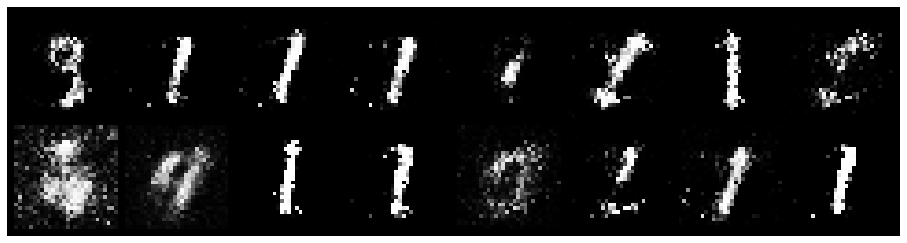

Epoch: [9/20], Batch Num: [400/600]
Discriminator Loss: 0.3512, Generator Loss: 3.0446
D(x): 0.9121, D(G(z)): 0.1480
Epoch: [9/20], Batch Num: [401/600]
Discriminator Loss: 0.3768, Generator Loss: 3.0711
D(x): 0.8966, D(G(z)): 0.1479
Epoch: [9/20], Batch Num: [402/600]
Discriminator Loss: 0.3988, Generator Loss: 2.9503
D(x): 0.8516, D(G(z)): 0.0889
Epoch: [9/20], Batch Num: [403/600]
Discriminator Loss: 0.3831, Generator Loss: 2.9522
D(x): 0.8789, D(G(z)): 0.1188
Epoch: [9/20], Batch Num: [404/600]
Discriminator Loss: 0.4854, Generator Loss: 3.3627
D(x): 0.9357, D(G(z)): 0.2336
Epoch: [9/20], Batch Num: [405/600]
Discriminator Loss: 0.3403, Generator Loss: 4.4308
D(x): 0.8992, D(G(z)): 0.0970
Epoch: [9/20], Batch Num: [406/600]
Discriminator Loss: 0.4626, Generator Loss: 3.9880
D(x): 0.8117, D(G(z)): 0.0735
Epoch: [9/20], Batch Num: [407/600]
Discriminator Loss: 0.5454, Generator Loss: 3.1016
D(x): 0.8238, D(G(z)): 0.0777
Epoch: [9/20], Batch Num: [408/600]
Discriminator Loss: 0.3913, 

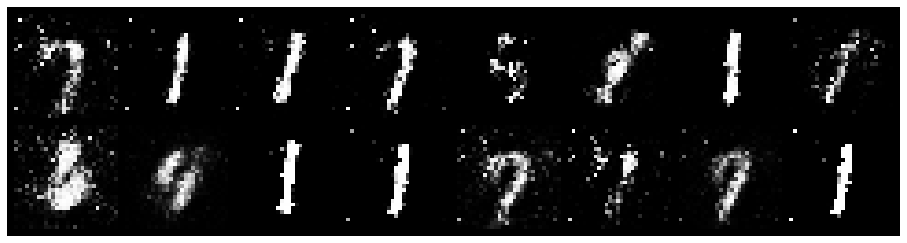

Epoch: [9/20], Batch Num: [500/600]
Discriminator Loss: 0.4349, Generator Loss: 2.4174
D(x): 0.9023, D(G(z)): 0.2105
Epoch: [9/20], Batch Num: [501/600]
Discriminator Loss: 0.4463, Generator Loss: 2.8266
D(x): 0.9184, D(G(z)): 0.1783
Epoch: [9/20], Batch Num: [502/600]
Discriminator Loss: 0.4452, Generator Loss: 3.1550
D(x): 0.8614, D(G(z)): 0.1360
Epoch: [9/20], Batch Num: [503/600]
Discriminator Loss: 0.3105, Generator Loss: 3.4217
D(x): 0.8803, D(G(z)): 0.0763
Epoch: [9/20], Batch Num: [504/600]
Discriminator Loss: 0.4907, Generator Loss: 2.9629
D(x): 0.8243, D(G(z)): 0.0873
Epoch: [9/20], Batch Num: [505/600]
Discriminator Loss: 0.2993, Generator Loss: 2.6686
D(x): 0.8846, D(G(z)): 0.0929
Epoch: [9/20], Batch Num: [506/600]
Discriminator Loss: 0.3809, Generator Loss: 2.6846
D(x): 0.9134, D(G(z)): 0.1484
Epoch: [9/20], Batch Num: [507/600]
Discriminator Loss: 0.4916, Generator Loss: 2.7414
D(x): 0.8613, D(G(z)): 0.1570
Epoch: [9/20], Batch Num: [508/600]
Discriminator Loss: 0.4126, 

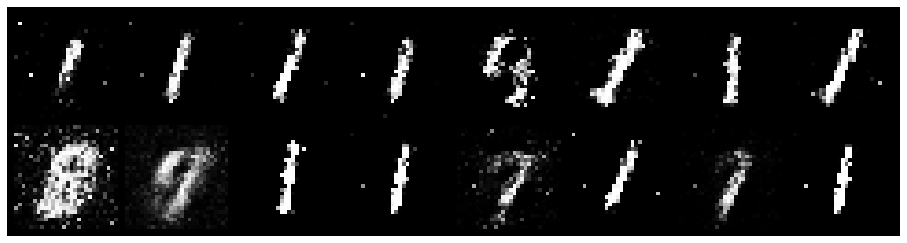

Epoch: [10/20], Batch Num: [0/600]
Discriminator Loss: 0.3456, Generator Loss: 4.0177
D(x): 0.8807, D(G(z)): 0.0801
Epoch: [10/20], Batch Num: [1/600]
Discriminator Loss: 0.4137, Generator Loss: 3.9956
D(x): 0.8621, D(G(z)): 0.0619
Epoch: [10/20], Batch Num: [2/600]
Discriminator Loss: 0.4791, Generator Loss: 3.4735
D(x): 0.8281, D(G(z)): 0.0690
Epoch: [10/20], Batch Num: [3/600]
Discriminator Loss: 0.4044, Generator Loss: 2.4612
D(x): 0.8297, D(G(z)): 0.0716
Epoch: [10/20], Batch Num: [4/600]
Discriminator Loss: 0.4209, Generator Loss: 1.9787
D(x): 0.9106, D(G(z)): 0.1881
Epoch: [10/20], Batch Num: [5/600]
Discriminator Loss: 0.5817, Generator Loss: 2.5971
D(x): 0.9049, D(G(z)): 0.2651
Epoch: [10/20], Batch Num: [6/600]
Discriminator Loss: 0.5024, Generator Loss: 2.8562
D(x): 0.8464, D(G(z)): 0.1390
Epoch: [10/20], Batch Num: [7/600]
Discriminator Loss: 0.3403, Generator Loss: 3.5267
D(x): 0.9038, D(G(z)): 0.1174
Epoch: [10/20], Batch Num: [8/600]
Discriminator Loss: 0.3471, Generator

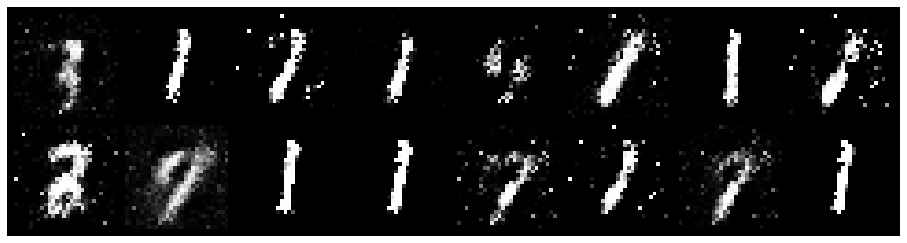

Epoch: [10/20], Batch Num: [100/600]
Discriminator Loss: 0.4745, Generator Loss: 2.1539
D(x): 0.8831, D(G(z)): 0.1694
Epoch: [10/20], Batch Num: [101/600]
Discriminator Loss: 0.4436, Generator Loss: 2.6617
D(x): 0.9198, D(G(z)): 0.1919
Epoch: [10/20], Batch Num: [102/600]
Discriminator Loss: 0.4305, Generator Loss: 3.3416
D(x): 0.9404, D(G(z)): 0.1984
Epoch: [10/20], Batch Num: [103/600]
Discriminator Loss: 0.4111, Generator Loss: 4.0255
D(x): 0.8419, D(G(z)): 0.0741
Epoch: [10/20], Batch Num: [104/600]
Discriminator Loss: 0.4534, Generator Loss: 3.6290
D(x): 0.8513, D(G(z)): 0.0764
Epoch: [10/20], Batch Num: [105/600]
Discriminator Loss: 0.6216, Generator Loss: 3.1157
D(x): 0.7651, D(G(z)): 0.0767
Epoch: [10/20], Batch Num: [106/600]
Discriminator Loss: 0.3625, Generator Loss: 2.5731
D(x): 0.8793, D(G(z)): 0.1130
Epoch: [10/20], Batch Num: [107/600]
Discriminator Loss: 0.4512, Generator Loss: 2.3683
D(x): 0.9070, D(G(z)): 0.1802
Epoch: [10/20], Batch Num: [108/600]
Discriminator Loss:

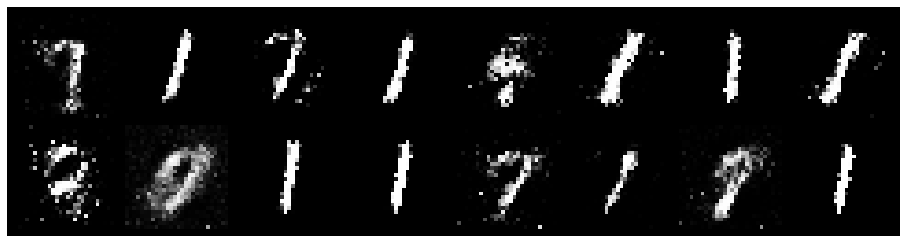

Epoch: [10/20], Batch Num: [200/600]
Discriminator Loss: 0.4303, Generator Loss: 4.0928
D(x): 0.8454, D(G(z)): 0.0830
Epoch: [10/20], Batch Num: [201/600]
Discriminator Loss: 0.3642, Generator Loss: 4.4875
D(x): 0.8764, D(G(z)): 0.0536
Epoch: [10/20], Batch Num: [202/600]
Discriminator Loss: 0.6185, Generator Loss: 3.7153
D(x): 0.7904, D(G(z)): 0.0624
Epoch: [10/20], Batch Num: [203/600]
Discriminator Loss: 0.4037, Generator Loss: 2.2937
D(x): 0.8375, D(G(z)): 0.0725
Epoch: [10/20], Batch Num: [204/600]
Discriminator Loss: 0.4648, Generator Loss: 2.1868
D(x): 0.9460, D(G(z)): 0.2374
Epoch: [10/20], Batch Num: [205/600]
Discriminator Loss: 0.4555, Generator Loss: 2.7937
D(x): 0.9246, D(G(z)): 0.1997
Epoch: [10/20], Batch Num: [206/600]
Discriminator Loss: 0.3809, Generator Loss: 3.5656
D(x): 0.8765, D(G(z)): 0.1342
Epoch: [10/20], Batch Num: [207/600]
Discriminator Loss: 0.5331, Generator Loss: 3.6617
D(x): 0.8466, D(G(z)): 0.1022
Epoch: [10/20], Batch Num: [208/600]
Discriminator Loss:

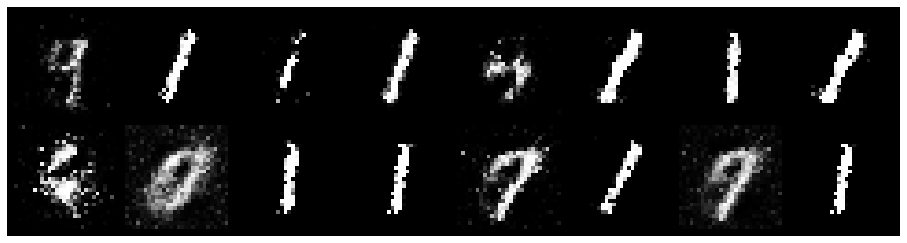

Epoch: [10/20], Batch Num: [300/600]
Discriminator Loss: 0.5488, Generator Loss: 2.6681
D(x): 0.8475, D(G(z)): 0.1815
Epoch: [10/20], Batch Num: [301/600]
Discriminator Loss: 0.6204, Generator Loss: 2.8882
D(x): 0.8009, D(G(z)): 0.1370
Epoch: [10/20], Batch Num: [302/600]
Discriminator Loss: 0.4070, Generator Loss: 2.8068
D(x): 0.8429, D(G(z)): 0.0912
Epoch: [10/20], Batch Num: [303/600]
Discriminator Loss: 0.5599, Generator Loss: 2.4524
D(x): 0.8074, D(G(z)): 0.1423
Epoch: [10/20], Batch Num: [304/600]
Discriminator Loss: 0.3935, Generator Loss: 2.3582
D(x): 0.8585, D(G(z)): 0.1119
Epoch: [10/20], Batch Num: [305/600]
Discriminator Loss: 0.4326, Generator Loss: 1.9233
D(x): 0.8832, D(G(z)): 0.1846
Epoch: [10/20], Batch Num: [306/600]
Discriminator Loss: 0.3877, Generator Loss: 1.9766
D(x): 0.8957, D(G(z)): 0.1824
Epoch: [10/20], Batch Num: [307/600]
Discriminator Loss: 0.5829, Generator Loss: 2.7961
D(x): 0.8896, D(G(z)): 0.2533
Epoch: [10/20], Batch Num: [308/600]
Discriminator Loss:

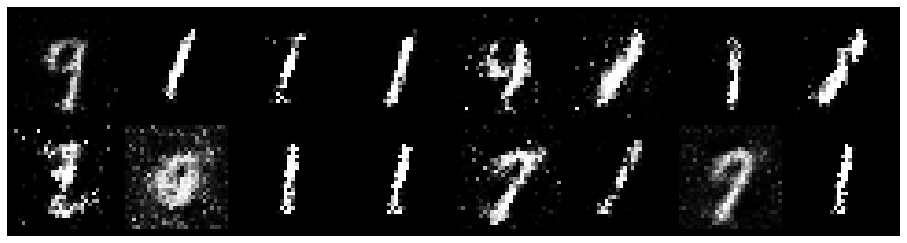

Epoch: [10/20], Batch Num: [400/600]
Discriminator Loss: 0.6273, Generator Loss: 3.3396
D(x): 0.8991, D(G(z)): 0.2415
Epoch: [10/20], Batch Num: [401/600]
Discriminator Loss: 0.3870, Generator Loss: 3.8688
D(x): 0.9005, D(G(z)): 0.1410
Epoch: [10/20], Batch Num: [402/600]
Discriminator Loss: 0.3022, Generator Loss: 3.8936
D(x): 0.8913, D(G(z)): 0.0633
Epoch: [10/20], Batch Num: [403/600]
Discriminator Loss: 0.4720, Generator Loss: 3.8352
D(x): 0.8188, D(G(z)): 0.0692
Epoch: [10/20], Batch Num: [404/600]
Discriminator Loss: 0.4633, Generator Loss: 2.7841
D(x): 0.8577, D(G(z)): 0.1060
Epoch: [10/20], Batch Num: [405/600]
Discriminator Loss: 0.4259, Generator Loss: 2.5922
D(x): 0.9162, D(G(z)): 0.1521
Epoch: [10/20], Batch Num: [406/600]
Discriminator Loss: 0.4761, Generator Loss: 3.3296
D(x): 0.9076, D(G(z)): 0.1979
Epoch: [10/20], Batch Num: [407/600]
Discriminator Loss: 0.3427, Generator Loss: 3.9179
D(x): 0.8891, D(G(z)): 0.1175
Epoch: [10/20], Batch Num: [408/600]
Discriminator Loss:

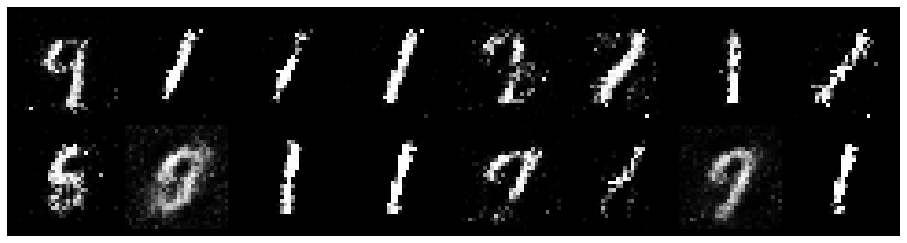

Epoch: [10/20], Batch Num: [500/600]
Discriminator Loss: 0.6153, Generator Loss: 2.0950
D(x): 0.8448, D(G(z)): 0.2131
Epoch: [10/20], Batch Num: [501/600]
Discriminator Loss: 0.4250, Generator Loss: 2.2784
D(x): 0.8932, D(G(z)): 0.1892
Epoch: [10/20], Batch Num: [502/600]
Discriminator Loss: 0.5050, Generator Loss: 2.6096
D(x): 0.8633, D(G(z)): 0.1946
Epoch: [10/20], Batch Num: [503/600]
Discriminator Loss: 0.3811, Generator Loss: 2.7976
D(x): 0.8607, D(G(z)): 0.1143
Epoch: [10/20], Batch Num: [504/600]
Discriminator Loss: 0.4021, Generator Loss: 2.6738
D(x): 0.8426, D(G(z)): 0.1043
Epoch: [10/20], Batch Num: [505/600]
Discriminator Loss: 0.5294, Generator Loss: 2.7526
D(x): 0.8040, D(G(z)): 0.1348
Epoch: [10/20], Batch Num: [506/600]
Discriminator Loss: 0.4828, Generator Loss: 2.5366
D(x): 0.8277, D(G(z)): 0.1383
Epoch: [10/20], Batch Num: [507/600]
Discriminator Loss: 0.4655, Generator Loss: 2.2651
D(x): 0.8649, D(G(z)): 0.1734
Epoch: [10/20], Batch Num: [508/600]
Discriminator Loss:

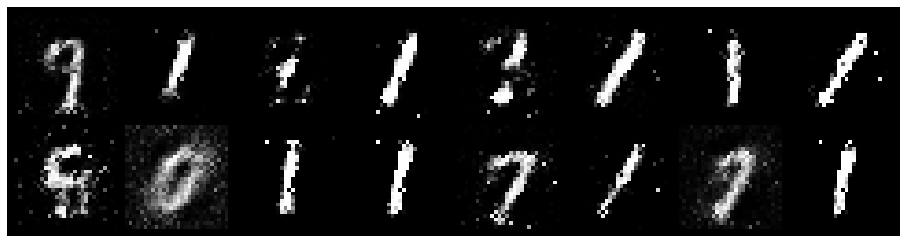

Epoch: [11/20], Batch Num: [0/600]
Discriminator Loss: 0.5101, Generator Loss: 2.4329
D(x): 0.8479, D(G(z)): 0.1392
Epoch: [11/20], Batch Num: [1/600]
Discriminator Loss: 0.4859, Generator Loss: 2.4931
D(x): 0.9022, D(G(z)): 0.1576
Epoch: [11/20], Batch Num: [2/600]
Discriminator Loss: 0.4880, Generator Loss: 2.9613
D(x): 0.9011, D(G(z)): 0.1675
Epoch: [11/20], Batch Num: [3/600]
Discriminator Loss: 0.5126, Generator Loss: 3.1807
D(x): 0.8374, D(G(z)): 0.1248
Epoch: [11/20], Batch Num: [4/600]
Discriminator Loss: 0.4746, Generator Loss: 3.0375
D(x): 0.8632, D(G(z)): 0.1263
Epoch: [11/20], Batch Num: [5/600]
Discriminator Loss: 0.2841, Generator Loss: 3.0748
D(x): 0.8822, D(G(z)): 0.0894
Epoch: [11/20], Batch Num: [6/600]
Discriminator Loss: 0.4070, Generator Loss: 2.9893
D(x): 0.8676, D(G(z)): 0.1181
Epoch: [11/20], Batch Num: [7/600]
Discriminator Loss: 0.5682, Generator Loss: 2.8170
D(x): 0.8123, D(G(z)): 0.1138
Epoch: [11/20], Batch Num: [8/600]
Discriminator Loss: 0.4678, Generator

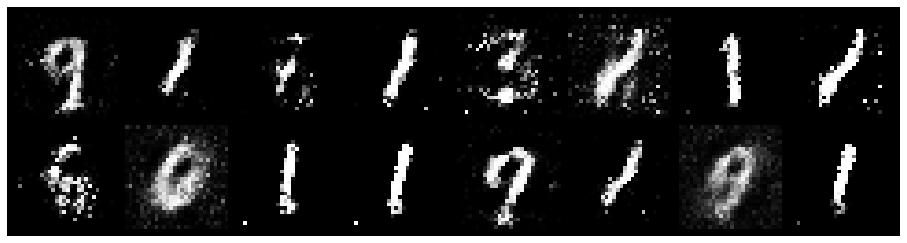

Epoch: [11/20], Batch Num: [100/600]
Discriminator Loss: 0.5956, Generator Loss: 3.5031
D(x): 0.8189, D(G(z)): 0.1317
Epoch: [11/20], Batch Num: [101/600]
Discriminator Loss: 0.6186, Generator Loss: 3.3343
D(x): 0.7489, D(G(z)): 0.0613
Epoch: [11/20], Batch Num: [102/600]
Discriminator Loss: 0.7832, Generator Loss: 2.2201
D(x): 0.7690, D(G(z)): 0.1855
Epoch: [11/20], Batch Num: [103/600]
Discriminator Loss: 0.4288, Generator Loss: 2.1741
D(x): 0.9298, D(G(z)): 0.2087
Epoch: [11/20], Batch Num: [104/600]
Discriminator Loss: 0.5239, Generator Loss: 2.5725
D(x): 0.8909, D(G(z)): 0.2268
Epoch: [11/20], Batch Num: [105/600]
Discriminator Loss: 0.4993, Generator Loss: 2.9009
D(x): 0.8052, D(G(z)): 0.1485
Epoch: [11/20], Batch Num: [106/600]
Discriminator Loss: 0.6142, Generator Loss: 2.8894
D(x): 0.7760, D(G(z)): 0.1563
Epoch: [11/20], Batch Num: [107/600]
Discriminator Loss: 0.4353, Generator Loss: 2.4053
D(x): 0.8581, D(G(z)): 0.1510
Epoch: [11/20], Batch Num: [108/600]
Discriminator Loss:

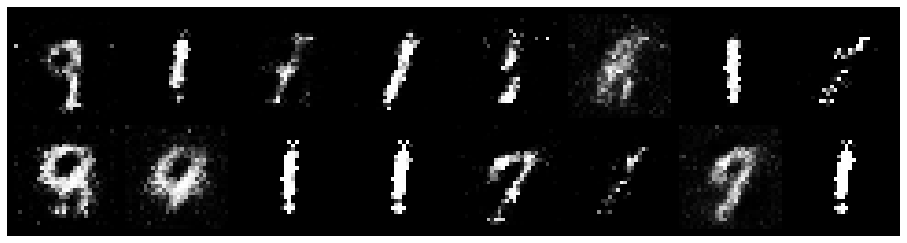

Epoch: [11/20], Batch Num: [200/600]
Discriminator Loss: 0.3939, Generator Loss: 2.8265
D(x): 0.8497, D(G(z)): 0.1009
Epoch: [11/20], Batch Num: [201/600]
Discriminator Loss: 0.5465, Generator Loss: 2.3468
D(x): 0.7818, D(G(z)): 0.1020
Epoch: [11/20], Batch Num: [202/600]
Discriminator Loss: 0.3578, Generator Loss: 2.4662
D(x): 0.9252, D(G(z)): 0.1769
Epoch: [11/20], Batch Num: [203/600]
Discriminator Loss: 0.5194, Generator Loss: 2.6544
D(x): 0.8893, D(G(z)): 0.2019
Epoch: [11/20], Batch Num: [204/600]
Discriminator Loss: 0.4271, Generator Loss: 2.8919
D(x): 0.8695, D(G(z)): 0.1314
Epoch: [11/20], Batch Num: [205/600]
Discriminator Loss: 0.5411, Generator Loss: 2.6674
D(x): 0.8065, D(G(z)): 0.1528
Epoch: [11/20], Batch Num: [206/600]
Discriminator Loss: 0.4339, Generator Loss: 2.5747
D(x): 0.8230, D(G(z)): 0.1047
Epoch: [11/20], Batch Num: [207/600]
Discriminator Loss: 0.4550, Generator Loss: 2.2800
D(x): 0.8436, D(G(z)): 0.1437
Epoch: [11/20], Batch Num: [208/600]
Discriminator Loss:

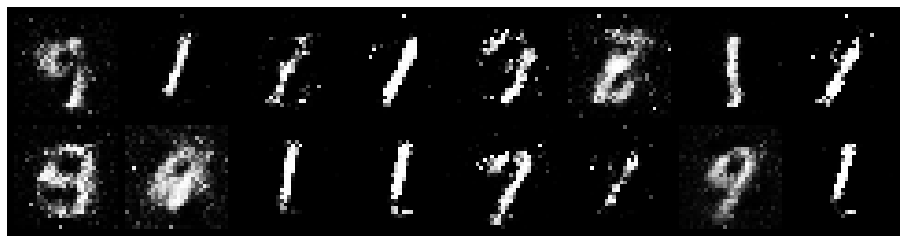

Epoch: [11/20], Batch Num: [300/600]
Discriminator Loss: 0.3995, Generator Loss: 2.4323
D(x): 0.8927, D(G(z)): 0.1737
Epoch: [11/20], Batch Num: [301/600]
Discriminator Loss: 0.6121, Generator Loss: 2.8335
D(x): 0.8397, D(G(z)): 0.2296
Epoch: [11/20], Batch Num: [302/600]
Discriminator Loss: 0.5118, Generator Loss: 3.3118
D(x): 0.8341, D(G(z)): 0.1742
Epoch: [11/20], Batch Num: [303/600]
Discriminator Loss: 0.5437, Generator Loss: 2.6116
D(x): 0.7931, D(G(z)): 0.1224
Epoch: [11/20], Batch Num: [304/600]
Discriminator Loss: 0.3773, Generator Loss: 2.9898
D(x): 0.8719, D(G(z)): 0.1300
Epoch: [11/20], Batch Num: [305/600]
Discriminator Loss: 0.4152, Generator Loss: 2.8062
D(x): 0.9045, D(G(z)): 0.1786
Epoch: [11/20], Batch Num: [306/600]
Discriminator Loss: 0.3943, Generator Loss: 3.0035
D(x): 0.9057, D(G(z)): 0.1557
Epoch: [11/20], Batch Num: [307/600]
Discriminator Loss: 0.6730, Generator Loss: 3.3034
D(x): 0.7666, D(G(z)): 0.1383
Epoch: [11/20], Batch Num: [308/600]
Discriminator Loss:

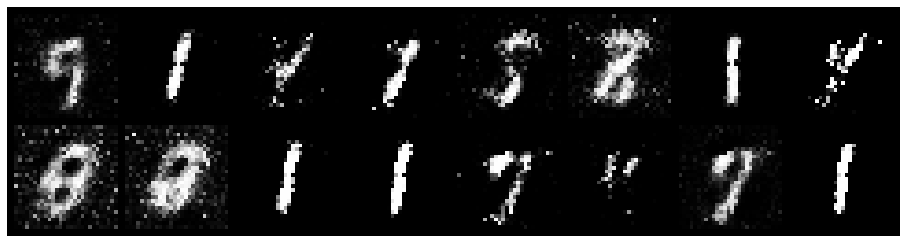

Epoch: [11/20], Batch Num: [400/600]
Discriminator Loss: 0.5843, Generator Loss: 2.6940
D(x): 0.7468, D(G(z)): 0.0895
Epoch: [11/20], Batch Num: [401/600]
Discriminator Loss: 0.5665, Generator Loss: 2.2003
D(x): 0.8318, D(G(z)): 0.1571
Epoch: [11/20], Batch Num: [402/600]
Discriminator Loss: 0.5087, Generator Loss: 2.0213
D(x): 0.8533, D(G(z)): 0.1994
Epoch: [11/20], Batch Num: [403/600]
Discriminator Loss: 0.6708, Generator Loss: 2.6061
D(x): 0.9110, D(G(z)): 0.2982
Epoch: [11/20], Batch Num: [404/600]
Discriminator Loss: 0.6468, Generator Loss: 3.3355
D(x): 0.8004, D(G(z)): 0.1599
Epoch: [11/20], Batch Num: [405/600]
Discriminator Loss: 0.5679, Generator Loss: 3.0273
D(x): 0.8047, D(G(z)): 0.1133
Epoch: [11/20], Batch Num: [406/600]
Discriminator Loss: 0.5723, Generator Loss: 3.1584
D(x): 0.8044, D(G(z)): 0.1082
Epoch: [11/20], Batch Num: [407/600]
Discriminator Loss: 0.4225, Generator Loss: 2.2592
D(x): 0.8164, D(G(z)): 0.0922
Epoch: [11/20], Batch Num: [408/600]
Discriminator Loss:

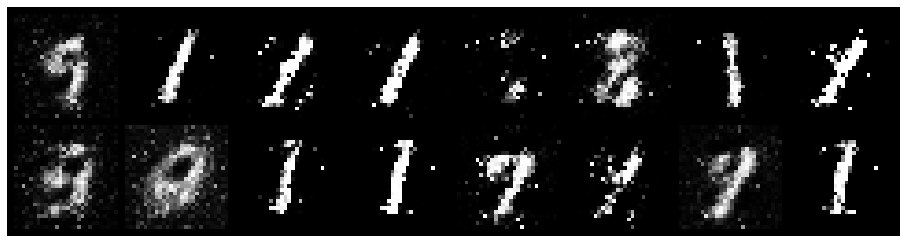

Epoch: [11/20], Batch Num: [500/600]
Discriminator Loss: 0.6439, Generator Loss: 2.9388
D(x): 0.7670, D(G(z)): 0.1201
Epoch: [11/20], Batch Num: [501/600]
Discriminator Loss: 0.6854, Generator Loss: 2.6282
D(x): 0.7922, D(G(z)): 0.1716
Epoch: [11/20], Batch Num: [502/600]
Discriminator Loss: 0.5794, Generator Loss: 1.9663
D(x): 0.8484, D(G(z)): 0.1929
Epoch: [11/20], Batch Num: [503/600]
Discriminator Loss: 0.6553, Generator Loss: 2.2467
D(x): 0.8371, D(G(z)): 0.2266
Epoch: [11/20], Batch Num: [504/600]
Discriminator Loss: 0.4896, Generator Loss: 2.7806
D(x): 0.8456, D(G(z)): 0.1704
Epoch: [11/20], Batch Num: [505/600]
Discriminator Loss: 0.5678, Generator Loss: 2.7947
D(x): 0.8417, D(G(z)): 0.1899
Epoch: [11/20], Batch Num: [506/600]
Discriminator Loss: 0.3875, Generator Loss: 3.1256
D(x): 0.8516, D(G(z)): 0.1237
Epoch: [11/20], Batch Num: [507/600]
Discriminator Loss: 0.5424, Generator Loss: 2.8619
D(x): 0.7907, D(G(z)): 0.1092
Epoch: [11/20], Batch Num: [508/600]
Discriminator Loss:

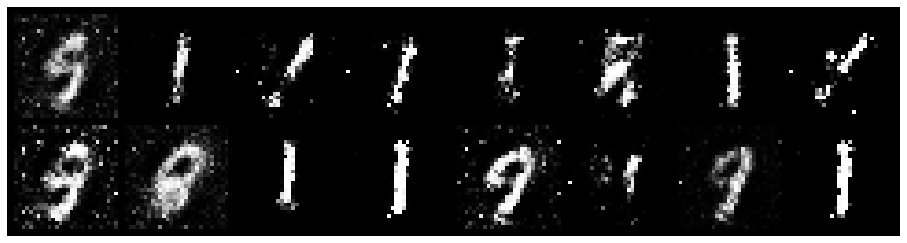

Epoch: [12/20], Batch Num: [0/600]
Discriminator Loss: 0.4302, Generator Loss: 2.1562
D(x): 0.8771, D(G(z)): 0.1420
Epoch: [12/20], Batch Num: [1/600]
Discriminator Loss: 0.5484, Generator Loss: 2.4132
D(x): 0.8746, D(G(z)): 0.2003
Epoch: [12/20], Batch Num: [2/600]
Discriminator Loss: 0.6255, Generator Loss: 2.5167
D(x): 0.8399, D(G(z)): 0.2079
Epoch: [12/20], Batch Num: [3/600]
Discriminator Loss: 0.6188, Generator Loss: 2.7232
D(x): 0.8816, D(G(z)): 0.2169
Epoch: [12/20], Batch Num: [4/600]
Discriminator Loss: 0.6436, Generator Loss: 3.0095
D(x): 0.8169, D(G(z)): 0.1784
Epoch: [12/20], Batch Num: [5/600]
Discriminator Loss: 0.7232, Generator Loss: 3.2854
D(x): 0.8188, D(G(z)): 0.1458
Epoch: [12/20], Batch Num: [6/600]
Discriminator Loss: 0.6731, Generator Loss: 3.0502
D(x): 0.7764, D(G(z)): 0.1335
Epoch: [12/20], Batch Num: [7/600]
Discriminator Loss: 0.8505, Generator Loss: 2.5886
D(x): 0.7467, D(G(z)): 0.1662
Epoch: [12/20], Batch Num: [8/600]
Discriminator Loss: 0.5650, Generator

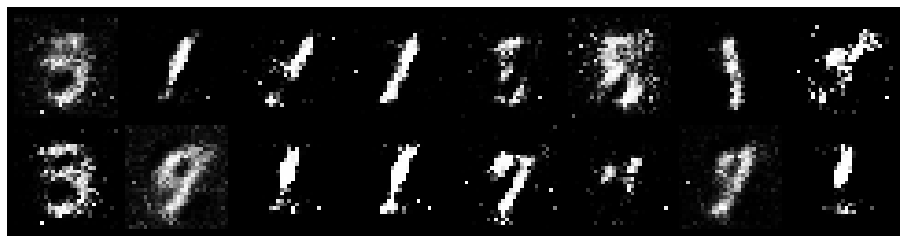

Epoch: [12/20], Batch Num: [100/600]
Discriminator Loss: 0.5416, Generator Loss: 1.9459
D(x): 0.8072, D(G(z)): 0.1531
Epoch: [12/20], Batch Num: [101/600]
Discriminator Loss: 0.5523, Generator Loss: 1.6780
D(x): 0.8789, D(G(z)): 0.2447
Epoch: [12/20], Batch Num: [102/600]
Discriminator Loss: 0.4744, Generator Loss: 1.9944
D(x): 0.8928, D(G(z)): 0.2384
Epoch: [12/20], Batch Num: [103/600]
Discriminator Loss: 0.5385, Generator Loss: 2.3871
D(x): 0.8632, D(G(z)): 0.2477
Epoch: [12/20], Batch Num: [104/600]
Discriminator Loss: 0.3668, Generator Loss: 2.8496
D(x): 0.8808, D(G(z)): 0.1285
Epoch: [12/20], Batch Num: [105/600]
Discriminator Loss: 0.4900, Generator Loss: 3.1071
D(x): 0.8277, D(G(z)): 0.1299
Epoch: [12/20], Batch Num: [106/600]
Discriminator Loss: 0.4690, Generator Loss: 3.2645
D(x): 0.8285, D(G(z)): 0.1147
Epoch: [12/20], Batch Num: [107/600]
Discriminator Loss: 0.6035, Generator Loss: 2.7695
D(x): 0.7738, D(G(z)): 0.1292
Epoch: [12/20], Batch Num: [108/600]
Discriminator Loss:

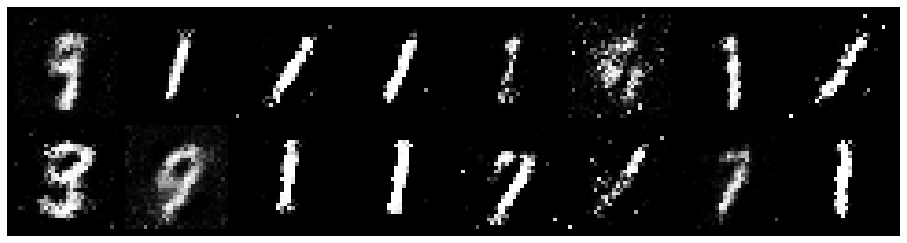

Epoch: [12/20], Batch Num: [200/600]
Discriminator Loss: 0.5028, Generator Loss: 2.0293
D(x): 0.8348, D(G(z)): 0.1793
Epoch: [12/20], Batch Num: [201/600]
Discriminator Loss: 0.6465, Generator Loss: 2.1532
D(x): 0.8525, D(G(z)): 0.2420
Epoch: [12/20], Batch Num: [202/600]
Discriminator Loss: 0.8501, Generator Loss: 2.3776
D(x): 0.8477, D(G(z)): 0.2920
Epoch: [12/20], Batch Num: [203/600]
Discriminator Loss: 0.6106, Generator Loss: 2.7935
D(x): 0.7841, D(G(z)): 0.1392
Epoch: [12/20], Batch Num: [204/600]
Discriminator Loss: 0.5223, Generator Loss: 2.5371
D(x): 0.8251, D(G(z)): 0.1263
Epoch: [12/20], Batch Num: [205/600]
Discriminator Loss: 0.5734, Generator Loss: 2.3727
D(x): 0.7941, D(G(z)): 0.1496
Epoch: [12/20], Batch Num: [206/600]
Discriminator Loss: 0.5125, Generator Loss: 2.4565
D(x): 0.8522, D(G(z)): 0.1633
Epoch: [12/20], Batch Num: [207/600]
Discriminator Loss: 0.4243, Generator Loss: 2.2022
D(x): 0.8687, D(G(z)): 0.1633
Epoch: [12/20], Batch Num: [208/600]
Discriminator Loss:

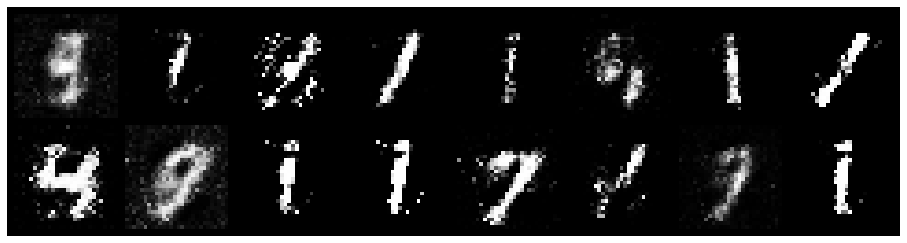

Epoch: [12/20], Batch Num: [300/600]
Discriminator Loss: 0.6422, Generator Loss: 2.6106
D(x): 0.8727, D(G(z)): 0.2772
Epoch: [12/20], Batch Num: [301/600]
Discriminator Loss: 0.5995, Generator Loss: 3.0624
D(x): 0.8183, D(G(z)): 0.1915
Epoch: [12/20], Batch Num: [302/600]
Discriminator Loss: 0.5426, Generator Loss: 3.2063
D(x): 0.7936, D(G(z)): 0.1127
Epoch: [12/20], Batch Num: [303/600]
Discriminator Loss: 0.6785, Generator Loss: 2.7433
D(x): 0.7330, D(G(z)): 0.1048
Epoch: [12/20], Batch Num: [304/600]
Discriminator Loss: 0.7127, Generator Loss: 2.1535
D(x): 0.7739, D(G(z)): 0.1525
Epoch: [12/20], Batch Num: [305/600]
Discriminator Loss: 0.5352, Generator Loss: 1.6882
D(x): 0.8321, D(G(z)): 0.2001
Epoch: [12/20], Batch Num: [306/600]
Discriminator Loss: 0.7548, Generator Loss: 1.5546
D(x): 0.8631, D(G(z)): 0.3095
Epoch: [12/20], Batch Num: [307/600]
Discriminator Loss: 0.5562, Generator Loss: 1.9218
D(x): 0.8870, D(G(z)): 0.2665
Epoch: [12/20], Batch Num: [308/600]
Discriminator Loss:

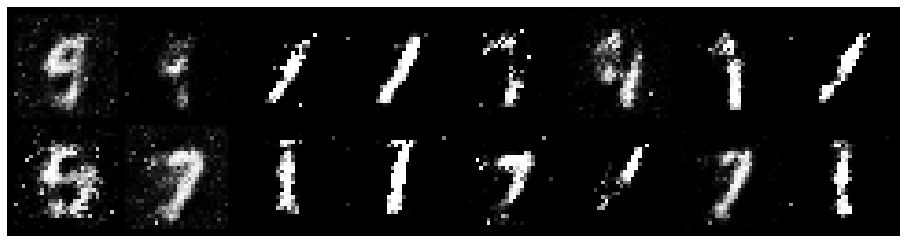

Epoch: [12/20], Batch Num: [400/600]
Discriminator Loss: 0.5514, Generator Loss: 2.4491
D(x): 0.8342, D(G(z)): 0.2297
Epoch: [12/20], Batch Num: [401/600]
Discriminator Loss: 0.6176, Generator Loss: 2.7923
D(x): 0.7943, D(G(z)): 0.1810
Epoch: [12/20], Batch Num: [402/600]
Discriminator Loss: 0.6538, Generator Loss: 3.0704
D(x): 0.7401, D(G(z)): 0.1264
Epoch: [12/20], Batch Num: [403/600]
Discriminator Loss: 0.7512, Generator Loss: 2.3509
D(x): 0.7213, D(G(z)): 0.1350
Epoch: [12/20], Batch Num: [404/600]
Discriminator Loss: 0.5485, Generator Loss: 1.9135
D(x): 0.7924, D(G(z)): 0.1253
Epoch: [12/20], Batch Num: [405/600]
Discriminator Loss: 0.6357, Generator Loss: 1.8669
D(x): 0.8714, D(G(z)): 0.2442
Epoch: [12/20], Batch Num: [406/600]
Discriminator Loss: 0.7991, Generator Loss: 2.3034
D(x): 0.8336, D(G(z)): 0.2877
Epoch: [12/20], Batch Num: [407/600]
Discriminator Loss: 0.6169, Generator Loss: 2.7399
D(x): 0.8608, D(G(z)): 0.2339
Epoch: [12/20], Batch Num: [408/600]
Discriminator Loss:

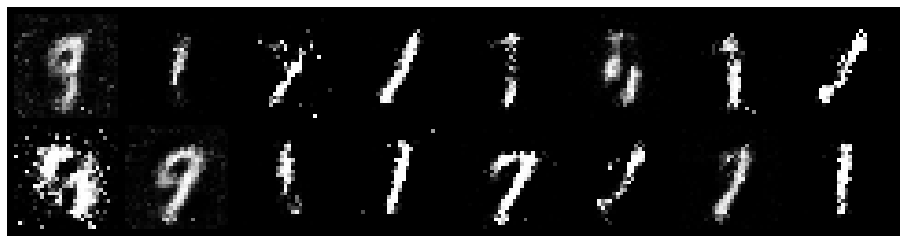

Epoch: [12/20], Batch Num: [500/600]
Discriminator Loss: 0.5712, Generator Loss: 2.2699
D(x): 0.8363, D(G(z)): 0.1836
Epoch: [12/20], Batch Num: [501/600]
Discriminator Loss: 0.5079, Generator Loss: 2.1068
D(x): 0.8264, D(G(z)): 0.1812
Epoch: [12/20], Batch Num: [502/600]
Discriminator Loss: 0.7289, Generator Loss: 2.3056
D(x): 0.8204, D(G(z)): 0.2551
Epoch: [12/20], Batch Num: [503/600]
Discriminator Loss: 0.6767, Generator Loss: 2.4746
D(x): 0.7737, D(G(z)): 0.2307
Epoch: [12/20], Batch Num: [504/600]
Discriminator Loss: 0.6958, Generator Loss: 2.2916
D(x): 0.7755, D(G(z)): 0.1717
Epoch: [12/20], Batch Num: [505/600]
Discriminator Loss: 0.6310, Generator Loss: 2.1828
D(x): 0.7801, D(G(z)): 0.1766
Epoch: [12/20], Batch Num: [506/600]
Discriminator Loss: 0.5980, Generator Loss: 1.9563
D(x): 0.8022, D(G(z)): 0.1781
Epoch: [12/20], Batch Num: [507/600]
Discriminator Loss: 0.6436, Generator Loss: 1.9855
D(x): 0.8480, D(G(z)): 0.2706
Epoch: [12/20], Batch Num: [508/600]
Discriminator Loss:

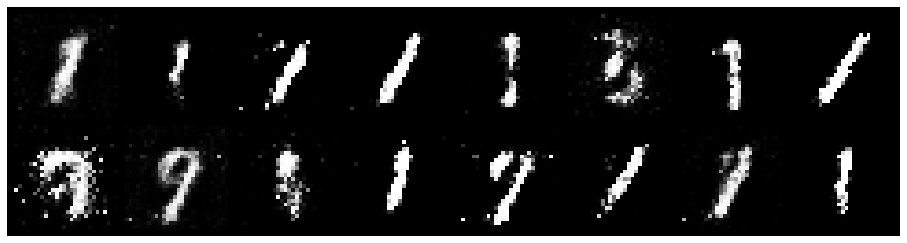

Epoch: [13/20], Batch Num: [0/600]
Discriminator Loss: 0.4899, Generator Loss: 2.4791
D(x): 0.8665, D(G(z)): 0.1806
Epoch: [13/20], Batch Num: [1/600]
Discriminator Loss: 0.4100, Generator Loss: 2.6025
D(x): 0.8774, D(G(z)): 0.1729
Epoch: [13/20], Batch Num: [2/600]
Discriminator Loss: 0.5587, Generator Loss: 2.7043
D(x): 0.8083, D(G(z)): 0.1562
Epoch: [13/20], Batch Num: [3/600]
Discriminator Loss: 0.6290, Generator Loss: 2.7868
D(x): 0.8003, D(G(z)): 0.1474
Epoch: [13/20], Batch Num: [4/600]
Discriminator Loss: 0.5280, Generator Loss: 2.4884
D(x): 0.7950, D(G(z)): 0.1283
Epoch: [13/20], Batch Num: [5/600]
Discriminator Loss: 0.5524, Generator Loss: 2.4835
D(x): 0.8651, D(G(z)): 0.2019
Epoch: [13/20], Batch Num: [6/600]
Discriminator Loss: 0.5697, Generator Loss: 2.4800
D(x): 0.8862, D(G(z)): 0.2223
Epoch: [13/20], Batch Num: [7/600]
Discriminator Loss: 0.5390, Generator Loss: 3.0167
D(x): 0.8299, D(G(z)): 0.1613
Epoch: [13/20], Batch Num: [8/600]
Discriminator Loss: 0.5117, Generator

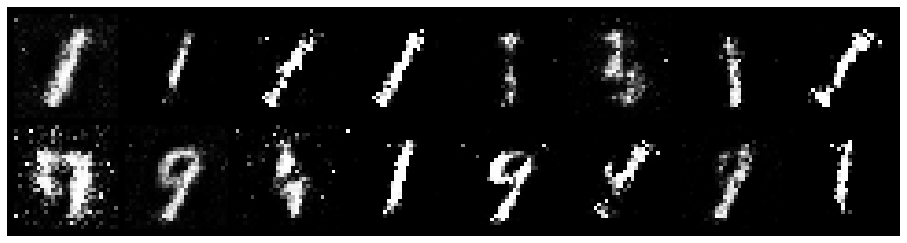

Epoch: [13/20], Batch Num: [100/600]
Discriminator Loss: 0.5703, Generator Loss: 2.4170
D(x): 0.8404, D(G(z)): 0.1879
Epoch: [13/20], Batch Num: [101/600]
Discriminator Loss: 0.4511, Generator Loss: 2.6705
D(x): 0.8906, D(G(z)): 0.1728
Epoch: [13/20], Batch Num: [102/600]
Discriminator Loss: 0.5187, Generator Loss: 2.7713
D(x): 0.8265, D(G(z)): 0.1574
Epoch: [13/20], Batch Num: [103/600]
Discriminator Loss: 0.4353, Generator Loss: 2.6252
D(x): 0.8268, D(G(z)): 0.1236
Epoch: [13/20], Batch Num: [104/600]
Discriminator Loss: 0.7233, Generator Loss: 2.1820
D(x): 0.7570, D(G(z)): 0.1601
Epoch: [13/20], Batch Num: [105/600]
Discriminator Loss: 0.5065, Generator Loss: 2.2235
D(x): 0.8707, D(G(z)): 0.1834
Epoch: [13/20], Batch Num: [106/600]
Discriminator Loss: 0.5377, Generator Loss: 2.2846
D(x): 0.8814, D(G(z)): 0.2203
Epoch: [13/20], Batch Num: [107/600]
Discriminator Loss: 0.5981, Generator Loss: 2.5987
D(x): 0.8111, D(G(z)): 0.1914
Epoch: [13/20], Batch Num: [108/600]
Discriminator Loss:

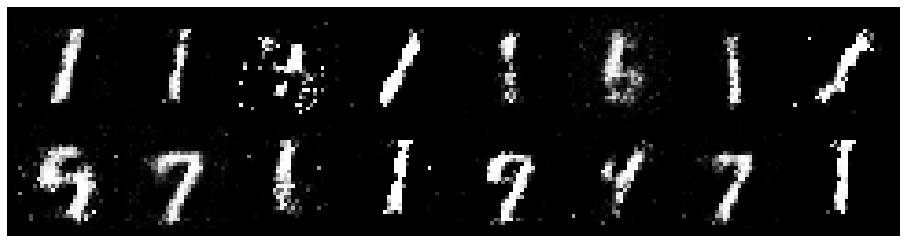

Epoch: [13/20], Batch Num: [200/600]
Discriminator Loss: 0.7456, Generator Loss: 1.9294
D(x): 0.8195, D(G(z)): 0.2781
Epoch: [13/20], Batch Num: [201/600]
Discriminator Loss: 0.7197, Generator Loss: 2.0571
D(x): 0.7940, D(G(z)): 0.2543
Epoch: [13/20], Batch Num: [202/600]
Discriminator Loss: 0.6119, Generator Loss: 2.4734
D(x): 0.7809, D(G(z)): 0.1936
Epoch: [13/20], Batch Num: [203/600]
Discriminator Loss: 0.7258, Generator Loss: 2.3288
D(x): 0.7341, D(G(z)): 0.1825
Epoch: [13/20], Batch Num: [204/600]
Discriminator Loss: 0.7416, Generator Loss: 2.1068
D(x): 0.7534, D(G(z)): 0.2097
Epoch: [13/20], Batch Num: [205/600]
Discriminator Loss: 0.6961, Generator Loss: 1.9263
D(x): 0.7490, D(G(z)): 0.2160
Epoch: [13/20], Batch Num: [206/600]
Discriminator Loss: 0.6339, Generator Loss: 1.8688
D(x): 0.8080, D(G(z)): 0.2469
Epoch: [13/20], Batch Num: [207/600]
Discriminator Loss: 0.6063, Generator Loss: 1.9912
D(x): 0.8175, D(G(z)): 0.2369
Epoch: [13/20], Batch Num: [208/600]
Discriminator Loss:

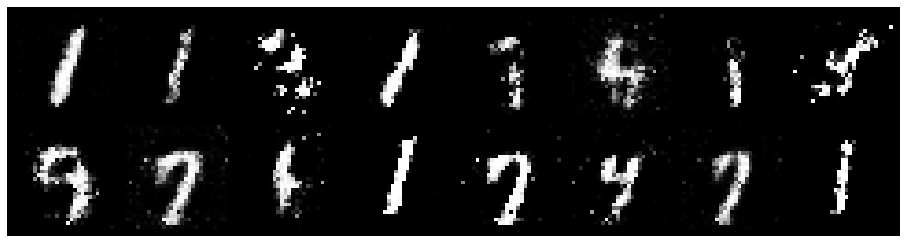

Epoch: [13/20], Batch Num: [300/600]
Discriminator Loss: 0.7098, Generator Loss: 2.0191
D(x): 0.7897, D(G(z)): 0.2324
Epoch: [13/20], Batch Num: [301/600]
Discriminator Loss: 0.6443, Generator Loss: 2.0973
D(x): 0.7860, D(G(z)): 0.2201
Epoch: [13/20], Batch Num: [302/600]
Discriminator Loss: 0.7929, Generator Loss: 2.2322
D(x): 0.7897, D(G(z)): 0.2645
Epoch: [13/20], Batch Num: [303/600]
Discriminator Loss: 0.7626, Generator Loss: 2.4867
D(x): 0.7800, D(G(z)): 0.2165
Epoch: [13/20], Batch Num: [304/600]
Discriminator Loss: 0.7113, Generator Loss: 2.8939
D(x): 0.7463, D(G(z)): 0.1834
Epoch: [13/20], Batch Num: [305/600]
Discriminator Loss: 0.7423, Generator Loss: 1.9699
D(x): 0.6867, D(G(z)): 0.1371
Epoch: [13/20], Batch Num: [306/600]
Discriminator Loss: 0.6770, Generator Loss: 1.8622
D(x): 0.7705, D(G(z)): 0.1860
Epoch: [13/20], Batch Num: [307/600]
Discriminator Loss: 0.6228, Generator Loss: 1.7362
D(x): 0.8246, D(G(z)): 0.2193
Epoch: [13/20], Batch Num: [308/600]
Discriminator Loss:

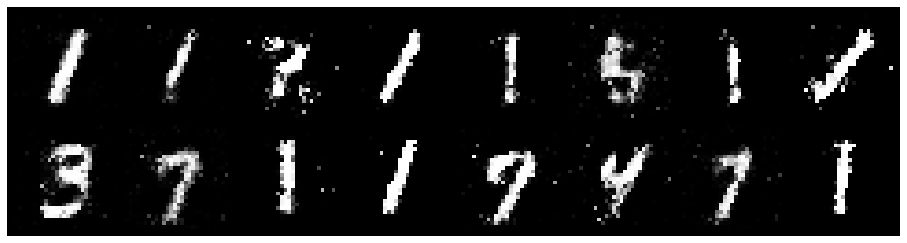

Epoch: [13/20], Batch Num: [400/600]
Discriminator Loss: 0.5978, Generator Loss: 1.4878
D(x): 0.8219, D(G(z)): 0.2061
Epoch: [13/20], Batch Num: [401/600]
Discriminator Loss: 0.6454, Generator Loss: 2.0366
D(x): 0.8741, D(G(z)): 0.2833
Epoch: [13/20], Batch Num: [402/600]
Discriminator Loss: 0.6785, Generator Loss: 2.2263
D(x): 0.8183, D(G(z)): 0.2476
Epoch: [13/20], Batch Num: [403/600]
Discriminator Loss: 0.4860, Generator Loss: 2.6473
D(x): 0.8778, D(G(z)): 0.2021
Epoch: [13/20], Batch Num: [404/600]
Discriminator Loss: 0.5716, Generator Loss: 3.0010
D(x): 0.8081, D(G(z)): 0.1182
Epoch: [13/20], Batch Num: [405/600]
Discriminator Loss: 0.6452, Generator Loss: 2.7796
D(x): 0.7408, D(G(z)): 0.0970
Epoch: [13/20], Batch Num: [406/600]
Discriminator Loss: 0.6930, Generator Loss: 2.3306
D(x): 0.7458, D(G(z)): 0.1060
Epoch: [13/20], Batch Num: [407/600]
Discriminator Loss: 0.5671, Generator Loss: 1.5926
D(x): 0.8085, D(G(z)): 0.1632
Epoch: [13/20], Batch Num: [408/600]
Discriminator Loss:

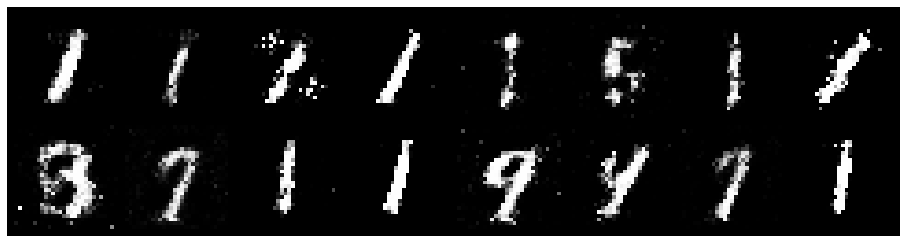

Epoch: [13/20], Batch Num: [500/600]
Discriminator Loss: 0.5850, Generator Loss: 1.8775
D(x): 0.8118, D(G(z)): 0.1905
Epoch: [13/20], Batch Num: [501/600]
Discriminator Loss: 0.7077, Generator Loss: 1.9589
D(x): 0.7989, D(G(z)): 0.2518
Epoch: [13/20], Batch Num: [502/600]
Discriminator Loss: 0.6120, Generator Loss: 2.0870
D(x): 0.8073, D(G(z)): 0.2269
Epoch: [13/20], Batch Num: [503/600]
Discriminator Loss: 0.5954, Generator Loss: 2.1564
D(x): 0.8572, D(G(z)): 0.2475
Epoch: [13/20], Batch Num: [504/600]
Discriminator Loss: 0.6532, Generator Loss: 2.2654
D(x): 0.7750, D(G(z)): 0.1702
Epoch: [13/20], Batch Num: [505/600]
Discriminator Loss: 0.8742, Generator Loss: 2.3437
D(x): 0.7513, D(G(z)): 0.2392
Epoch: [13/20], Batch Num: [506/600]
Discriminator Loss: 0.7698, Generator Loss: 2.2162
D(x): 0.6940, D(G(z)): 0.1578
Epoch: [13/20], Batch Num: [507/600]
Discriminator Loss: 0.6335, Generator Loss: 1.8311
D(x): 0.7833, D(G(z)): 0.1969
Epoch: [13/20], Batch Num: [508/600]
Discriminator Loss:

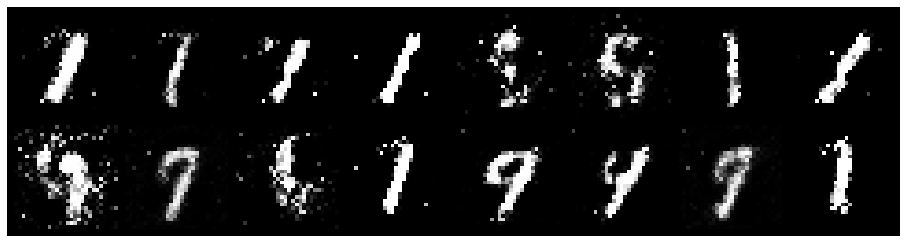

Epoch: [14/20], Batch Num: [0/600]
Discriminator Loss: 0.6927, Generator Loss: 2.0624
D(x): 0.7551, D(G(z)): 0.2137
Epoch: [14/20], Batch Num: [1/600]
Discriminator Loss: 0.5777, Generator Loss: 2.2423
D(x): 0.7837, D(G(z)): 0.1585
Epoch: [14/20], Batch Num: [2/600]
Discriminator Loss: 0.6839, Generator Loss: 2.0237
D(x): 0.7634, D(G(z)): 0.1732
Epoch: [14/20], Batch Num: [3/600]
Discriminator Loss: 0.6819, Generator Loss: 2.0189
D(x): 0.7697, D(G(z)): 0.1825
Epoch: [14/20], Batch Num: [4/600]
Discriminator Loss: 0.6362, Generator Loss: 1.9634
D(x): 0.8060, D(G(z)): 0.2199
Epoch: [14/20], Batch Num: [5/600]
Discriminator Loss: 0.7274, Generator Loss: 1.8910
D(x): 0.7868, D(G(z)): 0.2298
Epoch: [14/20], Batch Num: [6/600]
Discriminator Loss: 0.5991, Generator Loss: 1.9171
D(x): 0.8150, D(G(z)): 0.2224
Epoch: [14/20], Batch Num: [7/600]
Discriminator Loss: 0.5778, Generator Loss: 1.7937
D(x): 0.8025, D(G(z)): 0.2117
Epoch: [14/20], Batch Num: [8/600]
Discriminator Loss: 0.6345, Generator

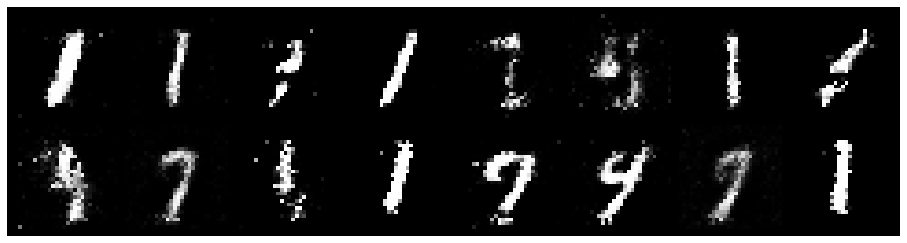

Epoch: [14/20], Batch Num: [100/600]
Discriminator Loss: 0.6410, Generator Loss: 2.2160
D(x): 0.7483, D(G(z)): 0.1626
Epoch: [14/20], Batch Num: [101/600]
Discriminator Loss: 0.7231, Generator Loss: 2.1686
D(x): 0.7213, D(G(z)): 0.1900
Epoch: [14/20], Batch Num: [102/600]
Discriminator Loss: 0.7455, Generator Loss: 1.9637
D(x): 0.7697, D(G(z)): 0.2131
Epoch: [14/20], Batch Num: [103/600]
Discriminator Loss: 0.6879, Generator Loss: 2.0389
D(x): 0.8101, D(G(z)): 0.2475
Epoch: [14/20], Batch Num: [104/600]
Discriminator Loss: 0.8250, Generator Loss: 2.0223
D(x): 0.8076, D(G(z)): 0.3034
Epoch: [14/20], Batch Num: [105/600]
Discriminator Loss: 0.6328, Generator Loss: 2.5264
D(x): 0.7873, D(G(z)): 0.1843
Epoch: [14/20], Batch Num: [106/600]
Discriminator Loss: 0.7060, Generator Loss: 2.0499
D(x): 0.7330, D(G(z)): 0.1613
Epoch: [14/20], Batch Num: [107/600]
Discriminator Loss: 0.7733, Generator Loss: 2.0889
D(x): 0.7765, D(G(z)): 0.2578
Epoch: [14/20], Batch Num: [108/600]
Discriminator Loss:

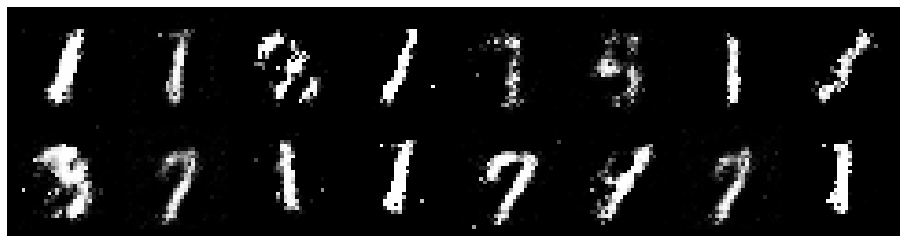

Epoch: [14/20], Batch Num: [200/600]
Discriminator Loss: 0.7758, Generator Loss: 2.1792
D(x): 0.7645, D(G(z)): 0.2251
Epoch: [14/20], Batch Num: [201/600]
Discriminator Loss: 0.6428, Generator Loss: 2.0254
D(x): 0.7450, D(G(z)): 0.1604
Epoch: [14/20], Batch Num: [202/600]
Discriminator Loss: 0.7129, Generator Loss: 1.9597
D(x): 0.7715, D(G(z)): 0.2025
Epoch: [14/20], Batch Num: [203/600]
Discriminator Loss: 0.7556, Generator Loss: 2.0801
D(x): 0.7448, D(G(z)): 0.2204
Epoch: [14/20], Batch Num: [204/600]
Discriminator Loss: 0.6769, Generator Loss: 1.7907
D(x): 0.7702, D(G(z)): 0.2006
Epoch: [14/20], Batch Num: [205/600]
Discriminator Loss: 0.8112, Generator Loss: 1.6654
D(x): 0.7559, D(G(z)): 0.2616
Epoch: [14/20], Batch Num: [206/600]
Discriminator Loss: 0.9573, Generator Loss: 1.6229
D(x): 0.7551, D(G(z)): 0.3147
Epoch: [14/20], Batch Num: [207/600]
Discriminator Loss: 0.6563, Generator Loss: 2.0763
D(x): 0.8441, D(G(z)): 0.2729
Epoch: [14/20], Batch Num: [208/600]
Discriminator Loss:

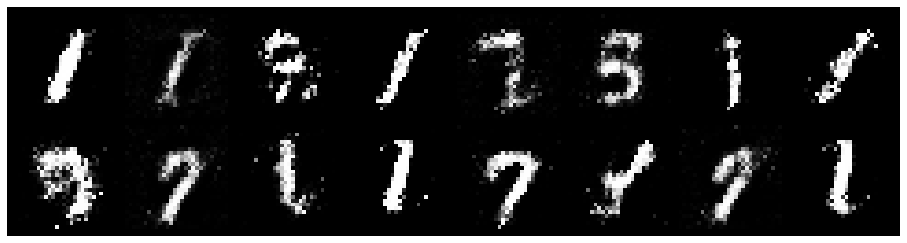

Epoch: [14/20], Batch Num: [300/600]
Discriminator Loss: 0.8275, Generator Loss: 1.9760
D(x): 0.7225, D(G(z)): 0.2197
Epoch: [14/20], Batch Num: [301/600]
Discriminator Loss: 0.8107, Generator Loss: 2.1150
D(x): 0.7075, D(G(z)): 0.2073
Epoch: [14/20], Batch Num: [302/600]
Discriminator Loss: 0.8051, Generator Loss: 1.8613
D(x): 0.7032, D(G(z)): 0.1711
Epoch: [14/20], Batch Num: [303/600]
Discriminator Loss: 0.6742, Generator Loss: 1.8135
D(x): 0.7582, D(G(z)): 0.2192
Epoch: [14/20], Batch Num: [304/600]
Discriminator Loss: 0.8448, Generator Loss: 1.6608
D(x): 0.7577, D(G(z)): 0.2943
Epoch: [14/20], Batch Num: [305/600]
Discriminator Loss: 0.7471, Generator Loss: 1.6253
D(x): 0.8071, D(G(z)): 0.3005
Epoch: [14/20], Batch Num: [306/600]
Discriminator Loss: 0.6308, Generator Loss: 1.7553
D(x): 0.8360, D(G(z)): 0.2660
Epoch: [14/20], Batch Num: [307/600]
Discriminator Loss: 0.6444, Generator Loss: 2.0445
D(x): 0.7958, D(G(z)): 0.2444
Epoch: [14/20], Batch Num: [308/600]
Discriminator Loss:

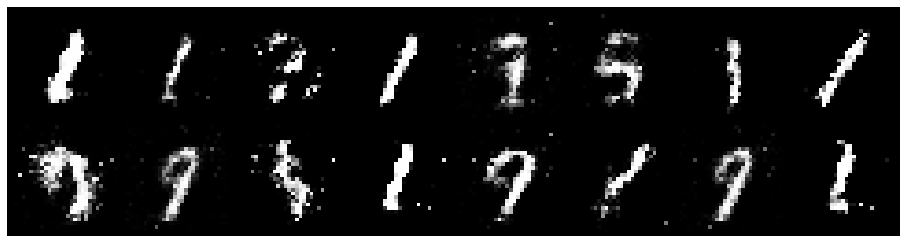

Epoch: [14/20], Batch Num: [400/600]
Discriminator Loss: 0.6083, Generator Loss: 1.9906
D(x): 0.8080, D(G(z)): 0.2128
Epoch: [14/20], Batch Num: [401/600]
Discriminator Loss: 0.5746, Generator Loss: 1.8264
D(x): 0.7881, D(G(z)): 0.1733
Epoch: [14/20], Batch Num: [402/600]
Discriminator Loss: 0.6458, Generator Loss: 1.8748
D(x): 0.8209, D(G(z)): 0.2476
Epoch: [14/20], Batch Num: [403/600]
Discriminator Loss: 0.6371, Generator Loss: 2.0872
D(x): 0.8611, D(G(z)): 0.2752
Epoch: [14/20], Batch Num: [404/600]
Discriminator Loss: 0.5672, Generator Loss: 2.7094
D(x): 0.8265, D(G(z)): 0.1954
Epoch: [14/20], Batch Num: [405/600]
Discriminator Loss: 0.5523, Generator Loss: 2.9571
D(x): 0.8242, D(G(z)): 0.1768
Epoch: [14/20], Batch Num: [406/600]
Discriminator Loss: 0.6662, Generator Loss: 2.8765
D(x): 0.7703, D(G(z)): 0.1577
Epoch: [14/20], Batch Num: [407/600]
Discriminator Loss: 0.6913, Generator Loss: 2.6827
D(x): 0.7450, D(G(z)): 0.1291
Epoch: [14/20], Batch Num: [408/600]
Discriminator Loss:

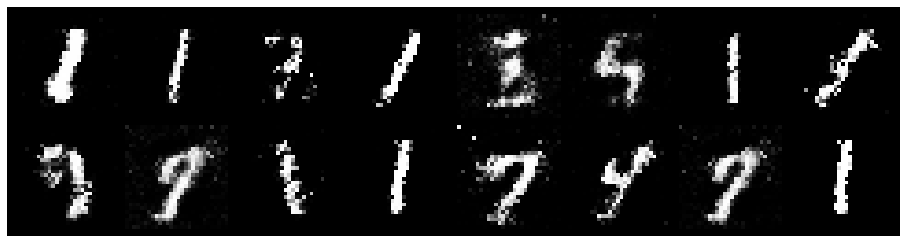

Epoch: [14/20], Batch Num: [500/600]
Discriminator Loss: 0.7349, Generator Loss: 1.7015
D(x): 0.8327, D(G(z)): 0.3154
Epoch: [14/20], Batch Num: [501/600]
Discriminator Loss: 0.6690, Generator Loss: 2.0084
D(x): 0.8356, D(G(z)): 0.2610
Epoch: [14/20], Batch Num: [502/600]
Discriminator Loss: 0.6283, Generator Loss: 2.2212
D(x): 0.8254, D(G(z)): 0.2369
Epoch: [14/20], Batch Num: [503/600]
Discriminator Loss: 0.5790, Generator Loss: 2.2830
D(x): 0.7803, D(G(z)): 0.1565
Epoch: [14/20], Batch Num: [504/600]
Discriminator Loss: 0.6572, Generator Loss: 2.2246
D(x): 0.7427, D(G(z)): 0.1340
Epoch: [14/20], Batch Num: [505/600]
Discriminator Loss: 0.6838, Generator Loss: 2.0858
D(x): 0.7633, D(G(z)): 0.1774
Epoch: [14/20], Batch Num: [506/600]
Discriminator Loss: 0.6926, Generator Loss: 1.8542
D(x): 0.7415, D(G(z)): 0.2004
Epoch: [14/20], Batch Num: [507/600]
Discriminator Loss: 0.6388, Generator Loss: 1.6060
D(x): 0.8371, D(G(z)): 0.2612
Epoch: [14/20], Batch Num: [508/600]
Discriminator Loss:

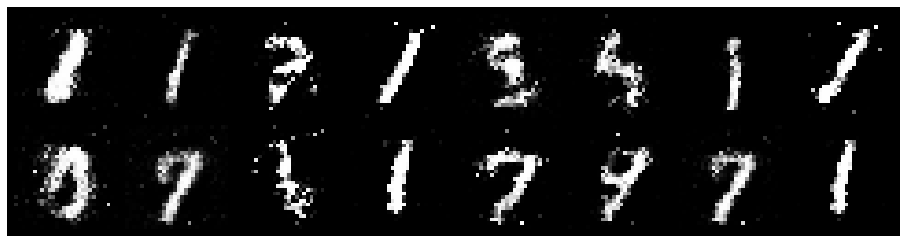

Epoch: [15/20], Batch Num: [0/600]
Discriminator Loss: 0.7187, Generator Loss: 2.3357
D(x): 0.6980, D(G(z)): 0.1226
Epoch: [15/20], Batch Num: [1/600]
Discriminator Loss: 0.7042, Generator Loss: 1.8585
D(x): 0.7479, D(G(z)): 0.1698
Epoch: [15/20], Batch Num: [2/600]
Discriminator Loss: 0.7387, Generator Loss: 1.6548
D(x): 0.7811, D(G(z)): 0.2523
Epoch: [15/20], Batch Num: [3/600]
Discriminator Loss: 0.7197, Generator Loss: 1.7683
D(x): 0.8330, D(G(z)): 0.2889
Epoch: [15/20], Batch Num: [4/600]
Discriminator Loss: 0.6761, Generator Loss: 1.9427
D(x): 0.8372, D(G(z)): 0.2895
Epoch: [15/20], Batch Num: [5/600]
Discriminator Loss: 0.6162, Generator Loss: 2.2099
D(x): 0.7991, D(G(z)): 0.2258
Epoch: [15/20], Batch Num: [6/600]
Discriminator Loss: 0.6699, Generator Loss: 2.1754
D(x): 0.7443, D(G(z)): 0.1752
Epoch: [15/20], Batch Num: [7/600]
Discriminator Loss: 0.8164, Generator Loss: 2.0924
D(x): 0.7135, D(G(z)): 0.1886
Epoch: [15/20], Batch Num: [8/600]
Discriminator Loss: 0.6282, Generator

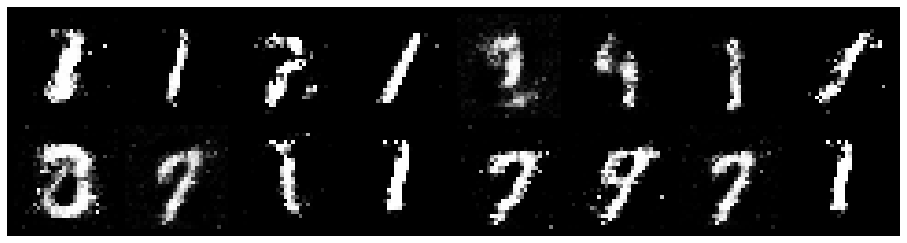

Epoch: [15/20], Batch Num: [100/600]
Discriminator Loss: 0.7410, Generator Loss: 1.8491
D(x): 0.7351, D(G(z)): 0.2158
Epoch: [15/20], Batch Num: [101/600]
Discriminator Loss: 0.6688, Generator Loss: 1.6616
D(x): 0.8065, D(G(z)): 0.2516
Epoch: [15/20], Batch Num: [102/600]
Discriminator Loss: 0.7340, Generator Loss: 1.7735
D(x): 0.7800, D(G(z)): 0.2571
Epoch: [15/20], Batch Num: [103/600]
Discriminator Loss: 0.8665, Generator Loss: 1.7147
D(x): 0.6852, D(G(z)): 0.2401
Epoch: [15/20], Batch Num: [104/600]
Discriminator Loss: 0.5943, Generator Loss: 1.6893
D(x): 0.8065, D(G(z)): 0.2430
Epoch: [15/20], Batch Num: [105/600]
Discriminator Loss: 0.7001, Generator Loss: 1.6775
D(x): 0.7980, D(G(z)): 0.2482
Epoch: [15/20], Batch Num: [106/600]
Discriminator Loss: 0.6163, Generator Loss: 1.8575
D(x): 0.8143, D(G(z)): 0.2369
Epoch: [15/20], Batch Num: [107/600]
Discriminator Loss: 0.7875, Generator Loss: 1.9015
D(x): 0.7469, D(G(z)): 0.2641
Epoch: [15/20], Batch Num: [108/600]
Discriminator Loss:

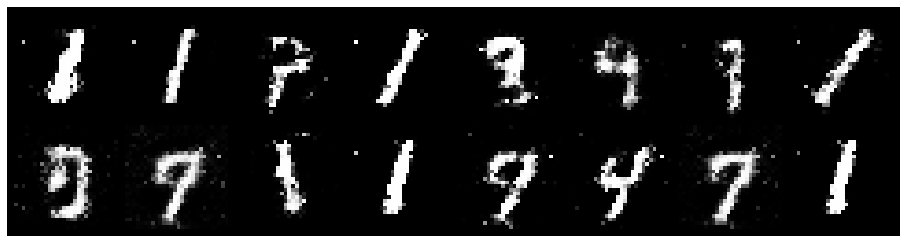

Epoch: [15/20], Batch Num: [200/600]
Discriminator Loss: 0.6744, Generator Loss: 1.8880
D(x): 0.8042, D(G(z)): 0.2400
Epoch: [15/20], Batch Num: [201/600]
Discriminator Loss: 0.8593, Generator Loss: 2.0259
D(x): 0.7158, D(G(z)): 0.2586
Epoch: [15/20], Batch Num: [202/600]
Discriminator Loss: 0.8794, Generator Loss: 1.9455
D(x): 0.6592, D(G(z)): 0.2163
Epoch: [15/20], Batch Num: [203/600]
Discriminator Loss: 0.6204, Generator Loss: 1.7693
D(x): 0.8001, D(G(z)): 0.2200
Epoch: [15/20], Batch Num: [204/600]
Discriminator Loss: 0.6477, Generator Loss: 1.8389
D(x): 0.7931, D(G(z)): 0.2254
Epoch: [15/20], Batch Num: [205/600]
Discriminator Loss: 0.5505, Generator Loss: 1.5096
D(x): 0.8236, D(G(z)): 0.1968
Epoch: [15/20], Batch Num: [206/600]
Discriminator Loss: 0.7744, Generator Loss: 1.9172
D(x): 0.8097, D(G(z)): 0.2951
Epoch: [15/20], Batch Num: [207/600]
Discriminator Loss: 0.7032, Generator Loss: 1.6869
D(x): 0.7737, D(G(z)): 0.2232
Epoch: [15/20], Batch Num: [208/600]
Discriminator Loss:

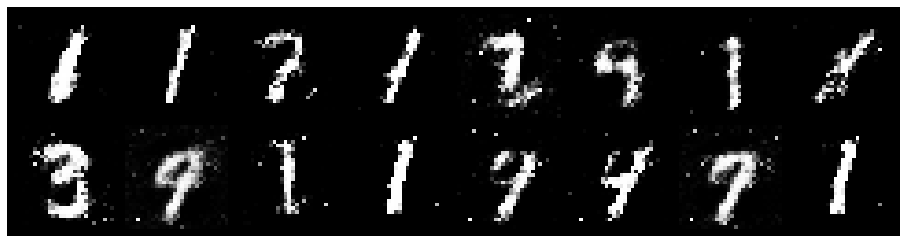

Epoch: [15/20], Batch Num: [300/600]
Discriminator Loss: 0.7004, Generator Loss: 2.4902
D(x): 0.7777, D(G(z)): 0.2360
Epoch: [15/20], Batch Num: [301/600]
Discriminator Loss: 0.7799, Generator Loss: 2.5374
D(x): 0.6888, D(G(z)): 0.1680
Epoch: [15/20], Batch Num: [302/600]
Discriminator Loss: 0.8363, Generator Loss: 2.0954
D(x): 0.6349, D(G(z)): 0.1128
Epoch: [15/20], Batch Num: [303/600]
Discriminator Loss: 0.7399, Generator Loss: 1.6259
D(x): 0.6786, D(G(z)): 0.1441
Epoch: [15/20], Batch Num: [304/600]
Discriminator Loss: 0.6885, Generator Loss: 1.3204
D(x): 0.8087, D(G(z)): 0.2720
Epoch: [15/20], Batch Num: [305/600]
Discriminator Loss: 0.8423, Generator Loss: 1.3119
D(x): 0.8295, D(G(z)): 0.3702
Epoch: [15/20], Batch Num: [306/600]
Discriminator Loss: 0.7448, Generator Loss: 1.4077
D(x): 0.8413, D(G(z)): 0.3303
Epoch: [15/20], Batch Num: [307/600]
Discriminator Loss: 0.7417, Generator Loss: 1.9613
D(x): 0.8473, D(G(z)): 0.3253
Epoch: [15/20], Batch Num: [308/600]
Discriminator Loss:

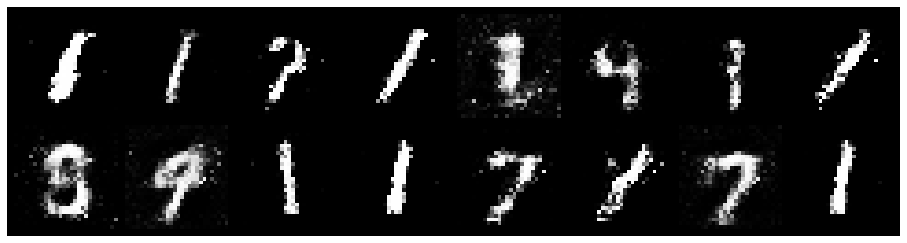

Epoch: [15/20], Batch Num: [400/600]
Discriminator Loss: 0.7011, Generator Loss: 2.0899
D(x): 0.7616, D(G(z)): 0.1833
Epoch: [15/20], Batch Num: [401/600]
Discriminator Loss: 0.6263, Generator Loss: 1.5757
D(x): 0.7642, D(G(z)): 0.1815
Epoch: [15/20], Batch Num: [402/600]
Discriminator Loss: 0.8570, Generator Loss: 1.6049
D(x): 0.7962, D(G(z)): 0.3297
Epoch: [15/20], Batch Num: [403/600]
Discriminator Loss: 0.8390, Generator Loss: 1.6758
D(x): 0.8075, D(G(z)): 0.3463
Epoch: [15/20], Batch Num: [404/600]
Discriminator Loss: 0.7731, Generator Loss: 2.2851
D(x): 0.8211, D(G(z)): 0.3117
Epoch: [15/20], Batch Num: [405/600]
Discriminator Loss: 0.7400, Generator Loss: 2.4121
D(x): 0.7363, D(G(z)): 0.1671
Epoch: [15/20], Batch Num: [406/600]
Discriminator Loss: 0.8518, Generator Loss: 2.1518
D(x): 0.6403, D(G(z)): 0.1267
Epoch: [15/20], Batch Num: [407/600]
Discriminator Loss: 0.7728, Generator Loss: 1.7892
D(x): 0.6847, D(G(z)): 0.1395
Epoch: [15/20], Batch Num: [408/600]
Discriminator Loss:

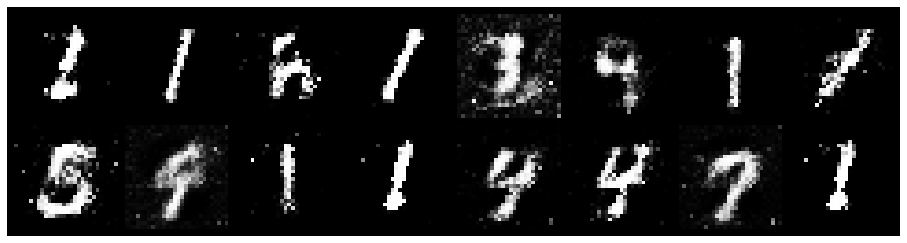

Epoch: [15/20], Batch Num: [500/600]
Discriminator Loss: 0.5763, Generator Loss: 1.6446
D(x): 0.8456, D(G(z)): 0.2441
Epoch: [15/20], Batch Num: [501/600]
Discriminator Loss: 0.6298, Generator Loss: 1.7868
D(x): 0.8361, D(G(z)): 0.2671
Epoch: [15/20], Batch Num: [502/600]
Discriminator Loss: 0.6349, Generator Loss: 1.8337
D(x): 0.7924, D(G(z)): 0.2180
Epoch: [15/20], Batch Num: [503/600]
Discriminator Loss: 0.7189, Generator Loss: 1.8841
D(x): 0.7760, D(G(z)): 0.2382
Epoch: [15/20], Batch Num: [504/600]
Discriminator Loss: 0.6873, Generator Loss: 1.7133
D(x): 0.7519, D(G(z)): 0.2054
Epoch: [15/20], Batch Num: [505/600]
Discriminator Loss: 0.5528, Generator Loss: 1.8994
D(x): 0.7904, D(G(z)): 0.1741
Epoch: [15/20], Batch Num: [506/600]
Discriminator Loss: 0.6015, Generator Loss: 1.9608
D(x): 0.7925, D(G(z)): 0.2072
Epoch: [15/20], Batch Num: [507/600]
Discriminator Loss: 0.7676, Generator Loss: 1.7913
D(x): 0.7828, D(G(z)): 0.2609
Epoch: [15/20], Batch Num: [508/600]
Discriminator Loss:

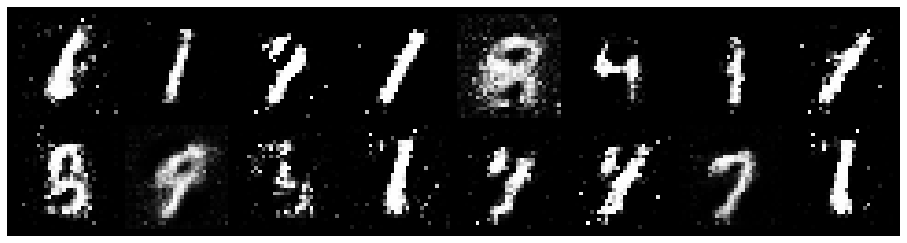

Epoch: [16/20], Batch Num: [0/600]
Discriminator Loss: 0.6774, Generator Loss: 1.7286
D(x): 0.7871, D(G(z)): 0.2548
Epoch: [16/20], Batch Num: [1/600]
Discriminator Loss: 0.7168, Generator Loss: 1.9106
D(x): 0.7492, D(G(z)): 0.2300
Epoch: [16/20], Batch Num: [2/600]
Discriminator Loss: 0.8187, Generator Loss: 2.0155
D(x): 0.7521, D(G(z)): 0.2438
Epoch: [16/20], Batch Num: [3/600]
Discriminator Loss: 0.7429, Generator Loss: 1.8167
D(x): 0.7239, D(G(z)): 0.2295
Epoch: [16/20], Batch Num: [4/600]
Discriminator Loss: 0.7307, Generator Loss: 1.7714
D(x): 0.7495, D(G(z)): 0.2288
Epoch: [16/20], Batch Num: [5/600]
Discriminator Loss: 0.7570, Generator Loss: 1.8821
D(x): 0.7690, D(G(z)): 0.2585
Epoch: [16/20], Batch Num: [6/600]
Discriminator Loss: 0.7036, Generator Loss: 1.9149
D(x): 0.7885, D(G(z)): 0.2548
Epoch: [16/20], Batch Num: [7/600]
Discriminator Loss: 0.7809, Generator Loss: 2.0611
D(x): 0.7745, D(G(z)): 0.2377
Epoch: [16/20], Batch Num: [8/600]
Discriminator Loss: 0.7011, Generator

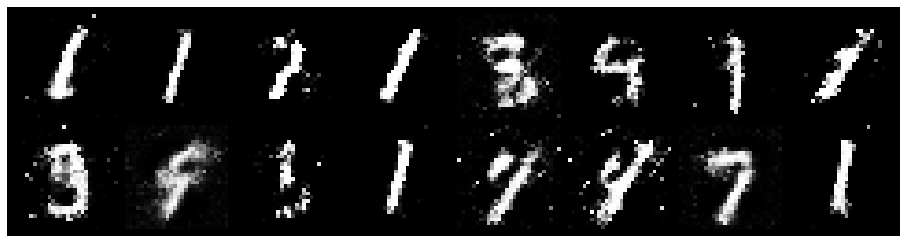

Epoch: [16/20], Batch Num: [100/600]
Discriminator Loss: 0.8262, Generator Loss: 1.8288
D(x): 0.7098, D(G(z)): 0.2154
Epoch: [16/20], Batch Num: [101/600]
Discriminator Loss: 0.7904, Generator Loss: 1.7699
D(x): 0.7646, D(G(z)): 0.2495
Epoch: [16/20], Batch Num: [102/600]
Discriminator Loss: 0.8167, Generator Loss: 1.5600
D(x): 0.7452, D(G(z)): 0.2563
Epoch: [16/20], Batch Num: [103/600]
Discriminator Loss: 0.7941, Generator Loss: 1.5192
D(x): 0.7551, D(G(z)): 0.2931
Epoch: [16/20], Batch Num: [104/600]
Discriminator Loss: 0.7426, Generator Loss: 1.5934
D(x): 0.7747, D(G(z)): 0.2875
Epoch: [16/20], Batch Num: [105/600]
Discriminator Loss: 0.7816, Generator Loss: 1.6145
D(x): 0.7505, D(G(z)): 0.2889
Epoch: [16/20], Batch Num: [106/600]
Discriminator Loss: 0.8469, Generator Loss: 1.9157
D(x): 0.7803, D(G(z)): 0.3131
Epoch: [16/20], Batch Num: [107/600]
Discriminator Loss: 0.8428, Generator Loss: 2.1578
D(x): 0.7504, D(G(z)): 0.2620
Epoch: [16/20], Batch Num: [108/600]
Discriminator Loss:

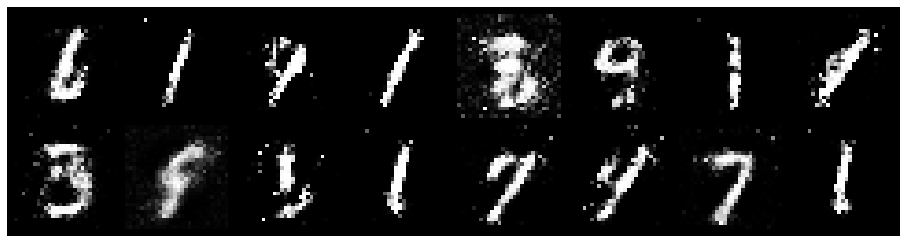

Epoch: [16/20], Batch Num: [200/600]
Discriminator Loss: 0.6935, Generator Loss: 2.4760
D(x): 0.7508, D(G(z)): 0.1911
Epoch: [16/20], Batch Num: [201/600]
Discriminator Loss: 0.9312, Generator Loss: 2.3713
D(x): 0.6415, D(G(z)): 0.1324
Epoch: [16/20], Batch Num: [202/600]
Discriminator Loss: 0.7505, Generator Loss: 2.0513
D(x): 0.7249, D(G(z)): 0.1828
Epoch: [16/20], Batch Num: [203/600]
Discriminator Loss: 0.8335, Generator Loss: 1.6516
D(x): 0.7029, D(G(z)): 0.1859
Epoch: [16/20], Batch Num: [204/600]
Discriminator Loss: 0.7095, Generator Loss: 1.4210
D(x): 0.8311, D(G(z)): 0.2876
Epoch: [16/20], Batch Num: [205/600]
Discriminator Loss: 0.7583, Generator Loss: 1.6694
D(x): 0.8221, D(G(z)): 0.3215
Epoch: [16/20], Batch Num: [206/600]
Discriminator Loss: 0.6922, Generator Loss: 1.8481
D(x): 0.8060, D(G(z)): 0.2854
Epoch: [16/20], Batch Num: [207/600]
Discriminator Loss: 0.7799, Generator Loss: 2.0306
D(x): 0.7729, D(G(z)): 0.2629
Epoch: [16/20], Batch Num: [208/600]
Discriminator Loss:

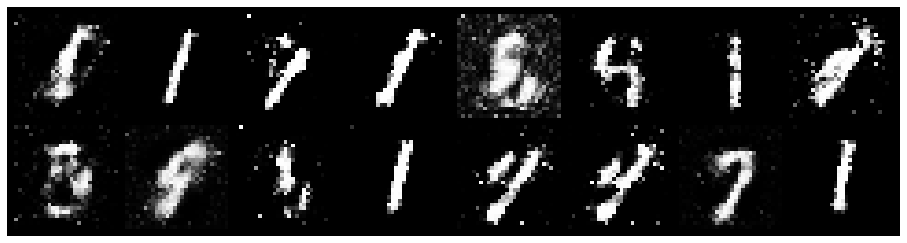

Epoch: [16/20], Batch Num: [300/600]
Discriminator Loss: 0.6529, Generator Loss: 1.4319
D(x): 0.8383, D(G(z)): 0.2908
Epoch: [16/20], Batch Num: [301/600]
Discriminator Loss: 0.6849, Generator Loss: 1.9348
D(x): 0.8432, D(G(z)): 0.3006
Epoch: [16/20], Batch Num: [302/600]
Discriminator Loss: 0.6467, Generator Loss: 2.1183
D(x): 0.8168, D(G(z)): 0.2682
Epoch: [16/20], Batch Num: [303/600]
Discriminator Loss: 0.8414, Generator Loss: 2.4008
D(x): 0.7279, D(G(z)): 0.2270
Epoch: [16/20], Batch Num: [304/600]
Discriminator Loss: 0.8111, Generator Loss: 2.2994
D(x): 0.7114, D(G(z)): 0.1613
Epoch: [16/20], Batch Num: [305/600]
Discriminator Loss: 0.6937, Generator Loss: 2.0457
D(x): 0.7288, D(G(z)): 0.1557
Epoch: [16/20], Batch Num: [306/600]
Discriminator Loss: 0.7161, Generator Loss: 1.6001
D(x): 0.7476, D(G(z)): 0.2119
Epoch: [16/20], Batch Num: [307/600]
Discriminator Loss: 0.8270, Generator Loss: 1.5469
D(x): 0.7931, D(G(z)): 0.3139
Epoch: [16/20], Batch Num: [308/600]
Discriminator Loss:

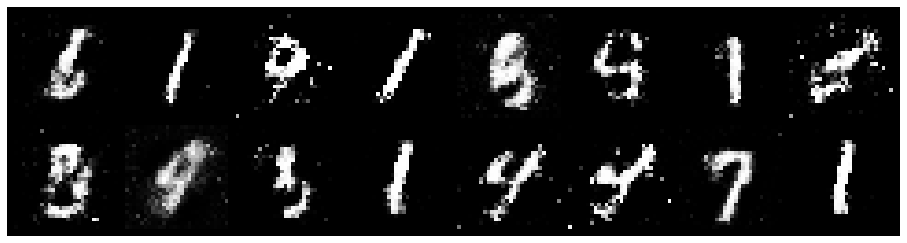

Epoch: [16/20], Batch Num: [400/600]
Discriminator Loss: 0.9169, Generator Loss: 1.9162
D(x): 0.6646, D(G(z)): 0.2331
Epoch: [16/20], Batch Num: [401/600]
Discriminator Loss: 0.6695, Generator Loss: 1.6295
D(x): 0.7469, D(G(z)): 0.2038
Epoch: [16/20], Batch Num: [402/600]
Discriminator Loss: 0.8106, Generator Loss: 1.5015
D(x): 0.7218, D(G(z)): 0.2705
Epoch: [16/20], Batch Num: [403/600]
Discriminator Loss: 0.7243, Generator Loss: 1.6836
D(x): 0.7814, D(G(z)): 0.2666
Epoch: [16/20], Batch Num: [404/600]
Discriminator Loss: 0.8046, Generator Loss: 1.5650
D(x): 0.7357, D(G(z)): 0.2886
Epoch: [16/20], Batch Num: [405/600]
Discriminator Loss: 0.7076, Generator Loss: 1.7168
D(x): 0.8140, D(G(z)): 0.2995
Epoch: [16/20], Batch Num: [406/600]
Discriminator Loss: 0.8274, Generator Loss: 1.9010
D(x): 0.7662, D(G(z)): 0.3141
Epoch: [16/20], Batch Num: [407/600]
Discriminator Loss: 0.8137, Generator Loss: 2.0905
D(x): 0.7132, D(G(z)): 0.2342
Epoch: [16/20], Batch Num: [408/600]
Discriminator Loss:

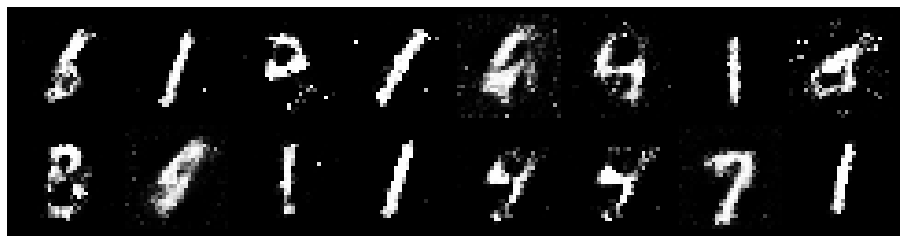

Epoch: [16/20], Batch Num: [500/600]
Discriminator Loss: 0.7398, Generator Loss: 1.6889
D(x): 0.7896, D(G(z)): 0.2717
Epoch: [16/20], Batch Num: [501/600]
Discriminator Loss: 0.7826, Generator Loss: 1.9257
D(x): 0.7419, D(G(z)): 0.2493
Epoch: [16/20], Batch Num: [502/600]
Discriminator Loss: 0.7473, Generator Loss: 2.0345
D(x): 0.7114, D(G(z)): 0.1898
Epoch: [16/20], Batch Num: [503/600]
Discriminator Loss: 0.8524, Generator Loss: 1.7279
D(x): 0.6918, D(G(z)): 0.1979
Epoch: [16/20], Batch Num: [504/600]
Discriminator Loss: 0.7127, Generator Loss: 1.6780
D(x): 0.7504, D(G(z)): 0.2164
Epoch: [16/20], Batch Num: [505/600]
Discriminator Loss: 0.7217, Generator Loss: 1.6003
D(x): 0.7845, D(G(z)): 0.2582
Epoch: [16/20], Batch Num: [506/600]
Discriminator Loss: 0.7138, Generator Loss: 1.6813
D(x): 0.7806, D(G(z)): 0.2530
Epoch: [16/20], Batch Num: [507/600]
Discriminator Loss: 0.6002, Generator Loss: 1.7913
D(x): 0.8089, D(G(z)): 0.2173
Epoch: [16/20], Batch Num: [508/600]
Discriminator Loss:

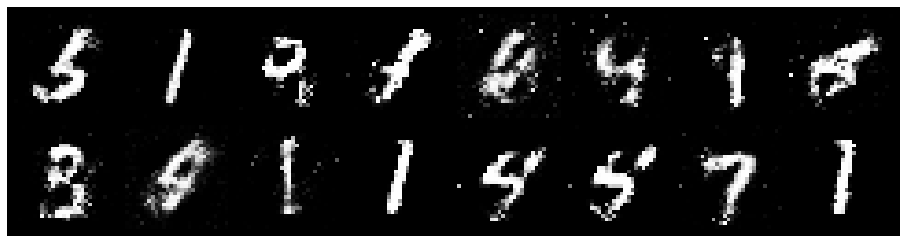

Epoch: [17/20], Batch Num: [0/600]
Discriminator Loss: 0.7036, Generator Loss: 1.8399
D(x): 0.7116, D(G(z)): 0.1926
Epoch: [17/20], Batch Num: [1/600]
Discriminator Loss: 0.8285, Generator Loss: 1.7117
D(x): 0.7191, D(G(z)): 0.2519
Epoch: [17/20], Batch Num: [2/600]
Discriminator Loss: 0.8055, Generator Loss: 1.4464
D(x): 0.7440, D(G(z)): 0.2746
Epoch: [17/20], Batch Num: [3/600]
Discriminator Loss: 0.8730, Generator Loss: 1.7080
D(x): 0.7804, D(G(z)): 0.3421
Epoch: [17/20], Batch Num: [4/600]
Discriminator Loss: 0.8428, Generator Loss: 1.8920
D(x): 0.7708, D(G(z)): 0.3227
Epoch: [17/20], Batch Num: [5/600]
Discriminator Loss: 0.6259, Generator Loss: 2.2427
D(x): 0.7865, D(G(z)): 0.2486
Epoch: [17/20], Batch Num: [6/600]
Discriminator Loss: 0.8360, Generator Loss: 2.2845
D(x): 0.6538, D(G(z)): 0.1941
Epoch: [17/20], Batch Num: [7/600]
Discriminator Loss: 0.7589, Generator Loss: 1.8700
D(x): 0.7093, D(G(z)): 0.1950
Epoch: [17/20], Batch Num: [8/600]
Discriminator Loss: 0.9268, Generator

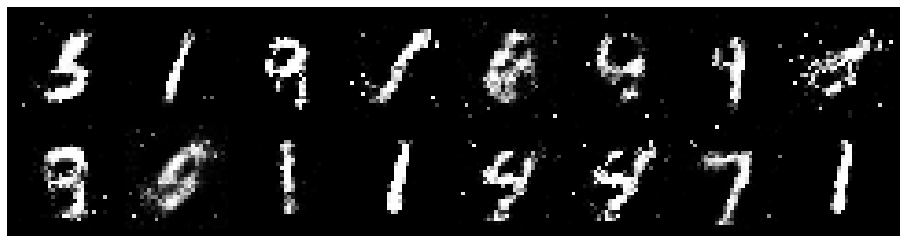

Epoch: [17/20], Batch Num: [100/600]
Discriminator Loss: 0.7837, Generator Loss: 1.5241
D(x): 0.6952, D(G(z)): 0.2026
Epoch: [17/20], Batch Num: [101/600]
Discriminator Loss: 0.7825, Generator Loss: 1.3743
D(x): 0.7622, D(G(z)): 0.2802
Epoch: [17/20], Batch Num: [102/600]
Discriminator Loss: 0.8162, Generator Loss: 1.4109
D(x): 0.8102, D(G(z)): 0.3411
Epoch: [17/20], Batch Num: [103/600]
Discriminator Loss: 0.9178, Generator Loss: 1.6197
D(x): 0.8074, D(G(z)): 0.3460
Epoch: [17/20], Batch Num: [104/600]
Discriminator Loss: 0.7791, Generator Loss: 1.7746
D(x): 0.7758, D(G(z)): 0.3021
Epoch: [17/20], Batch Num: [105/600]
Discriminator Loss: 0.8526, Generator Loss: 1.9023
D(x): 0.6681, D(G(z)): 0.2220
Epoch: [17/20], Batch Num: [106/600]
Discriminator Loss: 0.6609, Generator Loss: 1.8176
D(x): 0.7598, D(G(z)): 0.2085
Epoch: [17/20], Batch Num: [107/600]
Discriminator Loss: 0.6387, Generator Loss: 1.7010
D(x): 0.7358, D(G(z)): 0.1658
Epoch: [17/20], Batch Num: [108/600]
Discriminator Loss:

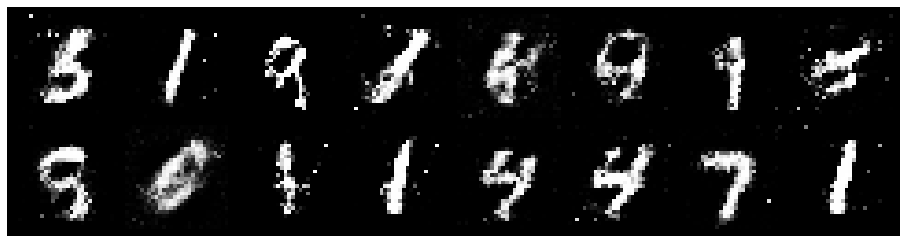

Epoch: [17/20], Batch Num: [200/600]
Discriminator Loss: 0.8582, Generator Loss: 1.6116
D(x): 0.7119, D(G(z)): 0.2634
Epoch: [17/20], Batch Num: [201/600]
Discriminator Loss: 0.7335, Generator Loss: 1.7685
D(x): 0.7613, D(G(z)): 0.2781
Epoch: [17/20], Batch Num: [202/600]
Discriminator Loss: 0.8080, Generator Loss: 1.6245
D(x): 0.7419, D(G(z)): 0.2945
Epoch: [17/20], Batch Num: [203/600]
Discriminator Loss: 0.8040, Generator Loss: 1.5816
D(x): 0.7090, D(G(z)): 0.2651
Epoch: [17/20], Batch Num: [204/600]
Discriminator Loss: 0.9367, Generator Loss: 1.5737
D(x): 0.6656, D(G(z)): 0.2750
Epoch: [17/20], Batch Num: [205/600]
Discriminator Loss: 0.7970, Generator Loss: 1.4187
D(x): 0.7731, D(G(z)): 0.3004
Epoch: [17/20], Batch Num: [206/600]
Discriminator Loss: 0.8752, Generator Loss: 1.8160
D(x): 0.7511, D(G(z)): 0.3018
Epoch: [17/20], Batch Num: [207/600]
Discriminator Loss: 0.8539, Generator Loss: 1.7496
D(x): 0.7341, D(G(z)): 0.3089
Epoch: [17/20], Batch Num: [208/600]
Discriminator Loss:

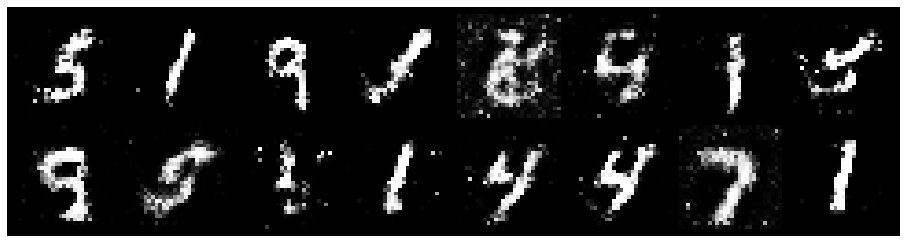

Epoch: [17/20], Batch Num: [300/600]
Discriminator Loss: 0.7801, Generator Loss: 1.8388
D(x): 0.7254, D(G(z)): 0.2419
Epoch: [17/20], Batch Num: [301/600]
Discriminator Loss: 0.9453, Generator Loss: 2.0215
D(x): 0.7054, D(G(z)): 0.2788
Epoch: [17/20], Batch Num: [302/600]
Discriminator Loss: 0.7322, Generator Loss: 1.8254
D(x): 0.7203, D(G(z)): 0.2202
Epoch: [17/20], Batch Num: [303/600]
Discriminator Loss: 0.7095, Generator Loss: 1.8992
D(x): 0.7417, D(G(z)): 0.2119
Epoch: [17/20], Batch Num: [304/600]
Discriminator Loss: 0.8961, Generator Loss: 1.4737
D(x): 0.6826, D(G(z)): 0.2635
Epoch: [17/20], Batch Num: [305/600]
Discriminator Loss: 0.7466, Generator Loss: 1.5658
D(x): 0.7832, D(G(z)): 0.2952
Epoch: [17/20], Batch Num: [306/600]
Discriminator Loss: 1.0062, Generator Loss: 1.6557
D(x): 0.7512, D(G(z)): 0.3198
Epoch: [17/20], Batch Num: [307/600]
Discriminator Loss: 0.7695, Generator Loss: 1.7884
D(x): 0.7800, D(G(z)): 0.2778
Epoch: [17/20], Batch Num: [308/600]
Discriminator Loss:

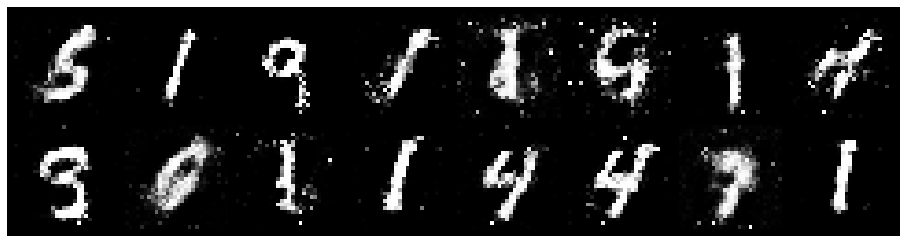

Epoch: [17/20], Batch Num: [400/600]
Discriminator Loss: 0.8209, Generator Loss: 1.7791
D(x): 0.7493, D(G(z)): 0.2655
Epoch: [17/20], Batch Num: [401/600]
Discriminator Loss: 0.9440, Generator Loss: 1.6245
D(x): 0.7262, D(G(z)): 0.2861
Epoch: [17/20], Batch Num: [402/600]
Discriminator Loss: 0.7353, Generator Loss: 1.4755
D(x): 0.7746, D(G(z)): 0.2754
Epoch: [17/20], Batch Num: [403/600]
Discriminator Loss: 0.8091, Generator Loss: 1.6778
D(x): 0.7537, D(G(z)): 0.2682
Epoch: [17/20], Batch Num: [404/600]
Discriminator Loss: 0.7632, Generator Loss: 1.7347
D(x): 0.7356, D(G(z)): 0.2367
Epoch: [17/20], Batch Num: [405/600]
Discriminator Loss: 0.8548, Generator Loss: 1.7987
D(x): 0.7560, D(G(z)): 0.2878
Epoch: [17/20], Batch Num: [406/600]
Discriminator Loss: 0.7459, Generator Loss: 1.8938
D(x): 0.7302, D(G(z)): 0.2312
Epoch: [17/20], Batch Num: [407/600]
Discriminator Loss: 0.7601, Generator Loss: 1.6995
D(x): 0.7219, D(G(z)): 0.2378
Epoch: [17/20], Batch Num: [408/600]
Discriminator Loss:

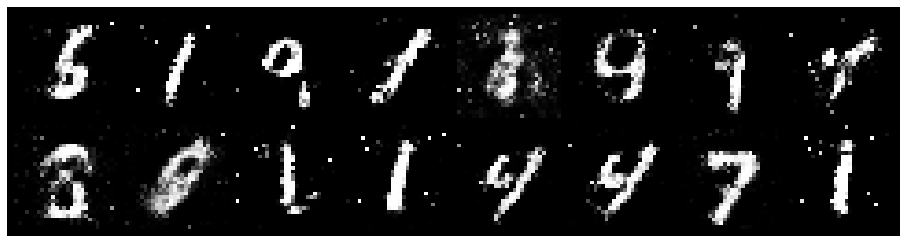

Epoch: [17/20], Batch Num: [500/600]
Discriminator Loss: 0.8231, Generator Loss: 1.7366
D(x): 0.7043, D(G(z)): 0.2646
Epoch: [17/20], Batch Num: [501/600]
Discriminator Loss: 0.8061, Generator Loss: 1.7525
D(x): 0.7453, D(G(z)): 0.2798
Epoch: [17/20], Batch Num: [502/600]
Discriminator Loss: 1.1181, Generator Loss: 1.6979
D(x): 0.6273, D(G(z)): 0.3034
Epoch: [17/20], Batch Num: [503/600]
Discriminator Loss: 0.8220, Generator Loss: 1.6859
D(x): 0.7393, D(G(z)): 0.2966
Epoch: [17/20], Batch Num: [504/600]
Discriminator Loss: 0.8523, Generator Loss: 1.6124
D(x): 0.6666, D(G(z)): 0.2355
Epoch: [17/20], Batch Num: [505/600]
Discriminator Loss: 0.8565, Generator Loss: 1.6064
D(x): 0.7460, D(G(z)): 0.3064
Epoch: [17/20], Batch Num: [506/600]
Discriminator Loss: 0.6959, Generator Loss: 1.6429
D(x): 0.7427, D(G(z)): 0.2414
Epoch: [17/20], Batch Num: [507/600]
Discriminator Loss: 0.8637, Generator Loss: 1.5436
D(x): 0.7185, D(G(z)): 0.3106
Epoch: [17/20], Batch Num: [508/600]
Discriminator Loss:

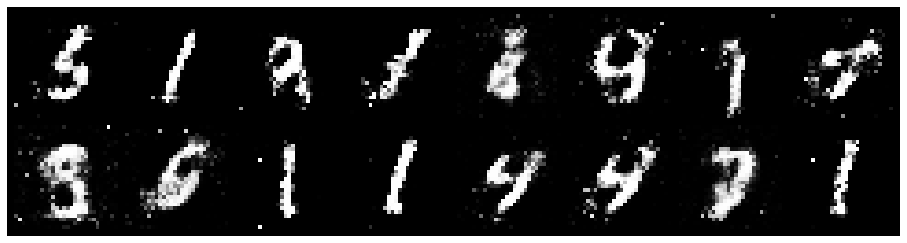

Epoch: [18/20], Batch Num: [0/600]
Discriminator Loss: 0.8393, Generator Loss: 1.7921
D(x): 0.6920, D(G(z)): 0.2399
Epoch: [18/20], Batch Num: [1/600]
Discriminator Loss: 0.7689, Generator Loss: 1.7211
D(x): 0.7053, D(G(z)): 0.2160
Epoch: [18/20], Batch Num: [2/600]
Discriminator Loss: 0.8712, Generator Loss: 1.3693
D(x): 0.6765, D(G(z)): 0.2455
Epoch: [18/20], Batch Num: [3/600]
Discriminator Loss: 0.9612, Generator Loss: 1.4841
D(x): 0.7074, D(G(z)): 0.3213
Epoch: [18/20], Batch Num: [4/600]
Discriminator Loss: 0.9947, Generator Loss: 1.3596
D(x): 0.7309, D(G(z)): 0.3286
Epoch: [18/20], Batch Num: [5/600]
Discriminator Loss: 0.8441, Generator Loss: 1.4950
D(x): 0.7546, D(G(z)): 0.3128
Epoch: [18/20], Batch Num: [6/600]
Discriminator Loss: 1.0423, Generator Loss: 1.5350
D(x): 0.7344, D(G(z)): 0.3736
Epoch: [18/20], Batch Num: [7/600]
Discriminator Loss: 0.8513, Generator Loss: 1.6337
D(x): 0.7219, D(G(z)): 0.2733
Epoch: [18/20], Batch Num: [8/600]
Discriminator Loss: 0.8600, Generator

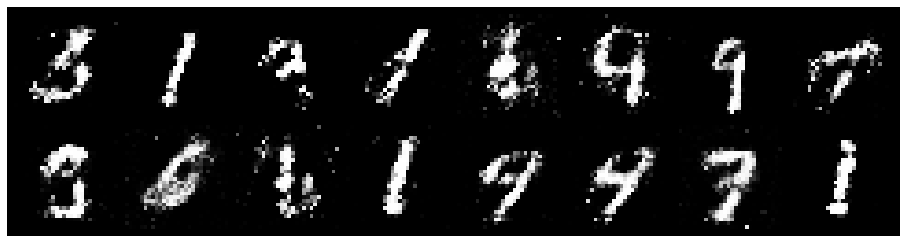

Epoch: [18/20], Batch Num: [100/600]
Discriminator Loss: 0.8567, Generator Loss: 2.0586
D(x): 0.6848, D(G(z)): 0.2550
Epoch: [18/20], Batch Num: [101/600]
Discriminator Loss: 0.9331, Generator Loss: 2.0193
D(x): 0.6558, D(G(z)): 0.2818
Epoch: [18/20], Batch Num: [102/600]
Discriminator Loss: 1.1064, Generator Loss: 1.9576
D(x): 0.6043, D(G(z)): 0.2644
Epoch: [18/20], Batch Num: [103/600]
Discriminator Loss: 0.9017, Generator Loss: 1.7441
D(x): 0.6494, D(G(z)): 0.2604
Epoch: [18/20], Batch Num: [104/600]
Discriminator Loss: 0.9104, Generator Loss: 1.5347
D(x): 0.7269, D(G(z)): 0.3143
Epoch: [18/20], Batch Num: [105/600]
Discriminator Loss: 0.9696, Generator Loss: 1.3943
D(x): 0.7291, D(G(z)): 0.3656
Epoch: [18/20], Batch Num: [106/600]
Discriminator Loss: 0.8162, Generator Loss: 1.3182
D(x): 0.7675, D(G(z)): 0.3240
Epoch: [18/20], Batch Num: [107/600]
Discriminator Loss: 0.9759, Generator Loss: 1.5554
D(x): 0.6579, D(G(z)): 0.3126
Epoch: [18/20], Batch Num: [108/600]
Discriminator Loss:

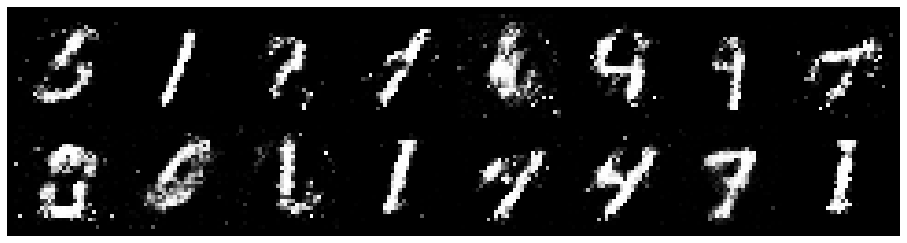

Epoch: [18/20], Batch Num: [200/600]
Discriminator Loss: 0.8281, Generator Loss: 1.6863
D(x): 0.7451, D(G(z)): 0.3089
Epoch: [18/20], Batch Num: [201/600]
Discriminator Loss: 0.9003, Generator Loss: 1.6920
D(x): 0.6982, D(G(z)): 0.2810
Epoch: [18/20], Batch Num: [202/600]
Discriminator Loss: 0.8863, Generator Loss: 1.7686
D(x): 0.6984, D(G(z)): 0.2807
Epoch: [18/20], Batch Num: [203/600]
Discriminator Loss: 1.0084, Generator Loss: 1.5805
D(x): 0.6550, D(G(z)): 0.2974
Epoch: [18/20], Batch Num: [204/600]
Discriminator Loss: 0.9374, Generator Loss: 1.4976
D(x): 0.6536, D(G(z)): 0.2803
Epoch: [18/20], Batch Num: [205/600]
Discriminator Loss: 1.0025, Generator Loss: 1.3092
D(x): 0.6967, D(G(z)): 0.3324
Epoch: [18/20], Batch Num: [206/600]
Discriminator Loss: 1.0025, Generator Loss: 1.3333
D(x): 0.7296, D(G(z)): 0.3771
Epoch: [18/20], Batch Num: [207/600]
Discriminator Loss: 1.0839, Generator Loss: 1.4497
D(x): 0.7397, D(G(z)): 0.4251
Epoch: [18/20], Batch Num: [208/600]
Discriminator Loss:

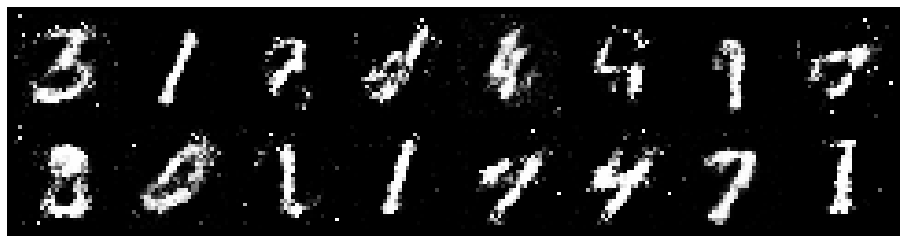

Epoch: [18/20], Batch Num: [300/600]
Discriminator Loss: 0.9643, Generator Loss: 1.3914
D(x): 0.7102, D(G(z)): 0.3508
Epoch: [18/20], Batch Num: [301/600]
Discriminator Loss: 1.0123, Generator Loss: 1.4129
D(x): 0.7268, D(G(z)): 0.3594
Epoch: [18/20], Batch Num: [302/600]
Discriminator Loss: 0.9633, Generator Loss: 1.5067
D(x): 0.6555, D(G(z)): 0.2886
Epoch: [18/20], Batch Num: [303/600]
Discriminator Loss: 1.0647, Generator Loss: 1.5148
D(x): 0.6671, D(G(z)): 0.3409
Epoch: [18/20], Batch Num: [304/600]
Discriminator Loss: 0.9845, Generator Loss: 1.4344
D(x): 0.6397, D(G(z)): 0.2767
Epoch: [18/20], Batch Num: [305/600]
Discriminator Loss: 0.9921, Generator Loss: 1.4807
D(x): 0.7226, D(G(z)): 0.3488
Epoch: [18/20], Batch Num: [306/600]
Discriminator Loss: 0.9969, Generator Loss: 1.3175
D(x): 0.6694, D(G(z)): 0.3286
Epoch: [18/20], Batch Num: [307/600]
Discriminator Loss: 1.0173, Generator Loss: 1.3486
D(x): 0.6868, D(G(z)): 0.3499
Epoch: [18/20], Batch Num: [308/600]
Discriminator Loss:

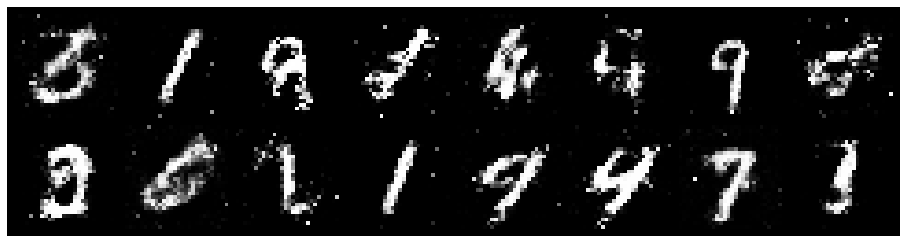

Epoch: [18/20], Batch Num: [400/600]
Discriminator Loss: 1.0089, Generator Loss: 1.6094
D(x): 0.6367, D(G(z)): 0.2685
Epoch: [18/20], Batch Num: [401/600]
Discriminator Loss: 1.0399, Generator Loss: 1.3522
D(x): 0.6197, D(G(z)): 0.2716
Epoch: [18/20], Batch Num: [402/600]
Discriminator Loss: 1.0044, Generator Loss: 1.2227
D(x): 0.6800, D(G(z)): 0.3311
Epoch: [18/20], Batch Num: [403/600]
Discriminator Loss: 0.9252, Generator Loss: 1.1864
D(x): 0.7477, D(G(z)): 0.3600
Epoch: [18/20], Batch Num: [404/600]
Discriminator Loss: 0.8946, Generator Loss: 1.2055
D(x): 0.7476, D(G(z)): 0.3289
Epoch: [18/20], Batch Num: [405/600]
Discriminator Loss: 0.9772, Generator Loss: 1.2351
D(x): 0.7303, D(G(z)): 0.3518
Epoch: [18/20], Batch Num: [406/600]
Discriminator Loss: 0.8106, Generator Loss: 1.3557
D(x): 0.7251, D(G(z)): 0.2947
Epoch: [18/20], Batch Num: [407/600]
Discriminator Loss: 0.8235, Generator Loss: 1.4035
D(x): 0.7250, D(G(z)): 0.2886
Epoch: [18/20], Batch Num: [408/600]
Discriminator Loss:

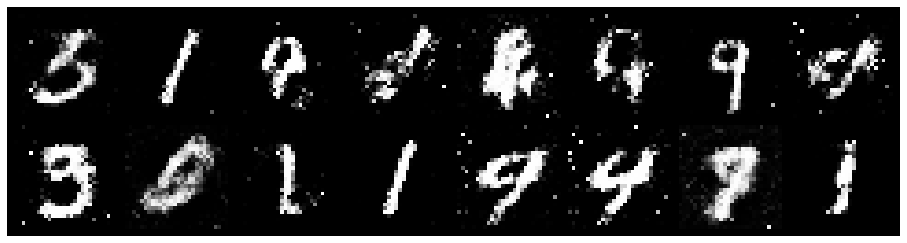

Epoch: [18/20], Batch Num: [500/600]
Discriminator Loss: 0.8109, Generator Loss: 2.0280
D(x): 0.7643, D(G(z)): 0.2965
Epoch: [18/20], Batch Num: [501/600]
Discriminator Loss: 0.8353, Generator Loss: 1.9085
D(x): 0.6909, D(G(z)): 0.2411
Epoch: [18/20], Batch Num: [502/600]
Discriminator Loss: 0.9029, Generator Loss: 1.9607
D(x): 0.6765, D(G(z)): 0.2379
Epoch: [18/20], Batch Num: [503/600]
Discriminator Loss: 0.8398, Generator Loss: 1.8110
D(x): 0.7291, D(G(z)): 0.2626
Epoch: [18/20], Batch Num: [504/600]
Discriminator Loss: 0.9049, Generator Loss: 1.7112
D(x): 0.7026, D(G(z)): 0.2503
Epoch: [18/20], Batch Num: [505/600]
Discriminator Loss: 0.9285, Generator Loss: 1.6919
D(x): 0.6744, D(G(z)): 0.2285
Epoch: [18/20], Batch Num: [506/600]
Discriminator Loss: 0.9837, Generator Loss: 1.5293
D(x): 0.6880, D(G(z)): 0.3033
Epoch: [18/20], Batch Num: [507/600]
Discriminator Loss: 0.8717, Generator Loss: 1.3878
D(x): 0.7110, D(G(z)): 0.2808
Epoch: [18/20], Batch Num: [508/600]
Discriminator Loss:

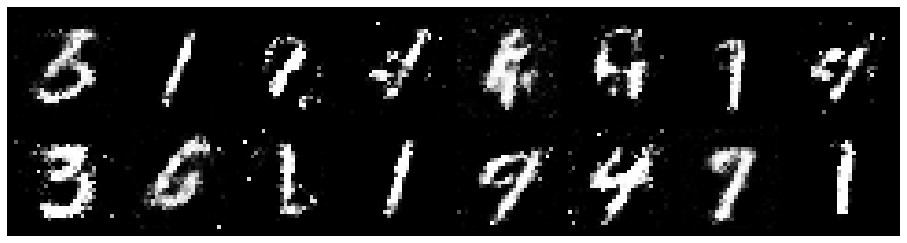

Epoch: [19/20], Batch Num: [0/600]
Discriminator Loss: 0.9647, Generator Loss: 1.1736
D(x): 0.7117, D(G(z)): 0.3385
Epoch: [19/20], Batch Num: [1/600]
Discriminator Loss: 1.1578, Generator Loss: 1.2891
D(x): 0.7645, D(G(z)): 0.4390
Epoch: [19/20], Batch Num: [2/600]
Discriminator Loss: 1.0803, Generator Loss: 1.5122
D(x): 0.7727, D(G(z)): 0.4304
Epoch: [19/20], Batch Num: [3/600]
Discriminator Loss: 1.0946, Generator Loss: 1.9243
D(x): 0.6210, D(G(z)): 0.3105
Epoch: [19/20], Batch Num: [4/600]
Discriminator Loss: 1.0329, Generator Loss: 1.9470
D(x): 0.5850, D(G(z)): 0.2219
Epoch: [19/20], Batch Num: [5/600]
Discriminator Loss: 0.9081, Generator Loss: 1.5375
D(x): 0.6138, D(G(z)): 0.2264
Epoch: [19/20], Batch Num: [6/600]
Discriminator Loss: 0.9388, Generator Loss: 1.1529
D(x): 0.6489, D(G(z)): 0.2549
Epoch: [19/20], Batch Num: [7/600]
Discriminator Loss: 1.0073, Generator Loss: 1.2467
D(x): 0.6936, D(G(z)): 0.3560
Epoch: [19/20], Batch Num: [8/600]
Discriminator Loss: 1.0109, Generator

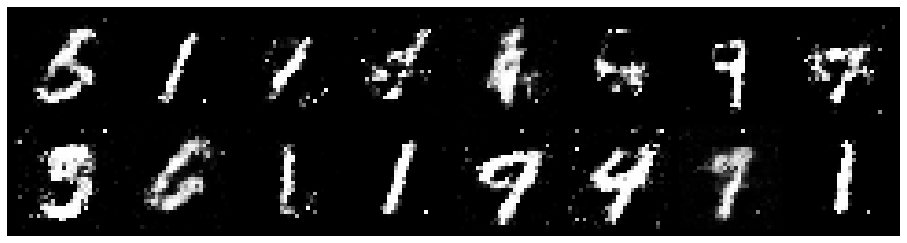

Epoch: [19/20], Batch Num: [100/600]
Discriminator Loss: 0.9800, Generator Loss: 1.3924
D(x): 0.6869, D(G(z)): 0.2948
Epoch: [19/20], Batch Num: [101/600]
Discriminator Loss: 0.8135, Generator Loss: 1.2850
D(x): 0.7564, D(G(z)): 0.3058
Epoch: [19/20], Batch Num: [102/600]
Discriminator Loss: 0.8296, Generator Loss: 1.4918
D(x): 0.7818, D(G(z)): 0.3595
Epoch: [19/20], Batch Num: [103/600]
Discriminator Loss: 0.8700, Generator Loss: 1.3564
D(x): 0.6999, D(G(z)): 0.2968
Epoch: [19/20], Batch Num: [104/600]
Discriminator Loss: 0.8178, Generator Loss: 1.5716
D(x): 0.7494, D(G(z)): 0.3037
Epoch: [19/20], Batch Num: [105/600]
Discriminator Loss: 0.8099, Generator Loss: 1.5713
D(x): 0.7063, D(G(z)): 0.2897
Epoch: [19/20], Batch Num: [106/600]
Discriminator Loss: 1.0170, Generator Loss: 1.5526
D(x): 0.6623, D(G(z)): 0.2899
Epoch: [19/20], Batch Num: [107/600]
Discriminator Loss: 0.9456, Generator Loss: 1.5736
D(x): 0.6943, D(G(z)): 0.2962
Epoch: [19/20], Batch Num: [108/600]
Discriminator Loss:

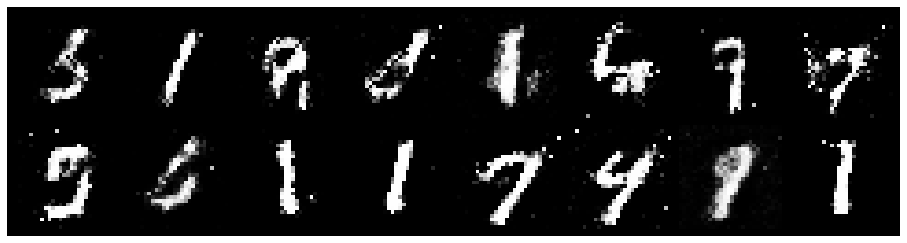

Epoch: [19/20], Batch Num: [200/600]
Discriminator Loss: 0.9058, Generator Loss: 1.4391
D(x): 0.6909, D(G(z)): 0.2592
Epoch: [19/20], Batch Num: [201/600]
Discriminator Loss: 0.7562, Generator Loss: 1.3552
D(x): 0.7720, D(G(z)): 0.2836
Epoch: [19/20], Batch Num: [202/600]
Discriminator Loss: 0.8986, Generator Loss: 1.4110
D(x): 0.7315, D(G(z)): 0.3231
Epoch: [19/20], Batch Num: [203/600]
Discriminator Loss: 0.9569, Generator Loss: 1.5063
D(x): 0.7213, D(G(z)): 0.3262
Epoch: [19/20], Batch Num: [204/600]
Discriminator Loss: 0.8611, Generator Loss: 1.6077
D(x): 0.7576, D(G(z)): 0.3254
Epoch: [19/20], Batch Num: [205/600]
Discriminator Loss: 1.0166, Generator Loss: 1.7772
D(x): 0.6527, D(G(z)): 0.3008
Epoch: [19/20], Batch Num: [206/600]
Discriminator Loss: 1.0794, Generator Loss: 1.5981
D(x): 0.5907, D(G(z)): 0.2518
Epoch: [19/20], Batch Num: [207/600]
Discriminator Loss: 0.8582, Generator Loss: 1.4476
D(x): 0.7119, D(G(z)): 0.2854
Epoch: [19/20], Batch Num: [208/600]
Discriminator Loss:

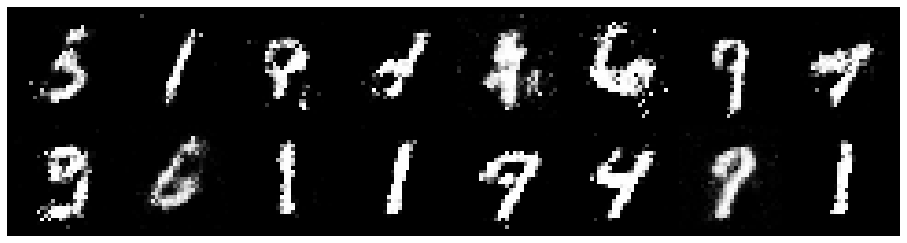

Epoch: [19/20], Batch Num: [300/600]
Discriminator Loss: 0.8833, Generator Loss: 1.2749
D(x): 0.7254, D(G(z)): 0.3354
Epoch: [19/20], Batch Num: [301/600]
Discriminator Loss: 1.0194, Generator Loss: 1.4937
D(x): 0.6987, D(G(z)): 0.3665
Epoch: [19/20], Batch Num: [302/600]
Discriminator Loss: 0.9390, Generator Loss: 1.5337
D(x): 0.6434, D(G(z)): 0.2609
Epoch: [19/20], Batch Num: [303/600]
Discriminator Loss: 0.8608, Generator Loss: 1.5724
D(x): 0.6772, D(G(z)): 0.2524
Epoch: [19/20], Batch Num: [304/600]
Discriminator Loss: 0.8539, Generator Loss: 1.4819
D(x): 0.6990, D(G(z)): 0.2613
Epoch: [19/20], Batch Num: [305/600]
Discriminator Loss: 0.9004, Generator Loss: 1.4921
D(x): 0.6947, D(G(z)): 0.2939
Epoch: [19/20], Batch Num: [306/600]
Discriminator Loss: 0.8893, Generator Loss: 1.4048
D(x): 0.6917, D(G(z)): 0.3054
Epoch: [19/20], Batch Num: [307/600]
Discriminator Loss: 0.9978, Generator Loss: 1.2864
D(x): 0.7124, D(G(z)): 0.3285
Epoch: [19/20], Batch Num: [308/600]
Discriminator Loss:

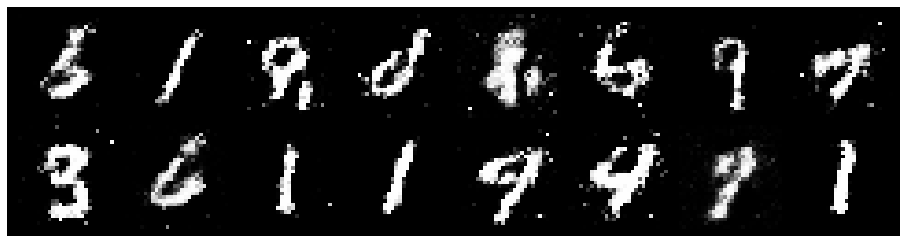

Epoch: [19/20], Batch Num: [400/600]
Discriminator Loss: 0.9445, Generator Loss: 1.4475
D(x): 0.6982, D(G(z)): 0.3188
Epoch: [19/20], Batch Num: [401/600]
Discriminator Loss: 0.9236, Generator Loss: 1.5144
D(x): 0.6871, D(G(z)): 0.2946
Epoch: [19/20], Batch Num: [402/600]
Discriminator Loss: 1.0021, Generator Loss: 1.6166
D(x): 0.6736, D(G(z)): 0.3140
Epoch: [19/20], Batch Num: [403/600]
Discriminator Loss: 0.8174, Generator Loss: 1.5969
D(x): 0.6949, D(G(z)): 0.2440
Epoch: [19/20], Batch Num: [404/600]
Discriminator Loss: 0.9388, Generator Loss: 1.6817
D(x): 0.6594, D(G(z)): 0.2692
Epoch: [19/20], Batch Num: [405/600]
Discriminator Loss: 0.8976, Generator Loss: 1.5372
D(x): 0.6853, D(G(z)): 0.2875
Epoch: [19/20], Batch Num: [406/600]
Discriminator Loss: 0.9453, Generator Loss: 1.5401
D(x): 0.7359, D(G(z)): 0.3454
Epoch: [19/20], Batch Num: [407/600]
Discriminator Loss: 0.9886, Generator Loss: 1.6095
D(x): 0.6902, D(G(z)): 0.3296
Epoch: [19/20], Batch Num: [408/600]
Discriminator Loss:

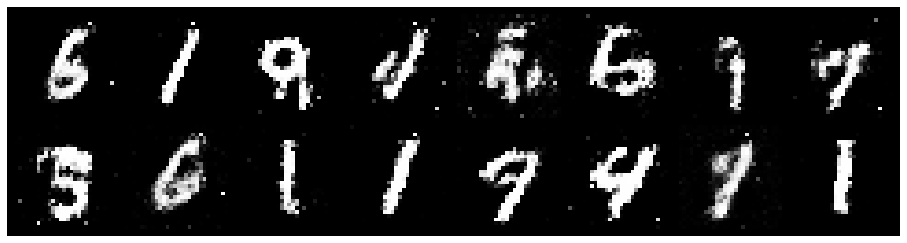

Epoch: [19/20], Batch Num: [500/600]
Discriminator Loss: 0.9347, Generator Loss: 1.5522
D(x): 0.6698, D(G(z)): 0.2857
Epoch: [19/20], Batch Num: [501/600]
Discriminator Loss: 0.9140, Generator Loss: 1.3782
D(x): 0.6783, D(G(z)): 0.2860
Epoch: [19/20], Batch Num: [502/600]
Discriminator Loss: 0.9800, Generator Loss: 1.3941
D(x): 0.6688, D(G(z)): 0.3045
Epoch: [19/20], Batch Num: [503/600]
Discriminator Loss: 1.1533, Generator Loss: 1.2678
D(x): 0.6366, D(G(z)): 0.3525
Epoch: [19/20], Batch Num: [504/600]
Discriminator Loss: 0.8968, Generator Loss: 1.3221
D(x): 0.7052, D(G(z)): 0.3221
Epoch: [19/20], Batch Num: [505/600]
Discriminator Loss: 0.9858, Generator Loss: 1.2397
D(x): 0.7289, D(G(z)): 0.3627
Epoch: [19/20], Batch Num: [506/600]
Discriminator Loss: 0.9394, Generator Loss: 1.4261
D(x): 0.7477, D(G(z)): 0.3578
Epoch: [19/20], Batch Num: [507/600]
Discriminator Loss: 0.9437, Generator Loss: 1.4752
D(x): 0.6628, D(G(z)): 0.2915
Epoch: [19/20], Batch Num: [508/600]
Discriminator Loss:

In [23]:
num_epochs=20
for epoch in range(num_epochs):
  
    for n_batch, (real_batch,_) in enumerate(data_loader):
        n = real_batch.size(0)
        #Transformez le lot de données en variables Torch à l'aide des fonctions Variable et gt.images_to_vectors. 
        #Ce sont les vraies données pour l'étape suivante.
        # 1 Train Discriminator
        # 1.1 Prepare real data
        real_data = Variable(gt.images_to_vectors(real_batch))
       
        
            
        # 1.2 Generate fake data with the Generator
        #""" A COMPLETER : Créer des vecteurs bruit """
        #(les gradients ne sont donc pas calculés pour le générateur)
        fake_data = generator(gt.noise(n)).detach()
        #""" A COMPLETER : Générer des images avec le générateur """
        
        # 1.3 Train Discriminator 
       # """ A COMPLETER : Entrainer le discriminateur """
        d_error, d_pred_real, d_pred_fake = train_discriminator(d_optimizer, real_data, fake_data)

 
        # 2 Train Generator
        # 2.1 Generate noise
        fake_data = generator(gt.noise(n))
                      
        # 2.2 Train Generator
        #"""  A COMPLETER : Entrainer le generateur """
        g_error = train_generator(g_optimizer, fake_data)
                              
        # Generate images from a fixed noise input and visualize the output
        gt.plot_gan(epoch, n_batch, num_batches, generator)

        # Display status Logs
        gt.logger.display_status(
                epoch, num_epochs, n_batch, num_batches,
                d_error, g_error, d_pred_real, d_pred_fake
            )

  

L'entraînement des modèles GAN demande beaucoup de patience en raison de sa profondeur. Nous avons décidé de resumer ce que l'on a appris à travers la modification des paramètres sous forme de conseils:

- **Problème** : Les images générées ressemblent à du bruit. 
- **Solution**: Utiliser le dropout sur le discriminateur et le générateur. De faibles valeurs de dropout (0,3 à 0,6) génèrent des images plus réalistes.

 

- **Problème** : La perte du Discriminator converge rapidement vers zéro, empêchant ainsi le Generator d'apprendre. 
- **Solution** : Ne pas pré-entraîner le discriminateur. Au lieu de cela, rendre son taux d'apprentissage plus grand que le taux d'apprentissage du modèle Adversarial. Utiliser un échantillon de bruit d'entraînement différent pour le générateur.


- **Problème** : Les images du générateur ressemblent toujours à du bruit. 
- **Solution**: Vérifier si l'activation, la normalisation du lot et le dropout sont appliqués dans la bonne séquence.


- **Problème** : Déterminer les paramètres d'entraînement/modèle corrects. 
- **Solution**: Commencer avec des valeurs de travail connues provenant d'articles de recherche et de codes publiés et ajustez un paramètre à la fois. Avant de s'entraîner sur 200 epoch ou plus, observez l'effet de l'ajustement des valeurs des paramètres à environ 50 ou 100 époch.
